In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt
import math
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
import warnings

pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_columns', None)

warnings.filterwarnings("ignore", category=DeprecationWarning)

# Preprocessing Assembled Dataset

In [9]:
df = pd.read_csv("/content/drive/MyDrive/AI_Dataset/MergedFiltered.csv")

In [10]:
# Convert event_time to datetime
df["event_time"] = pd.to_datetime(df["event_time"])

# Format to YYYY-MM-DD
df["event_time"] = df["event_time"].dt.strftime("%Y-%m-%d")

In [11]:
df = df.dropna(subset=["category_code"])

In [12]:
df["subcategory"] = df["category_code"].str.rsplit(".", n=1).str[1]
df["category"] = df["category_code"].str.split(".", n=1).str[0]

In [13]:
df.head(10)

,event_time,event_type,product_id,category_id,category_code,brand,price,user_id,user_session,subcategory,category
0,2019-10-01,purchase,1004856,2053013555631882655,electronics.smartphone,samsung,130.76,543272936,8187d148-3c41-46d4-b0c0-9c08cd9dc564,smartphone,electronics
1,2019-10-01,purchase,1002532,2053013555631882655,electronics.smartphone,apple,642.69,551377651,3c80f0d6-e9ec-4181-8c5c-837a30be2d68,smartphone,electronics
3,2019-10-01,purchase,13800054,2053013557418656265,furniture.bathroom.toilet,santeri,54.42,555332717,1dea3ee2-2ded-42e8-8e7a-4e2ad6ae942f,toilet,furniture
4,2019-10-01,purchase,4804055,2053013554658804075,electronics.audio.headphone,apple,189.91,524601178,2af9b570-0942-4dcd-8f25-4d84fba82553,headphone,electronics
5,2019-10-01,purchase,4804056,2053013554658804075,electronics.audio.headphone,apple,161.98,551377651,3c80f0d6-e9ec-4181-8c5c-837a30be2d68,headphone,electronics
6,2019-10-01,purchase,1002524,2053013555631882655,electronics.smartphone,apple,515.67,524325294,0b74a829-f9d7-4654-b5b0-35bc9822c238,smartphone,electronics
7,2019-10-01,purchase,6200687,2053013552293216471,appliances.environment.air_heater,oasis,28.03,548691404,b67cdbcb-b073-4271-b365-803c6fce53b0,air_heater,appliances
8,2019-10-01,purchase,4802036,2053013554658804075,electronics.audio.headphone,apple,171.56,533624186,e5ac3caa-e6d5-4d6b-ae06-2c18cd9ca683,headphone,electronics
9,2019-10-01,purchase,1004932,2053013555631882655,electronics.smartphone,vivo,463.31,555083442,83d12d1a-5452-4fa0-abbb-d9f492f8b562,smartphone,electronics
10,2019-10-01,purchase,1004246,2053013555631882655,electronics.smartphone,apple,736.18,515246296,b7dbae4f-cad3-463e-89ce-41990cf48dea,smartphone,electronics


In [7]:
df['subcategory'].nunique()

137

## Feature Engineering RFM-T

In [14]:
import sqlite3

df["event_time"] = pd.to_datetime(df["event_time"])

conn = sqlite3.connect(":memory:")
df.to_sql("events", conn, index=False, if_exists="replace")

6080764

In [15]:
#------------------------
# SQLite Version
# a. Aggregate by user, the most recent purchase, the most frequent, total purchased
# b. Recency = current date - recent date of purchase
# c. Frequency = Number of purchases / total number of months (7)
# d. Time = Average time between each purchase
# 1. Select features
# 2. Calculate recency
# 3. Calculate the most time between purchases
# 4. Find the average from step 3
# 5. Assemble metrics

#------------------------

query = """
WITH base AS (
    SELECT
        user_id,
        MAX(event_time) AS latest_date,
        COUNT(DISTINCT user_session) / 7.0 AS frequency,
        SUM(price) AS monetary_value
    FROM events
    GROUP BY user_id
),

recency_calc AS (
    SELECT
        user_id,
        julianday('2020-05-01') - julianday(latest_date) AS recency
    FROM base
),

ordered_events AS (
    SELECT
        user_id,
        event_time,
        julianday(event_time) -
        julianday(LAG(event_time) OVER (PARTITION BY user_id ORDER BY event_time))
        AS time_diff
    FROM events
),

avg_time AS (
    SELECT
        user_id,
        AVG(COALESCE(time_diff, 0)) AS time
    FROM ordered_events
    GROUP BY user_id
)

SELECT
    b.user_id,
    r.recency,
    b.frequency,
    b.monetary_value,
    a.time
FROM base b
JOIN recency_calc r ON b.user_id = r.user_id
LEFT JOIN avg_time a ON b.user_id = a.user_id
"""


In [16]:
new_df = pd.read_sql(query, conn)
new_df.head(2)

,user_id,recency,frequency,monetary_value,time
0,96369466,12.0,0.142857,50.71,0.0
1,101875240,106.0,0.142857,184.52,0.0


In [ ]:
new_df.to_csv("Capstone2_modified.csv", index=False)

# Exploratory Data Analysis and Preprocessing

In [17]:
numeric=["recency", "frequency", "monetary_value", "time"]

In [18]:
new_df = pd.read_csv("/content/drive/MyDrive/AI_Dataset/Capstone2_modified.csv")

new_df.head(2)

,user_id,latest_date,recency,frequency,monetary_value,time
0,96369466,2020-04-19,12,0.142857,50.71,0.0
1,101875240,2020-01-16,106,0.142857,184.52,0.0


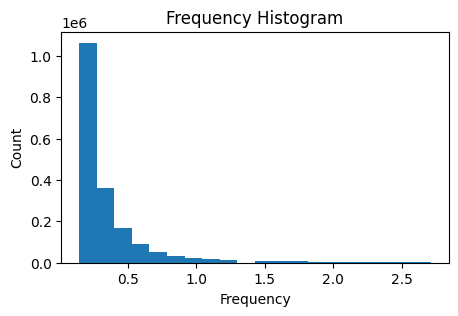

In [19]:
upper = new_df['frequency'].quantile(0.99)

plt.figure(figsize=(5, 3))
plt.hist(new_df.loc[new_df['frequency'] <= upper, 'frequency'], bins=20)
plt.xlabel('Frequency')
plt.ylabel('Count')
plt.title('Frequency Histogram')
plt.show()

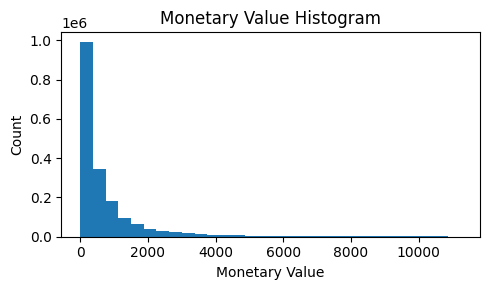

In [20]:
upper = new_df['monetary_value'].quantile(0.99)

plt.figure(figsize=(5, 3))
plt.hist(
    new_df.loc[new_df['monetary_value'] <= upper, 'monetary_value'],
    bins=30
)
plt.xlabel('Monetary Value')
plt.ylabel('Count')
plt.title('Monetary Value Histogram')
plt.tight_layout()
plt.show()

In [21]:
new_df['time'].value_counts().sort_values(ascending=False).head(20)

,count
time,
0.000000,1160066
0.500000,32768
1.000000,22922
2.000000,15060
0.333333,13464
1.500000,12165
3.000000,11778
4.000000,9403
2.500000,8642


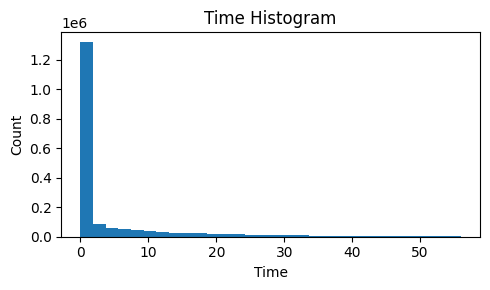

In [22]:
upper = new_df['time'].quantile(0.99)

plt.figure(figsize=(5, 3))
plt.hist(
    new_df.loc[new_df['time'] <= upper, 'time'],
    bins=30
)
plt.xlabel('Time')
plt.ylabel('Count')
plt.title('Time Histogram')
plt.tight_layout()
plt.show()


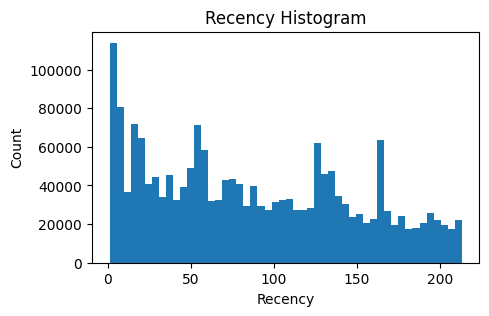

In [23]:
new_df['recency'].value_counts().sort_values(ascending=False).head(20)
plt.figure(figsize=(5, 3))
plt.hist(new_df['recency'], bins=50)
plt.xlabel('Recency')
plt.ylabel('Count')
plt.title('Recency Histogram')
plt.show()

In [24]:
new_df.shape

(1888883, 6)

### One hot encode

In [ ]:
ohe = OneHotEncoder(sparse_output=False)


one_hot_encoded = ohe.fit_transform(df[["category"]])

# Create one-hot encoded category dataframe
one_hot_df = pd.DataFrame(one_hot_encoded,
                          columns=ohe.get_feature_names_out(["category"]),
                          index=df.index)

encoded_subset = pd.concat([df["user_id"], one_hot_df], axis=1)

# Aggregate categories purchased from user
encoded_subset = encoded_subset.groupby("user_id", as_index=False).max()

# Merge back into modified dataframe
new_df = new_df.merge(encoded_subset, on="user_id", how="left")

# Check result
new_df.head(2)

,user_id,latest_date,recency,frequency,monetary_value,time,category_accessories,category_apparel,category_appliances,category_auto,category_computers,category_construction,category_country_yard,category_electronics,category_furniture,category_kids,category_medicine,category_sport,category_stationery
0,96369466,2020-04-19,12,0.142857,50.71,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,101875240,2020-01-16,106,0.142857,184.52,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
df["subcategory"] = df["subcategory"].astype("category")

cats = df["subcategory"].cat.categories

# Build sparse OHE using pivot_table
sub_cat = (
    df.assign(val=1)
      .pivot_table(index="user_id",
                   columns="subcategory",
                   values="val",
                   aggfunc="max",
                   fill_value=0)
      .reset_index()
)

sub_cat[cats] = sub_cat[cats].astype("uint8")

# Merge back into modified dataframe
new_df = new_df.merge(sub_cat, on="user_id", how="left")


/tmp/ipython-input-1758984410.py:10: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  .pivot_table(index="user_id",


In [ ]:
new_df.head(2)

,user_id,latest_date,recency,frequency,monetary_value,time,category_accessories,category_apparel,category_appliances,category_auto,category_computers,category_construction,category_country_yard,category_electronics,category_furniture,category_kids,category_medicine,category_sport,category_stationery,acoustic,air_conditioner,air_heater,alarm,anti_freeze,axe,bag,ballet_shoes,bath,bed,belt,bench,bicycle,blanket,blender,cabinet,camera,carriage,cartrige,cdrw,chair,climate,clocks,coffee_grinder,coffee_machine,compressor,cooler,costume,cpu,cultivator,desktop,diapers,dictaphone,dishwasher,diving,dolls,dress,drill,ebooks,espadrilles,fan,faucet,fryer,generator,glove,grill,hair_cutter,hammok,hdd,headphone,hob,hood,iron,ironing_board,jacket,jeans,juicer,jumper,keds,kettle,keyboard,lawn_mower,light,massager,meat_grinder,memory,microphone,microwave,mixer,moccasins,monitor,motherboard,mouse,notebook,oven,painting,pajamas,paper,parktronic,photo,piano,pillow,player,power_supply,printer,projector,pump,radar,refrigerators,sandals,saw,scales,scarf,screw,sewing_machine,shelving,shirt,shoes,shorts,skates,ski,skirt,slipons,smartphone,snowboard,sock,sofa,soldering,sound_card,steam_cooker,step_ins,subwoofer,swing,table,tablet,telephone,tennis,toilet,tonometer,toster,toys,trainer,trousers,tshirt,tv,umbrella,underwear,vacuum,video,videocards,videoregister,wallet,washer,water_heater,watering,welding,winch
0,96369466,2020-04-19,12,0.142857,50.71,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,101875240,2020-01-16,106,0.142857,184.52,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


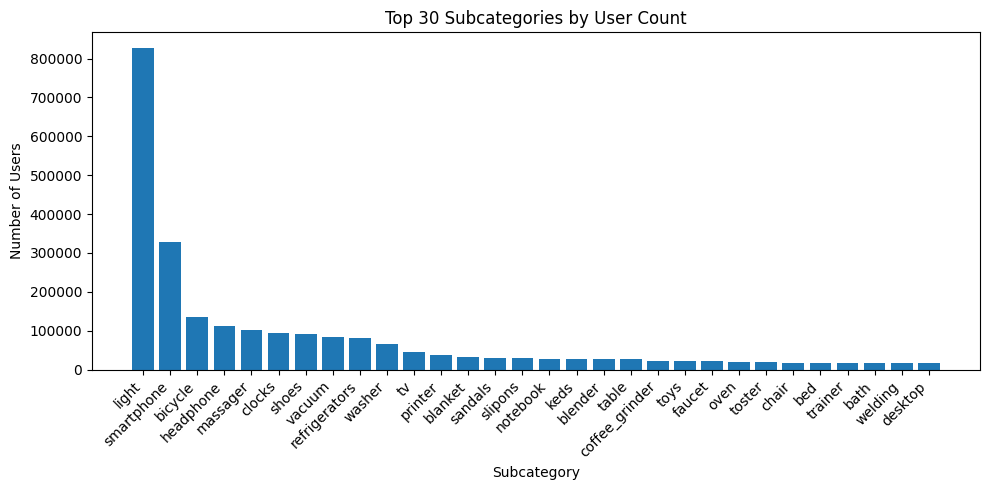

In [ ]:
# find top k frequent subcategories
top_k = 30
subcat_cols = cats # df["subcategory"].cat.categories
subcat_counts = new_df[subcat_cols].sum().sort_values(ascending=False) # sort
top_subcats = subcat_counts.head(top_k)

plt.figure(figsize=(10, 5))
plt.bar(top_subcats.index, top_subcats.values)
plt.xticks(rotation=45, ha="right")
plt.xlabel("Subcategory")
plt.ylabel("Number of Users")
plt.title(f"Top {top_k} Subcategories by User Count")
plt.tight_layout()
plt.show()


### Partition

In [ ]:
# partition on 85% and 15% split
portion = 0.15

holdout = new_df.groupby('frequency', group_keys=False).apply(lambda x : x.sample(frac=portion, random_state=1))
train = new_df.drop(holdout.index)

### Transform

In [ ]:
new_df2 = new_df.copy()
holdout2 = holdout.copy()
train2 = train.copy()

new_df3 = new_df.copy()
holdout3 = holdout.copy()
train3 = train.copy()

In [ ]:
# Standardize

scaler = StandardScaler()

new_df[numeric] = scaler.fit_transform(new_df[numeric])

holdout[numeric] = scaler.transform(holdout[numeric])
train[numeric] = scaler.transform(train[numeric])

new_df.head(2)

,user_id,latest_date,recency,frequency,monetary_value,time,category_accessories,category_apparel,category_appliances,category_auto,category_computers,category_construction,category_country_yard,category_electronics,category_furniture,category_kids,category_medicine,category_sport,category_stationery,acoustic,air_conditioner,air_heater,alarm,anti_freeze,axe,bag,ballet_shoes,bath,bed,belt,bench,bicycle,blanket,blender,cabinet,camera,carriage,cartrige,cdrw,chair,climate,clocks,coffee_grinder,coffee_machine,compressor,cooler,costume,cpu,cultivator,desktop,diapers,dictaphone,dishwasher,diving,dolls,dress,drill,ebooks,espadrilles,fan,faucet,fryer,generator,glove,grill,hair_cutter,hammok,hdd,headphone,hob,hood,iron,ironing_board,jacket,jeans,juicer,jumper,keds,kettle,keyboard,lawn_mower,light,massager,meat_grinder,memory,microphone,microwave,mixer,moccasins,monitor,motherboard,mouse,notebook,oven,painting,pajamas,paper,parktronic,photo,piano,pillow,player,power_supply,printer,projector,pump,radar,refrigerators,sandals,saw,scales,scarf,screw,sewing_machine,shelving,shirt,shoes,shorts,skates,ski,skirt,slipons,smartphone,snowboard,sock,sofa,soldering,sound_card,steam_cooker,step_ins,subwoofer,swing,table,tablet,telephone,tennis,toilet,tonometer,toster,toys,trainer,trousers,tshirt,tv,umbrella,underwear,vacuum,video,videocards,videoregister,wallet,washer,water_heater,watering,welding,winch
0,96369466,2020-04-19,-1.239664,-0.3048,-0.260845,-0.442916,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,101875240,2020-01-16,0.309546,-0.3048,-0.225434,-0.442916,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
# Robust Scalar

scaler = RobustScaler()

new_df2[numeric] = scaler.fit_transform(new_df2[numeric])

holdout2[numeric] = scaler.transform(holdout2[numeric])
train2[numeric] = scaler.transform(train2[numeric])

new_df2.head(2)

,user_id,latest_date,recency,frequency,monetary_value,time,category_accessories,category_apparel,category_appliances,category_auto,category_computers,category_construction,category_country_yard,category_electronics,category_furniture,category_kids,category_medicine,category_sport,category_stationery,acoustic,air_conditioner,air_heater,alarm,anti_freeze,axe,bag,ballet_shoes,bath,bed,belt,bench,bicycle,blanket,blender,cabinet,camera,carriage,cartrige,cdrw,chair,climate,clocks,coffee_grinder,coffee_machine,compressor,cooler,costume,cpu,cultivator,desktop,diapers,dictaphone,dishwasher,diving,dolls,dress,drill,ebooks,espadrilles,fan,faucet,fryer,generator,glove,grill,hair_cutter,hammok,hdd,headphone,hob,hood,iron,ironing_board,jacket,jeans,juicer,jumper,keds,kettle,keyboard,lawn_mower,light,massager,meat_grinder,memory,microphone,microwave,mixer,moccasins,monitor,motherboard,mouse,notebook,oven,painting,pajamas,paper,parktronic,photo,piano,pillow,player,power_supply,printer,projector,pump,radar,refrigerators,sandals,saw,scales,scarf,screw,sewing_machine,shelving,shirt,shoes,shorts,skates,ski,skirt,slipons,smartphone,snowboard,sock,sofa,soldering,sound_card,steam_cooker,step_ins,subwoofer,swing,table,tablet,telephone,tennis,toilet,tonometer,toster,toys,trainer,trousers,tshirt,tv,umbrella,underwear,vacuum,video,videocards,videoregister,wallet,washer,water_heater,watering,welding,winch
0,96369466,2020-04-19,-0.647059,0.0,-0.395823,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,101875240,2020-01-16,0.274510,0.0,-0.214690,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
# Centering
scaler = StandardScaler(with_std=False)

new_df3[numeric] = scaler.fit_transform(new_df3[numeric])

holdout3[numeric] = scaler.transform(holdout3[numeric])
train3[numeric] = scaler.transform(train3[numeric])

new_df3.head(2)

,user_id,latest_date,recency,frequency,monetary_value,time,category_accessories,category_apparel,category_appliances,category_auto,category_computers,category_construction,category_country_yard,category_electronics,category_furniture,category_kids,category_medicine,category_sport,category_stationery,acoustic,air_conditioner,air_heater,alarm,anti_freeze,axe,bag,ballet_shoes,bath,bed,belt,bench,bicycle,blanket,blender,cabinet,camera,carriage,cartrige,cdrw,chair,climate,clocks,coffee_grinder,coffee_machine,compressor,cooler,costume,cpu,cultivator,desktop,diapers,dictaphone,dishwasher,diving,dolls,dress,drill,ebooks,espadrilles,fan,faucet,fryer,generator,glove,grill,hair_cutter,hammok,hdd,headphone,hob,hood,iron,ironing_board,jacket,jeans,juicer,jumper,keds,kettle,keyboard,lawn_mower,light,massager,meat_grinder,memory,microphone,microwave,mixer,moccasins,monitor,motherboard,mouse,notebook,oven,painting,pajamas,paper,parktronic,photo,piano,pillow,player,power_supply,printer,projector,pump,radar,refrigerators,sandals,saw,scales,scarf,screw,sewing_machine,shelving,shirt,shoes,shorts,skates,ski,skirt,slipons,smartphone,snowboard,sock,sofa,soldering,sound_card,steam_cooker,step_ins,subwoofer,swing,table,tablet,telephone,tennis,toilet,tonometer,toster,toys,trainer,trousers,tshirt,tv,umbrella,underwear,vacuum,video,videocards,videoregister,wallet,washer,water_heater,watering,welding,winch
0,96369466,2020-04-19,-75.21796,-0.221927,-985.672006,-5.072486,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,101875240,2020-01-16,18.78204,-0.221927,-851.862006,-5.072486,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


# Model Building

In [ ]:
from sklearn.metrics import calinski_harabasz_score, davies_bouldin_score
import cupy as cp

import cuml
import cudf

from cuml.cluster import KMeans
from cuml.cluster import AgglomerativeClustering
from cuml.cluster import HDBSCAN


from cuml.metrics.cluster import silhouette_score
from cuml.manifold import UMAP

In [ ]:
# Keep IDs
ids = train['user_id']

# Use only the features for clustering
features = train.drop(columns=['user_id', 'latest_date'])
features2 = train2.drop(columns=['user_id', 'latest_date'])
features3 = train3.drop(columns=['user_id', 'latest_date'])

categorical = [col for col in features.columns if col not in numeric]


## K-Means

In [ ]:
Y = features[numeric] # standardize

inertias = []
sil_scores = []
K = range(40,75)
ch_scores = []
db_scores = []

sample = Y

# Split into disjoint partitions for silhouette score
n_partitions = 9
partitions = np.array_split(Y, n_partitions)

for k in K:
    kmean_ = KMeans(n_clusters=k, max_iter=200, random_state=1)
    kmean_.fit(Y)

    inertias.append(kmean_.inertia_)

    labels_sample = kmean_.predict(sample)
    # --- Calinski-Harabasz ---
    ch = calinski_harabasz_score(sample, labels_sample)
    ch_scores.append(ch)

    # --- Davies-Bouldin ---
    db = davies_bouldin_score(sample, labels_sample)
    db_scores.append(db)

    if k != 1:
        scores = []
        for part in partitions:
            labels = kmean_.predict(part)
            score = silhouette_score(part, labels)
            scores.append(score)
        mean_score = np.mean(scores)
        sil_scores.append(mean_score)

    print(f"{k} cluster(s) completed")

plt.figure(figsize=(16, 5))
plt.plot(K, inertias, 'bx-')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Curve')
plt.show()

plt.figure(figsize=(16, 5))
x = range(40,75)
plt.bar(x, sil_scores)
for i, score in enumerate(sil_scores):
    plt.text(x[i], score + 0.01, f"{score:.2f}", ha='center', va='bottom')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score of each Cluster (Standardization)')
plt.show()


# Calinski–Harabasz
plt.figure(figsize=(16, 5))
plt.plot(K, ch_scores, marker='o')
plt.xlabel('Clusters (k)')
plt.ylabel('CH Index')
plt.title('Calinski–Harabasz Index')
plt.grid()
plt.show()

# Davies–Bouldin
plt.figure(figsize=(16, 5))
plt.plot(K, db_scores, marker='o')
plt.xlabel('Clusters (k)')
plt.ylabel('DB Index')
plt.title('Davies–Bouldin Index')
plt.grid()
plt.show()

In [ ]:
Y = features2[numeric] # robust

inertias = []
sil_scores = []
K = range(40,75)
ch_scores = []
db_scores = []

sample = Y

# Split into disjoint partitions for silhouette score
n_partitions = 9
partitions = np.array_split(Y, n_partitions)

for k in K:
    kmean_ = KMeans(n_clusters=k, max_iter=200, random_state=1)
    kmean_.fit(Y)

    inertias.append(kmean_.inertia_)

    labels_sample = kmean_.predict(sample)
    # --- Calinski-Harabasz ---
    ch = calinski_harabasz_score(sample, labels_sample)
    ch_scores.append(ch)

    # --- Davies-Bouldin ---
    db = davies_bouldin_score(sample, labels_sample)
    db_scores.append(db)

    if k != 1:
        scores = []
        for part in partitions:
            labels = kmean_.predict(part)
            score = silhouette_score(part, labels)
            scores.append(score)
        mean_score = np.mean(scores)
        sil_scores.append(mean_score)

    print(f"{k} cluster(s) completed")

plt.figure(figsize=(16, 5))
plt.plot(K, inertias, 'bx-')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Curve')
plt.show()

plt.figure(figsize=(16, 5))
x = range(40,75)
plt.bar(x, sil_scores)
for i, score in enumerate(sil_scores):
    plt.text(x[i], score + 0.01, f"{score:.2f}", ha='center', va='bottom')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score of each Cluster (Robust)')
plt.show()


# 3. Calinski–Harabasz
plt.figure(figsize=(16, 5))
plt.plot(K, ch_scores, marker='o')
plt.xlabel('Clusters (k)')
plt.ylabel('CH Index')
plt.title('Calinski–Harabasz Index')
plt.grid()
plt.show()

# 4. Davies–Bouldin
plt.figure(figsize=(16, 5))
plt.plot(K, db_scores, marker='o')
plt.xlabel('Clusters (k)')
plt.ylabel('DB Index')
plt.title('Davies–Bouldin Index')
plt.grid()
plt.show()

In [ ]:
Y = features3[numeric] # centering

inertias = []
sil_scores = []
K = range(40,75)
ch_scores = []
db_scores = []

sample = Y

# Split that sample into disjoint partitions
n_partitions = 9
partitions = np.array_split(Y, n_partitions)

for k in K:
    kmean_ = KMeans(n_clusters=k, max_iter=200, random_state=1)
    kmean_.fit(Y)

    inertias.append(kmean_.inertia_)

    labels_sample = kmean_.predict(sample)
    # --- Calinski-Harabasz ---
    ch = calinski_harabasz_score(sample, labels_sample)
    ch_scores.append(ch)

    # --- Davies-Bouldin ---
    db = davies_bouldin_score(sample, labels_sample)
    db_scores.append(db)

    if k != 1:
        scores = []
        for part in partitions:
            labels = kmean_.predict(part)
            score = silhouette_score(part, labels)
            scores.append(score)
        mean_score = np.mean(scores)
        sil_scores.append(mean_score)

    print(f"{k} cluster(s) completed")

plt.figure(figsize=(16, 5))
plt.plot(K, inertias, 'bx-')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Curve')
plt.show()

plt.figure(figsize=(16, 5))
x = range(40,75)
plt.bar(x, sil_scores)
for i, score in enumerate(sil_scores):
    plt.text(x[i], score + 0.01, f"{score:.2f}", ha='center', va='bottom')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score of each Cluster (Centering)')
plt.show()


# Calinski–Harabasz
plt.figure(figsize=(16, 5))
plt.plot(K, ch_scores, marker='o')
plt.xlabel('Clusters (k)')
plt.ylabel('CH Index')
plt.title('Calinski–Harabasz Index')
plt.grid()
plt.show()

# Davies–Bouldin
plt.figure(figsize=(16, 5))
plt.plot(K, db_scores, marker='o')
plt.xlabel('Clusters (k)')
plt.ylabel('DB Index')
plt.title('Davies–Bouldin Index')
plt.grid()
plt.show()

In [ ]:
Y = features3[numeric]

inertias = []
sil_scores = []
K = range(110, 300, 10) # furthur investigate
ch_scores = []
db_scores = []

sample = Y

# Split that sample into disjoint partitions
n_partitions = 9
partitions = np.array_split(Y, n_partitions)

for k in K:
    kmean_ = KMeans(n_clusters=k, max_iter=200, random_state=1)
    kmean_.fit(Y)

    inertias.append(kmean_.inertia_)

    labels_sample = kmean_.predict(sample)
    # --- Calinski-Harabasz ---
    ch = calinski_harabasz_score(sample, labels_sample)
    ch_scores.append(ch)

    # --- Davies-Bouldin ---
    db = davies_bouldin_score(sample, labels_sample)
    db_scores.append(db)

    if k != 1:
        scores = []
        for part in partitions:
            labels = kmean_.predict(part)
            score = silhouette_score(part, labels)
            scores.append(score)
        mean_score = np.mean(scores)
        sil_scores.append(mean_score)

    print(f"{k} cluster(s) completed")

plt.figure(figsize=(16, 5))
plt.plot(K, inertias, 'bx-')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Curve')
plt.show()

plt.figure(figsize=(16, 5))
x = range(110, 300, 10)
plt.bar(x, sil_scores)
for i, score in enumerate(sil_scores):
    plt.text(x[i], score + 0.01, f"{score:.2f}", ha='center', va='bottom')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score of each Cluster (Centering)')
plt.show()


# Calinski–Harabasz
plt.figure(figsize=(16, 5))
plt.plot(K, ch_scores, marker='o')
plt.xlabel('Clusters (k)')
plt.ylabel('CH Index')
plt.title('Calinski–Harabasz Index')
plt.grid()
plt.show()

# Davies–Bouldin
plt.figure(figsize=(16, 5))
plt.plot(K, db_scores, marker='o')
plt.xlabel('Clusters (k)')
plt.ylabel('DB Index')
plt.title('Davies–Bouldin Index')
plt.grid()
plt.show()

/usr/local/lib/python3.12/dist-packages/numpy/_core/fromnumeric.py:57: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


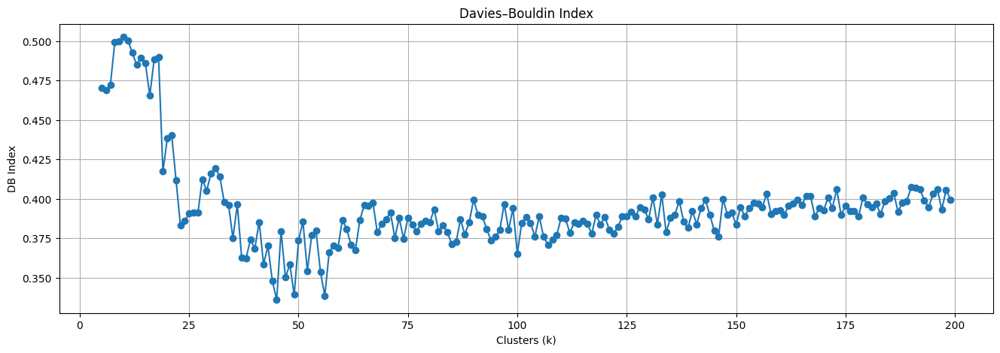

In [ ]:
Y = features3[numeric]

inertias = []
sil_scores = []
K = range(5, 200) # plot all between cluster size 5 to 200
ch_scores = []
db_scores = []

sample = Y

# Split that sample into disjoint partitions
n_partitions = 9
partitions = np.array_split(Y, n_partitions)

for k in K:
    kmean_ = KMeans(n_clusters=k, max_iter=200, random_state=1)
    kmean_.fit(Y)

    inertias.append(kmean_.inertia_)

    labels_sample = kmean_.predict(sample)
    # --- Calinski-Harabasz ---
    ch = calinski_harabasz_score(sample, labels_sample)
    ch_scores.append(ch)

    # --- Davies-Bouldin ---
    db = davies_bouldin_score(sample, labels_sample)
    db_scores.append(db)

# Davies–Bouldin plot
plt.figure(figsize=(16, 5))
plt.plot(K, db_scores, marker='o')
plt.xlabel('Clusters (k)')
plt.ylabel('DB Index')
plt.title('Davies–Bouldin Index')
plt.grid()
plt.show()

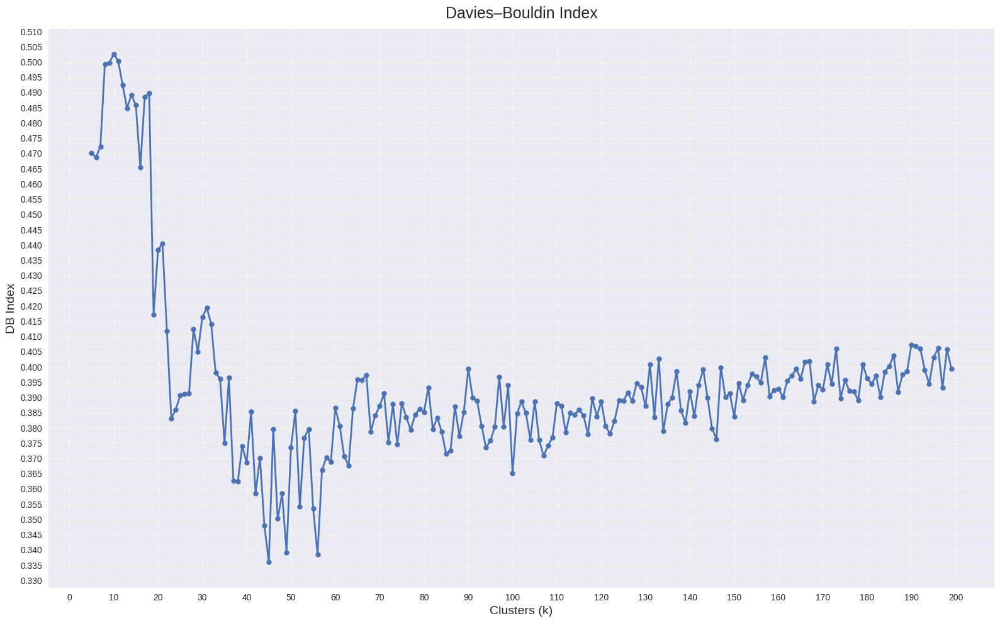

In [ ]:
from matplotlib.ticker import MultipleLocator

# Plot for Davies-Bouldin enlarged
plt.style.use("seaborn-v0_8")

plt.figure(figsize=(16,10))
plt.plot(K, db_scores, marker='o', linewidth=2, markersize=6)

plt.xlabel('Clusters (k)', fontsize=14)
plt.ylabel('DB Index', fontsize=14)
plt.title('Davies–Bouldin Index', fontsize=18, pad=12)

plt.grid(True, linestyle='--', alpha=0.6)

plt.gca().xaxis.set_major_locator(MultipleLocator(10))
plt.gca().yaxis.set_major_locator(MultipleLocator(0.005))

plt.tight_layout()
plt.show()

/tmp/ipython-input-2441774056.py:16: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=12)


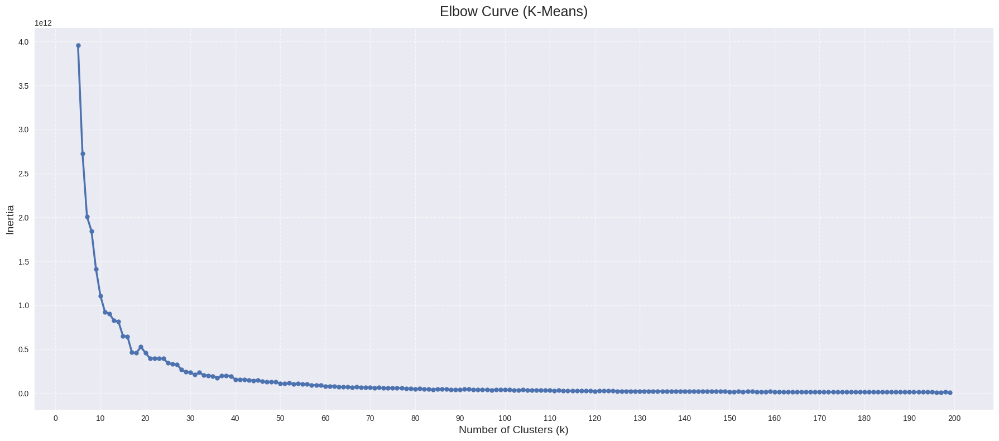

In [ ]:
# Elbow curve
plt.style.use("seaborn-v0_8")

fig, ax = plt.subplots(figsize=(18, 8))

ax.plot(K, inertias, marker='o', linewidth=2.5, markersize=6)
ax.set_xlabel("Number of Clusters (k)", fontsize=14)
ax.set_ylabel("Inertia", fontsize=14)
ax.set_title("Elbow Curve (K-Means)", fontsize=18, pad=15)

ax.grid(True, linestyle='--', alpha=0.6)

ax.xaxis.set_major_locator(MultipleLocator(10))

ax.legend(fontsize=12)
plt.tight_layout()
plt.show()

## HDBSCAN

In [ ]:
cluster_counts = []
outlier_counts = []
db_scores = []
ch_scores = []

min_sizes = [30, 40, 50, 60, 70, 80, 90]
X = features2[numeric].values.astype(np.float32) # robust

for size in min_sizes:
    print(f"Evaluating min_cluster_size = {size}...")

    model = HDBSCAN(metric='euclidean',
                    min_cluster_size=size,
                    min_samples=10)
    model.fit(X)
    labels = model.labels_

    mask = labels != -1
    X_clean = X[mask]
    labels_clean = labels[mask]

    # outliers and cluster count
    outlier_counts.append(np.sum(labels == -1))
    cluster_counts.append(len(set(labels_clean)))


    # metrics
    if len(set(labels_clean)) > 1:
        db_scores.append(davies_bouldin_score(X_clean, labels_clean))
        ch_scores.append(calinski_harabasz_score(X_clean, labels_clean))
    else:
        db_scores.append(np.nan)
        ch_scores.append(np.nan)

In [ ]:
plt.figure(figsize=(8, 5))
plt.plot(min_sizes, db_scores, marker='o', color='orange')
for x, y in zip(min_sizes, db_scores):
    plt.text(x, y, f"{y:.2f}", ha='center', va='bottom')
plt.title("Davies–Bouldin Index vs min_cluster_size")
plt.xlabel("min_cluster_size")
plt.ylabel("DB Index")
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 5))
plt.plot(min_sizes, ch_scores, marker='o', color='green')
for x, y in zip(min_sizes, ch_scores):
    plt.text(x, y, f"{y:.0f}", ha='center', va='bottom')
plt.title("Calinski–Harabasz Score vs min_cluster_size")
plt.xlabel("min_cluster_size")
plt.ylabel("CH Score")
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 5))
plt.plot(min_sizes, cluster_counts, marker='o', color='purple')
for x, y in zip(min_sizes, cluster_counts):
    plt.text(x, y, str(y), ha='center', va='bottom')
plt.title("Number of Clusters vs min_cluster_size")
plt.xlabel("min_cluster_size")
plt.ylabel("Clusters")
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 5))
plt.plot(min_sizes, outlier_counts, marker='o', color='purple')
for x, y in zip(min_sizes, outlier_counts):
    plt.text(x, y, str(y), ha='center', va='bottom')
plt.title("Number of Outliers vs min_cluster_size")
plt.xlabel("min_cluster_size")
plt.ylabel("Outliers")
plt.grid(True)
plt.show()


In [ ]:
cluster_counts = []
outlier_counts = []
db_scores = []
ch_scores = []

min_sizes = [112, 114, 116, 118, 120, 122]
X = features2[numeric].values.astype(np.float32) # robust

for size in min_sizes:
    print(f"Evaluating min_cluster_size = {size}...")

    model = HDBSCAN(metric='euclidean',
                    min_cluster_size=size,
                    min_samples=10)
    model.fit(X)
    labels = model.labels_

    mask = labels != -1
    X_clean = X[mask]
    labels_clean = labels[mask]

    # outliers and count
    outlier_counts.append(np.sum(labels == -1))
    cluster_counts.append(len(set(labels_clean)))

    # metrics
    if len(set(labels_clean)) > 1:
        db_scores.append(davies_bouldin_score(X_clean, labels_clean))
        ch_scores.append(calinski_harabasz_score(X_clean, labels_clean))
    else:
        db_scores.append(np.nan)
        ch_scores.append(np.nan)

In [ ]:
plt.figure(figsize=(8, 5))
plt.plot(min_sizes, db_scores, marker='o', color='orange')
for x, y in zip(min_sizes, db_scores):
    plt.text(x, y, f"{y:.2f}", ha='center', va='bottom')
plt.title("Davies–Bouldin Index vs min_cluster_size")
plt.xlabel("min_cluster_size")
plt.ylabel("DB Index")
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 5))
plt.plot(min_sizes, ch_scores, marker='o', color='green')
for x, y in zip(min_sizes, ch_scores):
    plt.text(x, y, f"{y:.0f}", ha='center', va='bottom')
plt.title("Calinski–Harabasz Score vs min_cluster_size")
plt.xlabel("min_cluster_size")
plt.ylabel("CH Score")
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 5))
plt.plot(min_sizes, cluster_counts, marker='o', color='purple')
for x, y in zip(min_sizes, cluster_counts):
    plt.text(x, y, str(y), ha='center', va='bottom')
plt.title("Number of Clusters vs min_cluster_size")
plt.xlabel("min_cluster_size")
plt.ylabel("Clusters")
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 5))
plt.plot(min_sizes, outlier_counts, marker='o', color='purple')
for x, y in zip(min_sizes, outlier_counts):
    plt.text(x, y, str(y), ha='center', va='bottom')
plt.title("Number of Outliers vs min_cluster_size")
plt.xlabel("min_cluster_size")
plt.ylabel("Outliers")
plt.grid(True)
plt.show()

# Save Final Model

In [ ]:
# final HDBSCAN model on 120 cluster sizes

X = features2[numeric].values.astype(np.float32)

model = HDBSCAN(metric='euclidean',
                min_cluster_size=120,
                min_samples=10)
model.fit(X)
labels = model.labels_

train2['cluster'] = labels

In [ ]:
train2.to_csv("/content/drive/MyDrive/AI_Dataset/train2_with_clusters.csv", index=False)

In [ ]:
# final K-Means model on 44 clusters

X = features3[numeric].values.astype(np.float32)

model2 = KMeans(n_clusters=44, max_iter=200, random_state=1)
model2.fit(X)
labels = model2.labels_

train3['cluster'] = labels

print(f"Inertia: {model2.inertia_}")

print(f"Davies–Bouldin Index: {davies_bouldin_score(X, labels)}")
print(f"Calinski–Harabasz Score: {calinski_harabasz_score(X, labels)}")

Inertia: 149233188864.0
Davies–Bouldin Index: 0.3624346719437469
Calinski–Harabasz Score: 6001617.0


In [ ]:
train3.to_csv("/content/drive/MyDrive/AI_Dataset/train3_with_clusters.csv", index=False)

## Validation Set

In [ ]:
# Keep the IDs separate
ids = holdout['user_id']

# Use only the features for clustering
features = holdout.drop(columns=['user_id', 'latest_date'])
features2 = holdout2.drop(columns=['user_id', 'latest_date'])
features3 = holdout3.drop(columns=['user_id', 'latest_date'])

In [ ]:
# fit validation on trained K-Means model

X = features3[numeric].values.astype(np.float32)

model2.fit(X)
labels = model2.labels_

holdout3['cluster'] = labels

print(f"Inertia: {model2.inertia_}")
print(f"Silhouette Score: {silhouette_score(X, labels)}")

print(f"Davies–Bouldin Index: {davies_bouldin_score(X, labels)}")
print(f"Calinski–Harabasz Score: {calinski_harabasz_score(X, labels)}")

Inertia: 10035410944.0
Silhouette Score: 0.5100334882736206
Davies–Bouldin Index: 0.4061443918164231
Calinski–Harabasz Score: 1863633.75


In [ ]:
holdout3.to_csv("/content/drive/MyDrive/AI_Dataset/holdout3fitted_with_clusters.csv", index=False)

In [ ]:
# fit validation on a new HDBSCAN model

X = features2[numeric].values.astype(np.float32)

model3 = HDBSCAN(metric='euclidean',
                min_cluster_size=120,
                min_samples=10)
model3.fit(X)
labels = model3.labels_

holdout2['cluster'] = labels

mask = labels != -1
X_clean = X[mask]
labels_clean = labels[mask]

print(f"Number of outliers: {np.sum(labels == -1)}")
print(f"Number of clusters: {len(set(labels_clean))}")

print(f"Davies–Bouldin Index: {davies_bouldin_score(X_clean, labels_clean)}")
print(f"Calinski–Harabasz Score: {calinski_harabasz_score(X_clean, labels_clean)}")

Number of outliers: 39704
Number of clusters: 406
Davies–Bouldin Index: 3.085879555352764
Calinski–Harabasz Score: 661.5065307617188


In [ ]:
holdout2.to_csv("/content/drive/MyDrive/AI_Dataset/holdout2_with_clusters.csv", index=False)

In [ ]:
# fit validation on new K-Means model

X = features3[numeric].values.astype(np.float32)

model4 = KMeans(n_clusters=44, max_iter=200, random_state=1)
model4.fit(X)
labels = model4.labels_

holdout3['cluster'] = labels

print(f"Inertia: {model4.inertia_}")
print(f"Silhouette Score: {silhouette_score(X, labels)}")

print(f"Davies–Bouldin Index: {davies_bouldin_score(X, labels)}")
print(f"Calinski–Harabasz Score: {calinski_harabasz_score(X, labels)}")

Inertia: 10035405824.0
Silhouette Score: 0.5100334882736206
Davies–Bouldin Index: 0.4061443918164231
Calinski–Harabasz Score: 1863633.75


In [ ]:
holdout3.to_csv("/content/drive/MyDrive/AI_Dataset/holdout3_with_clusters.csv", index=False)

In [ ]:
# fit the whole dataset on K-Means

features = new_df3.drop(columns=['user_id', 'latest_date'])

X = features[numeric].values.astype(np.float32)

model4 = KMeans(n_clusters=44, max_iter=200, random_state=1)
model4.fit(X)
labels = model4.labels_

new_df3['cluster'] = labels

print(f"Inertia: {model4.inertia_}")
print(f"Silhouette Score: {silhouette_score(X, labels)}")

print(f"Davies–Bouldin Index: {davies_bouldin_score(X, labels)}")
print(f"Calinski–Harabasz Score: {calinski_harabasz_score(X, labels)}")

Inertia: 167480524800.0
Silhouette Score: 0.5943245887756348
Davies–Bouldin Index: 0.34031709319051295
Calinski–Harabasz Score: 7037177.0


In [ ]:
new_df3.to_csv("/content/drive/MyDrive/AI_Dataset/whole_with_clusters.csv", index=False)

# Apriori

## K-Means

In [ ]:
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import fpgrowth
from mlxtend.frequent_patterns import association_rules
warnings.filterwarnings("ignore", category=DeprecationWarning)

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/AI_Dataset/train3_with_clusters.csv")
df2 = pd.read_csv("/content/drive/MyDrive/AI_Dataset/train3_with_clusters.csv")

In [ ]:
df.shape

(1605570, 157)

In [ ]:
start = df.columns.get_loc("acoustic")

ohe_cols = df.columns[start:-1]

X = df[["cluster"] + list(ohe_cols)]

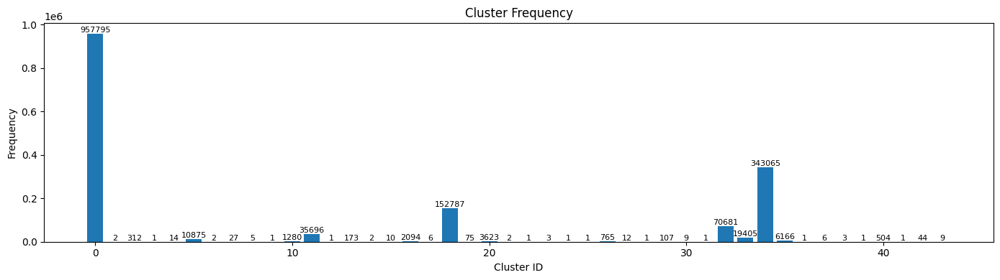

In [ ]:
freq_values = df["cluster"].value_counts().sort_index()

plt.figure(figsize=(14,4))

bars = plt.bar(freq_values.index, freq_values.values)


plt.xlabel("Cluster ID")
plt.ylabel("Frequency")
plt.title("Cluster Frequency")

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, f"{int(height)}", ha='center', va='bottom', fontsize=8)

plt.tight_layout()
plt.show()


In [ ]:
col_freq = X[ohe_cols].sum().sort_values(ascending=False)
top_k = 20
top_cols = col_freq.head(top_k)
print(top_cols)

light             702373
smartphone        279933
bicycle           114209
headphone          95249
massager           85874
clocks             80953
shoes              77213
vacuum             71581
refrigerators      69022
washer             55809
tv                 38899
printer            32827
blanket            27809
sandals            25357
slipons            24736
notebook           22656
keds               22473
blender            22261
table              22237
coffee_grinder     18897
dtype: int64


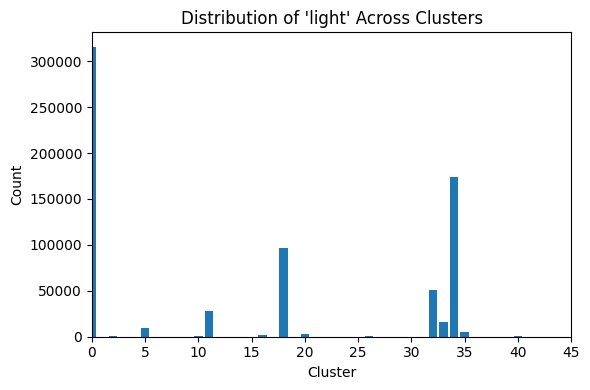

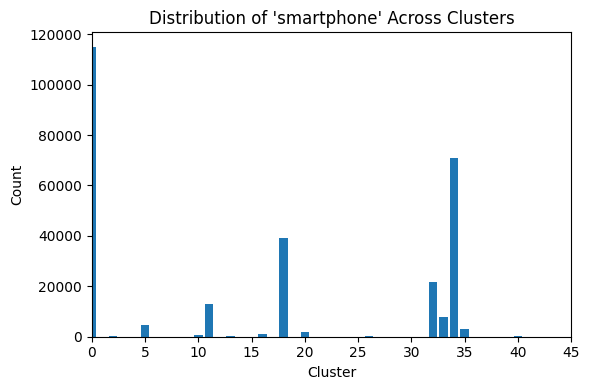

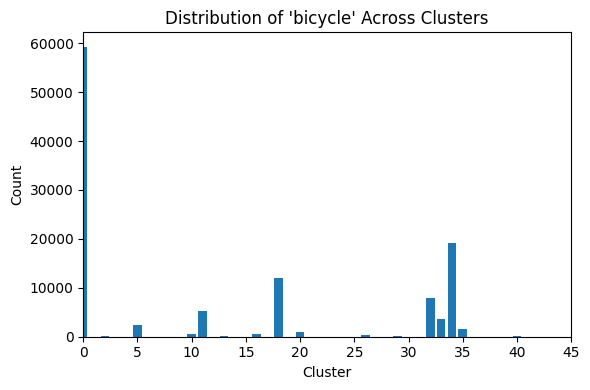

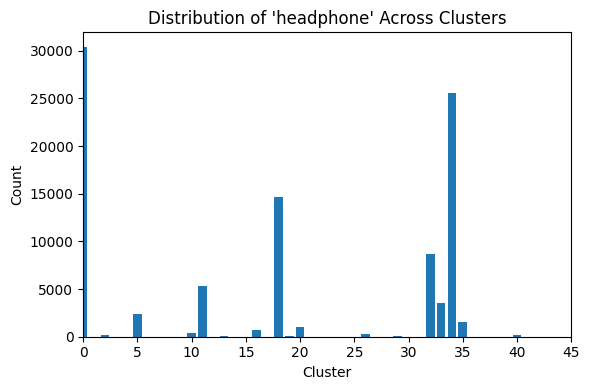

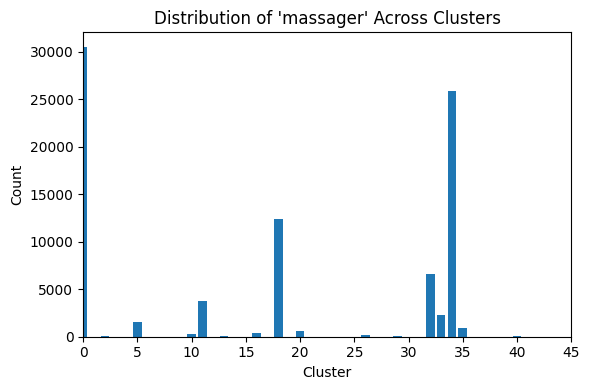

...

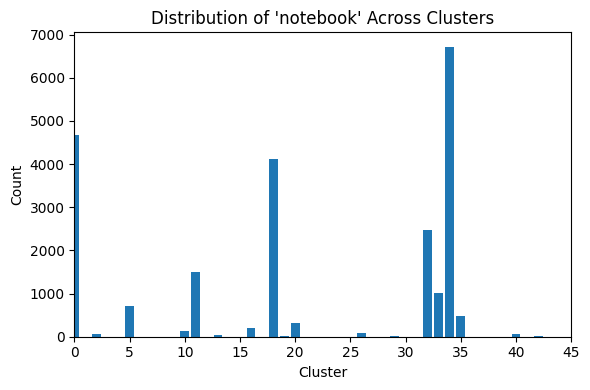

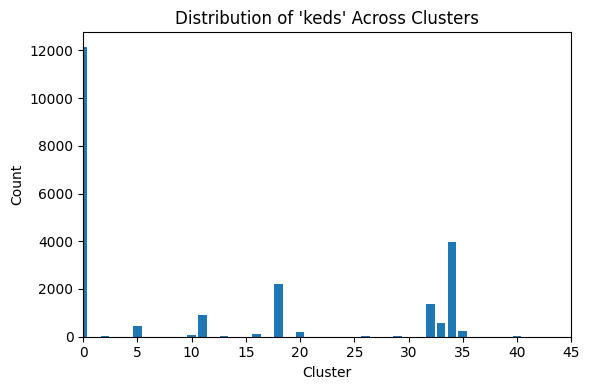

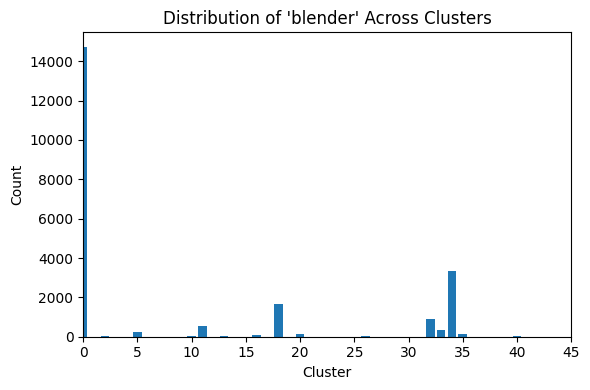

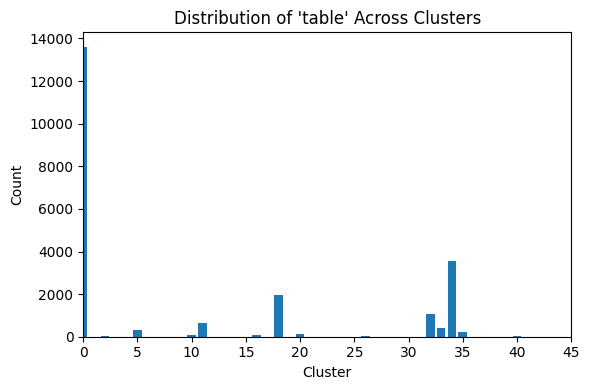

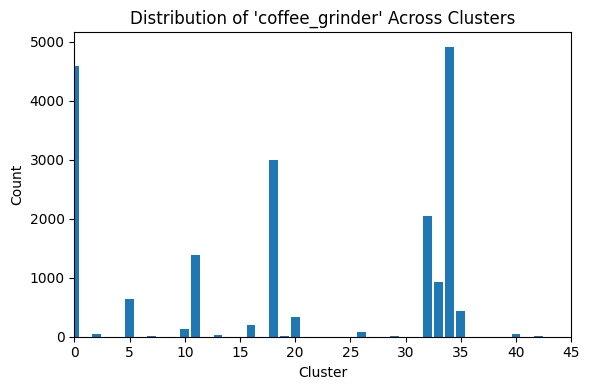

In [ ]:
clusters = X['cluster']  # your cluster assignments
df_items = X[ohe_cols].copy()
df_items["cluster"] = clusters

# Count for each item in each cluster
item_cluster_counts = df_items.groupby("cluster")[ohe_cols].sum()

top_k = 20
top_cols = col_freq.head(top_k).index.tolist()   # your top items


for item in top_cols:
    plt.figure(figsize=(6, 4))

    values = item_cluster_counts[item].values

    plt.bar(range(len(values)), values)
    plt.xlim(0, 45)

    plt.title(f"Distribution of '{item}' Across Clusters")
    plt.xlabel("Cluster")
    plt.ylabel("Count")
    plt.tight_layout()
    plt.show()


In [ ]:
frequent_itemsets = {}

labels_arr = df["cluster"].values # mask for labels rather than searching
ohe_data = X[ohe_cols]

cluster_sizes = pd.Series(labels_arr).value_counts()

unique_labels = [l for l in cluster_sizes.index if cluster_sizes[l] > 40]

total = len(unique_labels)


# itemset length 1
for i, label in enumerate(unique_labels, start=1):

    mask = (labels_arr == label) # filter for label
    temp = ohe_data.iloc[mask]  # iloc faster

    # Apriori
    frequent = apriori(
        temp,
        min_support=0.03,
        use_colnames=True,
        low_memory=True
    )

    frequent_itemsets[label] = frequent

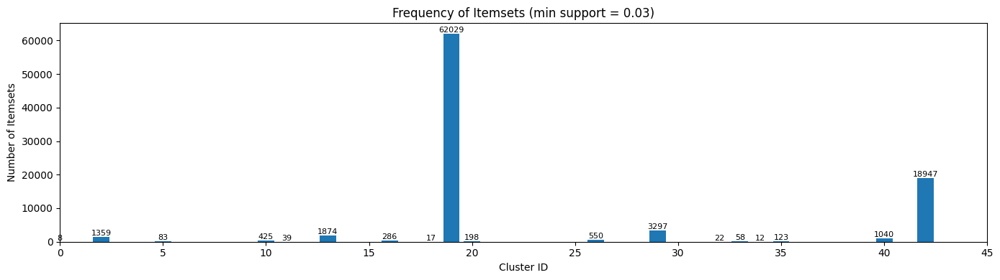

In [ ]:
cluster_ids = list(frequent_itemsets.keys())

# Count ONLY itemsets of size 2 for each cluster
lengths = [len(frequent_itemsets[c]) for c in cluster_ids]

plt.figure(figsize=(14, 4))
bars = plt.bar(cluster_ids, lengths)

plt.xlabel("Cluster ID")
plt.ylabel("Number of Itemsets")
plt.title("Frequency of Itemsets (min support = 0.03)")
plt.xlim(0, 45)

# -------------------------
# Add text labels on bars
# -------------------------
for bar in bars:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,   # x-position
        height,                              # y-position at top of bar
        f"{int(height)}",                    # text (value)
        ha='center', va='bottom', fontsize=8
    )

plt.tight_layout()
plt.show()


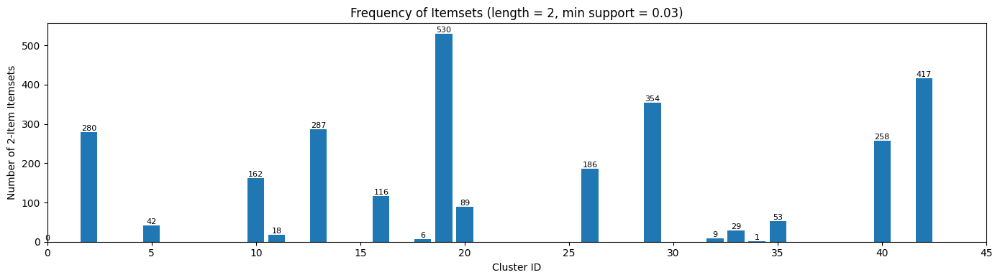

In [ ]:
cluster_ids = list(frequent_itemsets.keys())

# Count itemsets of length 2 for each cluster
lengths = [
    len(frequent_itemsets[c][frequent_itemsets[c]["itemsets"].apply(lambda x: len(x) == 2)])
    for c in cluster_ids
]

plt.figure(figsize=(14, 4))
bars = plt.bar(cluster_ids, lengths)

plt.xlabel("Cluster ID")
plt.ylabel("Number of 2-Item Itemsets")
plt.title("Frequency of Itemsets (length = 2, min support = 0.03)")
plt.xlim(0, 45)

# -------------------------
# Add text labels on bars
# -------------------------
for bar in bars:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        height,
        f"{int(height)}",
        ha='center', va='bottom', fontsize=8
    )

plt.tight_layout()
plt.show()


In [ ]:
for i in range(0, 44):
    if i not in frequent_itemsets or frequent_itemsets[i].empty:
        # skip empty clusters
        continue

    print(f"Cluster {i}")
    display(
        frequent_itemsets[i]
        .sort_values("support", ascending=False)
        .head(20)
    )


Cluster 0


,support,itemsets
3,0.329618,(light)
6,0.120058,(smartphone)
0,0.061881,(bicycle)
7,0.043027,(vacuum)
5,0.040109,(shoes)
1,0.034123,(clocks)
4,0.031881,(massager)
2,0.031758,(headphone)


Cluster 2


,support,itemsets
22,0.903846,(light)
40,0.605769,(smartphone)
242,0.544872,"(light, smartphone)"
17,0.432692,(headphone)
4,0.413462,(bicycle)
83,0.403846,"(bicycle, light)"
197,0.403846,"(light, headphone)"
8,0.394231,(clocks)
132,0.375000,"(clocks, light)"
30,0.304487,(refrigerators)


Cluster 5


,support,itemsets
7,0.841103,(light)
15,0.444230,(smartphone)
48,0.349793,"(light, smartphone)"
0,0.223816,(bicycle)
5,0.223632,(headphone)
22,0.202851,"(bicycle, light)"
2,0.197425,(clocks)
34,0.181793,"(light, headphone)"
29,0.168184,"(clocks, light)"
13,0.144368,(shoes)


Cluster 10


,support,itemsets
20,0.922656,(light)
36,0.550000,(smartphone)
157,0.500781,"(light, smartphone)"
3,0.356250,(bicycle)
58,0.344531,"(bicycle, light)"
8,0.336719,(clocks)
17,0.335156,(headphone)
85,0.323437,"(clocks, light)"
124,0.312500,"(light, headphone)"
31,0.265625,(shoes)


Cluster 11


,support,itemsets
6,0.774316,(light)
13,0.359284,(smartphone)
30,0.233107,"(light, smartphone)"
5,0.150073,(headphone)
0,0.147271,(bicycle)
19,0.126961,"(bicycle, light)"
2,0.125981,(clocks)
7,0.104886,(massager)
24,0.101468,"(light, headphone)"
10,0.097770,(refrigerators)


Cluster 13


,support,itemsets
21,0.901734,(light)
37,0.676301,(smartphone)
247,0.601156,"(light, smartphone)"
10,0.473988,(clocks)
5,0.462428,(bicycle)
84,0.450867,"(bicycle, light)"
18,0.445087,(headphone)
138,0.445087,"(clocks, light)"
206,0.404624,"(light, headphone)"
237,0.346821,"(refrigerators, light)"


Cluster 16


,support,itemsets
16,0.886819,(light)
27,0.522923,(smartphone)
115,0.447469,"(light, smartphone)"
14,0.317096,(headphone)
2,0.310411,(bicycle)
6,0.297517,(clocks)
46,0.294651,"(bicycle, light)"
95,0.276027,"(light, headphone)"
66,0.271729,"(clocks, light)"
23,0.223496,(shoes)


Cluster 18


,support,itemsets
3,0.632973,(light)
7,0.255951,(smartphone)
2,0.096029,(headphone)
16,0.091258,"(light, smartphone)"
4,0.081440,(massager)
0,0.078272,(bicycle)
5,0.068887,(refrigerators)
1,0.063330,(clocks)
6,0.054749,(shoes)
11,0.049978,"(bicycle, light)"


Cluster 19


,support,itemsets
21,0.933333,(light)
43,0.626667,(smartphone)
384,0.560000,"(light, smartphone)"
18,0.506667,(headphone)
305,0.493333,"(light, headphone)"
8,0.413333,(clocks)
194,0.386667,"(clocks, light)"
5,0.373333,(bicycle)
135,0.373333,"(bicycle, light)"
375,0.346667,"(refrigerators, light)"


Cluster 20


,support,itemsets
15,0.876070,(light)
24,0.512007,(smartphone)
90,0.431962,"(light, smartphone)"
2,0.288987,(bicycle)
41,0.275186,"(bicycle, light)"
13,0.272150,(headphone)
6,0.261110,(clocks)
53,0.238476,"(clocks, light)"
73,0.235164,"(light, headphone)"
21,0.202319,(shoes)


Cluster 26


,support,itemsets
21,0.909804,(light)
37,0.547712,(smartphone)
180,0.495425,"(light, smartphone)"
4,0.393464,(bicycle)
18,0.386928,(headphone)
9,0.381699,(clocks)
67,0.380392,"(bicycle, light)"
106,0.358170,"(clocks, light)"
148,0.343791,"(light, headphone)"
33,0.262745,(shoes)


Cluster 29


,support,itemsets
20,0.915888,(light)
39,0.626168,(smartphone)
280,0.588785,"(light, smartphone)"
8,0.448598,(clocks)
134,0.439252,"(clocks, light)"
17,0.439252,(headphone)
83,0.429907,"(bicycle, light)"
3,0.429907,(bicycle)
225,0.401869,"(light, headphone)"
30,0.373832,(refrigerators)


Cluster 32


,support,itemsets
3,0.712200,(light)
9,0.306617,(smartphone)
20,0.161769,"(light, smartphone)"
2,0.123258,(headphone)
0,0.111642,(bicycle)
1,0.094283,(clocks)
4,0.093943,(massager)
13,0.085723,"(bicycle, light)"
7,0.082639,(refrigerators)
8,0.073344,(shoes)


Cluster 33


,support,itemsets
7,0.814378,(light)
15,0.408194,(smartphone)
40,0.296831,"(light, smartphone)"
5,0.184643,(headphone)
0,0.184643,(bicycle)
21,0.163978,"(bicycle, light)"
2,0.163154,(clocks)
30,0.140840,"(light, headphone)"
25,0.133780,"(clocks, light)"
11,0.122133,(refrigerators)


Cluster 34


,support,itemsets
3,0.505857,(light)
7,0.206083,(smartphone)
4,0.075531,(massager)
2,0.074604,(headphone)
5,0.062006,(refrigerators)
0,0.055718,(bicycle)
1,0.051789,(clocks)
10,0.047131,(washer)
11,0.043671,"(light, smartphone)"
6,0.042966,(shoes)


Cluster 35


,support,itemsets
10,0.867661,(light)
19,0.481998,(smartphone)
62,0.403665,"(light, smartphone)"
1,0.269218,(bicycle)
29,0.252189,"(bicycle, light)"
8,0.244567,(headphone)
3,0.241323,(clocks)
38,0.214402,"(clocks, light)"
48,0.207914,"(light, headphone)"
14,0.180182,(refrigerators)


Cluster 40


,support,itemsets
22,0.914683,(light)
40,0.607143,(smartphone)
230,0.543651,"(light, smartphone)"
19,0.426587,(headphone)
4,0.420635,(bicycle)
9,0.406746,(clocks)
76,0.400794,"(bicycle, light)"
181,0.386905,"(light, headphone)"
123,0.376984,"(clocks, light)"
31,0.285714,(refrigerators)


Cluster 42


,support,itemsets
18,1.000000,(light)
36,0.727273,(smartphone)
320,0.727273,"(light, smartphone)"
109,0.636364,"(bicycle, light)"
5,0.636364,(bicycle)
175,0.500000,"(clocks, light)"
7,0.500000,(clocks)
16,0.454545,(headphone)
272,0.454545,"(light, headphone)"
816,0.409091,"(bicycle, light, smartphone)"


In [ ]:
for i in range(0, 45):

    # Skip cluster if missing or empty
    if i not in frequent_itemsets or frequent_itemsets[i].empty:
        continue

    freq = frequent_itemsets[i]

    # Filter ONLY 2-item itemsets
    freq_size2 = freq[freq["itemsets"].apply(lambda s: len(s) == 2)]

    # Skip if no 2-item itemsets
    if freq_size2.empty:
        continue

    print(f"Cluster {i}")
    display(freq_size2.sort_values("support", ascending=False).head(20))


Cluster 2


,support,itemsets
242,0.544872,"(light, smartphone)"
83,0.403846,"(bicycle, light)"
197,0.403846,"(light, headphone)"
132,0.375000,"(clocks, light)"
209,0.301282,"(smartphone, headphone)"
232,0.282051,"(refrigerators, light)"
96,0.253205,"(bicycle, smartphone)"
142,0.246795,"(clocks, smartphone)"
81,0.246795,"(bicycle, headphone)"
75,0.240385,"(clocks, bicycle)"


Cluster 5


,support,itemsets
48,0.349793,"(light, smartphone)"
22,0.202851,"(bicycle, light)"
34,0.181793,"(light, headphone)"
29,0.168184,"(clocks, light)"
46,0.127264,"(light, shoes)"
44,0.124598,"(refrigerators, light)"
41,0.116782,"(light, massager)"
39,0.102989,"(smartphone, headphone)"
31,0.092966,"(clocks, smartphone)"
26,0.088828,"(bicycle, smartphone)"


Cluster 10


,support,itemsets
157,0.500781,"(light, smartphone)"
58,0.344531,"(bicycle, light)"
85,0.323437,"(clocks, light)"
124,0.312500,"(light, headphone)"
152,0.256250,"(light, shoes)"
148,0.239844,"(refrigerators, light)"
143,0.205469,"(light, massager)"
93,0.198437,"(clocks, smartphone)"
132,0.192188,"(smartphone, headphone)"
66,0.182812,"(bicycle, smartphone)"


Cluster 11


,support,itemsets
30,0.233107,"(light, smartphone)"
19,0.126961,"(bicycle, light)"
24,0.101468,"(light, headphone)"
21,0.094604,"(clocks, light)"
29,0.078076,"(light, shoes)"
26,0.075891,"(light, massager)"
28,0.073061,"(refrigerators, light)"
25,0.054656,"(smartphone, headphone)"
22,0.045383,"(clocks, smartphone)"
20,0.043422,"(bicycle, smartphone)"


Cluster 13


,support,itemsets
247,0.601156,"(light, smartphone)"
84,0.450867,"(bicycle, light)"
138,0.445087,"(clocks, light)"
206,0.404624,"(light, headphone)"
237,0.346821,"(refrigerators, light)"
153,0.341040,"(clocks, smartphone)"
97,0.323699,"(bicycle, smartphone)"
217,0.317919,"(smartphone, headphone)"
77,0.306358,"(clocks, bicycle)"
136,0.300578,"(clocks, headphone)"


Cluster 16


,support,itemsets
115,0.447469,"(light, smartphone)"
46,0.294651,"(bicycle, light)"
95,0.276027,"(light, headphone)"
66,0.271729,"(clocks, light)"
112,0.212989,"(light, shoes)"
110,0.200573,"(refrigerators, light)"
107,0.176218,"(light, massager)"
103,0.172397,"(smartphone, headphone)"
74,0.170487,"(clocks, smartphone)"
54,0.149952,"(bicycle, smartphone)"


Cluster 18


,support,itemsets
16,0.091258,"(light, smartphone)"
11,0.049978,"(bicycle, light)"
13,0.039002,"(light, headphone)"
14,0.036312,"(light, massager)"
15,0.032627,"(light, shoes)"
12,0.032444,"(clocks, light)"


Cluster 19


,support,itemsets
384,0.560000,"(light, smartphone)"
305,0.493333,"(light, headphone)"
194,0.386667,"(clocks, light)"
135,0.373333,"(bicycle, light)"
375,0.346667,"(refrigerators, light)"
324,0.333333,"(smartphone, headphone)"
380,0.293333,"(light, shoes)"
191,0.280000,"(clocks, headphone)"
501,0.280000,"(refrigerators, smartphone)"
363,0.266667,"(light, massager)"


Cluster 20


,support,itemsets
90,0.431962,"(light, smartphone)"
41,0.275186,"(bicycle, light)"
53,0.238476,"(clocks, light)"
73,0.235164,"(light, headphone)"
87,0.187966,"(light, shoes)"
85,0.179961,"(refrigerators, light)"
82,0.155672,"(light, massager)"
79,0.150704,"(smartphone, headphone)"
48,0.134971,"(bicycle, smartphone)"
59,0.134419,"(clocks, smartphone)"


Cluster 26


,support,itemsets
180,0.495425,"(light, smartphone)"
67,0.380392,"(bicycle, light)"
106,0.358170,"(clocks, light)"
148,0.343791,"(light, headphone)"
176,0.252288,"(light, shoes)"
172,0.226144,"(refrigerators, light)"
156,0.223529,"(smartphone, headphone)"
114,0.216993,"(clocks, smartphone)"
65,0.209150,"(bicycle, headphone)"
76,0.209150,"(bicycle, smartphone)"


Cluster 29


,support,itemsets
280,0.588785,"(light, smartphone)"
134,0.439252,"(clocks, light)"
83,0.429907,"(bicycle, light)"
225,0.401869,"(light, headphone)"
271,0.364486,"(refrigerators, light)"
275,0.336449,"(light, shoes)"
262,0.289720,"(light, massager)"
73,0.280374,"(clocks, bicycle)"
95,0.280374,"(bicycle, smartphone)"
238,0.280374,"(smartphone, headphone)"


Cluster 32


,support,itemsets
20,0.161769,"(light, smartphone)"
13,0.085723,"(bicycle, light)"
15,0.069071,"(light, headphone)"
14,0.061431,"(clocks, light)"
17,0.056423,"(light, massager)"
19,0.052546,"(light, shoes)"
18,0.050594,"(refrigerators, light)"
16,0.033658,"(smartphone, headphone)"
21,0.030928,"(light, vacuum)"


Cluster 33


,support,itemsets
40,0.296831,"(light, smartphone)"
21,0.163978,"(bicycle, light)"
30,0.140840,"(light, headphone)"
25,0.133780,"(clocks, light)"
38,0.102499,"(light, shoes)"
36,0.101056,"(refrigerators, light)"
33,0.096676,"(light, massager)"
32,0.078433,"(smartphone, headphone)"
27,0.067972,"(clocks, smartphone)"
23,0.065808,"(bicycle, smartphone)"


Cluster 34


,support,itemsets
11,0.043671,"(light, smartphone)"


Cluster 35


,support,itemsets
62,0.403665,"(light, smartphone)"
29,0.252189,"(bicycle, light)"
38,0.214402,"(clocks, light)"
48,0.207914,"(light, headphone)"
60,0.164775,"(light, shoes)"
58,0.163964,"(refrigerators, light)"
55,0.134934,"(light, massager)"
53,0.126338,"(smartphone, headphone)"
43,0.124716,"(clocks, smartphone)"
35,0.121959,"(bicycle, smartphone)"


Cluster 40


,support,itemsets
230,0.543651,"(light, smartphone)"
76,0.400794,"(bicycle, light)"
181,0.386905,"(light, headphone)"
123,0.376984,"(clocks, light)"
221,0.277778,"(refrigerators, light)"
132,0.277778,"(clocks, smartphone)"
195,0.277778,"(smartphone, headphone)"
225,0.269841,"(light, shoes)"
69,0.242063,"(clocks, bicycle)"
88,0.234127,"(bicycle, smartphone)"


Cluster 42


,support,itemsets
320,0.727273,"(light, smartphone)"
109,0.636364,"(bicycle, light)"
175,0.500000,"(clocks, light)"
272,0.454545,"(light, headphone)"
125,0.409091,"(bicycle, smartphone)"
186,0.363636,"(clocks, smartphone)"
98,0.363636,"(clocks, bicycle)"
283,0.363636,"(smartphone, headphone)"
311,0.340909,"(refrigerators, light)"
107,0.318182,"(bicycle, headphone)"


Max cluster occurrence among 2-item itemsets: 17
Itemsets kept after filtering: 26


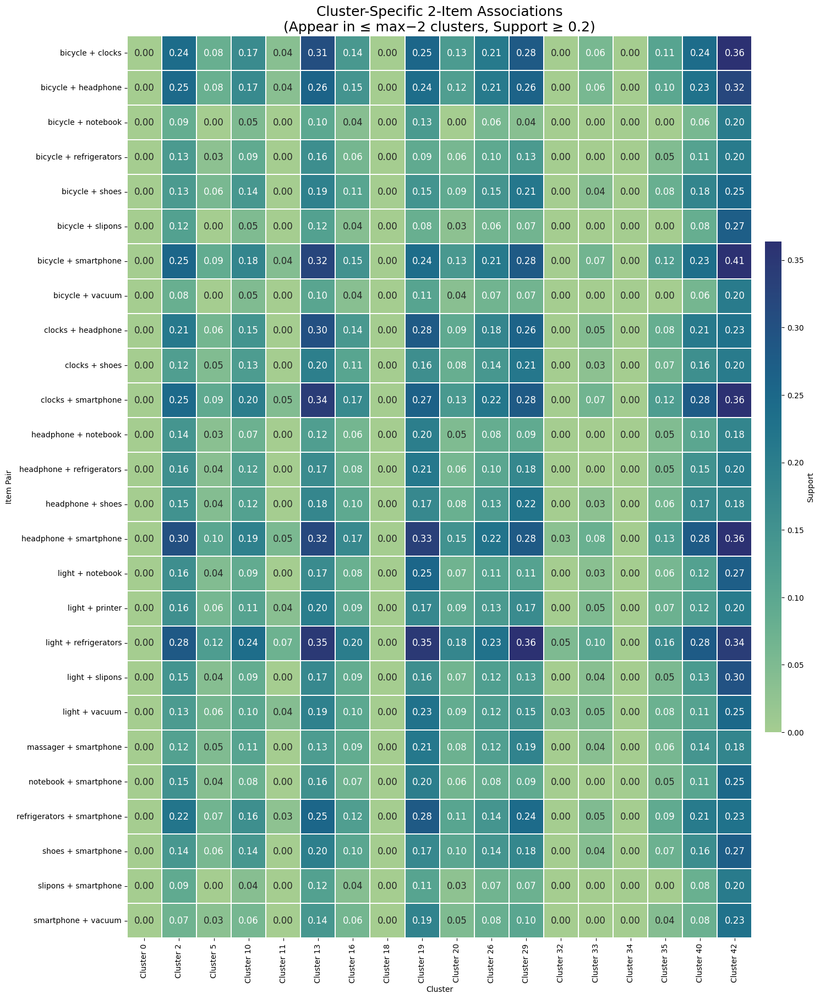

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from collections import defaultdict

# ------------------------------------------------------------
# 1. Helper: format frozenset nicely
# ------------------------------------------------------------
def format_itemset(fs):
    return " + ".join(sorted(fs))


# ------------------------------------------------------------
# 2. Collect cluster presence + max support for 2-item itemsets
# ------------------------------------------------------------
itemset_clusters = defaultdict(set)
itemset_max_support = defaultdict(float)

for cluster_id, df in frequent_itemsets.items():
    if df.empty:
        continue

    # Only 2-item itemsets
    freq2 = df[df["itemsets"].apply(len) == 2]

    for _, row in freq2.iterrows():
        fs = row["itemsets"]
        sup = row["support"]

        itemset_clusters[fs].add(cluster_id)
        itemset_max_support[fs] = max(itemset_max_support[fs], sup)


# ------------------------------------------------------------
# 3. Compute MAX observed cluster occurrence (key difference)
# ------------------------------------------------------------
max_cluster_occurrence = max(
    len(cluster_ids)
    for cluster_ids in itemset_clusters.values()
)

print(f"Max cluster occurrence among 2-item itemsets: {max_cluster_occurrence}")


# ------------------------------------------------------------
# 4. Select itemsets:
#    - appear in at most (max - 2) clusters
#    - AND support >= 0.25 in at least one cluster
# ------------------------------------------------------------
MIN_SUPPORT = 0.20

allowed_itemsets = {
    fs
    for fs in itemset_clusters
    if len(itemset_clusters[fs]) <= (max_cluster_occurrence - 2)
    and itemset_max_support[fs] >= MIN_SUPPORT
}

print(f"Itemsets kept after filtering: {len(allowed_itemsets)}")


# ------------------------------------------------------------
# 5. Build heatmap DataFrame
# ------------------------------------------------------------
pair_labels = {fs: format_itemset(fs) for fs in allowed_itemsets}
pairs_sorted = sorted(allowed_itemsets, key=lambda x: pair_labels[x])

heatmap_df = pd.DataFrame(
    index=[pair_labels[p] for p in pairs_sorted]
)

for i in range(45):
    if i not in frequent_itemsets or frequent_itemsets[i].empty:
        continue

    df = frequent_itemsets[i]
    freq2 = df[df["itemsets"].apply(len) == 2]

    # Keep only selected itemsets
    freq2 = freq2[freq2["itemsets"].isin(allowed_itemsets)]

    heatmap_df[f"Cluster {i}"] = (
        freq2
        .assign(label=freq2["itemsets"].map(pair_labels))
        .set_index("label")["support"]
    )

# Fill missing with 0 (itemset absent in cluster)
heatmap_df = heatmap_df.fillna(0)


# ------------------------------------------------------------
# 6. Plot heatmap
# ------------------------------------------------------------
plt.figure(figsize=(15, 25))

ax = sns.heatmap(
    heatmap_df,
    cmap="crest",
    linewidths=0.05,
    linecolor="white",
    square=True,
    vmax=heatmap_df.quantile(0.95).max(),

    # 🔹 Cell annotations
    annot=True,
    fmt=".2f",                 # two decimal places
    annot_kws={"size": 12},     # control text size

    # 🔹 Colorbar (legend) styling
    cbar_kws={
        "fraction": 0.025,
        "pad": 0.02,
        "aspect": 30,
        "label": "Support"
    }
)

plt.title(
    "Cluster-Specific 2-Item Associations\n"
    "(Appear in ≤ max−2 clusters, Support ≥ 0.2)",
    fontsize=18
)
plt.xlabel("Cluster")
plt.ylabel("Item Pair")

# Optional: make colorbar tick labels smaller
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=10)

plt.tight_layout()
plt.show()



Max cluster occurrence among 2-item itemsets: 17
Itemsets kept after filtering: 9


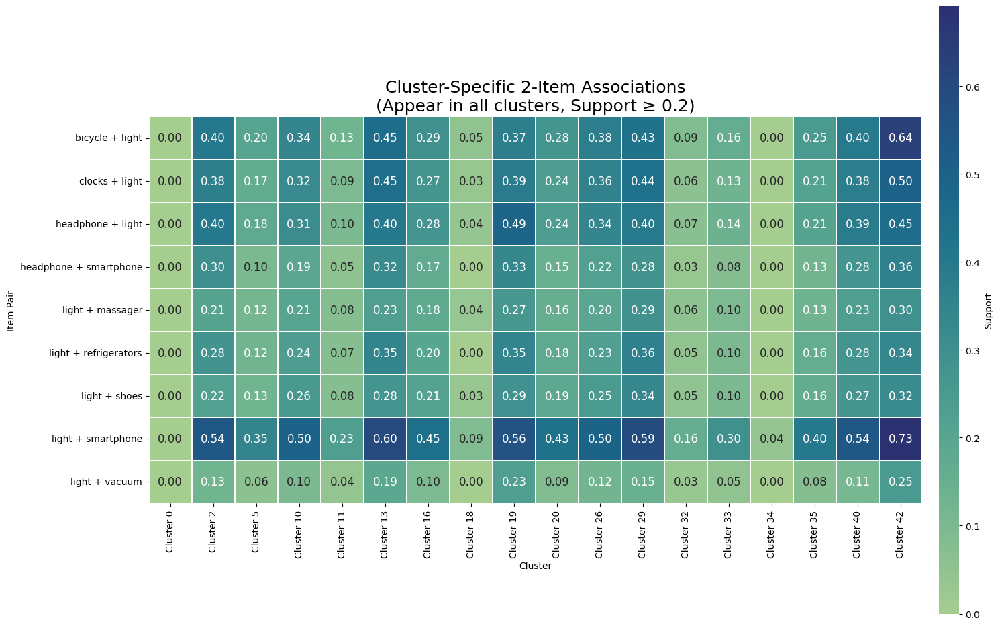

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from collections import defaultdict

# ------------------------------------------------------------
# 1. Helper: format frozenset nicely
# ------------------------------------------------------------
def format_itemset(fs):
    return " + ".join(sorted(fs))


# ------------------------------------------------------------
# 2. Collect cluster presence + max support for 2-item itemsets
# ------------------------------------------------------------
itemset_clusters = defaultdict(set)
itemset_max_support = defaultdict(float)

for cluster_id, df in frequent_itemsets.items():
    if df.empty:
        continue

    # Only 2-item itemsets
    freq2 = df[df["itemsets"].apply(len) == 2]

    for _, row in freq2.iterrows():
        fs = row["itemsets"]
        sup = row["support"]

        itemset_clusters[fs].add(cluster_id)
        itemset_max_support[fs] = max(itemset_max_support[fs], sup)


# ------------------------------------------------------------
# 3. Compute MAX observed cluster occurrence (key difference)
# ------------------------------------------------------------
max_cluster_occurrence = max(
    len(cluster_ids)
    for cluster_ids in itemset_clusters.values()
)

print(f"Max cluster occurrence among 2-item itemsets: {max_cluster_occurrence}")


# ------------------------------------------------------------
# 4. Select itemsets:
#    - appear in at most (max - 2) clusters
#    - AND support >= 0.25 in at least one cluster
# ------------------------------------------------------------
MIN_SUPPORT = 0.20

allowed_itemsets = {
    fs
    for fs in itemset_clusters
    if len(itemset_clusters[fs]) >= (max_cluster_occurrence - 2)
    and itemset_max_support[fs] >= MIN_SUPPORT
}

print(f"Itemsets kept after filtering: {len(allowed_itemsets)}")


# ------------------------------------------------------------
# 5. Build heatmap DataFrame
# ------------------------------------------------------------
pair_labels = {fs: format_itemset(fs) for fs in allowed_itemsets}
pairs_sorted = sorted(allowed_itemsets, key=lambda x: pair_labels[x])

heatmap_df = pd.DataFrame(
    index=[pair_labels[p] for p in pairs_sorted]
)

for i in range(45):
    if i not in frequent_itemsets or frequent_itemsets[i].empty:
        continue

    df = frequent_itemsets[i]
    freq2 = df[df["itemsets"].apply(len) == 2]

    # Keep only selected itemsets
    freq2 = freq2[freq2["itemsets"].isin(allowed_itemsets)]

    heatmap_df[f"Cluster {i}"] = (
        freq2
        .assign(label=freq2["itemsets"].map(pair_labels))
        .set_index("label")["support"]
    )

# Fill missing with 0 (itemset absent in cluster)
heatmap_df = heatmap_df.fillna(0)


# ------------------------------------------------------------
# 6. Plot heatmap
# ------------------------------------------------------------
plt.figure(figsize=(15, 25))

ax = sns.heatmap(
    heatmap_df,
    cmap="crest",
    linewidths=0.05,
    linecolor="white",
    square=True,
    vmax=heatmap_df.quantile(0.95).max(),

    # 🔹 Cell annotations
    annot=True,
    fmt=".2f",                 # two decimal places
    annot_kws={"size": 12},     # control text size

    # 🔹 Colorbar (legend) styling
    cbar_kws={
        "fraction": 0.025,
        "pad": 0.02,
        "aspect": 30,
        "label": "Support"
    }
)

plt.title(
    "Cluster-Specific 2-Item Associations\n"
    "(Appear in all clusters, Support ≥ 0.2)",
    fontsize=18
)
plt.xlabel("Cluster")
plt.ylabel("Item Pair")

# Optional: make colorbar tick labels smaller
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=10)

plt.tight_layout()
plt.show()



In [ ]:
pairs = list(zip(cluster_ids, lengths))
pairs_sorted = sorted(pairs, key=lambda x: x[1], reverse=True)

top_20 = pairs_sorted[:20]

print("Top 20 clusters by number of itemsets:")
for cid, count in top_20:
    print(f"Cluster {cid}: {count} itemsets")

Top 20 clusters by number of itemsets:
Cluster 19: 530 itemsets
Cluster 42: 417 itemsets
Cluster 29: 354 itemsets
Cluster 13: 287 itemsets
Cluster 2: 280 itemsets
Cluster 40: 258 itemsets
Cluster 26: 186 itemsets
Cluster 10: 162 itemsets
Cluster 16: 116 itemsets
Cluster 20: 89 itemsets
Cluster 35: 53 itemsets
Cluster 5: 42 itemsets
Cluster 33: 29 itemsets
Cluster 11: 18 itemsets
Cluster 32: 9 itemsets
Cluster 18: 6 itemsets
Cluster 34: 1 itemsets
Cluster 0: 0 itemsets


In [ ]:
rules_dict = {}

for label, itemset_df in frequent_itemsets.items():

    # --- skip clusters with no frequent itemsets ---
    if itemset_df.empty:
        rules_dict[label] = itemset_df
        continue

    # --- association rules ---
    try:
        rules = association_rules(
            itemset_df,
            metric="lift",
            min_threshold=1.0
        )
    except ValueError:
        # ignore if itemset size is less than 2
        rules = pd.DataFrame()

    rules_dict[label] = rules

/usr/local/lib/python3.12/dist-packages/mlxtend/frequent_patterns/association_rules.py:186: RuntimeWarning: invalid value encountered in divide
  cert_metric = np.where(certainty_denom == 0, 0, certainty_num / certainty_denom)


In [ ]:
skipped = 0

for i in range(44):

    # Skip if cluster missing or rules table empty
    if i not in rules_dict or rules_dict[i].empty:
        skipped += 1
        continue

    rules = rules_dict[i]

    # Filter rules with antecedent size 2
    rules_size2 = rules[rules["antecedents"].apply(lambda x: len(x) == 2)]

    # Skip if no matching rules
    if rules_size2.empty:
        skipped += 1
        continue

    print(f"Cluster {i}")
    display(
        rules_size2
        .sort_values("lift", ascending=False)
        .head(20)
    )

print(f"\nTotal clusters skipped: {skipped}")


Cluster 2


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
10833,"(blanket, vacuum)","(refrigerators, light, shoes)",0.038462,0.092949,0.032051,0.833333,8.965517,1.0,0.028476,5.442308,0.924000,0.322581,0.816254,0.589080
10835,"(shoes, vacuum)","(blanket, refrigerators, light)",0.067308,0.054487,0.032051,0.476190,8.739496,1.0,0.028384,1.805070,0.949485,0.357143,0.446005,0.532213
10838,"(refrigerators, shoes)","(blanket, light, vacuum)",0.099359,0.038462,0.032051,0.322581,8.387097,1.0,0.028230,1.419414,0.977936,0.303030,0.295484,0.577957
5621,"(refrigerators, shoes)","(blanket, vacuum)",0.099359,0.038462,0.032051,0.322581,8.387097,1.0,0.028230,1.419414,0.977936,0.303030,0.295484,0.577957
5616,"(blanket, vacuum)","(refrigerators, shoes)",0.038462,0.099359,0.032051,0.833333,8.387097,1.0,0.028230,5.403846,0.916000,0.303030,0.814947,0.577957
10834,"(refrigerators, vacuum)","(blanket, light, shoes)",0.083333,0.048077,0.032051,0.384615,8.000000,1.0,0.028045,1.546875,0.954545,0.322581,0.353535,0.525641
12046,"(vacuum, massager)","(washer, refrigerators, light)",0.057692,0.076923,0.035256,0.611111,7.944444,1.0,0.030819,2.373626,0.927644,0.354839,0.578704,0.534722
12040,"(washer, vacuum)","(refrigerators, light, massager)",0.044872,0.099359,0.035256,0.785714,7.907834,1.0,0.030798,4.202991,0.914582,0.323529,0.762074,0.570276
10836,"(blanket, refrigerators)","(shoes, light, vacuum)",0.064103,0.064103,0.032051,0.500000,7.800000,1.0,0.027942,1.871795,0.931507,0.333333,0.465753,0.500000
10418,"(refrigerators, shoes)","(bicycle, headphone, vacuum)",0.099359,0.051282,0.038462,0.387097,7.548387,1.0,0.033366,1.547908,0.963227,0.342857,0.353967,0.568548


Cluster 5


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
61,"(clocks, headphone)",(bicycle),0.063540,0.223816,0.030713,0.483357,2.159619,1.0,0.016491,1.502362,0.573389,0.119670,0.334381,0.310290
171,"(light, headphone)","(bicycle, smartphone)",0.181793,0.088828,0.033747,0.185635,2.089833,1.0,0.017599,1.118874,0.637361,0.142469,0.106245,0.282776
166,"(bicycle, smartphone)","(light, headphone)",0.088828,0.181793,0.033747,0.379917,2.089833,1.0,0.017599,1.319512,0.572332,0.142469,0.242144,0.282776
62,"(bicycle, headphone)",(clocks),0.078529,0.197425,0.030713,0.391101,1.981006,1.0,0.015209,1.318075,0.537408,0.125234,0.241318,0.273333
67,"(clocks, light)",(bicycle),0.168184,0.223816,0.071632,0.425916,1.902972,1.0,0.033990,1.352038,0.570446,0.223594,0.260376,0.372983
82,"(bicycle, smartphone)",(headphone),0.088828,0.223632,0.037517,0.422360,1.888638,1.0,0.017653,1.344035,0.516387,0.136455,0.255972,0.295062
73,"(bicycle, smartphone)",(clocks),0.088828,0.197425,0.032552,0.366460,1.856194,1.0,0.015015,1.266809,0.506230,0.128307,0.210615,0.265670
141,"(light, massager)",(shoes),0.116782,0.144368,0.031172,0.266929,1.848952,1.0,0.014313,1.167189,0.519864,0.135546,0.143241,0.241426
68,"(bicycle, light)",(clocks),0.202851,0.197425,0.071632,0.353128,1.788666,1.0,0.031584,1.240701,0.553126,0.217963,0.194004,0.357980
90,"(light, shoes)",(bicycle),0.127264,0.223816,0.050667,0.398121,1.778788,1.0,0.022183,1.289602,0.501663,0.168656,0.224567,0.312249


Cluster 10


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
1596,"(coffee_grinder, faucet)","(light, printer)",0.049219,0.110156,0.041406,0.841270,7.637060,1.0,0.035984,5.606016,0.914048,0.350993,0.821620,0.608578
1601,"(light, printer)","(coffee_grinder, faucet)",0.110156,0.049219,0.041406,0.375887,7.637060,1.0,0.035984,1.523411,0.976643,0.350993,0.343578,0.608578
670,"(coffee_grinder, faucet)",(printer),0.049219,0.114062,0.042188,0.857143,7.514677,1.0,0.036573,6.201563,0.911805,0.348387,0.838750,0.613503
671,"(coffee_grinder, printer)",(faucet),0.054688,0.104688,0.042188,0.771429,7.368870,1.0,0.036462,3.916992,0.914294,0.360000,0.744702,0.587207
1599,"(faucet, light)","(coffee_grinder, printer)",0.103125,0.054688,0.041406,0.401515,7.341991,1.0,0.035767,1.579509,0.963119,0.355705,0.366892,0.579329
1598,"(coffee_grinder, printer)","(faucet, light)",0.054688,0.103125,0.041406,0.757143,7.341991,1.0,0.035767,3.693015,0.913769,0.355705,0.729219,0.579329
1597,"(coffee_grinder, light)","(faucet, printer)",0.105469,0.056250,0.041406,0.392593,6.979424,1.0,0.035474,1.553735,0.957733,0.344156,0.356390,0.564352
1600,"(faucet, printer)","(coffee_grinder, light)",0.056250,0.105469,0.041406,0.736111,6.979424,1.0,0.035474,3.389803,0.907785,0.344156,0.704998,0.564352
672,"(faucet, printer)",(coffee_grinder),0.056250,0.107813,0.042188,0.750000,6.956522,1.0,0.036123,3.568750,0.907285,0.346154,0.719790,0.570652
660,"(light, compressor)",(coffee_grinder),0.055469,0.107813,0.033594,0.605634,5.617473,1.0,0.027614,2.262333,0.870256,0.259036,0.557978,0.458614


Cluster 11


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
17,"(clocks, light)",(bicycle),0.094604,0.147271,0.030480,0.322179,2.187658,1.0,0.016547,1.258045,0.599617,0.144182,0.205116,0.264571
18,"(bicycle, light)",(clocks),0.126961,0.125981,0.030480,0.240071,1.905617,1.0,0.014485,1.150133,0.544346,0.137010,0.130535,0.241005
22,"(bicycle, smartphone)",(light),0.043422,0.774316,0.036727,0.845806,1.092327,1.0,0.003104,1.463638,0.088360,0.047025,0.316771,0.446619
23,"(light, smartphone)",(bicycle),0.233107,0.147271,0.036727,0.157553,1.069815,1.0,0.002397,1.012205,0.085095,0.106872,0.012058,0.203467
16,"(bicycle, clocks)",(light),0.037063,0.774316,0.030480,0.822373,1.062064,1.0,0.001781,1.270550,0.060686,0.039031,0.212940,0.430868
26,"(light, smartphone)",(clocks),0.233107,0.125981,0.030508,0.130874,1.038841,1.0,0.001141,1.005630,0.048753,0.092847,0.005598,0.186518
28,"(light, smartphone)",(headphone),0.233107,0.150073,0.035998,0.154429,1.029024,1.0,0.001015,1.005151,0.036779,0.103688,0.005125,0.197151


Cluster 13


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
18183,"(washer, coffee_grinder)","(faucet, light, printer)",0.046243,0.075145,0.040462,0.875000,11.644231,1.0,0.036988,7.398844,0.958442,0.500000,0.864844,0.706731
18784,"(toys, printer)","(faucet, light, smartphone)",0.034682,0.086705,0.034682,1.000000,11.533333,1.0,0.031675,inf,0.946108,0.400000,1.000000,0.700000
10099,"(faucet, smartphone)","(toys, massager)",0.086705,0.034682,0.034682,0.400000,11.533333,1.0,0.031675,1.608863,1.000000,0.400000,0.378443,0.700000
18700,"(faucet, smartphone)","(toys, light, massager)",0.086705,0.034682,0.034682,0.400000,11.533333,1.0,0.031675,1.608863,1.000000,0.400000,0.378443,0.700000
18696,"(toys, massager)","(faucet, light, smartphone)",0.034682,0.086705,0.034682,1.000000,11.533333,1.0,0.031675,inf,0.946108,0.400000,1.000000,0.700000
18792,"(faucet, smartphone)","(toys, light, printer)",0.086705,0.034682,0.034682,0.400000,11.533333,1.0,0.031675,1.608863,1.000000,0.400000,0.378443,0.700000
10141,"(faucet, smartphone)","(toys, printer)",0.086705,0.034682,0.034682,0.400000,11.533333,1.0,0.031675,1.608863,1.000000,0.400000,0.378443,0.700000
10098,"(toys, massager)","(faucet, smartphone)",0.034682,0.086705,0.034682,1.000000,11.533333,1.0,0.031675,inf,0.946108,0.400000,1.000000,0.700000
10140,"(toys, printer)","(faucet, smartphone)",0.034682,0.086705,0.034682,1.000000,11.533333,1.0,0.031675,inf,0.946108,0.400000,1.000000,0.700000
9314,"(washer, coffee_grinder)","(faucet, printer)",0.046243,0.080925,0.040462,0.875000,10.812500,1.0,0.036720,7.352601,0.951515,0.466667,0.863994,0.687500


Cluster 16


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
456,"(faucet, light)",(coffee_grinder),0.082617,0.097899,0.041070,0.497110,5.077795,1.0,0.032982,1.793834,0.875386,0.294521,0.442535,0.458311
455,"(coffee_grinder, light)",(faucet),0.092168,0.087870,0.041070,0.445596,5.071075,1.0,0.032971,1.645244,0.884308,0.295533,0.392187,0.456494
497,"(toys, light)",(coffee_grinder),0.064947,0.097899,0.031519,0.485294,4.957102,1.0,0.025160,1.752654,0.853716,0.240000,0.429437,0.403623
474,"(light, printer)",(coffee_grinder),0.091213,0.097899,0.042980,0.471204,4.813178,1.0,0.034050,1.705954,0.871752,0.294118,0.413818,0.455114
472,"(coffee_grinder, light)",(printer),0.092168,0.097421,0.042980,0.466321,4.786650,1.0,0.034001,1.691240,0.871401,0.293160,0.408718,0.453749
498,"(coffee_grinder, light)",(toys),0.092168,0.072111,0.031519,0.341969,4.742271,1.0,0.024872,1.410099,0.869247,0.237410,0.290830,0.389528
510,"(light, printer)",(faucet),0.091213,0.087870,0.036772,0.403141,4.587924,1.0,0.028757,1.528218,0.860528,0.258389,0.345643,0.410810
508,"(faucet, light)",(printer),0.082617,0.097421,0.036772,0.445087,4.568684,1.0,0.028723,1.626522,0.851464,0.256667,0.385191,0.411269
760,"(smartphone, massager)",(tv),0.088348,0.089780,0.030086,0.340541,3.793042,1.0,0.022154,1.380251,0.807719,0.203226,0.275494,0.337823
624,"(tv, light)",(massager),0.078797,0.192455,0.041547,0.527273,2.739725,1.0,0.026383,1.708269,0.689316,0.180873,0.414612,0.371577


Cluster 19


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
19981600,"(refrigerators, underwear)","(coffee_grinder, keds, light, headphone, printer, bag, sandals, smartphone, table, power_supply, painting, sofa, shoes)",0.04,0.04,0.04,1.0,25.0,1.0,0.0384,inf,1.0,1.0,1.0,1.0
19981599,"(sofa, underwear)","(coffee_grinder, keds, light, headphone, printer, bag, sandals, smartphone, table, power_supply, painting, refrigerators, shoes)",0.04,0.04,0.04,1.0,25.0,1.0,0.0384,inf,1.0,1.0,1.0,1.0
19981598,"(painting, underwear)","(coffee_grinder, keds, light, headphone, printer, bag, sandals, smartphone, table, power_supply, sofa, refrigerators, shoes)",0.04,0.04,0.04,1.0,25.0,1.0,0.0384,inf,1.0,1.0,1.0,1.0
19981596,"(table, underwear)","(coffee_grinder, keds, light, headphone, printer, bag, sandals, smartphone, power_supply, painting, sofa, refrigerators, shoes)",0.04,0.04,0.04,1.0,25.0,1.0,0.0384,inf,1.0,1.0,1.0,1.0
19981593,"(sofa, smartphone)","(coffee_grinder, keds, light, headphone, printer, bag, sandals, underwear, table, power_supply, painting, refrigerators, shoes)",0.04,0.04,0.04,1.0,25.0,1.0,0.0384,inf,1.0,1.0,1.0,1.0
19981592,"(painting, smartphone)","(coffee_grinder, keds, light, headphone, printer, bag, sandals, underwear, table, power_supply, sofa, refrigerators, shoes)",0.04,0.04,0.04,1.0,25.0,1.0,0.0384,inf,1.0,1.0,1.0,1.0
19981588,"(sandals, shoes)","(coffee_grinder, keds, light, headphone, printer, bag, smartphone, underwear, table, power_supply, painting, sofa, refrigerators)",0.04,0.04,0.04,1.0,25.0,1.0,0.0384,inf,1.0,1.0,1.0,1.0
19981586,"(sandals, sofa)","(coffee_grinder, keds, light, headphone, printer, bag, smartphone, underwear, table, power_supply, painting, refrigerators, shoes)",0.04,0.04,0.04,1.0,25.0,1.0,0.0384,inf,1.0,1.0,1.0,1.0
19981585,"(sandals, painting)","(coffee_grinder, keds, light, headphone, printer, bag, smartphone, underwear, table, power_supply, sofa, refrigerators, shoes)",0.04,0.04,0.04,1.0,25.0,1.0,0.0384,inf,1.0,1.0,1.0,1.0
19981584,"(sandals, power_supply)","(coffee_grinder, keds, light, headphone, printer, bag, smartphone, underwear, table, painting, sofa, refrigerators, shoes)",0.04,0.04,0.04,1.0,25.0,1.0,0.0384,inf,1.0,1.0,1.0,1.0


Cluster 20


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
308,"(light, printer)",(faucet),0.094397,0.073696,0.033398,0.353801,4.800830,1.0,0.026441,1.433466,0.874227,0.247951,0.302390,0.403492
288,"(faucet, light)",(coffee_grinder),0.069832,0.094673,0.031466,0.450593,4.759469,1.0,0.024854,1.647826,0.849193,0.236515,0.393140,0.391477
294,"(light, printer)",(coffee_grinder),0.094397,0.094673,0.042506,0.450292,4.756296,1.0,0.033569,1.646925,0.872073,0.290019,0.392808,0.449636
306,"(faucet, light)",(printer),0.069832,0.101297,0.033398,0.478261,4.721360,1.0,0.026324,1.722514,0.847370,0.242485,0.419453,0.403981
287,"(coffee_grinder, light)",(faucet),0.091361,0.073696,0.031466,0.344411,4.673411,1.0,0.024733,1.412934,0.865056,0.235537,0.292253,0.385689
292,"(coffee_grinder, light)",(printer),0.091361,0.101297,0.042506,0.465257,4.592985,1.0,0.033252,1.680625,0.860932,0.283088,0.404983,0.442438
663,"(bicycle, smartphone)","(clocks, light, headphone)",0.134971,0.085288,0.031742,0.235174,2.757394,1.0,0.020230,1.195973,0.736783,0.168375,0.163861,0.303671
378,"(tv, light)",(massager),0.073144,0.173061,0.033122,0.452830,2.616593,1.0,0.020463,1.511302,0.666580,0.155440,0.338319,0.322109
348,"(headphone, smartphone)",(notebook),0.150704,0.087497,0.033674,0.223443,2.553738,1.0,0.020488,1.175063,0.716378,0.164642,0.148982,0.304151
660,"(clocks, headphone)","(bicycle, light, smartphone)",0.094949,0.132211,0.031742,0.334302,2.528554,1.0,0.019188,1.303578,0.667937,0.162429,0.232881,0.287193


Cluster 26


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
979,"(coffee_grinder, printer)",(faucet),0.060131,0.095425,0.041830,0.695652,7.290054,1.0,0.036092,2.972176,0.918029,0.367816,0.663546,0.567004
2379,"(coffee_grinder, printer)","(faucet, light)",0.060131,0.090196,0.037908,0.630435,6.989603,1.0,0.032485,2.461822,0.911755,0.337209,0.593797,0.525362
2380,"(faucet, light)","(coffee_grinder, printer)",0.090196,0.060131,0.037908,0.420290,6.989603,1.0,0.032485,1.621275,0.941885,0.337209,0.383201,0.525362
980,"(faucet, printer)",(coffee_grinder),0.058824,0.112418,0.041830,0.711111,6.325581,1.0,0.035217,3.072398,0.894531,0.323232,0.674521,0.541602
2378,"(coffee_grinder, light)","(faucet, printer)",0.108497,0.058824,0.037908,0.349398,5.939759,1.0,0.031526,1.446623,0.932855,0.292929,0.308735,0.496921
2381,"(faucet, printer)","(coffee_grinder, light)",0.058824,0.108497,0.037908,0.644444,5.939759,1.0,0.031526,2.507353,0.883621,0.292929,0.601173,0.496921
978,"(coffee_grinder, faucet)",(printer),0.050980,0.142484,0.041830,0.820513,5.758645,1.0,0.034566,4.777591,0.870739,0.275862,0.790689,0.557045
2382,"(light, printer)","(coffee_grinder, faucet)",0.132026,0.050980,0.037908,0.287129,5.632140,1.0,0.031178,1.331264,0.947549,0.261261,0.248834,0.515359
2377,"(coffee_grinder, faucet)","(light, printer)",0.050980,0.132026,0.037908,0.743590,5.632140,1.0,0.031178,3.385098,0.866629,0.261261,0.704588,0.515359
1759,"(faucet, light)","(bicycle, printer)",0.090196,0.067974,0.030065,0.333333,4.903846,1.0,0.023934,1.398039,0.875000,0.234694,0.284712,0.387821


Cluster 29


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
19708,"(bag, headphone)","(clocks, ski, printer)",0.037383,0.037383,0.037383,1.0,26.75,1.0,0.035986,inf,1.0,1.0,1.0,1.0
21503,"(bag, headphone)","(slipons, ski, printer)",0.037383,0.037383,0.037383,1.0,26.75,1.0,0.035986,inf,1.0,1.0,1.0,1.0
41059,"(slipons, coffee_grinder)","(bag, toys, faucet, light)",0.037383,0.037383,0.037383,1.0,26.75,1.0,0.035986,inf,1.0,1.0,1.0,1.0
21413,"(bag, headphone)","(shoes, ski, printer)",0.037383,0.037383,0.037383,1.0,26.75,1.0,0.035986,inf,1.0,1.0,1.0,1.0
21443,"(bag, headphone)","(slipons, shoes, printer)",0.037383,0.037383,0.037383,1.0,26.75,1.0,0.035986,inf,1.0,1.0,1.0,1.0
54305,"(bag, headphone)","(light, printer, slipons, clocks, shoes)",0.037383,0.037383,0.037383,1.0,26.75,1.0,0.035986,inf,1.0,1.0,1.0,1.0
54814,"(bag, headphone)","(toys, light, printer, slipons, clocks)",0.037383,0.037383,0.037383,1.0,26.75,1.0,0.035986,inf,1.0,1.0,1.0,1.0
42052,"(bag, headphone)","(slipons, toys, shoes, printer)",0.037383,0.037383,0.037383,1.0,26.75,1.0,0.035986,inf,1.0,1.0,1.0,1.0
42114,"(bag, headphone)","(slipons, toys, ski, printer)",0.037383,0.037383,0.037383,1.0,26.75,1.0,0.035986,inf,1.0,1.0,1.0,1.0
55817,"(bag, headphone)","(toys, printer, ski, slipons, clocks)",0.037383,0.037383,0.037383,1.0,26.75,1.0,0.035986,inf,1.0,1.0,1.0,1.0


Cluster 33


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
37,"(clocks, light)",(bicycle),0.133780,0.184643,0.050554,0.377889,2.046591,1.0,0.025852,1.310629,0.590361,0.188726,0.237008,0.325841
38,"(bicycle, light)",(clocks),0.163978,0.163154,0.050554,0.308297,1.889607,1.0,0.023800,1.209834,0.563131,0.182784,0.173440,0.309076
44,"(light, headphone)",(bicycle),0.140840,0.184643,0.048956,0.347603,1.882569,1.0,0.022951,1.249787,0.545662,0.177041,0.199864,0.306372
50,"(light, shoes)",(bicycle),0.102499,0.184643,0.035506,0.346405,1.876080,1.0,0.016581,1.247496,0.520304,0.141102,0.198394,0.269351
48,"(bicycle, light)",(shoes),0.163978,0.118423,0.035506,0.216530,1.828448,1.0,0.016087,1.125222,0.541957,0.143811,0.111286,0.258178
42,"(bicycle, light)",(headphone),0.163978,0.184643,0.048956,0.298554,1.616926,1.0,0.018679,1.162395,0.456379,0.163371,0.139707,0.281848
59,"(light, headphone)",(clocks),0.140840,0.163154,0.035816,0.254299,1.558648,1.0,0.012837,1.122228,0.417173,0.133551,0.108915,0.236910
58,"(clocks, light)",(headphone),0.133780,0.184643,0.035816,0.267720,1.449930,1.0,0.011114,1.113449,0.358236,0.126732,0.101890,0.230846
71,"(light, smartphone)",(refrigerators),0.296831,0.122133,0.040866,0.137674,1.127239,1.0,0.004613,1.018021,0.160526,0.108082,0.017702,0.236136
49,"(bicycle, shoes)",(light),0.039268,0.814378,0.035506,0.904199,1.110295,1.0,0.003527,1.937591,0.103399,0.043399,0.483895,0.473899


Cluster 35


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
188,"(notebook, light)",(headphone),0.058709,0.244567,0.036977,0.629834,2.575304,1.0,0.022619,2.040797,0.649848,0.138855,0.509995,0.390514
189,"(light, headphone)",(notebook),0.207914,0.078657,0.036977,0.177847,2.261042,1.0,0.020623,1.120647,0.704123,0.148148,0.107658,0.323975
284,"(clocks, shoes)","(bicycle, light)",0.066007,0.252189,0.037301,0.565111,2.240818,1.0,0.020655,1.719542,0.592868,0.132794,0.418450,0.356510
285,"(bicycle, light)","(clocks, shoes)",0.252189,0.066007,0.037301,0.147910,2.240818,1.0,0.020655,1.096120,0.740474,0.132794,0.087691,0.356510
95,"(clocks, shoes)",(bicycle),0.066007,0.269218,0.039734,0.601966,2.235976,1.0,0.021964,1.835976,0.591833,0.134468,0.455331,0.374778
286,"(bicycle, shoes)","(clocks, light)",0.079955,0.214402,0.037301,0.466531,2.175970,1.0,0.020159,1.472624,0.587400,0.145110,0.320940,0.320255
283,"(clocks, light)","(bicycle, shoes)",0.214402,0.079955,0.037301,0.173979,2.175970,1.0,0.020159,1.113828,0.687928,0.145110,0.102195,0.320255
282,"(bicycle, clocks)","(light, shoes)",0.106552,0.164775,0.037301,0.350076,2.124576,1.0,0.019744,1.285113,0.592444,0.159390,0.221858,0.288227
287,"(light, shoes)","(bicycle, clocks)",0.164775,0.106552,0.037301,0.226378,2.124576,1.0,0.019744,1.154889,0.633743,0.159390,0.134116,0.288227
94,"(bicycle, clocks)",(shoes),0.106552,0.178560,0.039734,0.372907,2.088416,1.0,0.020708,1.309918,0.583322,0.161930,0.236593,0.297716


Cluster 40


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
6758,"(coffee_grinder, bicycle)","(faucet, light, printer)",0.053571,0.057540,0.031746,0.592593,10.298851,1.0,0.028664,2.313312,0.954009,0.400000,0.567719,0.572158
7528,"(faucet, headphone)","(coffee_grinder, light, shoes)",0.053571,0.057540,0.031746,0.592593,10.298851,1.0,0.028664,2.313312,0.954009,0.400000,0.567719,0.572158
7522,"(coffee_grinder, headphone)","(faucet, light, shoes)",0.051587,0.061508,0.031746,0.615385,10.004963,1.0,0.028573,2.440079,0.949006,0.390244,0.590177,0.565757
4698,"(coffee_grinder, shoes)","(faucet, headphone)",0.059524,0.053571,0.031746,0.533333,9.955556,1.0,0.028557,2.028061,0.956487,0.390244,0.506918,0.562963
4703,"(faucet, headphone)","(coffee_grinder, shoes)",0.053571,0.059524,0.031746,0.592593,9.955556,1.0,0.028557,2.308442,0.950472,0.390244,0.566807,0.562963
7524,"(coffee_grinder, shoes)","(faucet, light, headphone)",0.059524,0.053571,0.031746,0.533333,9.955556,1.0,0.028557,2.028061,0.956487,0.390244,0.506918,0.562963
6762,"(faucet, printer)","(coffee_grinder, bicycle, light)",0.061508,0.053571,0.031746,0.516129,9.634409,1.0,0.028451,1.955952,0.954942,0.380952,0.488740,0.554361
3187,"(faucet, printer)","(coffee_grinder, bicycle)",0.061508,0.053571,0.031746,0.516129,9.634409,1.0,0.028451,1.955952,0.954942,0.380952,0.488740,0.554361
3182,"(coffee_grinder, bicycle)","(faucet, printer)",0.053571,0.061508,0.031746,0.592593,9.634409,1.0,0.028451,2.303571,0.946934,0.380952,0.565891,0.554361
6764,"(bicycle, faucet)","(coffee_grinder, light, printer)",0.057540,0.057540,0.031746,0.551724,9.588585,1.0,0.028435,2.102411,0.950395,0.380952,0.524356,0.551724


Cluster 42


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
541421,"(bag, vacuum)","(light, printer, headphone, ski, video)",0.045455,0.045455,0.045455,1.0,22.0,1.0,0.043388,inf,1.0,1.0,1.0,1.0
947466,"(bag, vacuum)","(headphone, printer, ski, smartphone, shoes, video)",0.045455,0.045455,0.045455,1.0,22.0,1.0,0.043388,inf,1.0,1.0,1.0,1.0
947467,"(bag, ski)","(vacuum, headphone, printer, smartphone, shoes, video)",0.045455,0.045455,0.045455,1.0,22.0,1.0,0.043388,inf,1.0,1.0,1.0,1.0
1219292,"(blanket, air_conditioner)","(washer, vacuum, tv, saw, massager, bicycle, refrigerators)",0.045455,0.045455,0.045455,1.0,22.0,1.0,0.043388,inf,1.0,1.0,1.0,1.0
763993,"(faucet, headphone)","(printer, ski, smartphone, clocks, shoes)",0.045455,0.045455,0.045455,1.0,22.0,1.0,0.043388,inf,1.0,1.0,1.0,1.0
1219286,"(refrigerators, saw)","(washer, vacuum, tv, massager, blanket, bicycle, air_conditioner)",0.045455,0.045455,0.045455,1.0,22.0,1.0,0.043388,inf,1.0,1.0,1.0,1.0
1219285,"(air_conditioner, saw)","(washer, vacuum, tv, massager, blanket, bicycle, refrigerators)",0.045455,0.045455,0.045455,1.0,22.0,1.0,0.043388,inf,1.0,1.0,1.0,1.0
1219284,"(bicycle, saw)","(washer, vacuum, tv, massager, blanket, air_conditioner, refrigerators)",0.045455,0.045455,0.045455,1.0,22.0,1.0,0.043388,inf,1.0,1.0,1.0,1.0
1219283,"(blanket, saw)","(washer, vacuum, tv, massager, bicycle, air_conditioner, refrigerators)",0.045455,0.045455,0.045455,1.0,22.0,1.0,0.043388,inf,1.0,1.0,1.0,1.0
1219282,"(saw, massager)","(washer, vacuum, tv, blanket, bicycle, air_conditioner, refrigerators)",0.045455,0.045455,0.045455,1.0,22.0,1.0,0.043388,inf,1.0,1.0,1.0,1.0



Total clusters skipped: 30


In [ ]:
from collections import defaultdict

# 1. Build user → cluster map
user_cluster_map = df2.set_index("user_id")["cluster"].to_dict()


# 2. Build purchased items per user

purchased_list = (
    (df2[ohe_cols] == 1)
    .apply(lambda row: row.index[row].tolist(), axis=1)
)

purchased_dict = dict(zip(df2["user_id"], purchased_list))



# 3. Build rules lookup per cluster
fast_rules = {}

for label, rules in rules_dict.items():

    if rules is None or rules.empty:
        fast_rules[label] = {}
        continue

    # keep only antecedents and consequents of length 1
    rules_1_1 = rules[
        (rules["antecedents"].apply(lambda x: isinstance(x, frozenset) and len(x) == 1)) &
        (rules["consequents"].apply(lambda x: isinstance(x, frozenset) and len(x) == 1))
    ]

    if rules_1_1.empty:
        fast_rules[label] = {}
        continue

    # extract items
    antecedents = rules_1_1["antecedents"].apply(lambda x: next(iter(x)))
    consequents = rules_1_1["consequents"].apply(lambda x: next(iter(x)))

    # collect ALL consequents per antecedent
    rule_map = defaultdict(set)
    for a, c in zip(antecedents, consequents):
        rule_map[a].add(c)

    fast_rules[label] = {a: list(cs) for a, cs in rule_map.items()}


# 4. Generate recommendations
recommended = []

for user in df2["user_id"]:
    cluster = user_cluster_map[user]
    items_bought = set(purchased_dict[user])
    rules_map = fast_rules.get(cluster, {})

    recs = set()

    # add ALL consequents for all purchased items
    for a in items_bought:
        if a in rules_map:
            recs.update(rules_map[a])

    # REMOVE items the user already purchased
    recs -= items_bought

    recommended.append(list(recs))

df2["recommended_items"] = recommended


In [ ]:
df2[(df2["smartphone"] == 1.0) & (df2["cluster"] == 22) & (df2["recommended_items"].str.len() > 0)].head(2)

,user_id,latest_date,recency,frequency,monetary_value,time,category_accessories,category_apparel,category_appliances,category_auto,category_computers,category_construction,category_country_yard,category_electronics,category_furniture,category_kids,category_medicine,category_sport,category_stationery,acoustic,air_conditioner,air_heater,alarm,anti_freeze,axe,bag,ballet_shoes,bath,bed,belt,bench,bicycle,blanket,blender,cabinet,camera,carriage,cartrige,cdrw,chair,climate,clocks,coffee_grinder,coffee_machine,compressor,cooler,costume,cpu,cultivator,desktop,diapers,dictaphone,dishwasher,diving,dolls,dress,drill,ebooks,espadrilles,fan,faucet,fryer,generator,glove,grill,hair_cutter,hammok,hdd,headphone,hob,hood,iron,ironing_board,jacket,jeans,juicer,jumper,keds,kettle,keyboard,lawn_mower,light,massager,meat_grinder,memory,microphone,microwave,mixer,moccasins,monitor,motherboard,mouse,notebook,oven,painting,pajamas,paper,parktronic,photo,piano,pillow,player,power_supply,printer,projector,pump,radar,refrigerators,sandals,saw,scales,scarf,screw,sewing_machine,shelving,shirt,shoes,shorts,skates,ski,skirt,slipons,smartphone,snowboard,sock,sofa,soldering,sound_card,steam_cooker,step_ins,subwoofer,swing,table,tablet,telephone,tennis,toilet,tonometer,toster,toys,trainer,trousers,tshirt,tv,umbrella,underwear,vacuum,video,videocards,videoregister,wallet,washer,water_heater,watering,welding,winch,cluster,recommended_items


In [ ]:
df2[df2["recommended_items"].str.len() > 0].shape

(225259, 158)

## HDBSCAN

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/AI_Dataset/train2_with_clusters.csv")

In [ ]:
df.head()

,user_id,latest_date,recency,frequency,monetary_value,time,category_accessories,category_apparel,category_appliances,category_auto,category_computers,category_construction,category_country_yard,category_electronics,category_furniture,category_kids,category_medicine,category_sport,category_stationery,acoustic,air_conditioner,air_heater,alarm,anti_freeze,axe,bag,ballet_shoes,bath,bed,belt,bench,bicycle,blanket,blender,cabinet,camera,carriage,cartrige,cdrw,chair,climate,clocks,coffee_grinder,coffee_machine,compressor,cooler,costume,cpu,cultivator,desktop,diapers,dictaphone,dishwasher,diving,dolls,dress,drill,ebooks,espadrilles,fan,faucet,fryer,generator,glove,grill,hair_cutter,hammok,hdd,headphone,hob,hood,iron,ironing_board,jacket,jeans,juicer,jumper,keds,kettle,keyboard,lawn_mower,light,massager,meat_grinder,memory,microphone,microwave,mixer,moccasins,monitor,motherboard,mouse,notebook,oven,painting,pajamas,paper,parktronic,photo,piano,pillow,player,power_supply,printer,projector,pump,radar,refrigerators,sandals,saw,scales,scarf,screw,sewing_machine,shelving,shirt,shoes,shorts,skates,ski,skirt,slipons,smartphone,snowboard,sock,sofa,soldering,sound_card,steam_cooker,step_ins,subwoofer,swing,table,tablet,telephone,tennis,toilet,tonometer,toster,toys,trainer,trousers,tshirt,tv,umbrella,underwear,vacuum,video,videocards,videoregister,wallet,washer,water_heater,watering,welding,winch,cluster
0,101875240,2020-01-16,0.274510,0.0,-0.214690,0.0000,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1759
1,107620212,2020-01-30,0.137255,0.0,-0.133795,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-1
2,128968633,2020-03-07,-0.225490,3.0,0.502058,4.1875,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,21
3,145611266,2020-04-14,-0.598039,1.0,-0.354062,14.0000,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,24
4,171409616,2020-02-22,-0.088235,0.0,-0.384763,0.0000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1584


In [ ]:
df.shape

(1605570, 157)

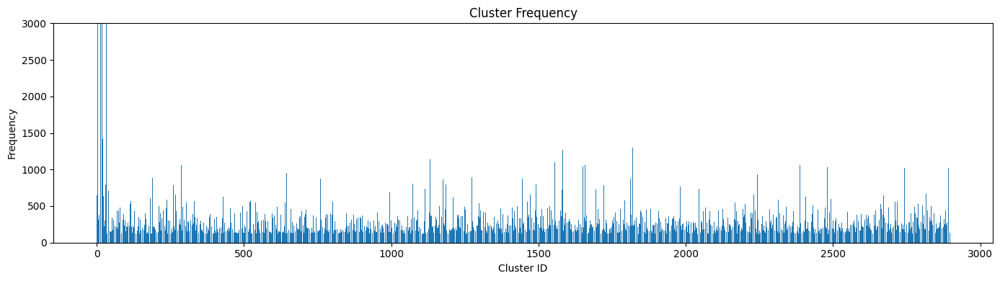

In [ ]:
freq_values = df["cluster"].value_counts().sort_index()

plt.figure(figsize=(14,4))
plt.bar(freq_values.index, freq_values.values)

plt.ylim(0, 3000)
plt.xlabel("Cluster ID")
plt.ylabel("Frequency")
plt.title("Cluster Frequency")
plt.tight_layout()
plt.show()


In [ ]:
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import fpgrowth
from mlxtend.frequent_patterns import association_rules
warnings.filterwarnings("ignore", category=DeprecationWarning)

In [ ]:
start = df.columns.get_loc("acoustic")

ohe_cols = df.columns[start:-1]

X = df[["cluster"] + list(ohe_cols)]

In [ ]:
print(X.shape)

(1605570, 138)


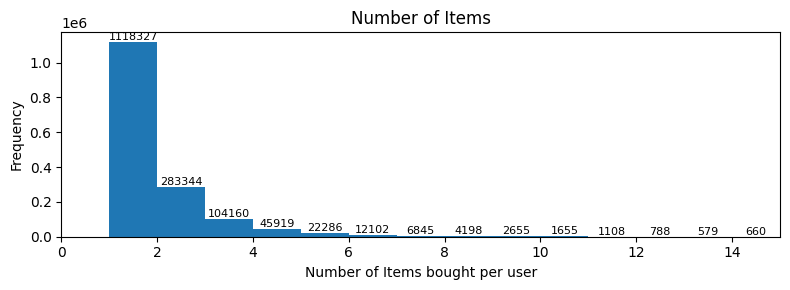

In [ ]:
freq_values = X[ohe_cols].sum(axis=1)

plt.figure(figsize=(8,3))
counts, bins, patches = plt.hist(freq_values, bins=range(0, 16))

plt.xlabel("Number of Items bought per user")
plt.ylabel("Frequency")
plt.xlim(0, 15)
plt.title("Number of Items")

# Add counts on top of each bin (optional)
for count, x in zip(counts, bins[:-1]):
    if count > 0:
        plt.text(x + 0.5, count, str(int(count)), ha='center', va='bottom', fontsize=8)

plt.tight_layout()
plt.show()


In [ ]:
col_freq = X[ohe_cols].sum().sort_values(ascending=False)
top_k = 20
top_cols = col_freq.head(top_k)
print(top_cols)

light             702373
smartphone        279933
bicycle           114209
headphone          95249
massager           85874
clocks             80953
shoes              77213
vacuum             71581
refrigerators      69022
washer             55809
tv                 38899
printer            32827
blanket            27809
sandals            25357
slipons            24736
notebook           22656
keds               22473
blender            22261
table              22237
coffee_grinder     18897
dtype: int64


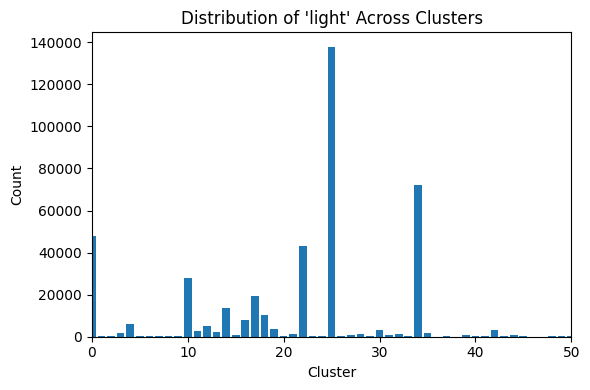

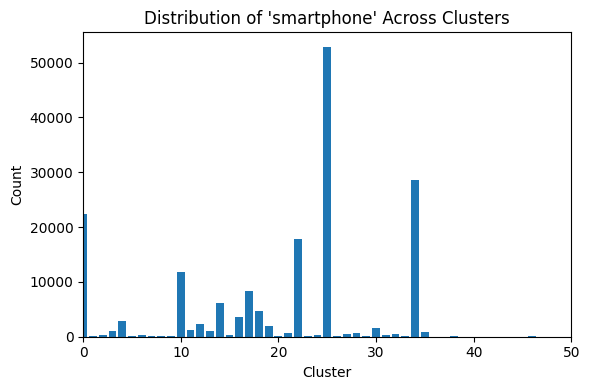

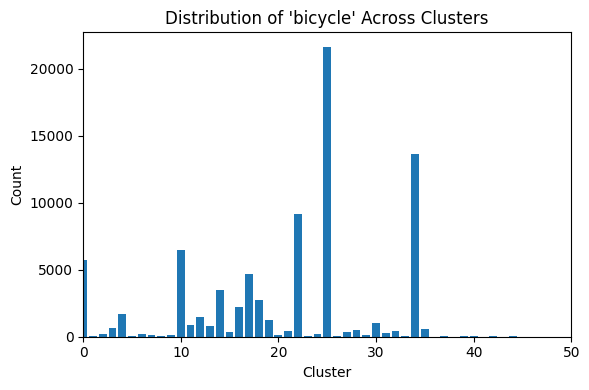

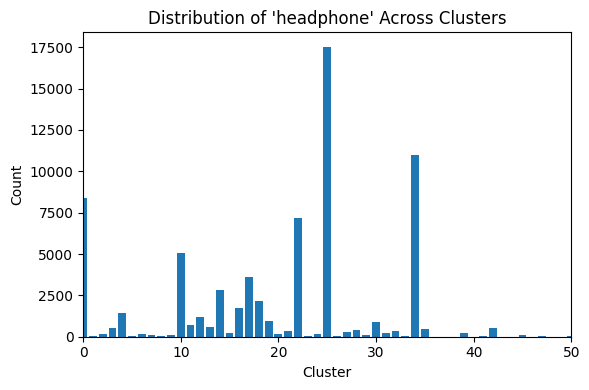

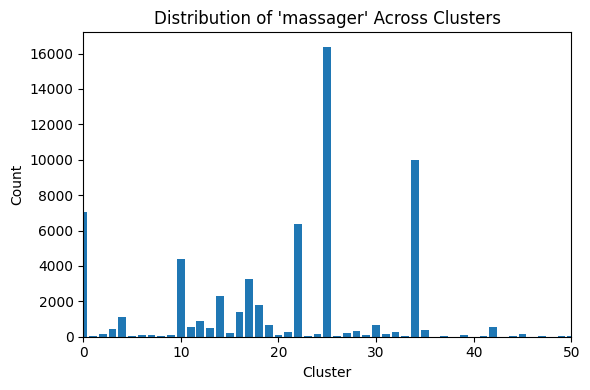

...

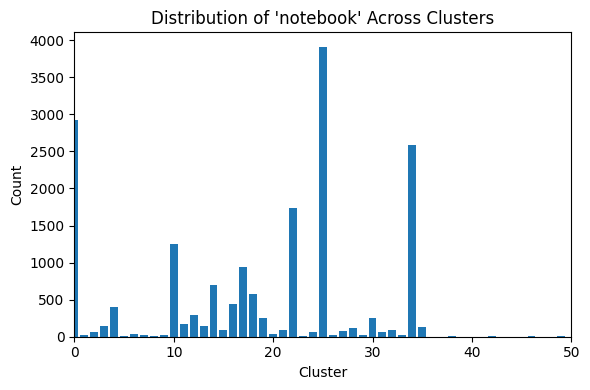

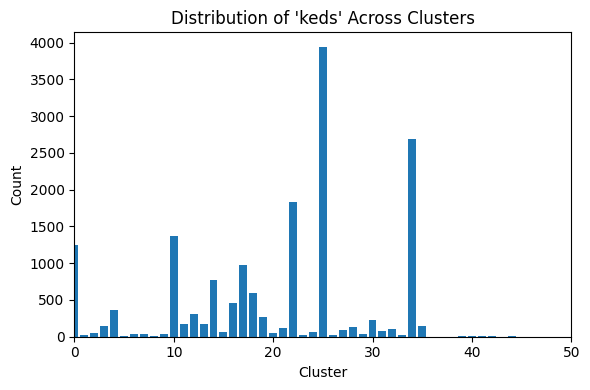

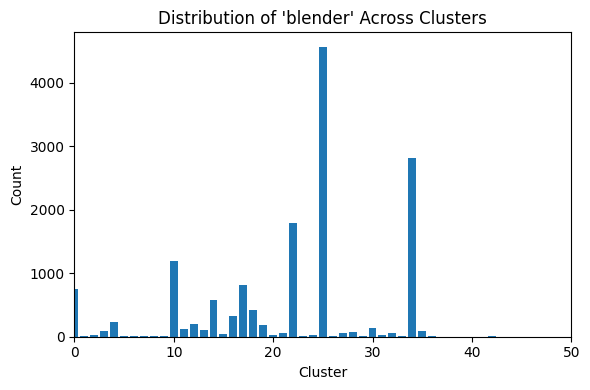

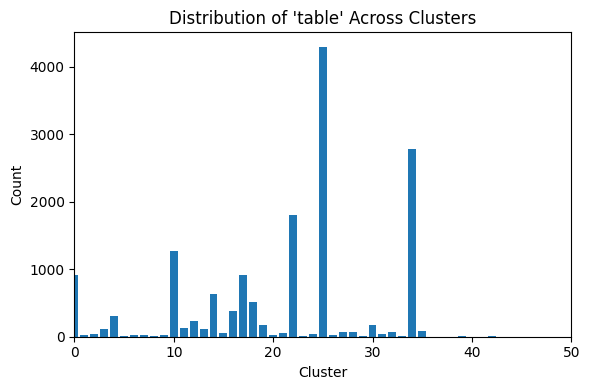

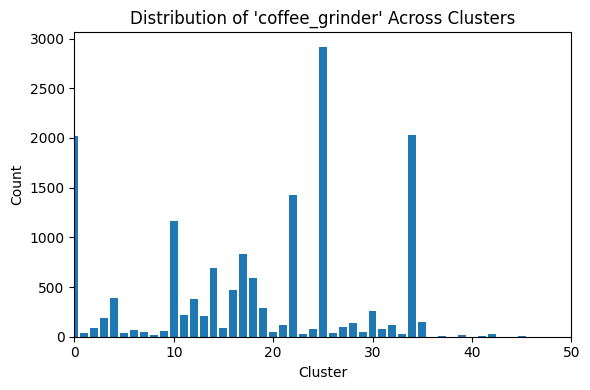

In [ ]:
clusters = X['cluster']  # your cluster assignments
df_items = X[ohe_cols].copy()
df_items["cluster"] = clusters

# Count for each item in each cluster
item_cluster_counts = df_items.groupby("cluster")[ohe_cols].sum()

top_k = 20
top_cols = col_freq.head(top_k).index.tolist()   # your top items


for item in top_cols:
    plt.figure(figsize=(6, 4))

    values = item_cluster_counts[item].values

    plt.bar(range(len(values)), values)
    plt.xlim(0, 50)

    plt.title(f"Distribution of '{item}' Across Clusters")
    plt.xlabel("Cluster")
    plt.ylabel("Count")
    plt.tight_layout()
    plt.show()


In [ ]:
df['cluster'].nunique()

2899

In [ ]:
frequent_itemsets = {}

labels_arr = df["cluster"].values # mask for labels rather than searching
ohe_data = X[ohe_cols]

unique_labels = [l for l in np.unique(labels_arr) if l != -1] # filter outliers
total = len(unique_labels)


# itemset length 1
for i, label in enumerate(unique_labels, start=1):

    mask = (labels_arr == label) # filter for label
    temp = ohe_data.iloc[mask]  # iloc faster

    # Apriori
    frequent = apriori(
        temp,
        min_support=0.02,
        use_colnames=True,
        low_memory=True
    )

    frequent_itemsets[label] = frequent

    # --- Progress print ---
    if i % 200 == 0 or i == total:
        print(f"Completed {i}/{total} clusters...")

Completed 200/2898 clusters...
Completed 400/2898 clusters...
Completed 600/2898 clusters...
Completed 800/2898 clusters...
Completed 1000/2898 clusters...
Completed 1200/2898 clusters...
Completed 1400/2898 clusters...
Completed 1600/2898 clusters...
Completed 1800/2898 clusters...
Completed 2000/2898 clusters...
Completed 2200/2898 clusters...
Completed 2400/2898 clusters...
Completed 2600/2898 clusters...
Completed 2800/2898 clusters...
Completed 2898/2898 clusters...


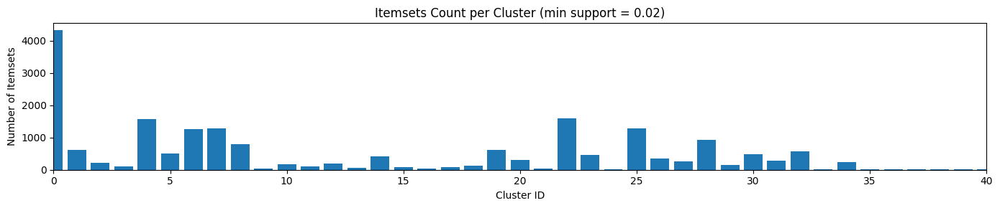

In [ ]:
cluster_ids = list(frequent_itemsets.keys())
lengths = [len(frequent_itemsets[c]) for c in cluster_ids]

plt.figure(figsize=(14,3))
plt.bar(cluster_ids, lengths)

plt.xlabel("Cluster ID")
plt.ylabel("Number of Itemsets")
plt.title("Itemsets Count per Cluster (min support = 0.02)")
plt.xlim(0, 40)
plt.tight_layout()
plt.show()

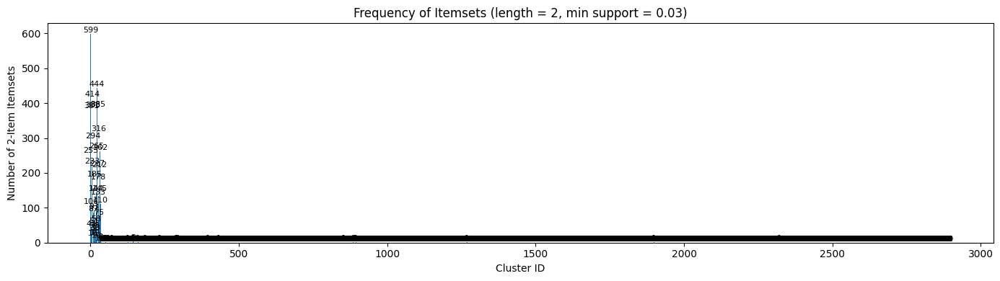

In [ ]:
cluster_ids = list(frequent_itemsets.keys())

# Count itemsets of length 2 for each cluster
lengths = [
    len(frequent_itemsets[c][frequent_itemsets[c]["itemsets"].apply(lambda x: len(x) == 2)])
    for c in cluster_ids
]

plt.figure(figsize=(14, 4))
bars = plt.bar(cluster_ids, lengths)

plt.xlabel("Cluster ID")
plt.ylabel("Number of 2-Item Itemsets")
plt.title("Frequency of Itemsets (length = 2, min support = 0.03)")
for bar in bars:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        height,
        f"{int(height)}",
        ha='center', va='bottom', fontsize=8,
        clip_on=True          # prevent labels from drawing outside plot
    )

plt.tight_layout()
plt.show()


In [ ]:
for i in range(0, 41):
  print(f"Cluster {i}")
  display(frequent_itemsets[i].sort_values("support", ascending=False).head(20))

Cluster 0


,support,itemsets
31,0.929730,(light)
58,0.459459,(smartphone)
481,0.437838,"(light, smartphone)"
6,0.416216,(bicycle)
162,0.378378,"(light, bicycle)"
53,0.351351,(shoes)
476,0.335135,"(light, shoes)"
32,0.302703,(massager)
456,0.297297,"(light, massager)"
24,0.291892,(headphone)


Cluster 1


,support,itemsets
25,0.865741,(light)
46,0.459877,(smartphone)
230,0.399691,"(light, smartphone)"
5,0.351852,(bicycle)
89,0.313272,"(light, bicycle)"
10,0.308642,(clocks)
21,0.283951,(headphone)
41,0.277778,(shoes)
26,0.270062,(massager)
130,0.262346,"(light, clocks)"


Cluster 2


,support,itemsets
23,0.807077,(light)
43,0.433867,(smartphone)
127,0.346672,"(light, smartphone)"
5,0.259899,(bicycle)
20,0.229570,(headphone)
38,0.221988,(shoes)
65,0.215670,"(light, bicycle)"
10,0.207245,(clocks)
101,0.185762,"(headphone, light)"
24,0.174389,(massager)


Cluster 3


,support,itemsets
19,0.745725,(light)
33,0.346097,(smartphone)
72,0.259603,"(light, smartphone)"
3,0.214746,(bicycle)
16,0.178439,(headphone)
7,0.169888,(clocks)
48,0.160719,"(light, bicycle)"
30,0.158364,(shoes)
20,0.135936,(massager)
59,0.126890,"(headphone, light)"


Cluster 4


,support,itemsets
27,0.922156,(light)
51,0.485030,(smartphone)
320,0.467066,"(light, smartphone)"
46,0.389222,(shoes)
5,0.365269,(bicycle)
316,0.353293,"(light, shoes)"
10,0.353293,(clocks)
112,0.329341,"(light, bicycle)"
169,0.317365,"(light, clocks)"
28,0.305389,(massager)


Cluster 5


,support,itemsets
26,0.879208,(light)
46,0.443564,(smartphone)
207,0.411881,"(light, smartphone)"
4,0.352475,(bicycle)
86,0.312871,"(light, bicycle)"
41,0.279208,(shoes)
20,0.275248,(headphone)
168,0.259406,"(headphone, light)"
203,0.247525,"(light, shoes)"
27,0.239604,(massager)


Cluster 6


,support,itemsets
28,0.911111,(light)
53,0.476190,(smartphone)
345,0.453968,"(light, smartphone)"
5,0.390476,(bicycle)
48,0.358730,(shoes)
120,0.346032,"(light, bicycle)"
23,0.320635,(headphone)
340,0.317460,"(light, shoes)"
283,0.301587,"(headphone, light)"
11,0.285714,(clocks)


Cluster 7


,support,itemsets
30,0.920530,(light)
55,0.430464,(smartphone)
334,0.403974,"(light, smartphone)"
6,0.397351,(bicycle)
123,0.344371,"(light, bicycle)"
50,0.344371,(shoes)
23,0.324503,(headphone)
329,0.311258,"(light, shoes)"
31,0.304636,(massager)
11,0.298013,(clocks)


Cluster 8


,support,itemsets
25,0.895288,(light)
46,0.447644,(smartphone)
267,0.416230,"(light, smartphone)"
5,0.374346,(bicycle)
92,0.340314,"(light, bicycle)"
22,0.329843,(headphone)
41,0.287958,(shoes)
221,0.280105,"(headphone, light)"
10,0.280105,(clocks)
262,0.264398,"(light, shoes)"


Cluster 9


,support,itemsets
9,0.614013,(light)
18,0.261560,(smartphone)
36,0.145010,"(light, smartphone)"
0,0.143333,(bicycle)
7,0.111344,(headphone)
4,0.099409,(clocks)
16,0.099012,(shoes)
10,0.097467,(massager)
26,0.079664,"(light, bicycle)"
22,0.077744,(vacuum)


Cluster 10


,support,itemsets
22,0.801698,(light)
39,0.382050,(smartphone)
109,0.303517,"(light, smartphone)"
4,0.255306,(bicycle)
58,0.210734,"(light, bicycle)"
19,0.208914,(headphone)
8,0.207398,(clocks)
34,0.205579,(shoes)
23,0.171316,(massager)
87,0.171013,"(headphone, light)"


Cluster 11


,support,itemsets
19,0.763443,(light)
34,0.369964,(smartphone)
78,0.281706,"(light, smartphone)"
3,0.225270,(bicycle)
16,0.182631,(headphone)
7,0.175263,(clocks)
50,0.173225,"(light, bicycle)"
29,0.168522,(shoes)
20,0.143596,(massager)
66,0.133563,"(headphone, light)"


Cluster 12


,support,itemsets
20,0.823031,(light)
38,0.398093,(smartphone)
114,0.334158,"(light, smartphone)"
4,0.274461,(bicycle)
60,0.230307,"(light, bicycle)"
18,0.216178,(headphone)
33,0.215825,(shoes)
8,0.212646,(clocks)
92,0.175910,"(headphone, light)"
110,0.173437,"(light, shoes)"


Cluster 13


,support,itemsets
14,0.681570,(light)
27,0.305476,(smartphone)
57,0.197049,"(light, smartphone)"
3,0.175244,(bicycle)
12,0.142086,(headphone)
7,0.129032,(clocks)
24,0.128332,(shoes)
38,0.117179,"(light, bicycle)"
15,0.115229,(massager)
20,0.091873,(refrigerators)


Cluster 14


,support,itemsets
26,0.868943,(light)
45,0.433921,(smartphone)
181,0.381057,"(light, smartphone)"
6,0.350220,(bicycle)
73,0.309471,"(light, bicycle)"
40,0.308370,(shoes)
11,0.281938,(clocks)
176,0.261013,"(light, shoes)"
22,0.250000,(headphone)
27,0.241189,(massager)


Cluster 15


,support,itemsets
18,0.731906,(light)
32,0.339723,(smartphone)
70,0.245465,"(light, smartphone)"
3,0.207313,(bicycle)
15,0.165046,(headphone)
7,0.152796,(clocks)
47,0.148307,"(light, bicycle)"
29,0.143351,(shoes)
19,0.130073,(massager)
58,0.111932,"(headphone, light)"


Cluster 16


,support,itemsets
12,0.649986,(light)
21,0.284251,(smartphone)
44,0.173790,"(light, smartphone)"
2,0.158642,(bicycle)
10,0.122904,(headphone)
6,0.112794,(clocks)
19,0.111442,(shoes)
13,0.109582,(massager)
32,0.096260,"(light, bicycle)"
17,0.085069,(refrigerators)


Cluster 17


,support,itemsets
17,0.706147,(light)
31,0.325142,(smartphone)
66,0.224076,"(light, smartphone)"
3,0.188287,(bicycle)
14,0.150491,(headphone)
7,0.143500,(clocks)
28,0.133393,(shoes)
45,0.128202,"(light, bicycle)"
18,0.123356,(massager)
55,0.096982,"(headphone, light)"


Cluster 18


,support,itemsets
19,0.780624,(light)
35,0.373699,(smartphone)
86,0.290633,"(light, smartphone)"
3,0.245196,(bicycle)
54,0.191753,"(light, bicycle)"
16,0.187950,(headphone)
7,0.181545,(clocks)
30,0.179143,(shoes)
71,0.140312,"(headphone, light)"
63,0.138311,"(light, clocks)"


Cluster 19


,support,itemsets
25,0.872117,(light)
45,0.452830,(smartphone)
244,0.410901,"(light, smartphone)"
4,0.345912,(bicycle)
40,0.314465,(shoes)
93,0.293501,"(light, bicycle)"
21,0.291405,(headphone)
239,0.268344,"(light, shoes)"
9,0.264151,(clocks)
197,0.234801,"(headphone, light)"


Cluster 20


,support,itemsets
23,0.848057,(light)
43,0.458657,(smartphone)
157,0.401413,"(light, smartphone)"
5,0.316608,(bicycle)
71,0.279152,"(light, bicycle)"
19,0.260071,(headphone)
38,0.251590,(shoes)
9,0.231802,(clocks)
123,0.218375,"(headphone, light)"
152,0.214841,"(light, shoes)"


Cluster 21


,support,itemsets
6,0.568681,(light)
14,0.234949,(smartphone)
0,0.120965,(bicycle)
26,0.111192,"(light, smartphone)"
4,0.094649,(headphone)
3,0.084559,(clocks)
7,0.083743,(massager)
12,0.082900,(shoes)
17,0.071296,(vacuum)
10,0.066357,(refrigerators)


Cluster 22


,support,itemsets
29,0.916230,(light)
53,0.429319,(smartphone)
367,0.392670,"(light, smartphone)"
6,0.382199,(bicycle)
48,0.366492,(shoes)
129,0.350785,"(light, bicycle)"
362,0.329843,"(light, shoes)"
30,0.303665,(massager)
11,0.303665,(clocks)
23,0.293194,(headphone)


Cluster 23


,support,itemsets
26,0.859843,(light)
48,0.448819,(smartphone)
205,0.401575,"(light, smartphone)"
5,0.313386,(bicycle)
21,0.288189,(headphone)
43,0.283465,(shoes)
82,0.275591,"(light, bicycle)"
10,0.266142,(clocks)
163,0.248819,"(headphone, light)"
200,0.240945,"(light, shoes)"


Cluster 24


,support,itemsets
3,0.446350,(light)
7,0.171179,(smartphone)
0,0.070123,(bicycle)
2,0.056748,(headphone)
4,0.053040,(massager)
9,0.048169,(vacuum)
1,0.047641,(clocks)
6,0.045002,(shoes)
5,0.041835,(refrigerators)
11,0.036938,"(light, smartphone)"


Cluster 25


,support,itemsets
26,0.938326,(light)
49,0.453744,(smartphone)
335,0.444934,"(light, smartphone)"
5,0.374449,(bicycle)
111,0.352423,"(light, bicycle)"
44,0.286344,(shoes)
21,0.281938,(headphone)
330,0.273128,"(light, shoes)"
272,0.273128,"(headphone, light)"
27,0.268722,(massager)


Cluster 26


,support,itemsets
24,0.840290,(light)
46,0.450998,(smartphone)
184,0.387477,"(light, smartphone)"
5,0.333938,(bicycle)
80,0.288566,"(light, bicycle)"
41,0.257713,(shoes)
10,0.248639,(clocks)
20,0.248639,(headphone)
179,0.214156,"(light, shoes)"
112,0.211434,"(light, clocks)"


Cluster 27


,support,itemsets
23,0.833236,(light)
43,0.434985,(smartphone)
145,0.373178,"(light, smartphone)"
4,0.296210,(bicycle)
66,0.260641,"(light, bicycle)"
38,0.246647,(shoes)
20,0.236735,(headphone)
8,0.227988,(clocks)
141,0.202915,"(light, shoes)"
114,0.200000,"(headphone, light)"


Cluster 28


,support,itemsets
26,0.898026,(light)
50,0.427632,(smartphone)
5,0.417763,(bicycle)
286,0.391447,"(light, smartphone)"
108,0.378289,"(light, bicycle)"
45,0.358553,(shoes)
281,0.325658,"(light, shoes)"
10,0.312500,(clocks)
162,0.273026,"(light, clocks)"
20,0.273026,(headphone)


Cluster 29


,support,itemsets
20,0.777184,(light)
37,0.392233,(smartphone)
96,0.306311,"(light, smartphone)"
4,0.252184,(bicycle)
17,0.208981,(headphone)
56,0.199515,"(light, bicycle)"
32,0.193932,(shoes)
8,0.186650,(clocks)
79,0.163350,"(headphone, light)"
21,0.159951,(massager)


Cluster 30


,support,itemsets
26,0.860553,(light)
48,0.427136,(smartphone)
211,0.379397,"(light, smartphone)"
5,0.339196,(bicycle)
43,0.320352,(shoes)
89,0.304020,"(light, bicycle)"
206,0.273869,"(light, shoes)"
10,0.267588,(clocks)
22,0.247487,(headphone)
124,0.234925,"(light, clocks)"


Cluster 31


,support,itemsets
23,0.850998,(light)
42,0.443932,(smartphone)
152,0.386329,"(light, smartphone)"
4,0.317204,(bicycle)
69,0.281874,"(light, bicycle)"
37,0.253456,(shoes)
19,0.252688,(headphone)
9,0.235791,(clocks)
147,0.212750,"(light, shoes)"
122,0.211214,"(headphone, light)"


Cluster 32


,support,itemsets
26,0.890625,(light)
48,0.488281,(smartphone)
238,0.453125,"(light, smartphone)"
43,0.328125,(shoes)
6,0.320312,(bicycle)
233,0.292969,"(light, shoes)"
91,0.277344,"(light, bicycle)"
23,0.250000,(headphone)
38,0.234375,(refrigerators)
11,0.234375,(clocks)


Cluster 33


,support,itemsets
4,0.511538,(light)
10,0.202474,(smartphone)
0,0.096854,(bicycle)
3,0.077636,(headphone)
19,0.074981,"(light, smartphone)"
5,0.070498,(massager)
2,0.066788,(clocks)
9,0.064954,(shoes)
12,0.061449,(vacuum)
7,0.054467,(refrigerators)


Cluster 34


,support,itemsets
21,0.821856,(light)
40,0.418164,(smartphone)
122,0.341317,"(light, smartphone)"
4,0.272954,(bicycle)
61,0.234032,"(light, bicycle)"
8,0.227545,(clocks)
18,0.224551,(headphone)
35,0.215070,(shoes)
73,0.194112,"(light, clocks)"
94,0.187126,"(headphone, light)"


Cluster 35


,support,itemsets
9,0.304,(light)
18,0.248,(smartphone)
25,0.200,"(light, smartphone)"
20,0.136,(vacuum)
14,0.088,(refrigerators)
21,0.072,(washer)
19,0.072,(tv)
10,0.064,(massager)
0,0.064,(bicycle)
3,0.056,(clocks)


Cluster 36


,support,itemsets
2,0.568106,(light)
6,0.076412,(washer)
0,0.069767,(bicycle)
3,0.063123,(massager)
5,0.029900,(shoes)
1,0.026578,(headphone)
4,0.026578,(refrigerators)


Cluster 37


,support,itemsets
3,0.534351,(smartphone)
6,0.145038,(washer)
4,0.099237,(tv)
1,0.053435,(notebook)
2,0.045802,(refrigerators)
0,0.038168,(clocks)
5,0.038168,(vacuum)


Cluster 38


,support,itemsets
2,0.503959,(light)
1,0.114819,(headphone)
3,0.063914,(massager)
4,0.037330,(refrigerators)
7,0.032805,(washer)
0,0.029412,(bicycle)
6,0.026018,(vacuum)
5,0.020928,(slipons)


Cluster 39


,support,itemsets
1,0.682984,(light)
0,0.051282,(bicycle)
4,0.034965,(sewing_machine)
2,0.027972,(massager)
3,0.020979,(printer)


Cluster 40


,support,itemsets
2,0.470922,(light)
4,0.093617,(refrigerators)
3,0.076596,(massager)
1,0.066667,(headphone)
7,0.065248,(washer)
6,0.039716,(vacuum)
5,0.036879,(shoes)
0,0.035461,(air_conditioner)


In [ ]:
for i in range(0, 41):
  print(f"Cluster {i}")
  freq = frequent_itemsets[i]

  # Filter ONLY 2-item itemsets
  freq_size2 = freq[freq["itemsets"].apply(lambda s: len(s) == 2)]

  # Sort by support and show top 10
  display(freq_size2.sort_values("support", ascending=False).head(20))


Cluster 0


,support,itemsets
481,0.437838,"(light, smartphone)"
162,0.378378,"(light, bicycle)"
476,0.335135,"(light, shoes)"
456,0.297297,"(light, massager)"
394,0.275676,"(headphone, light)"
263,0.254054,"(light, clocks)"
468,0.221622,"(printer, light)"
298,0.216216,"(light, coffee_grinder)"
366,0.210811,"(faucet, light)"
470,0.205405,"(light, refrigerators)"


Cluster 1


,support,itemsets
230,0.399691,"(light, smartphone)"
89,0.313272,"(light, bicycle)"
130,0.262346,"(light, clocks)"
186,0.251543,"(headphone, light)"
212,0.242284,"(light, massager)"
225,0.240741,"(light, shoes)"
221,0.197531,"(light, refrigerators)"
82,0.166667,"(bicycle, clocks)"
196,0.163580,"(headphone, smartphone)"
100,0.152778,"(bicycle, smartphone)"


Cluster 2


,support,itemsets
127,0.346672,"(light, smartphone)"
65,0.215670,"(light, bicycle)"
101,0.185762,"(headphone, light)"
123,0.169756,"(light, shoes)"
80,0.163858,"(light, clocks)"
114,0.134372,"(light, massager)"
119,0.120472,"(light, refrigerators)"
107,0.111205,"(headphone, smartphone)"
72,0.092671,"(bicycle, smartphone)"
137,0.090143,"(washer, light)"


Cluster 3


,support,itemsets
72,0.259603,"(light, smartphone)"
48,0.160719,"(light, bicycle)"
59,0.126890,"(headphone, light)"
54,0.119331,"(light, clocks)"
70,0.113631,"(light, shoes)"
65,0.093309,"(light, massager)"
68,0.082900,"(light, refrigerators)"
78,0.065304,"(vacuum, light)"
63,0.063073,"(headphone, smartphone)"
47,0.058364,"(headphone, bicycle)"


Cluster 4


,support,itemsets
320,0.467066,"(light, smartphone)"
316,0.353293,"(light, shoes)"
112,0.329341,"(light, bicycle)"
169,0.317365,"(light, clocks)"
301,0.269461,"(light, massager)"
266,0.269461,"(headphone, light)"
196,0.221557,"(light, coffee_grinder)"
312,0.215569,"(light, refrigerators)"
309,0.215569,"(printer, light)"
245,0.203593,"(faucet, light)"


Cluster 5


,support,itemsets
207,0.411881,"(light, smartphone)"
86,0.312871,"(light, bicycle)"
168,0.259406,"(headphone, light)"
203,0.247525,"(light, shoes)"
190,0.217822,"(light, massager)"
120,0.196040,"(light, clocks)"
198,0.172277,"(light, refrigerators)"
197,0.168317,"(printer, light)"
95,0.164356,"(bicycle, smartphone)"
176,0.148515,"(headphone, smartphone)"


Cluster 6


,support,itemsets
345,0.453968,"(light, smartphone)"
120,0.346032,"(light, bicycle)"
340,0.317460,"(light, shoes)"
283,0.301587,"(headphone, light)"
323,0.250794,"(light, massager)"
182,0.247619,"(light, clocks)"
334,0.193651,"(light, refrigerators)"
294,0.184127,"(headphone, smartphone)"
128,0.174603,"(shoes, bicycle)"
132,0.174603,"(bicycle, smartphone)"


Cluster 7


,support,itemsets
334,0.403974,"(light, smartphone)"
123,0.344371,"(light, bicycle)"
329,0.311258,"(light, shoes)"
312,0.284768,"(light, massager)"
272,0.284768,"(headphone, light)"
178,0.264901,"(light, clocks)"
324,0.225166,"(printer, light)"
244,0.211921,"(faucet, light)"
325,0.205298,"(light, refrigerators)"
115,0.198675,"(bicycle, clocks)"


Cluster 8


,support,itemsets
267,0.416230,"(light, smartphone)"
92,0.340314,"(light, bicycle)"
221,0.280105,"(headphone, light)"
262,0.264398,"(light, shoes)"
141,0.253927,"(light, clocks)"
249,0.204188,"(light, massager)"
258,0.185864,"(light, refrigerators)"
256,0.180628,"(printer, light)"
89,0.172775,"(headphone, bicycle)"
277,0.167539,"(vacuum, light)"


Cluster 9


,support,itemsets
36,0.145010,"(light, smartphone)"
26,0.079664,"(light, bicycle)"
30,0.055264,"(headphone, light)"
28,0.051006,"(light, clocks)"
35,0.050852,"(light, shoes)"
32,0.049175,"(light, massager)"
34,0.041078,"(light, refrigerators)"
38,0.035431,"(vacuum, light)"
39,0.028525,"(washer, light)"
31,0.028393,"(headphone, smartphone)"


Cluster 10


,support,itemsets
109,0.303517,"(light, smartphone)"
58,0.210734,"(light, bicycle)"
87,0.171013,"(headphone, light)"
70,0.164948,"(light, clocks)"
105,0.158581,"(light, shoes)"
97,0.136446,"(light, massager)"
102,0.107641,"(light, refrigerators)"
93,0.085203,"(headphone, smartphone)"
56,0.080958,"(bicycle, clocks)"
64,0.080352,"(bicycle, smartphone)"


Cluster 11


,support,itemsets
78,0.281706,"(light, smartphone)"
50,0.173225,"(light, bicycle)"
66,0.133563,"(headphone, light)"
58,0.129174,"(light, clocks)"
76,0.122590,"(light, shoes)"
71,0.105502,"(light, massager)"
74,0.089199,"(light, refrigerators)"
69,0.070230,"(headphone, smartphone)"
48,0.064744,"(bicycle, clocks)"
53,0.064273,"(bicycle, smartphone)"


Cluster 12


,support,itemsets
114,0.334158,"(light, smartphone)"
60,0.230307,"(light, bicycle)"
92,0.175910,"(headphone, light)"
110,0.173437,"(light, shoes)"
72,0.171671,"(light, clocks)"
101,0.133522,"(light, massager)"
106,0.124338,"(light, refrigerators)"
97,0.091487,"(headphone, smartphone)"
65,0.089014,"(bicycle, smartphone)"
57,0.087602,"(bicycle, clocks)"


Cluster 13


,support,itemsets
57,0.197049,"(light, smartphone)"
38,0.117179,"(light, bicycle)"
48,0.086372,"(headphone, light)"
55,0.079020,"(light, shoes)"
43,0.077569,"(light, clocks)"
51,0.068467,"(light, massager)"
53,0.058465,"(light, refrigerators)"
59,0.046012,"(vacuum, light)"
49,0.043411,"(headphone, smartphone)"
60,0.038060,"(washer, light)"


Cluster 14


,support,itemsets
181,0.381057,"(light, smartphone)"
73,0.309471,"(light, bicycle)"
176,0.261013,"(light, shoes)"
101,0.240088,"(light, clocks)"
144,0.222467,"(headphone, light)"
163,0.212555,"(light, massager)"
171,0.159692,"(light, refrigerators)"
82,0.154185,"(bicycle, smartphone)"
68,0.148678,"(bicycle, clocks)"
170,0.131057,"(printer, light)"


Cluster 15


,support,itemsets
70,0.245465,"(light, smartphone)"
47,0.148307,"(light, bicycle)"
58,0.111932,"(headphone, light)"
53,0.105199,"(light, clocks)"
68,0.096409,"(light, shoes)"
63,0.086591,"(light, massager)"
66,0.073125,"(light, refrigerators)"
73,0.059660,"(vacuum, light)"
61,0.057789,"(headphone, smartphone)"
46,0.053207,"(headphone, bicycle)"


Cluster 16


,support,itemsets
44,0.173790,"(light, smartphone)"
32,0.096260,"(light, bicycle)"
38,0.068163,"(headphone, light)"
36,0.063937,"(light, clocks)"
43,0.063024,"(light, shoes)"
40,0.060793,"(light, massager)"
42,0.049838,"(light, refrigerators)"
46,0.042129,"(vacuum, light)"
47,0.033744,"(washer, light)"
39,0.033203,"(headphone, smartphone)"


Cluster 17


,support,itemsets
66,0.224076,"(light, smartphone)"
45,0.128202,"(light, bicycle)"
55,0.096982,"(headphone, light)"
50,0.093313,"(light, clocks)"
64,0.084868,"(light, shoes)"
59,0.078707,"(light, massager)"
62,0.061955,"(light, refrigerators)"
68,0.053648,"(vacuum, light)"
57,0.050395,"(headphone, smartphone)"
69,0.045410,"(washer, light)"


Cluster 18


,support,itemsets
86,0.290633,"(light, smartphone)"
54,0.191753,"(light, bicycle)"
71,0.140312,"(headphone, light)"
63,0.138311,"(light, clocks)"
83,0.137710,"(light, shoes)"
77,0.103883,"(light, massager)"
81,0.100480,"(light, refrigerators)"
75,0.073459,"(headphone, smartphone)"
58,0.070056,"(bicycle, smartphone)"
53,0.066653,"(headphone, bicycle)"


Cluster 19


,support,itemsets
244,0.410901,"(light, smartphone)"
93,0.293501,"(light, bicycle)"
239,0.268344,"(light, shoes)"
197,0.234801,"(headphone, light)"
135,0.215933,"(light, clocks)"
233,0.190776,"(light, refrigerators)"
225,0.188679,"(light, massager)"
86,0.159329,"(bicycle, clocks)"
206,0.146751,"(headphone, smartphone)"
104,0.144654,"(bicycle, smartphone)"


Cluster 20


,support,itemsets
157,0.401413,"(light, smartphone)"
71,0.279152,"(light, bicycle)"
123,0.218375,"(headphone, light)"
152,0.214841,"(light, shoes)"
93,0.190813,"(light, clocks)"
140,0.159717,"(light, massager)"
147,0.148410,"(light, refrigerators)"
131,0.139929,"(headphone, smartphone)"
78,0.125795,"(bicycle, smartphone)"
69,0.120141,"(headphone, bicycle)"


Cluster 21


,support,itemsets
26,0.111192,"(light, smartphone)"
19,0.058072,"(light, bicycle)"
21,0.040541,"(headphone, light)"
20,0.037261,"(light, clocks)"
23,0.036181,"(light, massager)"
25,0.036023,"(light, shoes)"
24,0.030992,"(light, refrigerators)"
27,0.027594,"(vacuum, light)"
28,0.022022,"(washer, light)"
22,0.020192,"(headphone, smartphone)"


Cluster 22


,support,itemsets
367,0.392670,"(light, smartphone)"
129,0.350785,"(light, bicycle)"
362,0.329843,"(light, shoes)"
346,0.282723,"(light, massager)"
302,0.277487,"(headphone, light)"
206,0.267016,"(light, clocks)"
356,0.219895,"(light, refrigerators)"
380,0.209424,"(vacuum, light)"
126,0.172775,"(headphone, bicycle)"
141,0.167539,"(bicycle, smartphone)"


Cluster 23


,support,itemsets
205,0.401575,"(light, smartphone)"
82,0.275591,"(light, bicycle)"
163,0.248819,"(headphone, light)"
200,0.240945,"(light, shoes)"
114,0.237795,"(light, clocks)"
188,0.187402,"(light, massager)"
195,0.182677,"(light, refrigerators)"
173,0.146457,"(headphone, smartphone)"
76,0.133858,"(bicycle, clocks)"
90,0.130709,"(bicycle, smartphone)"


Cluster 24


,support,itemsets
11,0.036938,"(light, smartphone)"


Cluster 25


,support,itemsets
335,0.444934,"(light, smartphone)"
111,0.352423,"(light, bicycle)"
330,0.273128,"(light, shoes)"
272,0.273128,"(headphone, light)"
314,0.251101,"(light, massager)"
184,0.220264,"(light, clocks)"
247,0.202643,"(faucet, light)"
325,0.171806,"(light, refrigerators)"
349,0.171806,"(washer, light)"
324,0.154185,"(printer, light)"


Cluster 26


,support,itemsets
184,0.387477,"(light, smartphone)"
80,0.288566,"(light, bicycle)"
179,0.214156,"(light, shoes)"
112,0.211434,"(light, clocks)"
148,0.203267,"(headphone, light)"
169,0.170599,"(light, massager)"
175,0.155172,"(light, refrigerators)"
73,0.128857,"(bicycle, clocks)"
89,0.126134,"(bicycle, smartphone)"
156,0.121597,"(headphone, smartphone)"


Cluster 27


,support,itemsets
145,0.373178,"(light, smartphone)"
66,0.260641,"(light, bicycle)"
141,0.202915,"(light, shoes)"
114,0.200000,"(headphone, light)"
89,0.193586,"(light, clocks)"
128,0.153936,"(light, massager)"
136,0.138776,"(light, refrigerators)"
121,0.108455,"(headphone, smartphone)"
74,0.107289,"(bicycle, smartphone)"
62,0.099125,"(bicycle, clocks)"


Cluster 28


,support,itemsets
286,0.391447,"(light, smartphone)"
108,0.378289,"(light, bicycle)"
281,0.325658,"(light, shoes)"
162,0.273026,"(light, clocks)"
233,0.250000,"(headphone, light)"
266,0.240132,"(light, massager)"
98,0.210526,"(bicycle, clocks)"
116,0.184211,"(shoes, bicycle)"
276,0.180921,"(light, refrigerators)"
120,0.177632,"(bicycle, smartphone)"


Cluster 29


,support,itemsets
96,0.306311,"(light, smartphone)"
56,0.199515,"(light, bicycle)"
79,0.163350,"(headphone, light)"
93,0.145388,"(light, shoes)"
66,0.143689,"(light, clocks)"
88,0.121117,"(light, massager)"
91,0.109223,"(light, refrigerators)"
84,0.087864,"(headphone, smartphone)"
60,0.075971,"(bicycle, smartphone)"
55,0.070631,"(headphone, bicycle)"


Cluster 30


,support,itemsets
211,0.379397,"(light, smartphone)"
89,0.304020,"(light, bicycle)"
206,0.273869,"(light, shoes)"
124,0.234925,"(light, clocks)"
171,0.217337,"(headphone, light)"
193,0.190955,"(light, massager)"
202,0.169598,"(light, refrigerators)"
95,0.140704,"(shoes, bicycle)"
259,0.135678,"(shoes, smartphone)"
220,0.130653,"(vacuum, light)"


Cluster 31


,support,itemsets
152,0.386329,"(light, smartphone)"
69,0.281874,"(light, bicycle)"
147,0.212750,"(light, shoes)"
122,0.211214,"(headphone, light)"
93,0.205069,"(light, clocks)"
136,0.172043,"(light, massager)"
143,0.149002,"(light, refrigerators)"
64,0.115975,"(bicycle, clocks)"
128,0.114439,"(headphone, smartphone)"
99,0.110599,"(smartphone, clocks)"


Cluster 32


,support,itemsets
238,0.453125,"(light, smartphone)"
233,0.292969,"(light, shoes)"
91,0.277344,"(light, bicycle)"
228,0.210938,"(light, refrigerators)"
196,0.210938,"(headphone, light)"
129,0.191406,"(light, clocks)"
220,0.171875,"(light, massager)"
251,0.164062,"(vacuum, light)"
227,0.140625,"(printer, light)"
98,0.132812,"(shoes, bicycle)"


Cluster 33


,support,itemsets
19,0.074981,"(light, smartphone)"
14,0.037027,"(light, bicycle)"
16,0.025329,"(headphone, light)"
17,0.024238,"(light, massager)"
15,0.022666,"(light, clocks)"
18,0.021894,"(light, shoes)"


Cluster 34


,support,itemsets
122,0.341317,"(light, smartphone)"
61,0.234032,"(light, bicycle)"
73,0.194112,"(light, clocks)"
94,0.187126,"(headphone, light)"
117,0.177645,"(light, shoes)"
107,0.150200,"(light, massager)"
113,0.134232,"(light, refrigerators)"
100,0.108283,"(headphone, smartphone)"
79,0.100798,"(smartphone, clocks)"
67,0.100299,"(bicycle, smartphone)"


Cluster 35


,support,itemsets
25,0.200,"(light, smartphone)"
23,0.040,"(headphone, bicycle)"
24,0.024,"(vacuum, blender)"
26,0.024,"(vacuum, smartphone)"


Cluster 36


,support,itemsets


Cluster 37


,support,itemsets


Cluster 38


,support,itemsets


Cluster 39


,support,itemsets


Cluster 40


,support,itemsets


In [ ]:
pairs = list(zip(cluster_ids, lengths))
pairs_sorted = sorted(pairs, key=lambda x: x[1], reverse=True)

top_20 = pairs_sorted[:20]

print("Top 20 clusters by number of itemsets:")
for cid, count in top_20:
    print(f"Cluster {cid}: {count} itemsets")

Top 20 clusters by number of itemsets:
Cluster 0: 599 itemsets
Cluster 22: 444 itemsets
Cluster 6: 414 itemsets
Cluster 25: 385 itemsets
Cluster 7: 383 itemsets
Cluster 4: 381 itemsets
Cluster 28: 316 itemsets
Cluster 8: 294 itemsets
Cluster 19: 265 itemsets
Cluster 32: 262 itemsets
Cluster 1: 253 itemsets
Cluster 5: 223 itemsets
Cluster 23: 217 itemsets
Cluster 30: 212 itemsets
Cluster 14: 185 itemsets
Cluster 26: 178 itemsets
Cluster 31: 145 itemsets
Cluster 20: 144 itemsets
Cluster 27: 133 itemsets
Cluster 34: 110 itemsets


In [ ]:
rules_dict = {}

for label, itemset_df in frequent_itemsets.items():

    # --- skip clusters with no frequent itemsets ---
    if itemset_df.empty:
        rules_dict[label] = itemset_df
        continue

    # --- association rules ---
    try:
        rules = association_rules(
            itemset_df,
            metric="lift",
            min_threshold=1.0
        )
    except ValueError:
        # ignore if itemset size is less than 2
        rules = pd.DataFrame()

    rules_dict[label] = rules

In [ ]:
skipped = 0

for i in range(41):

    # Skip if cluster missing or rules table empty
    if i not in rules_dict or rules_dict[i].empty:
        skipped += 1
        continue

    rules = rules_dict[i]

    # Filter rules with antecedent size 2
    rules_size2 = rules[rules["antecedents"].apply(lambda x: len(x) == 2)]

    # Skip if no matching rules
    if rules_size2.empty:
        skipped += 1
        continue

    print(f"Cluster {i}")
    display(
        rules_size2
        .sort_values("lift", ascending=False)
        .head(20)
    )

print(f"\nTotal clusters skipped: {skipped}")


Cluster 0


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
976,"(acoustic, light)",(bicycle),0.027027,0.416216,0.021622,0.800000,1.922078,1.0,0.010373,2.918919,0.493056,0.051282,0.657407,0.425974
977,"(light, bicycle)",(acoustic),0.378378,0.027027,0.021622,0.057143,2.114286,1.0,0.011395,1.031941,0.847826,0.056338,0.030952,0.428571
978,"(acoustic, bicycle)",(light),0.021622,0.929730,0.021622,1.000000,1.075581,1.0,0.001519,inf,0.071823,0.023256,1.000000,0.511628
982,"(headphone, acoustic)",(light),0.021622,0.929730,0.021622,1.000000,1.075581,1.0,0.001519,inf,0.071823,0.023256,1.000000,0.511628
983,"(headphone, light)",(acoustic),0.275676,0.027027,0.021622,0.078431,2.901961,1.0,0.014171,1.055779,0.904851,0.076923,0.052832,0.439216
984,"(acoustic, light)",(headphone),0.027027,0.291892,0.021622,0.800000,2.740741,1.0,0.013733,3.540541,0.652778,0.072727,0.717557,0.437037
988,"(coffee_grinder, bag)",(bed),0.048649,0.081081,0.021622,0.444444,5.481481,1.0,0.017677,1.654054,0.859375,0.200000,0.395425,0.355556
989,"(coffee_grinder, bed)",(bag),0.037838,0.113514,0.021622,0.571429,5.034014,1.0,0.017327,2.068468,0.832865,0.166667,0.516551,0.380952
990,"(bag, bed)",(coffee_grinder),0.027027,0.221622,0.021622,0.800000,3.609756,1.0,0.015632,3.891892,0.743056,0.095238,0.743056,0.448780
994,"(faucet, bag)",(bed),0.054054,0.081081,0.027027,0.500000,6.166667,1.0,0.022644,1.837838,0.885714,0.250000,0.455882,0.416667


Cluster 1


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
334,"(bicycle, clocks)",(bag),0.166667,0.075617,0.020062,0.120370,1.591837,1.0,0.007459,1.050877,0.446154,0.090278,0.048414,0.192838
335,"(bag, clocks)",(bicycle),0.030864,0.351852,0.020062,0.650000,1.847368,1.0,0.009202,1.851852,0.473297,0.055319,0.460000,0.353509
336,"(bicycle, bag)",(clocks),0.035494,0.308642,0.020062,0.565217,1.831304,1.0,0.009107,1.590123,0.470646,0.061905,0.371118,0.315109
340,"(light, bicycle)",(bag),0.313272,0.075617,0.026235,0.083744,1.107470,1.0,0.002546,1.008869,0.141309,0.072340,0.008791,0.215341
341,"(light, bag)",(bicycle),0.063272,0.351852,0.026235,0.414634,1.178434,1.0,0.003972,1.107253,0.161644,0.067460,0.096864,0.244598
344,"(light, clocks)",(bag),0.262346,0.075617,0.023148,0.088235,1.166867,1.0,0.003310,1.013839,0.193863,0.073529,0.013650,0.197179
345,"(light, bag)",(clocks),0.063272,0.308642,0.023148,0.365854,1.185366,1.0,0.003620,1.090218,0.166941,0.066372,0.082753,0.220427
348,"(headphone, light)",(bag),0.251543,0.075617,0.020062,0.079755,1.054714,1.0,0.001041,1.004496,0.069310,0.065327,0.004476,0.172530
349,"(headphone, bag)",(light),0.020062,0.865741,0.020062,1.000000,1.155080,1.0,0.002693,inf,0.137008,0.023173,1.000000,0.511586
350,"(light, bag)",(headphone),0.063272,0.283951,0.020062,0.317073,1.116649,1.0,0.002096,1.048501,0.111519,0.061321,0.046257,0.193863


Cluster 2


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
102,"(headphone, bicycle)",(clocks),0.089301,0.207245,0.028222,0.316038,1.524946,1.0,0.009715,1.159062,0.377994,0.105181,0.137234,0.226108
103,"(headphone, clocks)",(bicycle),0.058972,0.259899,0.028222,0.478571,1.841375,1.0,0.012896,1.419372,0.485562,0.097101,0.295463,0.293581
104,"(bicycle, clocks)",(headphone),0.085088,0.229570,0.028222,0.331683,1.444800,1.0,0.008689,1.152791,0.336494,0.098529,0.132540,0.227309
108,"(light, bicycle)",(clocks),0.215670,0.207245,0.070767,0.328125,1.583270,1.0,0.026070,1.179914,0.469695,0.200957,0.152481,0.334794
109,"(light, clocks)",(bicycle),0.163858,0.259899,0.070767,0.431877,1.661710,1.0,0.028180,1.302712,0.476247,0.200477,0.232371,0.352081
110,"(bicycle, clocks)",(light),0.085088,0.807077,0.070767,0.831683,1.030488,1.0,0.002094,1.146192,0.032338,0.086154,0.127546,0.459683
114,"(shoes, bicycle)",(clocks),0.077928,0.207245,0.025274,0.324324,1.564931,1.0,0.009124,1.173277,0.391503,0.097245,0.147686,0.223138
115,"(shoes, clocks)",(bicycle),0.057709,0.259899,0.025274,0.437956,1.685102,1.0,0.010275,1.316803,0.431463,0.086455,0.240585,0.267600
116,"(bicycle, clocks)",(shoes),0.085088,0.221988,0.025274,0.297030,1.338043,1.0,0.006385,1.106749,0.276136,0.089686,0.096453,0.205441
120,"(bicycle, smartphone)",(clocks),0.092671,0.207245,0.030329,0.327273,1.579157,1.0,0.011123,1.178419,0.404209,0.112500,0.151406,0.236807


Cluster 3


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
34,"(light, bicycle)",(clocks),0.160719,0.169888,0.039033,0.242868,1.429574,1.0,0.011729,1.096390,0.358034,0.133872,0.087916,0.236314
35,"(light, clocks)",(bicycle),0.119331,0.214746,0.039033,0.327103,1.523208,1.0,0.013408,1.166975,0.390034,0.132297,0.143083,0.254434
38,"(headphone, light)",(bicycle),0.126890,0.214746,0.042379,0.333984,1.555253,1.0,0.015130,1.179032,0.408904,0.141615,0.151847,0.265665
39,"(light, bicycle)",(headphone),0.160719,0.178439,0.042379,0.263685,1.477737,1.0,0.013701,1.115775,0.385198,0.142797,0.103762,0.250593
42,"(shoes, light)",(bicycle),0.113631,0.214746,0.030359,0.267176,1.244147,1.0,0.005958,1.071545,0.221394,0.101871,0.066768,0.204274
43,"(light, bicycle)",(shoes),0.160719,0.158364,0.030359,0.188897,1.192803,1.0,0.004907,1.037644,0.192592,0.105150,0.036278,0.190302
46,"(bicycle, smartphone)",(light),0.056753,0.745725,0.046716,0.823144,1.103817,1.0,0.004394,1.437753,0.099712,0.061813,0.304470,0.442895
48,"(headphone, light)",(clocks),0.126890,0.169888,0.026270,0.207031,1.218630,1.0,0.004713,1.046840,0.205480,0.097114,0.044744,0.180831
49,"(light, clocks)",(headphone),0.119331,0.178439,0.026270,0.220145,1.233731,1.0,0.004977,1.053480,0.215121,0.096759,0.050765,0.183684
52,"(light, shoes)",(clocks),0.113631,0.169888,0.023296,0.205016,1.206770,1.0,0.003992,1.044187,0.193308,0.089524,0.042317,0.171071


Cluster 4


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
574,"(acoustic, light)",(clocks),0.029940,0.353293,0.029940,1.000000,2.830508,1.0,0.019362,inf,0.666667,0.084746,1.000000,0.542373
575,"(acoustic, clocks)",(light),0.029940,0.922156,0.029940,1.000000,1.084416,1.0,0.002331,inf,0.080247,0.032468,1.000000,0.516234
576,"(light, clocks)",(acoustic),0.317365,0.029940,0.029940,0.094340,3.150943,1.0,0.020438,1.071108,1.000000,0.094340,0.066387,0.547170
580,"(acoustic, shoes)",(clocks),0.023952,0.353293,0.023952,1.000000,2.830508,1.0,0.015490,inf,0.662577,0.067797,1.000000,0.533898
581,"(acoustic, clocks)",(shoes),0.029940,0.389222,0.023952,0.800000,2.055385,1.0,0.012299,3.053892,0.529321,0.060606,0.672549,0.430769
582,"(shoes, clocks)",(acoustic),0.191617,0.029940,0.023952,0.125000,4.175000,1.0,0.018215,1.108640,0.940741,0.121212,0.097994,0.462500
586,"(acoustic, light)",(shoes),0.029940,0.389222,0.023952,0.800000,2.055385,1.0,0.012299,3.053892,0.529321,0.060606,0.672549,0.430769
587,"(shoes, light)",(acoustic),0.353293,0.029940,0.023952,0.067797,2.264407,1.0,0.013374,1.040610,0.863426,0.066667,0.039025,0.433898
588,"(acoustic, shoes)",(light),0.023952,0.922156,0.023952,1.000000,1.084416,1.0,0.001865,inf,0.079755,0.025974,1.000000,0.512987
592,"(bicycle, clocks)",(bag),0.197605,0.101796,0.035928,0.181818,1.786096,1.0,0.015813,1.097804,0.548507,0.136364,0.089091,0.267380


Cluster 5


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
312,"(light, bicycle)",(bag),0.312871,0.073267,0.023762,0.075949,1.036606,1.0,0.000839,1.002902,0.051393,0.065574,0.002894,0.200137
313,"(light, bag)",(bicycle),0.061386,0.352475,0.023762,0.387097,1.098224,1.0,0.002125,1.056488,0.095288,0.060914,0.053467,0.227256
316,"(headphone, light)",(bag),0.259406,0.073267,0.021782,0.083969,1.146070,1.0,0.002776,1.011683,0.172095,0.070064,0.011548,0.190633
317,"(headphone, bag)",(light),0.023762,0.879208,0.021782,0.916667,1.042605,1.0,0.000890,1.449505,0.041859,0.024719,0.310109,0.470721
318,"(light, bag)",(headphone),0.061386,0.275248,0.021782,0.354839,1.289162,1.0,0.004886,1.123366,0.238972,0.069182,0.109818,0.216988
322,"(light, massager)",(bag),0.217822,0.073267,0.021782,0.100000,1.364865,1.0,0.005823,1.029703,0.341772,0.080882,0.028846,0.198649
323,"(light, bag)",(massager),0.061386,0.239604,0.021782,0.354839,1.480938,1.0,0.007074,1.178614,0.345992,0.078014,0.151546,0.222874
324,"(massager, bag)",(light),0.021782,0.879208,0.021782,1.000000,1.137387,1.0,0.002631,inf,0.123482,0.024775,1.000000,0.512387
328,"(light, shoes)",(bag),0.247525,0.073267,0.029703,0.120000,1.637838,1.0,0.011567,1.053105,0.517544,0.102041,0.050427,0.262703
329,"(shoes, bag)",(light),0.031683,0.879208,0.029703,0.937500,1.066301,1.0,0.001847,1.932673,0.064213,0.033708,0.482582,0.485642


Cluster 6


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
602,"(headphone, acoustic)",(light),0.022222,0.911111,0.022222,1.000000,1.097561,1.0,0.001975,inf,0.090909,0.024390,1.000000,0.512195
603,"(headphone, light)",(acoustic),0.301587,0.044444,0.022222,0.073684,1.657895,1.0,0.008818,1.031566,0.568182,0.068627,0.030600,0.286842
604,"(acoustic, light)",(headphone),0.044444,0.320635,0.022222,0.500000,1.559406,1.0,0.007972,1.358730,0.375415,0.064815,0.264019,0.284653
608,"(acoustic, light)",(shoes),0.044444,0.358730,0.022222,0.500000,1.393805,1.0,0.006279,1.282540,0.295681,0.058333,0.220297,0.280973
609,"(shoes, light)",(acoustic),0.317460,0.044444,0.022222,0.070000,1.575000,1.0,0.008113,1.027479,0.534884,0.065421,0.026744,0.285000
610,"(acoustic, shoes)",(light),0.022222,0.911111,0.022222,1.000000,1.097561,1.0,0.001975,inf,0.090909,0.024390,1.000000,0.512195
614,"(air_heater, light)",(smartphone),0.038095,0.476190,0.028571,0.750000,1.575000,1.0,0.010431,2.095238,0.379538,0.058824,0.522727,0.405000
615,"(air_heater, smartphone)",(light),0.028571,0.911111,0.028571,1.000000,1.097561,1.0,0.002540,inf,0.091503,0.031359,1.000000,0.515679
616,"(light, smartphone)",(air_heater),0.453968,0.044444,0.028571,0.062937,1.416084,1.0,0.008395,1.019735,0.538114,0.060811,0.019353,0.352897
620,"(light, bicycle)",(bag),0.346032,0.088889,0.031746,0.091743,1.032110,1.0,0.000988,1.003143,0.047573,0.078740,0.003133,0.224443


Cluster 7


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
602,"(headphone, acoustic)",(bicycle),0.039735,0.397351,0.026490,0.666667,1.677778,1.0,0.010701,1.807947,0.420690,0.064516,0.446886,0.366667
603,"(headphone, bicycle)",(acoustic),0.192053,0.059603,0.026490,0.137931,2.314176,1.0,0.015043,1.090861,0.702869,0.117647,0.083293,0.291188
604,"(acoustic, bicycle)",(headphone),0.039735,0.324503,0.026490,0.666667,2.054422,1.0,0.013596,2.026490,0.534483,0.078431,0.506536,0.374150
608,"(acoustic, light)",(bicycle),0.052980,0.397351,0.039735,0.750000,1.887500,1.0,0.018683,2.410596,0.496503,0.096774,0.585165,0.425000
609,"(light, bicycle)",(acoustic),0.344371,0.059603,0.039735,0.115385,1.935897,1.0,0.019210,1.063058,0.737374,0.109091,0.059317,0.391026
610,"(acoustic, bicycle)",(light),0.039735,0.920530,0.039735,1.000000,1.086331,1.0,0.003158,inf,0.082759,0.043165,1.000000,0.521583
614,"(headphone, light)",(acoustic),0.284768,0.059603,0.033113,0.116279,1.950904,1.0,0.016140,1.064134,0.681481,0.106383,0.060269,0.335917
615,"(acoustic, light)",(headphone),0.052980,0.324503,0.033113,0.625000,1.926020,1.0,0.015920,1.801325,0.507692,0.096154,0.444853,0.363520
618,"(headphone, acoustic)",(shoes),0.039735,0.344371,0.026490,0.666667,1.935897,1.0,0.012806,1.966887,0.503448,0.074074,0.491582,0.371795
619,"(headphone, shoes)",(acoustic),0.139073,0.059603,0.026490,0.190476,3.195767,1.0,0.018201,1.161667,0.798077,0.153846,0.139168,0.317460


Cluster 8


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
412,"(bicycle, clocks)",(bag),0.154450,0.078534,0.023560,0.152542,1.942373,1.0,0.011431,1.087330,0.573787,0.112500,0.080316,0.226271
413,"(bag, clocks)",(bicycle),0.031414,0.374346,0.023560,0.750000,2.003497,1.0,0.011801,2.502618,0.517117,0.061644,0.600418,0.406469
414,"(bicycle, bag)",(clocks),0.031414,0.280105,0.023560,0.750000,2.677570,1.0,0.014761,2.879581,0.646847,0.081818,0.652727,0.417056
418,"(light, bag)",(bicycle),0.057592,0.374346,0.026178,0.454545,1.214240,1.0,0.004619,1.147033,0.187222,0.064516,0.128186,0.262238
420,"(light, clocks)",(bag),0.253927,0.078534,0.026178,0.103093,1.312715,1.0,0.006236,1.027382,0.319298,0.085470,0.026652,0.218213
421,"(light, bag)",(clocks),0.057592,0.280105,0.026178,0.454545,1.622770,1.0,0.010046,1.319808,0.407222,0.084034,0.242314,0.274002
424,"(printer, coffee_grinder)",(bag),0.089005,0.078534,0.020942,0.235294,2.996078,1.0,0.013952,1.204994,0.731322,0.142857,0.170120,0.250980
425,"(printer, bag)",(coffee_grinder),0.036649,0.154450,0.020942,0.571429,3.699758,1.0,0.015282,1.972949,0.757473,0.123077,0.493145,0.353511
426,"(coffee_grinder, bag)",(printer),0.020942,0.206806,0.020942,1.000000,4.835443,1.0,0.016611,inf,0.810160,0.101266,1.000000,0.550633
430,"(light, bag)",(headphone),0.057592,0.329843,0.020942,0.363636,1.102453,1.0,0.001946,1.053104,0.098611,0.057143,0.050426,0.213564


Cluster 9


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski


Cluster 10


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
78,"(headphone, bicycle)",(clocks),0.078532,0.207398,0.028199,0.359073,1.731322,1.0,0.011911,1.236649,0.458406,0.109412,0.191363,0.247519
79,"(headphone, clocks)",(bicycle),0.057307,0.255306,0.028199,0.492063,1.927346,1.0,0.013568,1.466116,0.510402,0.099147,0.317926,0.301257
80,"(bicycle, clocks)",(headphone),0.080958,0.208914,0.028199,0.348315,1.667259,1.0,0.011286,1.213907,0.435468,0.107764,0.176214,0.241646
84,"(light, bicycle)",(clocks),0.210734,0.207398,0.068830,0.326619,1.574837,1.0,0.025124,1.177047,0.462472,0.197049,0.150416,0.329245
85,"(light, clocks)",(bicycle),0.164948,0.255306,0.068830,0.417279,1.634427,1.0,0.026717,1.277960,0.464839,0.195858,0.217503,0.343438
86,"(bicycle, clocks)",(light),0.080958,0.801698,0.068830,0.850187,1.060483,1.0,0.003926,1.323666,0.062058,0.084575,0.244522,0.468021
90,"(shoes, bicycle)",(clocks),0.068526,0.207398,0.024257,0.353982,1.706774,1.0,0.010045,1.226904,0.444564,0.096386,0.184940,0.235471
91,"(shoes, clocks)",(bicycle),0.052759,0.255306,0.024257,0.459770,1.800857,1.0,0.010787,1.378476,0.469478,0.085470,0.274561,0.277391
92,"(bicycle, clocks)",(shoes),0.080958,0.205579,0.024257,0.299625,1.457470,1.0,0.007614,1.134280,0.341529,0.092486,0.118384,0.208810
96,"(bicycle, smartphone)",(clocks),0.080352,0.207398,0.024560,0.305660,1.473784,1.0,0.007896,1.141519,0.349562,0.093318,0.123974,0.212041


Cluster 11


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
40,"(light, bicycle)",(clocks),0.173225,0.175263,0.049538,0.285973,1.631682,1.0,0.019178,1.155051,0.468248,0.165705,0.134237,0.284310
41,"(light, clocks)",(bicycle),0.129174,0.225270,0.049538,0.383495,1.702377,1.0,0.020438,1.256648,0.473787,0.162468,0.204232,0.301699
42,"(bicycle, clocks)",(light),0.064744,0.763443,0.049538,0.765133,1.002214,1.0,0.000109,1.007198,0.002363,0.063620,0.007147,0.415010
46,"(headphone, light)",(bicycle),0.133563,0.225270,0.044364,0.332160,1.474493,1.0,0.014276,1.160052,0.371407,0.141077,0.137970,0.264549
47,"(light, bicycle)",(headphone),0.173225,0.182631,0.044364,0.256109,1.402332,1.0,0.012728,1.098775,0.347013,0.142426,0.089896,0.249514
50,"(headphone, smartphone)",(bicycle),0.070230,0.225270,0.021790,0.310268,1.377313,1.0,0.005969,1.123233,0.294641,0.079611,0.109712,0.203499
51,"(bicycle, smartphone)",(headphone),0.064273,0.182631,0.021790,0.339024,1.856340,1.0,0.010052,1.236611,0.492992,0.096797,0.191338,0.229169
54,"(shoes, light)",(bicycle),0.122590,0.225270,0.034018,0.277494,1.231824,1.0,0.006402,1.072281,0.214490,0.108392,0.067408,0.214251
55,"(light, bicycle)",(shoes),0.173225,0.168522,0.034018,0.196380,1.165310,1.0,0.004826,1.034666,0.171582,0.110545,0.033505,0.199120
58,"(bicycle, smartphone)",(light),0.064273,0.763443,0.054554,0.848780,1.111780,1.0,0.005485,1.564332,0.107448,0.070560,0.360749,0.460119


Cluster 12


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
78,"(headphone, bicycle)",(clocks),0.081597,0.212646,0.026846,0.329004,1.547195,1.0,0.009494,1.173412,0.385091,0.100396,0.147784,0.227625
79,"(headphone, clocks)",(bicycle),0.056870,0.274461,0.026846,0.472050,1.719913,1.0,0.011237,1.374256,0.443815,0.088167,0.272333,0.284931
80,"(bicycle, clocks)",(headphone),0.087602,0.216178,0.026846,0.306452,1.417589,1.0,0.007908,1.130162,0.322860,0.096939,0.115171,0.215317
84,"(light, bicycle)",(clocks),0.230307,0.212646,0.073119,0.317485,1.493022,1.0,0.024145,1.153607,0.429025,0.197708,0.133153,0.330669
85,"(light, clocks)",(bicycle),0.171671,0.274461,0.073119,0.425926,1.551861,1.0,0.026002,1.263842,0.429313,0.196023,0.208762,0.346168
86,"(bicycle, clocks)",(light),0.087602,0.823031,0.073119,0.834677,1.014151,1.0,0.001020,1.070448,0.015293,0.087305,0.065812,0.461759
90,"(shoes, bicycle)",(clocks),0.077711,0.212646,0.029671,0.381818,1.795560,1.0,0.013147,1.273661,0.480403,0.113821,0.214862,0.260677
91,"(shoes, clocks)",(bicycle),0.061816,0.274461,0.029671,0.480000,1.748880,1.0,0.012705,1.395267,0.456419,0.096774,0.283291,0.294054
92,"(bicycle, clocks)",(shoes),0.087602,0.215825,0.029671,0.338710,1.569373,1.0,0.010765,1.185826,0.397637,0.108387,0.156706,0.238095
96,"(bicycle, smartphone)",(clocks),0.089014,0.212646,0.028965,0.325397,1.530230,1.0,0.010036,1.167137,0.380361,0.106218,0.143203,0.230805


Cluster 13


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
14,"(light, bicycle)",(clocks),0.117179,0.129032,0.020905,0.178404,1.382629,1.0,0.005785,1.060092,0.313473,0.092786,0.056686,0.170210
15,"(light, clocks)",(bicycle),0.077569,0.175244,0.020905,0.269504,1.537878,1.0,0.007312,1.129035,0.379165,0.090144,0.114288,0.194398
18,"(headphone, light)",(bicycle),0.086372,0.175244,0.022756,0.263463,1.503406,1.0,0.007620,1.119775,0.366499,0.095268,0.106964,0.196657
19,"(light, bicycle)",(headphone),0.117179,0.142086,0.022756,0.194195,1.366751,1.0,0.006106,1.064668,0.303955,0.096215,0.060740,0.177175
22,"(bicycle, smartphone)",(light),0.035459,0.681570,0.025906,0.730606,1.071946,1.0,0.001739,1.182024,0.069584,0.037485,0.153994,0.384308


Cluster 14


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
234,"(light, bicycle)",(blanket),0.309471,0.081498,0.025330,0.081851,1.004328,1.0,0.000109,1.000384,0.006241,0.069277,0.000384,0.196331
235,"(light, blanket)",(bicycle),0.062775,0.350220,0.025330,0.403509,1.152157,1.0,0.003345,1.089337,0.140908,0.065341,0.082010,0.237918
238,"(chair, light)",(bicycle),0.036344,0.350220,0.020925,0.575758,1.643987,1.0,0.008197,1.531624,0.406496,0.057229,0.347098,0.317753
239,"(light, bicycle)",(chair),0.309471,0.044053,0.020925,0.067616,1.534875,1.0,0.007292,1.025272,0.504659,0.062914,0.024649,0.271308
242,"(faucet, bicycle)",(clocks),0.050661,0.281938,0.023128,0.456522,1.619226,1.0,0.008845,1.321233,0.402828,0.074733,0.243132,0.269276
243,"(faucet, clocks)",(bicycle),0.044053,0.350220,0.023128,0.525000,1.499057,1.0,0.007700,1.367957,0.348255,0.062315,0.268983,0.295519
244,"(bicycle, clocks)",(faucet),0.148678,0.139868,0.023128,0.155556,1.112161,1.0,0.002332,1.018578,0.118462,0.087137,0.018239,0.160455
248,"(headphone, bicycle)",(clocks),0.107930,0.281938,0.046256,0.428571,1.520089,1.0,0.015826,1.256608,0.383539,0.134615,0.204207,0.296317
249,"(headphone, clocks)",(bicycle),0.084802,0.350220,0.046256,0.545455,1.557461,1.0,0.016556,1.429515,0.391095,0.118980,0.300462,0.338765
250,"(bicycle, clocks)",(headphone),0.148678,0.250000,0.046256,0.311111,1.244444,1.0,0.009086,1.088710,0.230734,0.131250,0.081481,0.248067


Cluster 15


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
20,"(light, bicycle)",(clocks),0.148307,0.152796,0.032822,0.221311,1.448412,1.0,0.010161,1.087988,0.363498,0.122342,0.080873,0.218061
21,"(light, clocks)",(bicycle),0.105199,0.207313,0.032822,0.312000,1.504974,1.0,0.011013,1.152162,0.374985,0.117352,0.132067,0.235161
24,"(headphone, light)",(bicycle),0.111932,0.207313,0.036095,0.322473,1.555491,1.0,0.012890,1.169972,0.402127,0.127477,0.145278,0.248291
25,"(light, bicycle)",(headphone),0.148307,0.165046,0.036095,0.243380,1.474618,1.0,0.011617,1.103531,0.377904,0.130185,0.093818,0.231038
28,"(shoes, light)",(bicycle),0.096409,0.207313,0.025715,0.266731,1.286615,1.0,0.005729,1.081033,0.246535,0.092499,0.074959,0.195386
29,"(light, bicycle)",(shoes),0.148307,0.143351,0.025715,0.173392,1.209560,1.0,0.004455,1.036342,0.203422,0.096695,0.035068,0.176390
32,"(bicycle, smartphone)",(light),0.048625,0.731906,0.038526,0.792308,1.082527,1.0,0.002937,1.290824,0.080132,0.051922,0.225301,0.422473
34,"(headphone, light)",(clocks),0.111932,0.152796,0.022442,0.200501,1.312216,1.0,0.005340,1.059669,0.267919,0.092628,0.056309,0.173690
35,"(light, clocks)",(headphone),0.105199,0.165046,0.022442,0.213333,1.292570,1.0,0.005080,1.061382,0.252959,0.090566,0.057833,0.174655
38,"(smartphone, massager)",(light),0.027586,0.731906,0.021227,0.769492,1.051353,1.0,0.001037,1.163056,0.050231,0.028752,0.140196,0.399247


Cluster 16


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski


Cluster 17


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
16,"(light, bicycle)",(clocks),0.128202,0.143500,0.027620,0.215443,1.501344,1.0,0.009223,1.091699,0.383036,0.113159,0.083996,0.203959
17,"(light, clocks)",(bicycle),0.093313,0.188287,0.027620,0.295994,1.572033,1.0,0.010050,1.152991,0.401330,0.108749,0.132691,0.221343
20,"(headphone, light)",(bicycle),0.096982,0.188287,0.026443,0.272662,1.448118,1.0,0.008183,1.116005,0.342682,0.102166,0.103947,0.206552
21,"(light, bicycle)",(headphone),0.128202,0.150491,0.026443,0.206263,1.370599,1.0,0.007150,1.070265,0.310154,0.104830,0.065652,0.190988
24,"(shoes, light)",(bicycle),0.084868,0.188287,0.020075,0.236542,1.256279,1.0,0.004095,1.063205,0.222917,0.079322,0.059447,0.171580
25,"(light, bicycle)",(shoes),0.128202,0.133393,0.020075,0.156587,1.173878,1.0,0.002974,1.027500,0.169905,0.083118,0.026764,0.153540
28,"(bicycle, smartphone)",(light),0.043680,0.706147,0.032950,0.754358,1.068274,1.0,0.002106,1.196266,0.066829,0.045964,0.164065,0.400510
30,"(headphone, light)",(smartphone),0.096982,0.325142,0.032812,0.338330,1.040560,1.0,0.001279,1.019931,0.043166,0.084282,0.019542,0.219623


Cluster 18


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
36,"(light, bicycle)",(clocks),0.191753,0.181545,0.049840,0.259916,1.431690,1.0,0.015028,1.105895,0.373060,0.154084,0.095755,0.267224
37,"(light, clocks)",(bicycle),0.138311,0.245196,0.049840,0.360347,1.469629,1.0,0.015927,1.180021,0.370848,0.149370,0.152558,0.281806
40,"(headphone, light)",(bicycle),0.140312,0.245196,0.049640,0.353780,1.442846,1.0,0.015236,1.168030,0.357020,0.147795,0.143857,0.278115
41,"(light, bicycle)",(headphone),0.191753,0.187950,0.049640,0.258873,1.377346,1.0,0.013600,1.095695,0.338963,0.150394,0.087337,0.261492
44,"(headphone, smartphone)",(bicycle),0.073459,0.245196,0.024620,0.335150,1.366864,1.0,0.006608,1.135299,0.289678,0.083730,0.119175,0.217779
45,"(bicycle, smartphone)",(headphone),0.070056,0.187950,0.024620,0.351429,1.869795,1.0,0.011453,1.252059,0.500226,0.105489,0.201316,0.241209
48,"(shoes, light)",(bicycle),0.137710,0.245196,0.048439,0.351744,1.434542,1.0,0.014673,1.164361,0.351290,0.144823,0.141160,0.274648
49,"(light, bicycle)",(shoes),0.191753,0.179143,0.048439,0.252610,1.410098,1.0,0.014087,1.098297,0.359828,0.150217,0.089500,0.261500
50,"(shoes, bicycle)",(light),0.059047,0.780624,0.048439,0.820339,1.050875,1.0,0.002345,1.221052,0.051450,0.061219,0.181034,0.441195
54,"(bicycle, smartphone)",(light),0.070056,0.780624,0.057846,0.825714,1.057761,1.0,0.003159,1.258712,0.058721,0.072961,0.205537,0.449908


Cluster 19


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
370,"(light, bicycle)",(bag),0.293501,0.069182,0.029350,0.100000,1.445455,1.0,0.009045,1.034242,0.436202,0.088050,0.033108,0.262121
371,"(light, bag)",(bicycle),0.060797,0.345912,0.029350,0.482759,1.395611,1.0,0.008320,1.264570,0.301818,0.077778,0.209218,0.283804
372,"(bicycle, bag)",(light),0.031447,0.872117,0.029350,0.933333,1.070192,1.0,0.001925,1.918239,0.067718,0.033573,0.478689,0.483494
376,"(light, massager)",(bag),0.188679,0.069182,0.023061,0.122222,1.766667,1.0,0.010008,1.060425,0.534884,0.098214,0.056982,0.227778
377,"(light, bag)",(massager),0.060797,0.222222,0.023061,0.379310,1.706897,1.0,0.009550,1.253086,0.440950,0.088710,0.201970,0.241542
378,"(massager, bag)",(light),0.025157,0.872117,0.023061,0.916667,1.051082,1.0,0.001121,1.534591,0.049853,0.026379,0.348361,0.471554
382,"(printer, light)",(bag),0.142558,0.069182,0.020964,0.147059,2.125668,1.0,0.011102,1.091303,0.617604,0.109890,0.083665,0.225045
383,"(printer, bag)",(light),0.020964,0.872117,0.020964,1.000000,1.146635,1.0,0.002681,inf,0.130621,0.024038,1.000000,0.512019
384,"(light, bag)",(printer),0.060797,0.167715,0.020964,0.344828,2.056034,1.0,0.010768,1.270330,0.546875,0.101010,0.212803,0.234914
388,"(light, shoes)",(bag),0.268344,0.069182,0.020964,0.078125,1.129261,1.0,0.002400,1.009700,0.156447,0.066225,0.009607,0.190578


Cluster 20


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
146,"(light, shoes)",(bag),0.214841,0.052297,0.021201,0.098684,1.887002,1.0,0.009966,1.051466,0.598680,0.086207,0.048947,0.252045
147,"(light, bag)",(shoes),0.038163,0.251590,0.021201,0.555556,2.208177,1.0,0.011600,1.683922,0.568846,0.078947,0.406148,0.319913
150,"(light, blanket)",(bicycle),0.069965,0.316608,0.022615,0.323232,1.020924,1.0,0.000463,1.009789,0.022036,0.062136,0.009694,0.197330
152,"(headphone, bicycle)",(clocks),0.120141,0.231802,0.051590,0.429412,1.852493,1.0,0.023741,1.346326,0.523024,0.171765,0.257238,0.325986
153,"(headphone, clocks)",(bicycle),0.087633,0.316608,0.051590,0.588710,1.859429,1.0,0.023845,1.661581,0.506595,0.146293,0.398164,0.375828
154,"(bicycle, clocks)",(headphone),0.106007,0.260071,0.051590,0.486667,1.871286,1.0,0.024021,1.441421,0.520819,0.164045,0.306240,0.342518
158,"(light, bicycle)",(clocks),0.279152,0.231802,0.093286,0.334177,1.441649,1.0,0.028578,1.153757,0.424985,0.223350,0.133267,0.368308
159,"(light, clocks)",(bicycle),0.190813,0.316608,0.093286,0.488889,1.544147,1.0,0.032873,1.337072,0.435490,0.225256,0.252097,0.391766
160,"(bicycle, clocks)",(light),0.106007,0.848057,0.093286,0.880000,1.037667,1.0,0.003386,1.266196,0.040604,0.108374,0.210233,0.495000
164,"(shoes, bicycle)",(clocks),0.105300,0.231802,0.037456,0.355705,1.534519,1.0,0.013047,1.192307,0.389326,0.125000,0.161290,0.258645


Cluster 21


""


Cluster 22


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
668,"(air_heater, light)",(smartphone),0.026178,0.429319,0.020942,0.800000,1.863415,1.0,0.009704,2.853403,0.475806,0.048193,0.649541,0.424390
669,"(air_heater, smartphone)",(light),0.020942,0.916230,0.020942,1.000000,1.091429,1.0,0.001754,inf,0.085561,0.022857,1.000000,0.511429
670,"(light, smartphone)",(air_heater),0.392670,0.047120,0.020942,0.053333,1.131852,1.0,0.002440,1.006563,0.191810,0.050000,0.006520,0.248889
674,"(alarm, light)",(smartphone),0.026178,0.429319,0.020942,0.800000,1.863415,1.0,0.009704,2.853403,0.475806,0.048193,0.649541,0.424390
675,"(light, smartphone)",(alarm),0.392670,0.026178,0.020942,0.053333,2.037333,1.0,0.010663,1.028685,0.838362,0.052632,0.027885,0.426667
676,"(alarm, smartphone)",(light),0.020942,0.916230,0.020942,1.000000,1.091429,1.0,0.001754,inf,0.085561,0.022857,1.000000,0.511429
680,"(light, clocks)",(bag),0.267016,0.073298,0.020942,0.078431,1.070028,1.0,0.001371,1.005570,0.089286,0.065574,0.005539,0.182073
681,"(light, bag)",(clocks),0.057592,0.303665,0.020942,0.363636,1.197492,1.0,0.003454,1.094241,0.175000,0.061538,0.086124,0.216301
684,"(light, coffee_grinder)",(bag),0.125654,0.073298,0.020942,0.166667,2.273810,1.0,0.011732,1.112042,0.640719,0.117647,0.100753,0.226190
685,"(light, bag)",(coffee_grinder),0.057592,0.141361,0.020942,0.363636,2.572391,1.0,0.012801,1.349289,0.648611,0.117647,0.258869,0.255892


Cluster 23


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
286,"(light, shoes)",(bag),0.240945,0.064567,0.026772,0.111111,1.720867,1.0,0.011215,1.052362,0.551867,0.096045,0.049757,0.262873
287,"(light, bag)",(shoes),0.048819,0.283465,0.026772,0.548387,1.934588,1.0,0.012933,1.586614,0.507889,0.087629,0.369727,0.321416
290,"(light, blanket)",(bicycle),0.064567,0.313386,0.020472,0.317073,1.011766,1.0,0.000238,1.005399,0.012432,0.057269,0.005370,0.191200
291,"(bicycle, blanket)",(light),0.023622,0.859843,0.020472,0.866667,1.007937,1.0,0.000161,1.051181,0.008065,0.023723,0.048689,0.445238
294,"(headphone, bicycle)",(clocks),0.130709,0.266142,0.053543,0.409639,1.539174,1.0,0.018756,1.243066,0.402973,0.155963,0.195538,0.305411
295,"(headphone, clocks)",(bicycle),0.091339,0.313386,0.053543,0.586207,1.870560,1.0,0.024919,1.659318,0.512183,0.152466,0.397343,0.378531
296,"(bicycle, clocks)",(headphone),0.133858,0.288189,0.053543,0.400000,1.387978,1.0,0.014967,1.186352,0.322727,0.145299,0.157080,0.292896
300,"(light, bicycle)",(clocks),0.275591,0.266142,0.119685,0.434286,1.631784,1.0,0.046339,1.297224,0.534468,0.283582,0.229123,0.441995
301,"(light, clocks)",(bicycle),0.237795,0.313386,0.119685,0.503311,1.606043,1.0,0.045163,1.382383,0.495079,0.277372,0.276612,0.442610
302,"(bicycle, clocks)",(light),0.133858,0.859843,0.119685,0.894118,1.039862,1.0,0.004588,1.323710,0.044258,0.136937,0.244547,0.516656


Cluster 24


""


Cluster 25


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
598,"(acoustic, light)",(bicycle),0.022026,0.374449,0.022026,1.000000,2.670588,1.0,0.013779,inf,0.639640,0.058824,1.000000,0.529412
599,"(light, bicycle)",(acoustic),0.352423,0.022026,0.022026,0.062500,2.837500,1.0,0.014264,1.043172,1.000000,0.062500,0.041385,0.531250
600,"(acoustic, bicycle)",(light),0.022026,0.938326,0.022026,1.000000,1.065728,1.0,0.001358,inf,0.063063,0.023474,1.000000,0.511737
604,"(air_heater, light)",(bicycle),0.039648,0.374449,0.022026,0.555556,1.483660,1.0,0.007180,1.407489,0.339450,0.056180,0.289515,0.307190
605,"(air_heater, bicycle)",(light),0.022026,0.938326,0.022026,1.000000,1.065728,1.0,0.001358,inf,0.063063,0.023474,1.000000,0.511737
606,"(light, bicycle)",(air_heater),0.352423,0.039648,0.022026,0.062500,1.576389,1.0,0.008054,1.024376,0.564626,0.059524,0.023796,0.309028
610,"(air_heater, light)",(slipons),0.039648,0.132159,0.022026,0.555556,4.203704,1.0,0.016787,1.952643,0.793578,0.147059,0.487874,0.361111
611,"(air_heater, slipons)",(light),0.022026,0.938326,0.022026,1.000000,1.065728,1.0,0.001358,inf,0.063063,0.023474,1.000000,0.511737
612,"(light, slipons)",(air_heater),0.127753,0.039648,0.022026,0.172414,4.348659,1.0,0.016961,1.160426,0.882828,0.151515,0.138247,0.363985
616,"(air_heater, light)",(smartphone),0.039648,0.453744,0.026432,0.666667,1.469256,1.0,0.008442,1.638767,0.332569,0.056604,0.389785,0.362460


Cluster 26


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
204,"(light, shoes)",(bag),0.214156,0.063521,0.022686,0.105932,1.667676,1.0,0.009083,1.047436,0.509469,0.088968,0.045288,0.231538
205,"(shoes, bag)",(light),0.025408,0.840290,0.022686,0.892857,1.062558,1.0,0.001336,1.490623,0.060410,0.026911,0.329140,0.459927
206,"(light, bag)",(shoes),0.052632,0.257713,0.022686,0.431034,1.672535,1.0,0.009122,1.304625,0.424444,0.078864,0.233496,0.259531
210,"(chair, light)",(bicycle),0.039927,0.333938,0.022686,0.568182,1.701458,1.0,0.009353,1.542459,0.429414,0.064599,0.351684,0.318058
211,"(light, bicycle)",(chair),0.288566,0.052632,0.022686,0.078616,1.493711,1.0,0.007498,1.028202,0.464592,0.071225,0.027428,0.254825
212,"(chair, bicycle)",(light),0.026316,0.840290,0.022686,0.862069,1.025918,1.0,0.000573,1.157895,0.025946,0.026882,0.136364,0.444533
216,"(headphone, bicycle)",(clocks),0.107078,0.248639,0.044465,0.415254,1.670110,1.0,0.017841,1.284936,0.449353,0.142857,0.221751,0.297043
217,"(headphone, clocks)",(bicycle),0.077132,0.333938,0.044465,0.576471,1.726279,1.0,0.018707,1.572646,0.455883,0.121287,0.364129,0.354811
218,"(bicycle, clocks)",(headphone),0.128857,0.248639,0.044465,0.345070,1.387838,1.0,0.012426,1.147240,0.320791,0.133515,0.128343,0.261951
222,"(light, bicycle)",(clocks),0.288566,0.248639,0.112523,0.389937,1.568287,1.0,0.040774,1.231613,0.509340,0.264957,0.188056,0.421246


Cluster 27


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
142,"(light, bicycle)",(blanket),0.260641,0.080466,0.027405,0.105145,1.306698,1.0,0.006432,1.027579,0.317454,0.087361,0.026839,0.222863
143,"(light, blanket)",(bicycle),0.067638,0.296210,0.027405,0.405172,1.367856,1.0,0.007370,1.183183,0.288438,0.081456,0.154822,0.248846
144,"(bicycle, blanket)",(light),0.029738,0.833236,0.027405,0.921569,1.106011,1.0,0.002627,2.126239,0.098788,0.032798,0.529686,0.477229
148,"(headphone, bicycle)",(clocks),0.091545,0.227988,0.033236,0.363057,1.592438,1.0,0.012365,1.212058,0.409522,0.116090,0.174957,0.254419
149,"(headphone, clocks)",(bicycle),0.070554,0.296210,0.033236,0.471074,1.590340,1.0,0.012337,1.330603,0.399381,0.099650,0.248461,0.291640
150,"(bicycle, clocks)",(headphone),0.099125,0.236735,0.033236,0.335294,1.416329,1.0,0.009770,1.148275,0.326293,0.109827,0.129129,0.237844
154,"(light, bicycle)",(clocks),0.260641,0.227988,0.087464,0.335570,1.471876,1.0,0.028040,1.161917,0.433612,0.218023,0.139353,0.359601
155,"(light, clocks)",(bicycle),0.193586,0.296210,0.087464,0.451807,1.525294,1.0,0.030121,1.283837,0.427062,0.217391,0.221085,0.373541
156,"(bicycle, clocks)",(light),0.099125,0.833236,0.087464,0.882353,1.058947,1.0,0.004869,1.417493,0.061791,0.103520,0.294529,0.493661
160,"(shoes, bicycle)",(clocks),0.090379,0.227988,0.037901,0.419355,1.839370,1.0,0.017296,1.329576,0.501677,0.135135,0.247880,0.292798


Cluster 28


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
482,"(air_heater, light)",(bicycle),0.046053,0.417763,0.029605,0.642857,1.538808,1.0,0.010366,1.630263,0.367050,0.068182,0.386602,0.356862
483,"(air_heater, bicycle)",(light),0.032895,0.898026,0.029605,0.900000,1.002198,1.0,0.000065,1.019737,0.002268,0.032847,0.019355,0.466484
484,"(light, bicycle)",(air_heater),0.378289,0.052632,0.029605,0.078261,1.486957,1.0,0.009695,1.027805,0.526749,0.073770,0.027053,0.320380
488,"(air_heater, light)",(massager),0.046053,0.273026,0.029605,0.642857,2.354561,1.0,0.017032,2.035526,0.603065,0.102273,0.508727,0.375645
489,"(light, massager)",(air_heater),0.240132,0.052632,0.029605,0.123288,2.342466,1.0,0.016967,1.080592,0.754209,0.112500,0.074581,0.342894
492,"(air_heater, light)",(smartphone),0.046053,0.427632,0.026316,0.571429,1.336264,1.0,0.006622,1.335526,0.263793,0.058824,0.251232,0.316484
493,"(air_heater, smartphone)",(light),0.026316,0.898026,0.026316,1.000000,1.113553,1.0,0.002684,inf,0.104730,0.029304,1.000000,0.514652
494,"(light, smartphone)",(air_heater),0.391447,0.052632,0.026316,0.067227,1.277311,1.0,0.005713,1.015647,0.356757,0.062992,0.015406,0.283613
498,"(bicycle, bag)",(light),0.036184,0.898026,0.032895,0.909091,1.012321,1.0,0.000400,1.121711,0.012628,0.036496,0.108504,0.472860
500,"(shoes, bicycle)",(bag),0.184211,0.088816,0.023026,0.125000,1.407407,1.0,0.006666,1.041353,0.354839,0.092105,0.039711,0.192130


Cluster 29


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
70,"(headphone, bicycle)",(clocks),0.070631,0.186650,0.021845,0.309278,1.656992,1.0,0.008661,1.177536,0.426630,0.092784,0.150769,0.213157
71,"(headphone, clocks)",(bicycle),0.049272,0.252184,0.021845,0.443350,1.758038,1.0,0.009419,1.343421,0.453530,0.078125,0.255632,0.264986
72,"(bicycle, clocks)",(headphone),0.070388,0.208981,0.021845,0.310345,1.485041,1.0,0.007135,1.146978,0.351349,0.084826,0.128144,0.207437
76,"(light, bicycle)",(clocks),0.199515,0.186650,0.055825,0.279805,1.499087,1.0,0.018586,1.129347,0.415907,0.168993,0.114532,0.289448
77,"(light, clocks)",(bicycle),0.143689,0.252184,0.055825,0.388514,1.540593,1.0,0.019589,1.222947,0.409780,0.164168,0.182303,0.304940
78,"(bicycle, clocks)",(light),0.070388,0.777184,0.055825,0.793103,1.020483,1.0,0.001121,1.076942,0.021592,0.070509,0.071445,0.432467
82,"(bicycle, smartphone)",(clocks),0.075971,0.186650,0.023058,0.303514,1.626111,1.0,0.008878,1.167791,0.416692,0.096251,0.143682,0.213526
83,"(smartphone, clocks)",(bicycle),0.069660,0.252184,0.023058,0.331010,1.312573,1.0,0.005491,1.117828,0.255968,0.077173,0.105408,0.211222
86,"(headphone, light)",(bicycle),0.163350,0.252184,0.054369,0.332838,1.319820,1.0,0.013175,1.120891,0.289632,0.150538,0.107852,0.274215
87,"(light, bicycle)",(headphone),0.199515,0.208981,0.054369,0.272506,1.303978,1.0,0.012674,1.087321,0.291218,0.153530,0.080308,0.266334


Cluster 30


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
262,"(light, shoes)",(bag),0.273869,0.060302,0.028894,0.105505,1.749618,1.0,0.012380,1.050535,0.590041,0.094650,0.048104,0.292336
263,"(light, bag)",(shoes),0.041457,0.320352,0.028894,0.696970,2.175639,1.0,0.015614,2.242839,0.563736,0.086792,0.554137,0.393583
266,"(light, bed)",(bicycle),0.047739,0.339196,0.020101,0.421053,1.241326,1.0,0.003908,1.141389,0.204156,0.054795,0.123874,0.240156
268,"(light, shoes)",(bed),0.273869,0.069095,0.021357,0.077982,1.128607,1.0,0.002434,1.009638,0.156931,0.066406,0.009546,0.193536
269,"(light, bed)",(shoes),0.047739,0.320352,0.021357,0.447368,1.396491,1.0,0.006064,1.229840,0.298153,0.061594,0.186886,0.257018
272,"(chair, light)",(bicycle),0.042714,0.339196,0.022613,0.529412,1.560784,1.0,0.008125,1.404209,0.375328,0.062937,0.287855,0.298039
273,"(light, bicycle)",(chair),0.304020,0.050251,0.022613,0.074380,1.480165,1.0,0.007336,1.026068,0.466105,0.068182,0.025406,0.262190
274,"(chair, bicycle)",(light),0.023869,0.860553,0.022613,0.947368,1.100884,1.0,0.002072,2.649497,0.093880,0.026239,0.622570,0.486823
278,"(headphone, bicycle)",(clocks),0.119347,0.267588,0.054020,0.452632,1.691525,1.0,0.022084,1.338060,0.464221,0.162264,0.252650,0.327255
279,"(headphone, clocks)",(bicycle),0.094221,0.339196,0.054020,0.573333,1.690272,1.0,0.022061,1.548759,0.450860,0.142384,0.354322,0.366296


Cluster 31


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
148,"(light, bicycle)",(blanket),0.281874,0.069892,0.023041,0.081744,1.169566,1.0,0.003341,1.012906,0.201889,0.070093,0.012742,0.205707
149,"(light, blanket)",(bicycle),0.060676,0.317204,0.023041,0.379747,1.197168,1.0,0.003795,1.100834,0.175334,0.064935,0.091598,0.226193
150,"(bicycle, blanket)",(light),0.024578,0.850998,0.023041,0.937500,1.101647,1.0,0.002126,2.384025,0.094593,0.027027,0.580541,0.482288
154,"(headphone, bicycle)",(clocks),0.109063,0.235791,0.041475,0.380282,1.612791,1.0,0.015759,1.233155,0.426469,0.136709,0.189072,0.278089
155,"(headphone, clocks)",(bicycle),0.080645,0.317204,0.041475,0.514286,1.621308,1.0,0.015894,1.405756,0.416829,0.116379,0.288639,0.322518
156,"(bicycle, clocks)",(headphone),0.115975,0.252688,0.041475,0.357616,1.415246,1.0,0.012169,1.163341,0.331901,0.126761,0.140407,0.260875
160,"(light, bicycle)",(clocks),0.281874,0.235791,0.105991,0.376022,1.594724,1.0,0.039527,1.224737,0.519313,0.257463,0.183498,0.412767
161,"(light, clocks)",(bicycle),0.205069,0.317204,0.105991,0.516854,1.629404,1.0,0.040942,1.413228,0.485927,0.254613,0.292400,0.425497
162,"(bicycle, clocks)",(light),0.115975,0.850998,0.105991,0.913907,1.073924,1.0,0.007296,1.730710,0.077865,0.123104,0.422202,0.519228
166,"(shoes, bicycle)",(clocks),0.094470,0.235791,0.043011,0.455285,1.930881,1.0,0.020736,1.402951,0.532397,0.149733,0.287217,0.318847


Cluster 32


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
342,"(headphone, light)",(bag),0.210938,0.074219,0.023438,0.111111,1.497076,1.0,0.007782,1.041504,0.420792,0.089552,0.039850,0.213450
343,"(headphone, bag)",(light),0.023438,0.890625,0.023438,1.000000,1.122807,1.0,0.002563,inf,0.112000,0.026316,1.000000,0.513158
344,"(light, bag)",(headphone),0.062500,0.250000,0.023438,0.375000,1.500000,1.0,0.007812,1.200000,0.355556,0.081081,0.166667,0.234375
348,"(light, shoes)",(bag),0.292969,0.074219,0.031250,0.106667,1.437193,1.0,0.009506,1.036322,0.430249,0.093023,0.035049,0.263860
349,"(light, bag)",(shoes),0.062500,0.328125,0.031250,0.500000,1.523810,1.0,0.010742,1.343750,0.366667,0.086957,0.255814,0.297619
352,"(bath, refrigerators)",(light),0.035156,0.890625,0.035156,1.000000,1.122807,1.0,0.003845,inf,0.113360,0.039474,1.000000,0.519737
353,"(bath, light)",(refrigerators),0.050781,0.234375,0.035156,0.692308,2.953846,1.0,0.023254,2.488281,0.696845,0.140625,0.598116,0.421154
354,"(light, refrigerators)",(bath),0.210938,0.054688,0.035156,0.166667,3.047619,1.0,0.023621,1.134375,0.851485,0.152542,0.118457,0.404762
358,"(bath, smartphone)",(light),0.023438,0.890625,0.023438,1.000000,1.122807,1.0,0.002563,inf,0.112000,0.026316,1.000000,0.513158
360,"(light, blanket)",(bicycle),0.089844,0.320312,0.031250,0.347826,1.085896,1.0,0.002472,1.042188,0.086910,0.082474,0.040480,0.222694


Cluster 33


""


Cluster 34


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
108,"(headphone, bicycle)",(clocks),0.090319,0.227545,0.032934,0.364641,1.602501,1.0,0.012382,1.215777,0.413305,0.115587,0.177481,0.254689
109,"(headphone, clocks)",(bicycle),0.063872,0.272954,0.032934,0.515625,1.889054,1.0,0.015500,1.500998,0.502746,0.108374,0.333777,0.318142
110,"(bicycle, clocks)",(headphone),0.096307,0.224551,0.032934,0.341969,1.522902,1.0,0.011308,1.178438,0.379951,0.114385,0.151419,0.244318
114,"(light, bicycle)",(clocks),0.234032,0.227545,0.086327,0.368870,1.621086,1.0,0.033075,1.223924,0.500190,0.230053,0.182956,0.374128
115,"(light, clocks)",(bicycle),0.194112,0.272954,0.086327,0.444730,1.629322,1.0,0.033344,1.309356,0.479282,0.226737,0.236266,0.380500
116,"(bicycle, clocks)",(light),0.096307,0.821856,0.086327,0.896373,1.090669,1.0,0.007177,1.719087,0.091991,0.103779,0.418296,0.500706
120,"(shoes, bicycle)",(clocks),0.075349,0.227545,0.030439,0.403974,1.775357,1.0,0.013294,1.296008,0.472322,0.111722,0.228400,0.268873
121,"(shoes, clocks)",(bicycle),0.058383,0.272954,0.030439,0.521368,1.910092,1.0,0.014503,1.519007,0.506007,0.101161,0.341675,0.316442
122,"(bicycle, clocks)",(shoes),0.096307,0.215070,0.030439,0.316062,1.469579,1.0,0.009726,1.147663,0.353586,0.108348,0.128664,0.228797
126,"(bicycle, clocks)",(smartphone),0.096307,0.418164,0.040419,0.419689,1.003648,1.0,0.000147,1.002629,0.004022,0.085263,0.002622,0.258174


Cluster 35


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski


Cluster 36


""


Cluster 37


""


Cluster 38


""


Cluster 39


""


Cluster 40


""


In [ ]:
from collections import defaultdict

# 1. Build user → cluster map
user_cluster_map = df.set_index("user_id")["cluster"].to_dict()


# 2. Build purchased items per user

purchased_list = (
    (df[ohe_cols] == 1)
    .apply(lambda row: row.index[row].tolist(), axis=1)
)

purchased_dict = dict(zip(df["user_id"], purchased_list))



# 3. Build rules lookup per cluster
fast_rules = {}

for label, rules in rules_dict.items():

    if rules is None or rules.empty:
        fast_rules[label] = {}
        continue

    # keep only antecedents and consequents of length 1
    rules_1_1 = rules[
        (rules["antecedents"].apply(lambda x: isinstance(x, frozenset) and len(x) == 1)) &
        (rules["consequents"].apply(lambda x: isinstance(x, frozenset) and len(x) == 1))
    ]

    if rules_1_1.empty:
        fast_rules[label] = {}
        continue

    # extract items
    antecedents = rules_1_1["antecedents"].apply(lambda x: next(iter(x)))
    consequents = rules_1_1["consequents"].apply(lambda x: next(iter(x)))

    # collect ALL consequents per antecedent
    rule_map = defaultdict(set)
    for a, c in zip(antecedents, consequents):
        rule_map[a].add(c)

    fast_rules[label] = {a: list(cs) for a, cs in rule_map.items()}


# 4. Generate recommendations
recommended = []

for user in df["user_id"]:
    cluster = user_cluster_map[user]
    items_bought = set(purchased_dict[user])
    rules_map = fast_rules.get(cluster, {})

    recs = set()

    # add ALL consequents for all purchased items
    for a in items_bought:
        if a in rules_map:
            recs.update(rules_map[a])

    # REMOVE items the user already purchased
    recs -= items_bought

    recommended.append(list(recs))

df["recommended_items"] = recommended


In [ ]:
df[(df["smartphone"] == 1.0) & (df["cluster"] == 22) & (df["recommended_items"].str.len() > 0)].head(2)

In [ ]:
df[df["recommended_items"].str.len() > 0].shape

# Validation Set

### K-Means

In [ ]:
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import fpgrowth
from mlxtend.frequent_patterns import association_rules
warnings.filterwarnings("ignore", category=DeprecationWarning)

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/AI_Dataset/holdout3_with_clusters.csv")
df2 = pd.read_csv("/content/drive/MyDrive/AI_Dataset/holdout3_with_clusters.csv")

In [ ]:
df.shape

(283313, 157)

In [ ]:
df.head()

,user_id,latest_date,recency,frequency,monetary_value,time,category_accessories,category_apparel,category_appliances,category_auto,category_computers,category_construction,category_country_yard,category_electronics,category_furniture,category_kids,category_medicine,category_sport,category_stationery,acoustic,air_conditioner,air_heater,alarm,anti_freeze,axe,bag,ballet_shoes,bath,bed,belt,bench,bicycle,blanket,blender,cabinet,camera,carriage,cartrige,cdrw,chair,climate,clocks,coffee_grinder,coffee_machine,compressor,cooler,costume,cpu,cultivator,desktop,diapers,dictaphone,dishwasher,diving,dolls,dress,drill,ebooks,espadrilles,fan,faucet,fryer,generator,glove,grill,hair_cutter,hammok,hdd,headphone,hob,hood,iron,ironing_board,jacket,jeans,juicer,jumper,keds,kettle,keyboard,lawn_mower,light,massager,meat_grinder,memory,microphone,microwave,mixer,moccasins,monitor,motherboard,mouse,notebook,oven,painting,pajamas,paper,parktronic,photo,piano,pillow,player,power_supply,printer,projector,pump,radar,refrigerators,sandals,saw,scales,scarf,screw,sewing_machine,shelving,shirt,shoes,shorts,skates,ski,skirt,slipons,smartphone,snowboard,sock,sofa,soldering,sound_card,steam_cooker,step_ins,subwoofer,swing,table,tablet,telephone,tennis,toilet,tonometer,toster,toys,trainer,trousers,tshirt,tv,umbrella,underwear,vacuum,video,videocards,videoregister,wallet,washer,water_heater,watering,welding,winch,cluster
0,571273502,2020-04-24,-80.21796,-0.221927,-904.542006,-5.072486,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,17
1,533166046,2020-03-11,-36.21796,-0.221927,-871.672006,-5.072486,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,17
2,564394863,2020-03-26,-51.21796,-0.221927,-1024.572006,-5.072486,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,17
3,562815037,2019-10-22,104.78204,-0.221927,-789.302006,-5.072486,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,17
4,608196578,2020-01-30,4.78204,-0.221927,-918.252006,-5.072486,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,17


In [ ]:
start = df.columns.get_loc("acoustic")

ohe_cols = df.columns[start:-1]

X = df[["cluster"] + list(ohe_cols)]

In [ ]:
col_freq = X[ohe_cols].sum().sort_values(ascending=False)
top_k = 20
top_cols = col_freq.head(top_k)
print(top_cols)

light            123607
smartphone        49429
bicycle           20004
headphone         16798
massager          15146
clocks            14401
shoes             13566
vacuum            12873
refrigerators     12124
washer             9928
tv                 7042
printer            5911
blanket            5007
sandals            4520
slipons            4443
blender            4046
table              3966
notebook           3943
keds               3903
toys               3395
dtype: int64


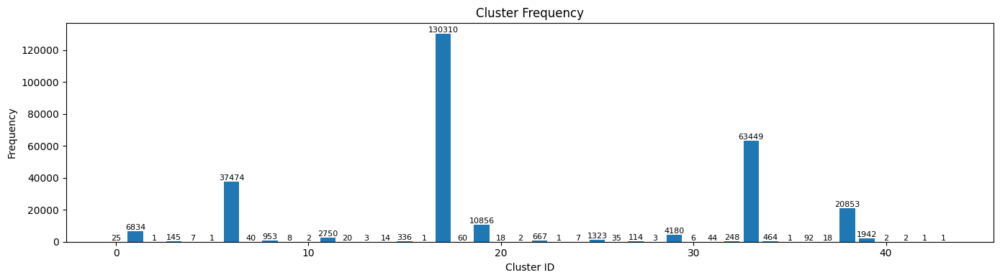

In [ ]:
freq_values = df["cluster"].value_counts().sort_index()

plt.figure(figsize=(14,4))

bars = plt.bar(freq_values.index, freq_values.values)


plt.xlabel("Cluster ID")
plt.ylabel("Frequency")
plt.title("Cluster Frequency")

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, f"{int(height)}", ha='center', va='bottom', fontsize=8)

plt.tight_layout()
plt.show()


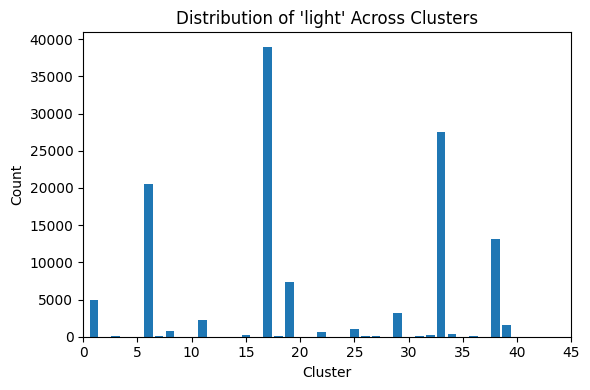

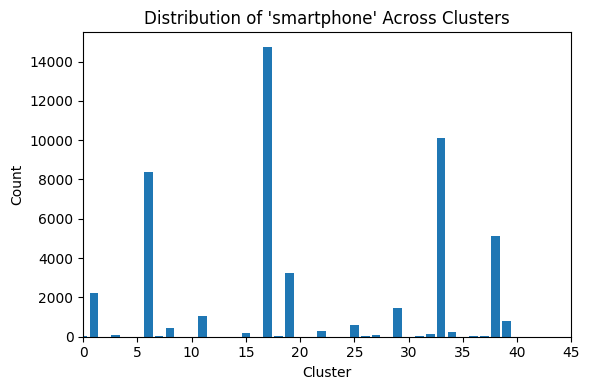

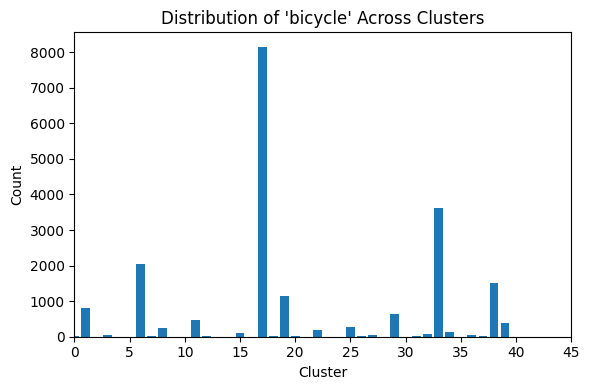

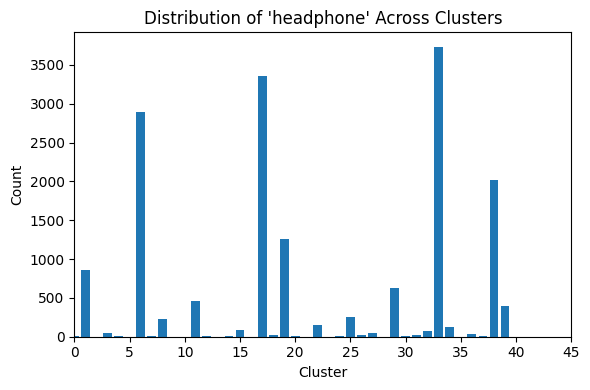

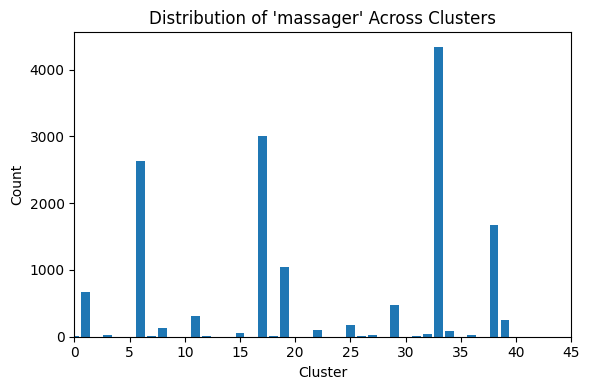

...

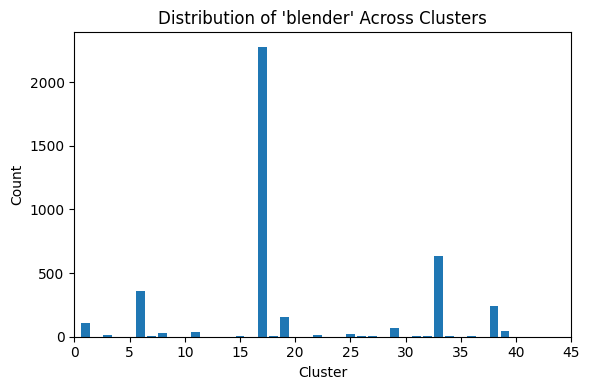

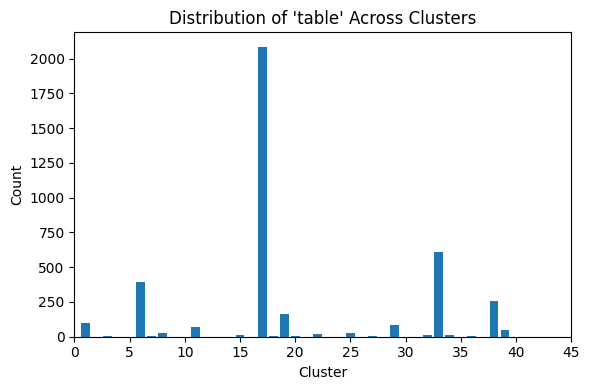

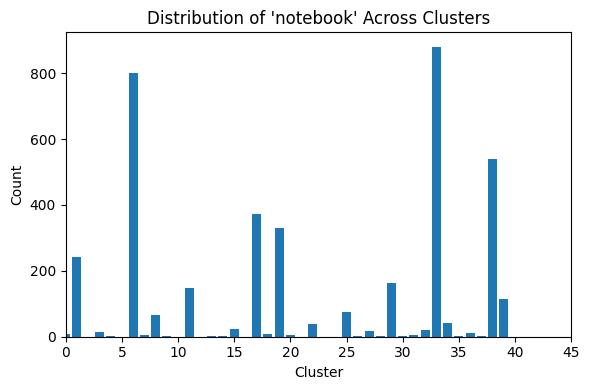

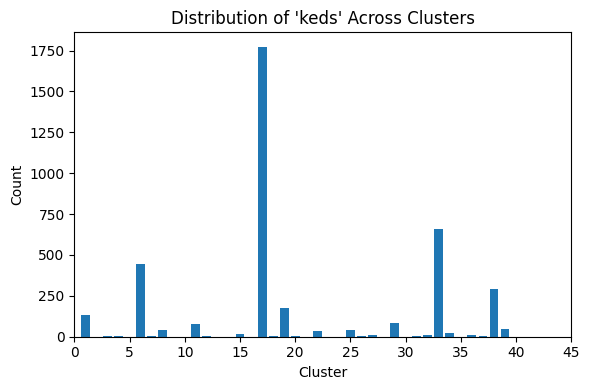

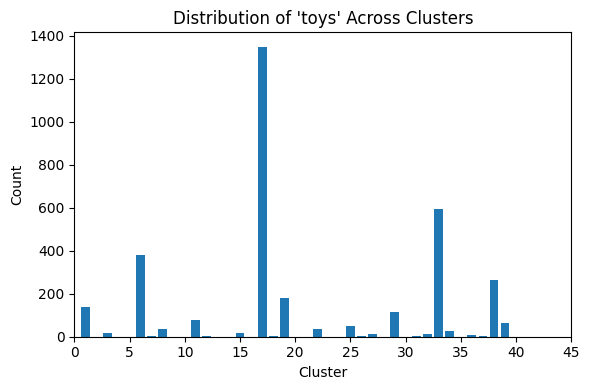

In [ ]:
clusters = X['cluster']  # your cluster assignments
df_items = X[ohe_cols].copy()
df_items["cluster"] = clusters

# Count for each item in each cluster
item_cluster_counts = df_items.groupby("cluster")[ohe_cols].sum()

top_k = 20
top_cols = col_freq.head(top_k).index.tolist()   # your top items


for item in top_cols:
    plt.figure(figsize=(6, 4))

    values = item_cluster_counts[item].values

    plt.bar(range(len(values)), values)
    plt.xlim(0, 45)

    plt.title(f"Distribution of '{item}' Across Clusters")
    plt.xlabel("Cluster")
    plt.ylabel("Count")
    plt.tight_layout()
    plt.show()


In [ ]:
frequent_itemsets = {}

labels_arr = df["cluster"].values # mask for labels rather than searching
ohe_data = X[ohe_cols]

cluster_sizes = pd.Series(labels_arr).value_counts()

unique_labels = [l for l in cluster_sizes.index if cluster_sizes[l] > 40]

total = len(unique_labels)


# itemset length 1
for i, label in enumerate(unique_labels, start=1):

    mask = (labels_arr == label) # filter for label
    temp = ohe_data.iloc[mask]  # iloc faster

    # Apriori
    frequent = apriori(
        temp,
        min_support=0.03,
        use_colnames=True,
        low_memory=True
    )

    frequent_itemsets[label] = frequent

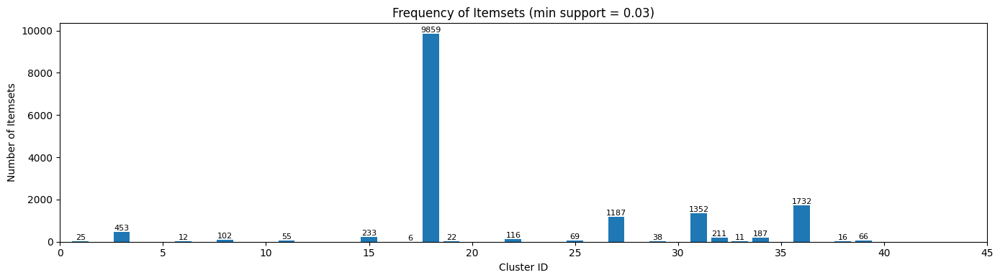

In [ ]:
cluster_ids = list(frequent_itemsets.keys())

# Count ONLY itemsets of size 2 for each cluster
lengths = [len(frequent_itemsets[c]) for c in cluster_ids]

plt.figure(figsize=(14, 4))
bars = plt.bar(cluster_ids, lengths)

plt.xlabel("Cluster ID")
plt.ylabel("Number of Itemsets")
plt.title("Frequency of Itemsets (min support = 0.03)")
plt.xlim(0, 45)

# -------------------------
# Add text labels on bars
# -------------------------
for bar in bars:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,   # x-position
        height,                              # y-position at top of bar
        f"{int(height)}",                    # text (value)
        ha='center', va='bottom', fontsize=8
    )

plt.tight_layout()
plt.show()


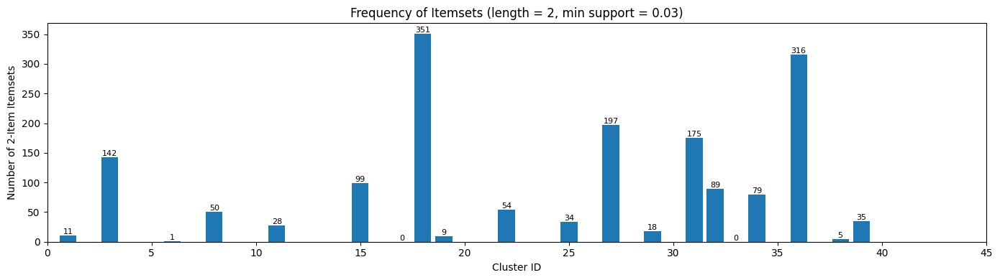

In [ ]:
cluster_ids = list(frequent_itemsets.keys())

# Count itemsets of length 2 for each cluster
lengths = [
    len(frequent_itemsets[c][frequent_itemsets[c]["itemsets"].apply(lambda x: len(x) == 2)])
    for c in cluster_ids
]

plt.figure(figsize=(14, 4))
bars = plt.bar(cluster_ids, lengths)

plt.xlabel("Cluster ID")
plt.ylabel("Number of 2-Item Itemsets")
plt.title("Frequency of Itemsets (length = 2, min support = 0.03)")
plt.xlim(0, 45)

# -------------------------
# Add text labels on bars
# -------------------------
for bar in bars:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        height,
        f"{int(height)}",
        ha='center', va='bottom', fontsize=8
    )

plt.tight_layout()
plt.show()


In [ ]:
for i in range(0, 44):
    if i not in frequent_itemsets or frequent_itemsets[i].empty:
        # skip empty clusters
        continue

    print(f"Cluster {i}")
    display(
        frequent_itemsets[i]
        .sort_values("support", ascending=False)
        .head(20)
    )


Cluster 1


,support,itemsets
4,0.730465,(light)
10,0.322651,(smartphone)
22,0.177056,"(light, smartphone)"
3,0.125110,(headphone)
0,0.116915,(bicycle)
1,0.101844,(clocks)
5,0.097893,(massager)
14,0.092186,"(bicycle, light)"
8,0.078724,(refrigerators)
9,0.077407,(shoes)


Cluster 3


,support,itemsets
14,0.944828,(light)
27,0.586207,(smartphone)
133,0.537931,"(light, smartphone)"
3,0.413793,(bicycle)
6,0.406897,(clocks)
48,0.386207,"(bicycle, light)"
77,0.379310,"(clocks, light)"
12,0.324138,(headphone)
106,0.303448,"(light, headphone)"
86,0.268966,"(clocks, smartphone)"


Cluster 6


,support,itemsets
3,0.548460,(light)
7,0.224235,(smartphone)
2,0.077227,(headphone)
4,0.070129,(massager)
5,0.060335,(refrigerators)
0,0.054678,(bicycle)
11,0.049448,"(light, smartphone)"
10,0.045418,(washer)
1,0.045365,(clocks)
6,0.043177,(shoes)


Cluster 8


,support,itemsets
10,0.869885,(light)
18,0.453305,(smartphone)
57,0.376705,"(light, smartphone)"
0,0.245540,(bicycle)
8,0.245540,(headphone)
26,0.227702,"(bicycle, light)"
3,0.209864,(clocks)
43,0.199370,"(light, headphone)"
35,0.183631,"(clocks, light)"
14,0.157398,(refrigerators)


Cluster 11


,support,itemsets
6,0.800364,(light)
14,0.390545,(smartphone)
37,0.279636,"(light, smartphone)"
0,0.166909,(bicycle)
5,0.166545,(headphone)
2,0.149818,(clocks)
20,0.146545,"(bicycle, light)"
28,0.123273,"(light, headphone)"
24,0.120000,"(clocks, light)"
7,0.115273,(massager)


Cluster 15


,support,itemsets
15,0.854167,(light)
27,0.559524,(smartphone)
106,0.461310,"(light, smartphone)"
2,0.294643,(bicycle)
43,0.282738,"(bicycle, light)"
20,0.261905,(refrigerators)
13,0.258929,(headphone)
5,0.247024,(clocks)
100,0.241071,"(refrigerators, light)"
86,0.229167,"(light, headphone)"


Cluster 17


,support,itemsets
2,0.299110,(light)
4,0.113169,(smartphone)
0,0.062543,(bicycle)
5,0.042468,(vacuum)
3,0.039360,(shoes)
1,0.032914,(clocks)


Cluster 18


,support,itemsets
21,0.966667,(light)
38,0.500000,(smartphone)
287,0.483333,"(light, smartphone)"
7,0.433333,(clocks)
146,0.416667,"(clocks, light)"
83,0.400000,"(bicycle, light)"
3,0.400000,(bicycle)
33,0.350000,(shoes)
282,0.333333,"(light, shoes)"
237,0.316667,"(light, headphone)"


Cluster 19


,support,itemsets
3,0.678795,(light)
9,0.297071,(smartphone)
20,0.143515,"(light, smartphone)"
2,0.116433,(headphone)
0,0.104458,(bicycle)
4,0.095523,(massager)
1,0.087601,(clocks)
7,0.078758,(refrigerators)
13,0.075718,"(bicycle, light)"
8,0.068810,(shoes)


Cluster 22


,support,itemsets
8,0.868066,(light)
18,0.460270,(smartphone)
62,0.377811,"(light, smartphone)"
1,0.280360,(bicycle)
30,0.266867,"(bicycle, light)"
3,0.247376,(clocks)
6,0.233883,(headphone)
39,0.209895,"(clocks, light)"
47,0.194903,"(light, headphone)"
12,0.169415,(refrigerators)


Cluster 25


,support,itemsets
7,0.831444,(light)
15,0.449735,(smartphone)
42,0.352986,"(light, smartphone)"
0,0.201814,(bicycle)
5,0.189720,(headphone)
22,0.187453,"(bicycle, light)"
2,0.183673,(clocks)
27,0.163265,"(clocks, light)"
32,0.145881,"(light, headphone)"
13,0.142101,(shoes)


Cluster 27


,support,itemsets
14,0.912281,(light)
27,0.587719,(smartphone)
175,0.535088,"(light, smartphone)"
4,0.438596,(bicycle)
61,0.429825,"(bicycle, light)"
11,0.377193,(headphone)
6,0.368421,(clocks)
141,0.350877,"(light, headphone)"
92,0.342105,"(clocks, light)"
72,0.271930,"(bicycle, smartphone)"


Cluster 29


,support,itemsets
4,0.768182,(light)
12,0.350718,(smartphone)
29,0.217943,"(light, smartphone)"
0,0.155981,(bicycle)
3,0.148565,(headphone)
18,0.133493,"(bicycle, light)"
1,0.131579,(clocks)
5,0.112440,(massager)
8,0.102632,(refrigerators)
23,0.101675,"(light, headphone)"


Cluster 31


,support,itemsets
17,0.818182,(light)
30,0.636364,(smartphone)
163,0.477273,"(light, smartphone)"
14,0.386364,(headphone)
135,0.340909,"(light, headphone)"
142,0.318182,"(smartphone, headphone)"
161,0.295455,"(light, shoes)"
59,0.295455,"(bicycle, light)"
3,0.295455,(bicycle)
27,0.295455,(shoes)


Cluster 32


,support,itemsets
11,0.899194,(light)
23,0.540323,(smartphone)
90,0.479839,"(light, smartphone)"
9,0.322581,(headphone)
70,0.294355,"(light, headphone)"
5,0.294355,(clocks)
2,0.282258,(bicycle)
38,0.262097,"(bicycle, light)"
54,0.254032,"(clocks, light)"
20,0.241935,(shoes)


Cluster 33


,support,itemsets
3,0.433703,(light)
7,0.159640,(smartphone)
4,0.068433,(massager)
2,0.058819,(headphone)
0,0.056991,(bicycle)
10,0.055084,(washer)
5,0.050923,(refrigerators)
9,0.047235,(vacuum)
1,0.047124,(clocks)
6,0.041703,(shoes)


Cluster 34


,support,itemsets
14,0.892241,(light)
24,0.476293,(smartphone)
88,0.407328,"(light, smartphone)"
2,0.290948,(bicycle)
11,0.282328,(headphone)
39,0.271552,"(bicycle, light)"
5,0.271552,(clocks)
70,0.245690,"(light, headphone)"
55,0.237069,"(clocks, light)"
15,0.172414,(massager)


Cluster 36


,support,itemsets
17,0.945652,(light)
38,0.597826,(smartphone)
261,0.565217,"(light, smartphone)"
14,0.445652,(headphone)
205,0.413043,"(light, headphone)"
4,0.380435,(bicycle)
6,0.369565,(clocks)
81,0.358696,"(bicycle, light)"
128,0.347826,"(clocks, light)"
216,0.293478,"(smartphone, headphone)"


Cluster 38


,support,itemsets
3,0.630269,(light)
7,0.245240,(smartphone)
2,0.096725,(headphone)
15,0.083154,"(light, smartphone)"
4,0.080468,(massager)
0,0.071788,(bicycle)
5,0.065123,(refrigerators)
1,0.063492,(clocks)
6,0.054237,(shoes)
10,0.048482,(washer)


Cluster 39


,support,itemsets
6,0.816169,(light)
14,0.415551,(smartphone)
43,0.307415,"(light, smartphone)"
5,0.205458,(headphone)
0,0.194645,(bicycle)
21,0.173532,"(bicycle, light)"
2,0.172503,(clocks)
32,0.158084,"(light, headphone)"
27,0.144181,"(clocks, light)"
7,0.130278,(massager)


In [ ]:
for i in range(0, 45):

    # Skip cluster if missing or empty
    if i not in frequent_itemsets or frequent_itemsets[i].empty:
        continue

    freq = frequent_itemsets[i]

    # Filter ONLY 2-item itemsets
    freq_size2 = freq[freq["itemsets"].apply(lambda s: len(s) == 2)]

    # Skip if no 2-item itemsets
    if freq_size2.empty:
        continue

    print(f"Cluster {i}")
    display(freq_size2.sort_values("support", ascending=False).head(20))


Cluster 1


,support,itemsets
22,0.177056,"(light, smartphone)"
14,0.092186,"(bicycle, light)"
17,0.076236,"(light, headphone)"
15,0.069359,"(clocks, light)"
19,0.062335,"(light, massager)"
21,0.058970,"(light, shoes)"
20,0.051507,"(refrigerators, light)"
18,0.037021,"(smartphone, headphone)"
24,0.034533,"(washer, light)"
23,0.033655,"(light, vacuum)"


Cluster 3


,support,itemsets
133,0.537931,"(light, smartphone)"
48,0.386207,"(bicycle, light)"
77,0.379310,"(clocks, light)"
106,0.303448,"(light, headphone)"
86,0.268966,"(clocks, smartphone)"
44,0.255172,"(clocks, bicycle)"
129,0.255172,"(light, shoes)"
56,0.241379,"(bicycle, smartphone)"
127,0.213793,"(refrigerators, light)"
115,0.206897,"(smartphone, headphone)"


Cluster 6


,support,itemsets
11,0.049448,"(light, smartphone)"


Cluster 8


,support,itemsets
57,0.376705,"(light, smartphone)"
26,0.227702,"(bicycle, light)"
43,0.199370,"(light, headphone)"
35,0.183631,"(clocks, light)"
53,0.145855,"(refrigerators, light)"
55,0.143757,"(light, shoes)"
50,0.126967,"(light, massager)"
48,0.117524,"(smartphone, headphone)"
30,0.113326,"(bicycle, smartphone)"
38,0.092340,"(clocks, smartphone)"


Cluster 11


,support,itemsets
37,0.279636,"(light, smartphone)"
20,0.146545,"(bicycle, light)"
28,0.123273,"(light, headphone)"
24,0.120000,"(clocks, light)"
35,0.093455,"(light, shoes)"
30,0.088727,"(light, massager)"
33,0.084727,"(refrigerators, light)"
29,0.060727,"(smartphone, headphone)"
26,0.055273,"(clocks, smartphone)"
22,0.052000,"(bicycle, smartphone)"


Cluster 15


,support,itemsets
106,0.461310,"(light, smartphone)"
43,0.282738,"(bicycle, light)"
100,0.241071,"(refrigerators, light)"
86,0.229167,"(light, headphone)"
58,0.223214,"(clocks, light)"
102,0.211310,"(light, shoes)"
48,0.163690,"(bicycle, smartphone)"
92,0.154762,"(smartphone, headphone)"
97,0.151786,"(light, massager)"
64,0.130952,"(clocks, smartphone)"


Cluster 18


,support,itemsets
287,0.483333,"(light, smartphone)"
146,0.416667,"(clocks, light)"
83,0.400000,"(bicycle, light)"
282,0.333333,"(light, shoes)"
237,0.316667,"(light, headphone)"
277,0.266667,"(refrigerators, light)"
272,0.250000,"(light, massager)"
75,0.250000,"(clocks, bicycle)"
158,0.233333,"(clocks, smartphone)"
95,0.233333,"(bicycle, smartphone)"


Cluster 19


,support,itemsets
20,0.143515,"(light, smartphone)"
13,0.075718,"(bicycle, light)"
15,0.059690,"(light, headphone)"
17,0.052321,"(light, massager)"
14,0.051953,"(clocks, light)"
19,0.046887,"(light, shoes)"
18,0.043939,"(refrigerators, light)"
21,0.031043,"(light, vacuum)"
16,0.030398,"(smartphone, headphone)"


Cluster 22


,support,itemsets
62,0.377811,"(light, smartphone)"
30,0.266867,"(bicycle, light)"
39,0.209895,"(clocks, light)"
47,0.194903,"(light, headphone)"
57,0.151424,"(refrigerators, light)"
54,0.139430,"(light, massager)"
43,0.124438,"(clocks, smartphone)"
59,0.121439,"(light, shoes)"
52,0.115442,"(smartphone, headphone)"
36,0.106447,"(bicycle, smartphone)"


Cluster 25


,support,itemsets
42,0.352986,"(light, smartphone)"
22,0.187453,"(bicycle, light)"
27,0.163265,"(clocks, light)"
32,0.145881,"(light, headphone)"
41,0.130008,"(light, shoes)"
39,0.108088,"(refrigerators, light)"
36,0.107332,"(light, massager)"
35,0.091459,"(smartphone, headphone)"
29,0.084656,"(clocks, smartphone)"
24,0.083144,"(bicycle, smartphone)"


Cluster 27


,support,itemsets
175,0.535088,"(light, smartphone)"
61,0.429825,"(bicycle, light)"
141,0.350877,"(light, headphone)"
92,0.342105,"(clocks, light)"
72,0.271930,"(bicycle, smartphone)"
151,0.263158,"(smartphone, headphone)"
171,0.245614,"(light, shoes)"
55,0.245614,"(clocks, bicycle)"
167,0.236842,"(refrigerators, light)"
101,0.228070,"(clocks, smartphone)"


Cluster 29


,support,itemsets
29,0.217943,"(light, smartphone)"
18,0.133493,"(bicycle, light)"
23,0.101675,"(light, headphone)"
21,0.098804,"(clocks, light)"
25,0.084450,"(light, massager)"
27,0.079426,"(refrigerators, light)"
28,0.074880,"(light, shoes)"
24,0.050957,"(smartphone, headphone)"
22,0.045694,"(clocks, smartphone)"
16,0.042584,"(clocks, bicycle)"


Cluster 31


,support,itemsets
163,0.477273,"(light, smartphone)"
135,0.340909,"(light, headphone)"
142,0.318182,"(smartphone, headphone)"
161,0.295455,"(light, shoes)"
59,0.295455,"(bicycle, light)"
153,0.272727,"(light, massager)"
99,0.250000,"(clocks, light)"
140,0.250000,"(shoes, headphone)"
56,0.227273,"(bicycle, headphone)"
66,0.204545,"(bicycle, smartphone)"


Cluster 32


,support,itemsets
90,0.479839,"(light, smartphone)"
70,0.294355,"(light, headphone)"
38,0.262097,"(bicycle, light)"
54,0.254032,"(clocks, light)"
87,0.225806,"(light, shoes)"
84,0.193548,"(refrigerators, light)"
76,0.189516,"(smartphone, headphone)"
80,0.169355,"(light, massager)"
60,0.153226,"(clocks, smartphone)"
37,0.145161,"(bicycle, headphone)"


Cluster 34


,support,itemsets
88,0.407328,"(light, smartphone)"
39,0.271552,"(bicycle, light)"
70,0.245690,"(light, headphone)"
55,0.237069,"(clocks, light)"
85,0.168103,"(light, shoes)"
79,0.163793,"(light, massager)"
77,0.150862,"(smartphone, headphone)"
62,0.137931,"(clocks, smartphone)"
83,0.133621,"(refrigerators, light)"
36,0.131466,"(clocks, bicycle)"


Cluster 36


,support,itemsets
261,0.565217,"(light, smartphone)"
205,0.413043,"(light, headphone)"
81,0.358696,"(bicycle, light)"
128,0.347826,"(clocks, light)"
216,0.293478,"(smartphone, headphone)"
251,0.260870,"(refrigerators, light)"
78,0.250000,"(bicycle, headphone)"
141,0.250000,"(clocks, smartphone)"
93,0.228261,"(bicycle, smartphone)"
242,0.217391,"(light, massager)"


Cluster 38


,support,itemsets
15,0.083154,"(light, smartphone)"
11,0.045317,"(bicycle, light)"
13,0.036350,"(light, headphone)"
14,0.035055,"(light, massager)"
12,0.031650,"(clocks, light)"


Cluster 39


,support,itemsets
43,0.307415,"(light, smartphone)"
21,0.173532,"(bicycle, light)"
32,0.158084,"(light, headphone)"
27,0.144181,"(clocks, light)"
41,0.107621,"(light, shoes)"
36,0.100927,"(light, massager)"
39,0.100927,"(refrigerators, light)"
35,0.085479,"(smartphone, headphone)"
29,0.070031,"(clocks, smartphone)"
20,0.065911,"(bicycle, headphone)"


In [ ]:
pairs = list(zip(cluster_ids, lengths))
pairs_sorted = sorted(pairs, key=lambda x: x[1], reverse=True)

top_20 = pairs_sorted[:20]

print("Top 20 clusters by number of itemsets:")
for cid, count in top_20:
    print(f"Cluster {cid}: {count} itemsets")

Top 20 clusters by number of itemsets:
Cluster 18: 351 itemsets
Cluster 36: 316 itemsets
Cluster 27: 197 itemsets
Cluster 31: 175 itemsets
Cluster 3: 142 itemsets
Cluster 15: 99 itemsets
Cluster 32: 89 itemsets
Cluster 34: 79 itemsets
Cluster 22: 54 itemsets
Cluster 8: 50 itemsets
Cluster 39: 35 itemsets
Cluster 25: 34 itemsets
Cluster 11: 28 itemsets
Cluster 29: 18 itemsets
Cluster 1: 11 itemsets
Cluster 19: 9 itemsets
Cluster 38: 5 itemsets
Cluster 6: 1 itemsets
Cluster 17: 0 itemsets
Cluster 33: 0 itemsets


Max cluster occurrence among 2-item itemsets: 18
Itemsets kept after filtering: 11


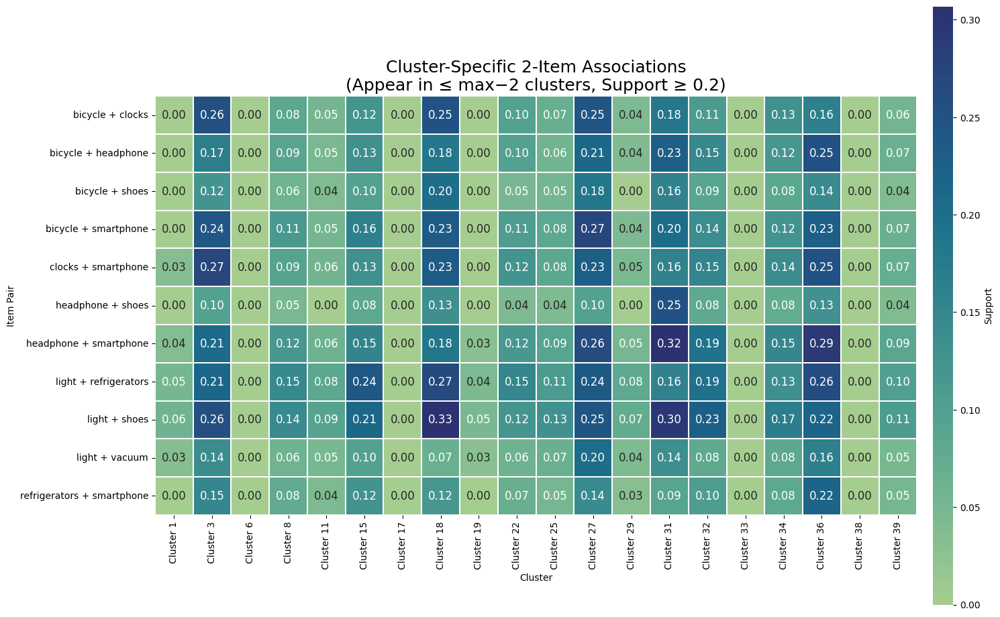

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from collections import defaultdict

# ------------------------------------------------------------
# 1. Helper: format frozenset nicely
# ------------------------------------------------------------
def format_itemset(fs):
    return " + ".join(sorted(fs))


# ------------------------------------------------------------
# 2. Collect cluster presence + max support for 2-item itemsets
# ------------------------------------------------------------
itemset_clusters = defaultdict(set)
itemset_max_support = defaultdict(float)

for cluster_id, df in frequent_itemsets.items():
    if df.empty:
        continue

    # Only 2-item itemsets
    freq2 = df[df["itemsets"].apply(len) == 2]

    for _, row in freq2.iterrows():
        fs = row["itemsets"]
        sup = row["support"]

        itemset_clusters[fs].add(cluster_id)
        itemset_max_support[fs] = max(itemset_max_support[fs], sup)


# ------------------------------------------------------------
# 3. Compute MAX observed cluster occurrence (key difference)
# ------------------------------------------------------------
max_cluster_occurrence = max(
    len(cluster_ids)
    for cluster_ids in itemset_clusters.values()
)

print(f"Max cluster occurrence among 2-item itemsets: {max_cluster_occurrence}")


# ------------------------------------------------------------
# 4. Select itemsets:
#    - appear in at most (max - 2) clusters
#    - AND support >= 0.25 in at least one cluster
# ------------------------------------------------------------
MIN_SUPPORT = 0.20

allowed_itemsets = {
    fs
    for fs in itemset_clusters
    if len(itemset_clusters[fs]) <= (max_cluster_occurrence - 2)
    and itemset_max_support[fs] >= MIN_SUPPORT
}

print(f"Itemsets kept after filtering: {len(allowed_itemsets)}")


# ------------------------------------------------------------
# 5. Build heatmap DataFrame
# ------------------------------------------------------------
pair_labels = {fs: format_itemset(fs) for fs in allowed_itemsets}
pairs_sorted = sorted(allowed_itemsets, key=lambda x: pair_labels[x])

heatmap_df = pd.DataFrame(
    index=[pair_labels[p] for p in pairs_sorted]
)

for i in range(45):
    if i not in frequent_itemsets or frequent_itemsets[i].empty:
        continue

    df = frequent_itemsets[i]
    freq2 = df[df["itemsets"].apply(len) == 2]

    # Keep only selected itemsets
    freq2 = freq2[freq2["itemsets"].isin(allowed_itemsets)]

    heatmap_df[f"Cluster {i}"] = (
        freq2
        .assign(label=freq2["itemsets"].map(pair_labels))
        .set_index("label")["support"]
    )

# Fill missing with 0 (itemset absent in cluster)
heatmap_df = heatmap_df.fillna(0)


# ------------------------------------------------------------
# 6. Plot heatmap
# ------------------------------------------------------------
plt.figure(figsize=(15, 25))

ax = sns.heatmap(
    heatmap_df,
    cmap="crest",
    linewidths=0.05,
    linecolor="white",
    square=True,
    vmax=heatmap_df.quantile(0.95).max(),

    # 🔹 Cell annotations
    annot=True,
    fmt=".2f",                 # two decimal places
    annot_kws={"size": 12},     # control text size

    # 🔹 Colorbar (legend) styling
    cbar_kws={
        "fraction": 0.025,
        "pad": 0.02,
        "aspect": 30,
        "label": "Support"
    }
)

plt.title(
    "Cluster-Specific 2-Item Associations\n"
    "(Appear in ≤ max−2 clusters, Support ≥ 0.2)",
    fontsize=18
)
plt.xlabel("Cluster")
plt.ylabel("Item Pair")

# Optional: make colorbar tick labels smaller
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=10)

plt.tight_layout()
plt.show()

Max cluster occurrence among 2-item itemsets: 18
Itemsets kept after filtering: 9


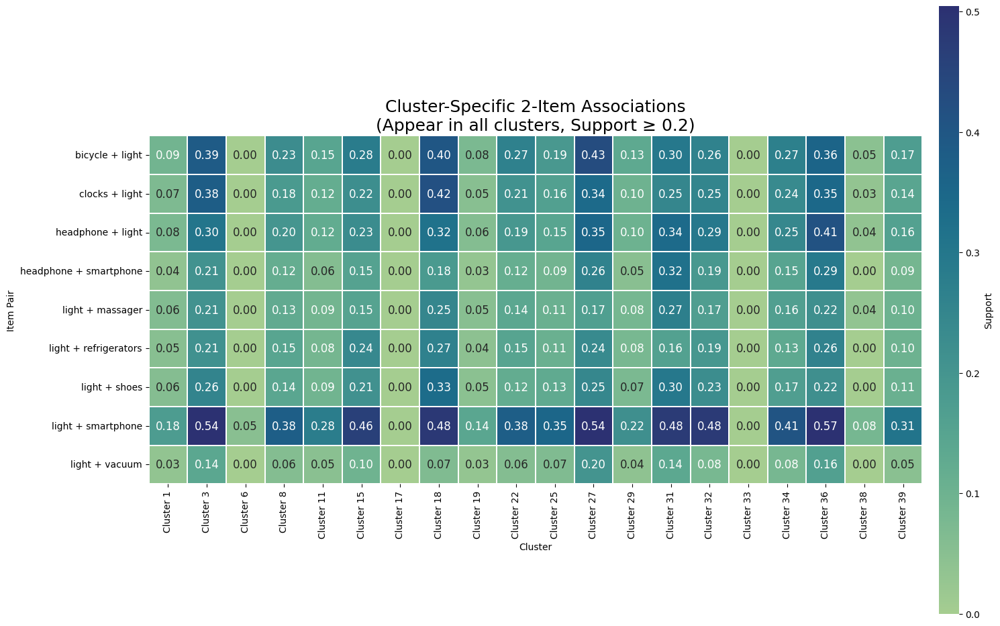

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from collections import defaultdict

# ------------------------------------------------------------
# 1. Helper: format frozenset nicely
# ------------------------------------------------------------
def format_itemset(fs):
    return " + ".join(sorted(fs))


# ------------------------------------------------------------
# 2. Collect cluster presence + max support for 2-item itemsets
# ------------------------------------------------------------
itemset_clusters = defaultdict(set)
itemset_max_support = defaultdict(float)

for cluster_id, df in frequent_itemsets.items():
    if df.empty:
        continue

    # Only 2-item itemsets
    freq2 = df[df["itemsets"].apply(len) == 2]

    for _, row in freq2.iterrows():
        fs = row["itemsets"]
        sup = row["support"]

        itemset_clusters[fs].add(cluster_id)
        itemset_max_support[fs] = max(itemset_max_support[fs], sup)


# ------------------------------------------------------------
# 3. Compute MAX observed cluster occurrence (key difference)
# ------------------------------------------------------------
max_cluster_occurrence = max(
    len(cluster_ids)
    for cluster_ids in itemset_clusters.values()
)

print(f"Max cluster occurrence among 2-item itemsets: {max_cluster_occurrence}")


# ------------------------------------------------------------
# 4. Select itemsets:
#    - appear in at most (max - 2) clusters
#    - AND support >= 0.25 in at least one cluster
# ------------------------------------------------------------
MIN_SUPPORT = 0.20

allowed_itemsets = {
    fs
    for fs in itemset_clusters
    if len(itemset_clusters[fs]) >= (max_cluster_occurrence - 2)
    and itemset_max_support[fs] >= MIN_SUPPORT
}

print(f"Itemsets kept after filtering: {len(allowed_itemsets)}")


# ------------------------------------------------------------
# 5. Build heatmap DataFrame
# ------------------------------------------------------------
pair_labels = {fs: format_itemset(fs) for fs in allowed_itemsets}
pairs_sorted = sorted(allowed_itemsets, key=lambda x: pair_labels[x])

heatmap_df = pd.DataFrame(
    index=[pair_labels[p] for p in pairs_sorted]
)

for i in range(45):
    if i not in frequent_itemsets or frequent_itemsets[i].empty:
        continue

    df = frequent_itemsets[i]
    freq2 = df[df["itemsets"].apply(len) == 2]

    # Keep only selected itemsets
    freq2 = freq2[freq2["itemsets"].isin(allowed_itemsets)]

    heatmap_df[f"Cluster {i}"] = (
        freq2
        .assign(label=freq2["itemsets"].map(pair_labels))
        .set_index("label")["support"]
    )

# Fill missing with 0 (itemset absent in cluster)
heatmap_df = heatmap_df.fillna(0)


# ------------------------------------------------------------
# 6. Plot heatmap
# ------------------------------------------------------------
plt.figure(figsize=(15, 25))

ax = sns.heatmap(
    heatmap_df,
    cmap="crest",
    linewidths=0.05,
    linecolor="white",
    square=True,
    vmax=heatmap_df.quantile(0.95).max(),

    # 🔹 Cell annotations
    annot=True,
    fmt=".2f",                 # two decimal places
    annot_kws={"size": 12},     # control text size

    # 🔹 Colorbar (legend) styling
    cbar_kws={
        "fraction": 0.025,
        "pad": 0.02,
        "aspect": 30,
        "label": "Support"
    }
)

plt.title(
    "Cluster-Specific 2-Item Associations\n"
    "(Appear in all clusters, Support ≥ 0.2)",
    fontsize=18
)
plt.xlabel("Cluster")
plt.ylabel("Item Pair")

# Optional: make colorbar tick labels smaller
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=10)

plt.tight_layout()
plt.show()


In [ ]:
rules_dict = {}

for label, itemset_df in frequent_itemsets.items():

    # --- skip clusters with no frequent itemsets ---
    if itemset_df.empty:
        rules_dict[label] = itemset_df
        continue

    # --- association rules ---
    try:
        rules = association_rules(
            itemset_df,
            metric="lift",
            min_threshold=1.0
        )
    except ValueError:
        # ignore if itemset size is less than 2
        rules = pd.DataFrame()

    rules_dict[label] = rules

In [ ]:
skipped = 0

for i in range(44):

    # Skip if cluster missing or rules table empty
    if i not in rules_dict or rules_dict[i].empty:
        skipped += 1
        continue

    rules = rules_dict[i]

    # Filter rules with antecedent size 2
    rules_size2 = rules[rules["antecedents"].apply(lambda x: len(x) == 2)]

    # Skip if no matching rules
    if rules_size2.empty:
        skipped += 1
        continue

    print(f"Cluster {i}")
    display(
        rules_size2
        .sort_values("lift", ascending=False)
        .head(20)
    )

print(f"\nTotal clusters skipped: {skipped}")

Cluster 3


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
2296,"(toys, clocks)","(blender, bicycle, light)",0.041379,0.048276,0.034483,0.833333,17.261905,1.0,0.032485,5.710345,0.982734,0.625000,0.824879,0.773810
1196,"(blender, bicycle)","(toys, clocks)",0.048276,0.041379,0.034483,0.714286,17.261905,1.0,0.032485,3.355172,0.989855,0.625000,0.701953,0.773810
2304,"(blender, bicycle)","(toys, clocks, light)",0.048276,0.041379,0.034483,0.714286,17.261905,1.0,0.032485,3.355172,0.989855,0.625000,0.701953,0.773810
1197,"(toys, clocks)","(blender, bicycle)",0.041379,0.048276,0.034483,0.833333,17.261905,1.0,0.032485,5.710345,0.982734,0.625000,0.824879,0.773810
2301,"(blender, light)","(toys, bicycle, clocks)",0.062069,0.041379,0.034483,0.555556,13.425926,1.0,0.031914,2.156897,0.986765,0.500000,0.536371,0.694444
1781,"(toys, clocks)","(blender, light)",0.041379,0.062069,0.034483,0.833333,13.425926,1.0,0.031914,5.627586,0.965468,0.500000,0.822304,0.694444
1780,"(blender, light)","(toys, clocks)",0.062069,0.041379,0.034483,0.555556,13.425926,1.0,0.031914,2.156897,0.986765,0.500000,0.536371,0.694444
566,"(toys, clocks)",(blender),0.041379,0.068966,0.034483,0.833333,12.083333,1.0,0.031629,5.586207,0.956835,0.454545,0.820988,0.666667
782,"(coffee_grinder, faucet)",(printer),0.034483,0.096552,0.034483,1.000000,10.357143,1.0,0.031153,inf,0.935714,0.357143,1.000000,0.678571
2053,"(light, printer)","(coffee_grinder, faucet)",0.096552,0.034483,0.034483,0.357143,10.357143,1.0,0.031153,1.501916,1.000000,0.357143,0.334184,0.678571


Cluster 8


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
178,"(light, massager)",(washer),0.126967,0.078699,0.031480,0.247934,3.150413,1.0,0.021487,1.225027,0.781851,0.180723,0.183691,0.323967
176,"(washer, light)",(massager),0.072403,0.140609,0.031480,0.434783,3.092148,1.0,0.021299,1.520462,0.729412,0.173410,0.342305,0.329332
148,"(notebook, light)",(headphone),0.053515,0.245540,0.030430,0.568627,2.315820,1.0,0.017290,1.748975,0.600313,0.113281,0.428236,0.346280
149,"(light, headphone)",(notebook),0.199370,0.069255,0.030430,0.152632,2.203907,1.0,0.016623,1.098395,0.682289,0.127753,0.089580,0.296013
169,"(light, massager)",(shoes),0.126967,0.152151,0.041973,0.330579,2.172699,1.0,0.022654,1.266540,0.618239,0.176991,0.210447,0.303220
168,"(light, shoes)",(massager),0.143757,0.140609,0.041973,0.291971,2.076479,1.0,0.021759,1.213780,0.605453,0.173160,0.176127,0.295239
220,"(bicycle, smartphone)","(light, headphone)",0.113326,0.199370,0.046170,0.407407,2.043470,1.0,0.023576,1.351062,0.575901,0.173228,0.259842,0.319493
225,"(light, headphone)","(bicycle, smartphone)",0.199370,0.113326,0.046170,0.231579,2.043470,1.0,0.023576,1.153890,0.637793,0.173228,0.133367,0.319493
164,"(light, massager)",(refrigerators),0.126967,0.157398,0.038825,0.305785,1.942755,1.0,0.018840,1.213749,0.555841,0.158120,0.176106,0.276226
162,"(refrigerators, light)",(massager),0.145855,0.140609,0.038825,0.266187,1.893106,1.0,0.018316,1.171131,0.552328,0.156780,0.146125,0.271153


Cluster 11


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
31,"(clocks, light)",(bicycle),0.120000,0.166909,0.044000,0.366667,2.196805,1.0,0.023971,1.315407,0.619083,0.181138,0.239779,0.315142
44,"(light, shoes)",(bicycle),0.093455,0.166909,0.033455,0.357977,2.144740,1.0,0.017856,1.297602,0.588766,0.147436,0.229348,0.279206
42,"(bicycle, light)",(shoes),0.146545,0.113818,0.033455,0.228288,2.005724,1.0,0.016775,1.148332,0.587526,0.147436,0.129172,0.261109
32,"(bicycle, light)",(clocks),0.146545,0.149818,0.044000,0.300248,2.004083,1.0,0.022045,1.214976,0.587048,0.174352,0.176939,0.296969
38,"(light, headphone)",(bicycle),0.123273,0.166909,0.038545,0.312684,1.873381,1.0,0.017970,1.212094,0.531757,0.153179,0.174981,0.271811
53,"(light, headphone)",(clocks),0.123273,0.149818,0.030182,0.244838,1.634233,1.0,0.011713,1.125827,0.442660,0.124251,0.111764,0.223147
36,"(bicycle, light)",(headphone),0.146545,0.166545,0.038545,0.263027,1.579312,1.0,0.014139,1.130916,0.429798,0.140397,0.115761,0.247234
52,"(clocks, light)",(headphone),0.120000,0.166545,0.030182,0.251515,1.510189,1.0,0.010196,1.113522,0.383899,0.117730,0.101949,0.216369
58,"(light, smartphone)",(refrigerators),0.279636,0.108000,0.036364,0.130039,1.204065,1.0,0.006163,1.025333,0.235270,0.103520,0.024707,0.233370
48,"(bicycle, smartphone)",(light),0.052000,0.800364,0.046909,0.902098,1.127110,1.0,0.005290,2.039143,0.118961,0.058239,0.509598,0.480354


Cluster 15


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
375,"(light, ski)",(faucet),0.056548,0.083333,0.032738,0.578947,6.947368,1.0,0.028026,2.177083,0.907370,0.305556,0.540670,0.485902
374,"(faucet, light)",(ski),0.077381,0.062500,0.032738,0.423077,6.769231,1.0,0.027902,1.625000,0.923754,0.305556,0.384615,0.473443
331,"(coffee_grinder, light)",(faucet),0.077381,0.083333,0.035714,0.461538,5.538462,1.0,0.029266,1.702381,0.888172,0.285714,0.412587,0.445055
362,"(faucet, light)",(printer),0.077381,0.086310,0.035714,0.461538,5.347480,1.0,0.029036,1.696854,0.881183,0.279070,0.410674,0.437666
364,"(light, printer)",(faucet),0.080357,0.083333,0.035714,0.444444,5.333333,1.0,0.029018,1.650000,0.883495,0.279070,0.393939,0.436508
332,"(faucet, light)",(coffee_grinder),0.077381,0.089286,0.035714,0.461538,5.169231,1.0,0.028805,1.691327,0.874194,0.272727,0.408748,0.430769
336,"(coffee_grinder, light)",(printer),0.077381,0.086310,0.032738,0.423077,4.901857,1.0,0.026059,1.583730,0.862757,0.250000,0.368579,0.401194
338,"(light, printer)",(coffee_grinder),0.080357,0.089286,0.032738,0.407407,4.562963,1.0,0.025563,1.536830,0.849073,0.239130,0.349310,0.387037
256,"(light, vacuum)",(blanket),0.098214,0.086310,0.035714,0.363636,4.213166,1.0,0.027237,1.435799,0.845710,0.240000,0.303524,0.388715
254,"(blanket, light)",(vacuum),0.077381,0.116071,0.035714,0.461538,3.976331,1.0,0.026733,1.641582,0.811290,0.226415,0.390831,0.384615


Cluster 18


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
762285,"(clocks, table)","(light, headphone, notebook, ski, massager, slipons, blanket, bicycle, air_conditioner, refrigerators)",0.033333,0.033333,0.033333,1.0,30.0,1.0,0.032222,inf,1.0,1.0,1.0,1.0
762306,"(refrigerators, air_conditioner)","(light, headphone, notebook, ski, table, massager, slipons, blanket, bicycle, clocks)",0.033333,0.033333,0.033333,1.0,30.0,1.0,0.032222,inf,1.0,1.0,1.0,1.0
762290,"(air_conditioner, massager)","(light, headphone, notebook, ski, table, slipons, blanket, bicycle, clocks, refrigerators)",0.033333,0.033333,0.033333,1.0,30.0,1.0,0.032222,inf,1.0,1.0,1.0,1.0
762305,"(clocks, air_conditioner)","(light, headphone, notebook, ski, table, massager, slipons, blanket, bicycle, refrigerators)",0.033333,0.033333,0.033333,1.0,30.0,1.0,0.032222,inf,1.0,1.0,1.0,1.0
762295,"(slipons, air_conditioner)","(light, headphone, notebook, ski, table, massager, blanket, bicycle, clocks, refrigerators)",0.033333,0.033333,0.033333,1.0,30.0,1.0,0.032222,inf,1.0,1.0,1.0,1.0
762302,"(bicycle, air_conditioner)","(light, headphone, notebook, ski, table, massager, slipons, blanket, clocks, refrigerators)",0.033333,0.033333,0.033333,1.0,30.0,1.0,0.032222,inf,1.0,1.0,1.0,1.0
186249,"(blanket, ski)","(notebook, refrigerators, headphone, massager)",0.033333,0.033333,0.033333,1.0,30.0,1.0,0.032222,inf,1.0,1.0,1.0,1.0
762260,"(air_conditioner, headphone)","(light, notebook, ski, table, massager, slipons, blanket, bicycle, clocks, refrigerators)",0.033333,0.033333,0.033333,1.0,30.0,1.0,0.032222,inf,1.0,1.0,1.0,1.0
762263,"(notebook, ski)","(light, headphone, table, massager, slipons, blanket, bicycle, air_conditioner, clocks, refrigerators)",0.033333,0.033333,0.033333,1.0,30.0,1.0,0.032222,inf,1.0,1.0,1.0,1.0
762264,"(notebook, table)","(light, headphone, ski, massager, slipons, blanket, bicycle, air_conditioner, clocks, refrigerators)",0.033333,0.033333,0.033333,1.0,30.0,1.0,0.032222,inf,1.0,1.0,1.0,1.0


Cluster 22


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
200,"(light, massager)",(washer),0.139430,0.091454,0.034483,0.247312,2.704213,1.0,0.021731,1.207068,0.732313,0.175573,0.171546,0.312181
198,"(washer, light)",(massager),0.082459,0.158921,0.034483,0.418182,2.631389,1.0,0.021378,1.445605,0.675689,0.166667,0.308248,0.317581
238,"(bicycle, clocks)","(light, headphone)",0.097451,0.194903,0.040480,0.415385,2.131243,1.0,0.021486,1.377140,0.588101,0.160714,0.273858,0.311538
243,"(light, headphone)","(bicycle, clocks)",0.194903,0.097451,0.040480,0.207692,2.131243,1.0,0.021486,1.139139,0.659287,0.160714,0.122144,0.311538
80,"(bicycle, clocks)",(headphone),0.097451,0.233883,0.046477,0.476923,2.039152,1.0,0.023685,1.464635,0.564623,0.163158,0.317236,0.337821
266,"(light, headphone)","(bicycle, smartphone)",0.194903,0.106447,0.041979,0.215385,2.023402,1.0,0.021232,1.138842,0.628226,0.161850,0.121915,0.304875
261,"(bicycle, smartphone)","(light, headphone)",0.106447,0.194903,0.041979,0.394366,2.023402,1.0,0.021232,1.329347,0.566035,0.161850,0.247751,0.304875
239,"(clocks, light)","(bicycle, headphone)",0.209895,0.097451,0.040480,0.192857,1.979011,1.0,0.020025,1.118202,0.626116,0.151685,0.105707,0.304121
242,"(bicycle, headphone)","(clocks, light)",0.097451,0.209895,0.040480,0.415385,1.979011,1.0,0.020025,1.351495,0.548111,0.151685,0.260079,0.304121
81,"(clocks, headphone)",(bicycle),0.083958,0.280360,0.046477,0.553571,1.974503,1.0,0.022938,1.611994,0.538778,0.146226,0.379650,0.359673


Cluster 25


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
114,"(bicycle, smartphone)","(light, headphone)",0.083144,0.145881,0.030234,0.363636,2.492699,1.0,0.018105,1.342188,0.653133,0.152091,0.254948,0.285445
119,"(light, headphone)","(bicycle, smartphone)",0.145881,0.083144,0.030234,0.207254,2.492699,1.0,0.018105,1.156556,0.701106,0.152091,0.135364,0.285445
54,"(bicycle, smartphone)",(headphone),0.083144,0.189720,0.034769,0.418182,2.204201,1.0,0.018995,1.392668,0.595864,0.146032,0.281954,0.300724
96,"(refrigerators, light)",(shoes),0.108088,0.142101,0.030234,0.279720,1.968457,1.0,0.014875,1.191063,0.551610,0.137457,0.160414,0.246243
43,"(clocks, light)",(bicycle),0.163265,0.201814,0.063492,0.388889,1.926966,1.0,0.030543,1.306122,0.574913,0.210526,0.234375,0.351748
62,"(light, shoes)",(bicycle),0.130008,0.201814,0.049887,0.383721,1.901359,1.0,0.023649,1.295170,0.544902,0.176944,0.227900,0.315456
55,"(headphone, smartphone)",(bicycle),0.091459,0.201814,0.034769,0.380165,1.883740,1.0,0.016312,1.287740,0.516368,0.134503,0.223446,0.276225
60,"(bicycle, light)",(shoes),0.187453,0.142101,0.049887,0.266129,1.872812,1.0,0.023249,1.169005,0.573559,0.178378,0.144572,0.308596
44,"(bicycle, light)",(clocks),0.187453,0.183673,0.063492,0.338710,1.844086,1.0,0.029062,1.234445,0.563322,0.206388,0.189919,0.342194
116,"(headphone, smartphone)","(bicycle, light)",0.091459,0.187453,0.030234,0.330579,1.763530,1.0,0.013090,1.213805,0.476539,0.121581,0.176145,0.245934


Cluster 27


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
11604,"(coffee_grinder, headphone)","(faucet, ski, vacuum)",0.043860,0.035088,0.035088,0.800000,22.8,1.0,0.033549,4.824561,1.000000,0.800000,0.792727,0.900000
11725,"(coffee_grinder, headphone)","(light, vacuum, ski)",0.043860,0.035088,0.035088,0.800000,22.8,1.0,0.033549,4.824561,1.000000,0.800000,0.792727,0.900000
11612,"(faucet, ski)","(coffee_grinder, headphone, vacuum)",0.043860,0.035088,0.035088,0.800000,22.8,1.0,0.033549,4.824561,1.000000,0.800000,0.792727,0.900000
15367,"(faucet, ski)","(vacuum, coffee_grinder, light, headphone)",0.043860,0.035088,0.035088,0.800000,22.8,1.0,0.033549,4.824561,1.000000,0.800000,0.792727,0.900000
15354,"(coffee_grinder, headphone)","(faucet, light, vacuum, ski)",0.043860,0.035088,0.035088,0.800000,22.8,1.0,0.033549,4.824561,1.000000,0.800000,0.792727,0.900000
5990,"(coffee_grinder, headphone)","(ski, vacuum)",0.043860,0.035088,0.035088,0.800000,22.8,1.0,0.033549,4.824561,1.000000,0.800000,0.792727,0.900000
5987,"(ski, vacuum)","(coffee_grinder, headphone)",0.035088,0.043860,0.035088,1.000000,22.8,1.0,0.033549,inf,0.990909,0.800000,1.000000,0.900000
11609,"(ski, vacuum)","(coffee_grinder, faucet, headphone)",0.035088,0.043860,0.035088,1.000000,22.8,1.0,0.033549,inf,0.990909,0.800000,1.000000,0.900000
11731,"(ski, vacuum)","(coffee_grinder, light, headphone)",0.035088,0.043860,0.035088,1.000000,22.8,1.0,0.033549,inf,0.990909,0.800000,1.000000,0.900000
15366,"(ski, vacuum)","(coffee_grinder, faucet, light, headphone)",0.035088,0.043860,0.035088,1.000000,22.8,1.0,0.033549,inf,0.990909,0.800000,1.000000,0.900000


Cluster 29


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
13,"(clocks, light)",(bicycle),0.098804,0.155981,0.033971,0.343826,2.204281,1.0,0.018560,1.286273,0.606236,0.153846,0.222560,0.280809
20,"(light, headphone)",(bicycle),0.101675,0.155981,0.032775,0.322353,2.066619,1.0,0.016916,1.245514,0.574533,0.145745,0.197119,0.266238
14,"(bicycle, light)",(clocks),0.133493,0.131579,0.033971,0.254480,1.934050,1.0,0.016406,1.164853,0.557353,0.146998,0.141523,0.256331
18,"(bicycle, light)",(headphone),0.133493,0.148565,0.032775,0.245520,1.652613,1.0,0.012943,1.128506,0.455735,0.131478,0.113873,0.233066
24,"(bicycle, smartphone)",(light),0.042584,0.768182,0.035646,0.837079,1.089688,1.0,0.002934,1.422884,0.085967,0.045988,0.297202,0.441741
25,"(light, smartphone)",(bicycle),0.217943,0.155981,0.035646,0.163557,1.048568,1.0,0.001651,1.009057,0.059226,0.105375,0.008976,0.196042
12,"(bicycle, clocks)",(light),0.042584,0.768182,0.033971,0.797753,1.038495,1.0,0.001259,1.146212,0.038717,0.043733,0.127561,0.420988
28,"(light, smartphone)",(headphone),0.217943,0.148565,0.033493,0.153677,1.034414,1.0,0.001114,1.006041,0.042540,0.100575,0.006005,0.189560
19,"(bicycle, headphone)",(light),0.041866,0.768182,0.032775,0.782857,1.019104,1.0,0.000614,1.067584,0.019565,0.042167,0.063305,0.412761


Cluster 31


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
336,"(bag, bicycle)",(costume),0.045455,0.045455,0.045455,1.0,22.0,1.0,0.043388,inf,1.0,1.0,1.0,1.0
3138,"(juicer, massager)","(blender, bicycle)",0.045455,0.045455,0.045455,1.0,22.0,1.0,0.043388,inf,1.0,1.0,1.0,1.0
3143,"(blender, bicycle)","(juicer, massager)",0.045455,0.045455,0.045455,1.0,22.0,1.0,0.043388,inf,1.0,1.0,1.0,1.0
3335,"(costume, clocks)","(bicycle, mixer)",0.045455,0.045455,0.045455,1.0,22.0,1.0,0.043388,inf,1.0,1.0,1.0,1.0
3336,"(clocks, mixer)","(costume, bicycle)",0.045455,0.045455,0.045455,1.0,22.0,1.0,0.043388,inf,1.0,1.0,1.0,1.0
3337,"(costume, bicycle)","(clocks, mixer)",0.045455,0.045455,0.045455,1.0,22.0,1.0,0.043388,inf,1.0,1.0,1.0,1.0
3338,"(bicycle, mixer)","(costume, clocks)",0.045455,0.045455,0.045455,1.0,22.0,1.0,0.043388,inf,1.0,1.0,1.0,1.0
3808,"(bicycle, mixer)","(costume, light)",0.045455,0.045455,0.045455,1.0,22.0,1.0,0.043388,inf,1.0,1.0,1.0,1.0
3810,"(light, mixer)","(costume, bicycle)",0.045455,0.045455,0.045455,1.0,22.0,1.0,0.043388,inf,1.0,1.0,1.0,1.0
398,"(costume, light)",(bag),0.045455,0.045455,0.045455,1.0,22.0,1.0,0.043388,inf,1.0,1.0,1.0,1.0


Cluster 32


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
314,"(light, printer)",(coffee_grinder),0.076613,0.068548,0.036290,0.473684,6.910217,1.0,0.031039,1.769758,0.926249,0.333333,0.434951,0.501548
312,"(coffee_grinder, light)",(printer),0.068548,0.080645,0.036290,0.529412,6.564706,1.0,0.030762,1.953629,0.910053,0.321429,0.488132,0.489706
330,"(light, printer)",(faucet),0.076613,0.076613,0.032258,0.421053,5.495845,1.0,0.026389,1.594941,0.885917,0.266667,0.373018,0.421053
328,"(faucet, light)",(printer),0.076613,0.080645,0.032258,0.421053,5.221053,1.0,0.026080,1.587977,0.875546,0.258065,0.370268,0.410526
242,"(blanket, light)",(slipons),0.076613,0.104839,0.032258,0.421053,4.016194,1.0,0.024226,1.546188,0.813319,0.216216,0.353248,0.364372
241,"(slipons, light)",(blanket),0.100806,0.084677,0.032258,0.320000,3.779048,1.0,0.023722,1.346063,0.817825,0.210526,0.257093,0.350476
506,"(smartphone, massager)",(vacuum),0.096774,0.092742,0.032258,0.333333,3.594203,1.0,0.023283,1.360887,0.799107,0.205128,0.265185,0.340580
504,"(smartphone, vacuum)",(massager),0.060484,0.189516,0.032258,0.533333,2.814184,1.0,0.020795,1.736751,0.686159,0.148148,0.424212,0.351773
596,"(bicycle, massager)","(light, shoes)",0.064516,0.225806,0.040323,0.625000,2.767857,1.0,0.025754,2.064516,0.682759,0.161290,0.515625,0.401786
597,"(light, shoes)","(bicycle, massager)",0.225806,0.064516,0.040323,0.178571,2.767857,1.0,0.025754,1.138850,0.825000,0.161290,0.121921,0.401786


Cluster 34


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
297,"(faucet, light)",(coffee_grinder),0.058190,0.073276,0.030172,0.518519,7.076253,1.0,0.025909,1.924735,0.911736,0.297872,0.480448,0.465142
296,"(coffee_grinder, light)",(faucet),0.066810,0.064655,0.030172,0.451613,6.984946,1.0,0.025853,1.705629,0.918179,0.297872,0.413706,0.459140
301,"(light, printer)",(coffee_grinder),0.092672,0.073276,0.032328,0.348837,4.760602,1.0,0.025537,1.423183,0.870625,0.241935,0.297350,0.395007
300,"(coffee_grinder, light)",(printer),0.066810,0.105603,0.032328,0.483871,4.581962,1.0,0.025272,1.732893,0.837721,0.230769,0.422930,0.394997
622,"(bicycle, smartphone)","(clocks, light, headphone)",0.125000,0.081897,0.034483,0.275862,3.368421,1.0,0.024246,1.267857,0.803571,0.200000,0.211268,0.348457
459,"(bicycle, smartphone)","(clocks, headphone)",0.125000,0.099138,0.038793,0.310345,3.130435,1.0,0.026401,1.306250,0.777778,0.209302,0.234450,0.350825
462,"(clocks, headphone)","(bicycle, smartphone)",0.099138,0.125000,0.038793,0.391304,3.130435,1.0,0.026401,1.437500,0.755449,0.209302,0.304348,0.350825
580,"(headphone, smartphone)","(notebook, light)",0.150862,0.081897,0.036638,0.242857,2.965414,1.0,0.024283,1.212589,0.780532,0.186813,0.175319,0.345113
577,"(notebook, light)","(headphone, smartphone)",0.081897,0.150862,0.036638,0.447368,2.965414,1.0,0.024283,1.536535,0.721900,0.186813,0.349185,0.345113
420,"(refrigerators, light)",(washer),0.133621,0.081897,0.032328,0.241935,2.954160,1.0,0.021385,1.211115,0.763516,0.176471,0.174315,0.318336


Cluster 36


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
17958,"(cooler, massager)","(blanket, clocks, costume, scarf)",0.032609,0.032609,0.032609,1.0,30.666667,1.0,0.031545,inf,1.0,1.0,1.0,1.0
17956,"(blanket, scarf)","(clocks, costume, cooler, massager)",0.032609,0.032609,0.032609,1.0,30.666667,1.0,0.031545,inf,1.0,1.0,1.0,1.0
8580,"(scarf, vacuum)","(cooler, massager)",0.032609,0.032609,0.032609,1.0,30.666667,1.0,0.031545,inf,1.0,1.0,1.0,1.0
8585,"(cooler, massager)","(scarf, vacuum)",0.032609,0.032609,0.032609,1.0,30.666667,1.0,0.031545,inf,1.0,1.0,1.0,1.0
13616,"(telephone, printer)","(slipons, bicycle, vacuum)",0.032609,0.032609,0.032609,1.0,30.666667,1.0,0.031545,inf,1.0,1.0,1.0,1.0
13617,"(slipons, telephone)","(bicycle, vacuum, printer)",0.032609,0.032609,0.032609,1.0,30.666667,1.0,0.031545,inf,1.0,1.0,1.0,1.0
13620,"(slipons, vacuum)","(telephone, bicycle, printer)",0.032609,0.032609,0.032609,1.0,30.666667,1.0,0.031545,inf,1.0,1.0,1.0,1.0
15733,"(costume, refrigerators)","(washer, shirt, smartphone)",0.032609,0.032609,0.032609,1.0,30.666667,1.0,0.031545,inf,1.0,1.0,1.0,1.0
15550,"(costume, refrigerators)","(smartphone, light, shirt)",0.032609,0.032609,0.032609,1.0,30.666667,1.0,0.031545,inf,1.0,1.0,1.0,1.0
8856,"(costume, refrigerators)","(shirt, smartphone)",0.032609,0.032609,0.032609,1.0,30.666667,1.0,0.031545,inf,1.0,1.0,1.0,1.0


Cluster 39


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
52,"(light, headphone)",(bicycle),0.158084,0.194645,0.058187,0.368078,1.891026,1.0,0.027417,1.274454,0.559660,0.197552,0.215350,0.333510
68,"(clocks, light)",(shoes),0.144181,0.125644,0.031926,0.221429,1.762354,1.0,0.013810,1.123026,0.505454,0.134199,0.109549,0.237763
70,"(light, shoes)",(clocks),0.107621,0.172503,0.031926,0.296651,1.719689,1.0,0.013361,1.176510,0.468970,0.128631,0.150028,0.240863
45,"(clocks, light)",(bicycle),0.144181,0.194645,0.047889,0.332143,1.706406,1.0,0.019825,1.205880,0.483716,0.164602,0.170730,0.289087
78,"(light, headphone)",(shoes),0.158084,0.125644,0.033471,0.211726,1.685134,1.0,0.013608,1.109204,0.482917,0.133745,0.098453,0.239060
50,"(bicycle, light)",(headphone),0.173532,0.205458,0.058187,0.335312,1.632018,1.0,0.022534,1.195360,0.468574,0.181380,0.163432,0.309260
58,"(light, shoes)",(bicycle),0.107621,0.194645,0.033986,0.315789,1.622389,1.0,0.013038,1.177058,0.429890,0.126679,0.150424,0.245196
46,"(bicycle, light)",(clocks),0.173532,0.172503,0.047889,0.275964,1.599770,1.0,0.017954,1.142896,0.453629,0.160622,0.125030,0.276788
56,"(bicycle, light)",(shoes),0.173532,0.125644,0.033986,0.195846,1.558739,1.0,0.012182,1.087299,0.433720,0.128155,0.080290,0.233169
76,"(light, shoes)",(headphone),0.107621,0.205458,0.033471,0.311005,1.513713,1.0,0.011359,1.153189,0.380301,0.119705,0.132839,0.236956



Total clusters skipped: 30


In [ ]:
from collections import defaultdict

# 1. Build user → cluster map
user_cluster_map = df2.set_index("user_id")["cluster"].to_dict()


# 2. Build purchased items per user

purchased_list = (
    (df2[ohe_cols] == 1)
    .apply(lambda row: row.index[row].tolist(), axis=1)
)

purchased_dict = dict(zip(df2["user_id"], purchased_list))



# 3. Build rules lookup per cluster
fast_rules = {}

for label, rules in rules_dict.items():

    if rules is None or rules.empty:
        fast_rules[label] = {}
        continue

    # keep only antecedents and consequents of length 1
    rules_1_1 = rules[
        (rules["antecedents"].apply(lambda x: isinstance(x, frozenset) and len(x) == 1)) &
        (rules["consequents"].apply(lambda x: isinstance(x, frozenset) and len(x) == 1))
    ]

    if rules_1_1.empty:
        fast_rules[label] = {}
        continue

    # extract items
    antecedents = rules_1_1["antecedents"].apply(lambda x: next(iter(x)))
    consequents = rules_1_1["consequents"].apply(lambda x: next(iter(x)))

    # collect ALL consequents per antecedent
    rule_map = defaultdict(set)
    for a, c in zip(antecedents, consequents):
        rule_map[a].add(c)

    fast_rules[label] = {a: list(cs) for a, cs in rule_map.items()}


# 4. Generate recommendations
recommended = []

for user in df2["user_id"]:
    cluster = user_cluster_map[user]
    items_bought = set(purchased_dict[user])
    rules_map = fast_rules.get(cluster, {})

    recs = set()

    # add ALL consequents for all purchased items
    for a in items_bought:
        if a in rules_map:
            recs.update(rules_map[a])

    # REMOVE items the user already purchased
    recs -= items_bought

    recommended.append(list(recs))

df2["recommended_items"] = recommended


In [ ]:
df2[(df2["smartphone"] == 1.0) & (df2["cluster"] == 22) & (df2["recommended_items"].str.len() > 0)].head(2)

,user_id,latest_date,recency,frequency,monetary_value,time,category_accessories,category_apparel,category_appliances,category_auto,category_computers,category_construction,category_country_yard,category_electronics,category_furniture,category_kids,category_medicine,category_sport,category_stationery,acoustic,air_conditioner,air_heater,alarm,anti_freeze,axe,bag,ballet_shoes,bath,bed,belt,bench,bicycle,blanket,blender,cabinet,camera,carriage,cartrige,cdrw,chair,climate,clocks,coffee_grinder,coffee_machine,compressor,cooler,costume,cpu,cultivator,desktop,diapers,dictaphone,dishwasher,diving,dolls,dress,drill,ebooks,espadrilles,fan,faucet,fryer,generator,glove,grill,hair_cutter,hammok,hdd,headphone,hob,hood,iron,ironing_board,jacket,jeans,juicer,jumper,keds,kettle,keyboard,lawn_mower,light,massager,meat_grinder,memory,microphone,microwave,mixer,moccasins,monitor,motherboard,mouse,notebook,oven,painting,pajamas,paper,parktronic,photo,piano,pillow,player,power_supply,printer,projector,pump,radar,refrigerators,sandals,saw,scales,scarf,screw,sewing_machine,shelving,shirt,shoes,shorts,skates,ski,skirt,slipons,smartphone,snowboard,sock,sofa,soldering,sound_card,steam_cooker,step_ins,subwoofer,swing,table,tablet,telephone,tennis,toilet,tonometer,toster,toys,trainer,trousers,tshirt,tv,umbrella,underwear,vacuum,video,videocards,videoregister,wallet,washer,water_heater,watering,welding,winch,cluster,recommended_items
190816,552039699,2019-10-21,105.78204,-0.079070,12036.877994,-2.572486,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,22,"[washer, coffee_grinder, headphone, sandals, notebook, tv, clocks, shoes]"
248283,553951166,2019-12-02,63.78204,0.206644,12089.447994,-2.972486,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,22,"[washer, toys, coffee_grinder, keds, printer, headphone, bag, sandals, notebook, tv, faucet, skates, massager, table, bicycle, clocks, refrigerators, shoes]"


In [ ]:
df2[df2["recommended_items"].str.len() > 0].shape

(38380, 158)

### HDBSCAN

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/AI_Dataset/holdout2_with_clusters.csv")

In [ ]:
df.head()

,user_id,latest_date,recency,frequency,monetary_value,time,category_accessories,category_apparel,category_appliances,category_auto,category_computers,category_construction,category_country_yard,category_electronics,category_furniture,category_kids,category_medicine,category_sport,category_stationery,acoustic,air_conditioner,air_heater,alarm,anti_freeze,axe,bag,ballet_shoes,bath,bed,belt,bench,bicycle,blanket,blender,cabinet,camera,carriage,cartrige,cdrw,chair,climate,clocks,coffee_grinder,coffee_machine,compressor,cooler,costume,cpu,cultivator,desktop,diapers,dictaphone,dishwasher,diving,dolls,dress,drill,ebooks,espadrilles,fan,faucet,fryer,generator,glove,grill,hair_cutter,hammok,hdd,headphone,hob,hood,iron,ironing_board,jacket,jeans,juicer,jumper,keds,kettle,keyboard,lawn_mower,light,massager,meat_grinder,memory,microphone,microwave,mixer,moccasins,monitor,motherboard,mouse,notebook,oven,painting,pajamas,paper,parktronic,photo,piano,pillow,player,power_supply,printer,projector,pump,radar,refrigerators,sandals,saw,scales,scarf,screw,sewing_machine,shelving,shirt,shoes,shorts,skates,ski,skirt,slipons,smartphone,snowboard,sock,sofa,soldering,sound_card,steam_cooker,step_ins,subwoofer,swing,table,tablet,telephone,tennis,toilet,tonometer,toster,toys,trainer,trousers,tshirt,tv,umbrella,underwear,vacuum,video,videocards,videoregister,wallet,washer,water_heater,watering,welding,winch,cluster
0,571273502,2020-04-24,-0.696078,0.0,-0.286000,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,397
1,533166046,2020-03-11,-0.264706,0.0,-0.241506,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,317
2,564394863,2020-03-26,-0.411765,0.0,-0.448480,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,252
3,562815037,2019-10-22,1.117647,0.0,-0.130005,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,71
4,608196578,2020-01-30,0.137255,0.0,-0.304559,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,192


In [ ]:
df.shape

(283313, 157)

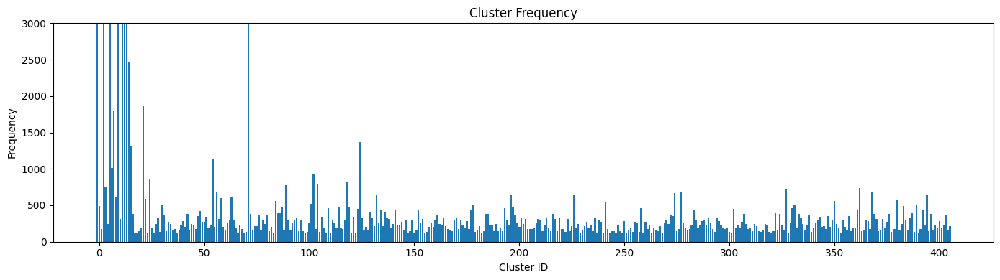

In [ ]:
freq_values = df["cluster"].value_counts().sort_index()

plt.figure(figsize=(14,4))
plt.bar(freq_values.index, freq_values.values)

plt.ylim(0, 3000)
plt.xlabel("Cluster ID")
plt.ylabel("Frequency")
plt.title("Cluster Frequency")
plt.tight_layout()
plt.show()


In [ ]:
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import fpgrowth
from mlxtend.frequent_patterns import association_rules
warnings.filterwarnings("ignore", category=DeprecationWarning)

In [ ]:
start = df.columns.get_loc("acoustic")

ohe_cols = df.columns[start:-1]

X = df[["cluster"] + list(ohe_cols)]

In [ ]:
print(X.shape)

(283313, 138)


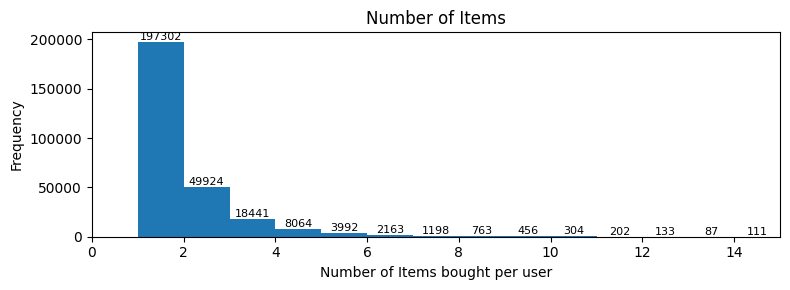

In [ ]:
freq_values = X[ohe_cols].sum(axis=1)

plt.figure(figsize=(8,3))
counts, bins, patches = plt.hist(freq_values, bins=range(0, 16))

plt.xlabel("Number of Items bought per user")
plt.ylabel("Frequency")
plt.xlim(0, 15)
plt.title("Number of Items")

# Add counts on top of each bin (optional)
for count, x in zip(counts, bins[:-1]):
    if count > 0:
        plt.text(x + 0.5, count, str(int(count)), ha='center', va='bottom', fontsize=8)

plt.tight_layout()
plt.show()


In [ ]:
col_freq = X[ohe_cols].sum().sort_values(ascending=False)
top_k = 20
top_cols = col_freq.head(top_k)
print(top_cols)

light            123607
smartphone        49429
bicycle           20004
headphone         16798
massager          15146
clocks            14401
shoes             13566
vacuum            12873
refrigerators     12124
washer             9928
tv                 7042
printer            5911
blanket            5007
sandals            4520
slipons            4443
blender            4046
table              3966
notebook           3943
keds               3903
toys               3395
dtype: int64


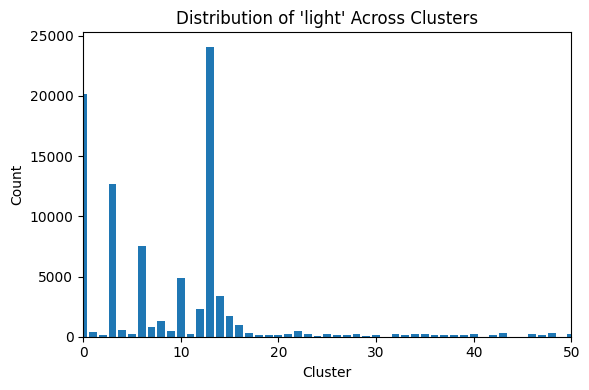

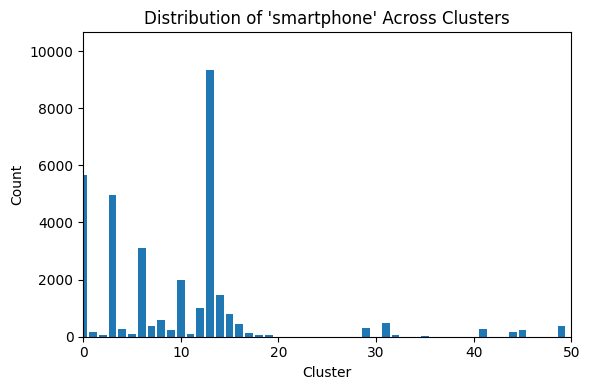

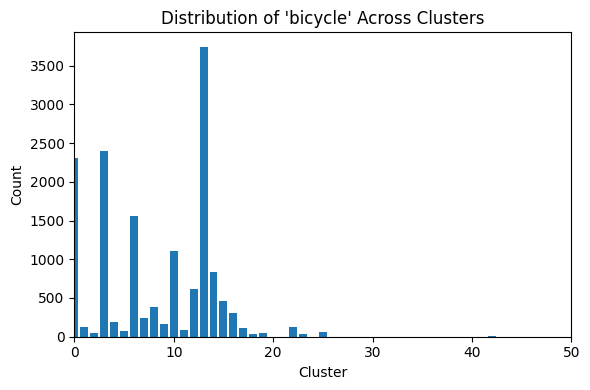

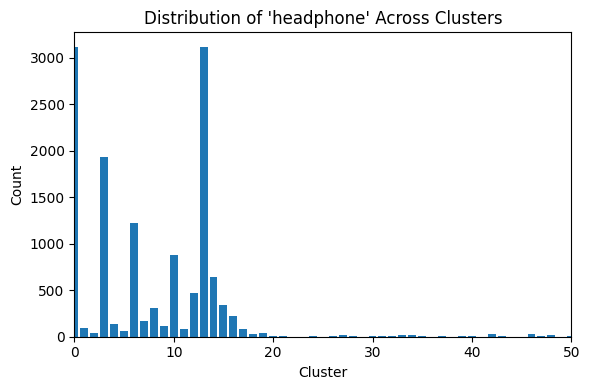

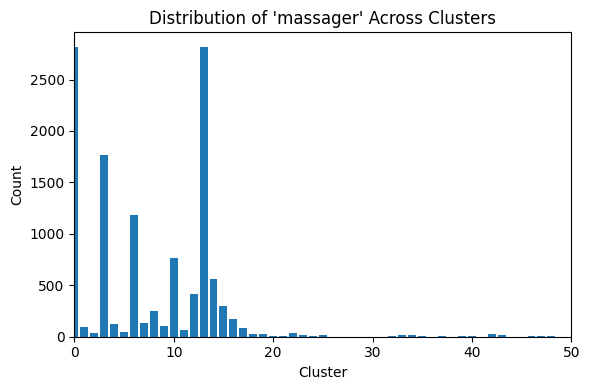

...

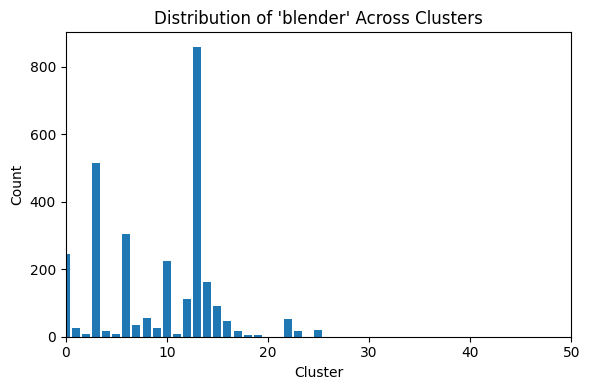

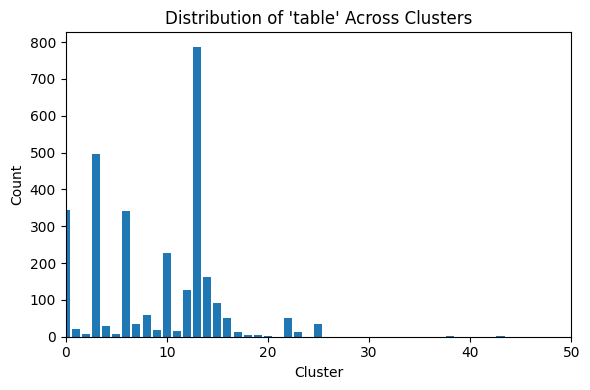

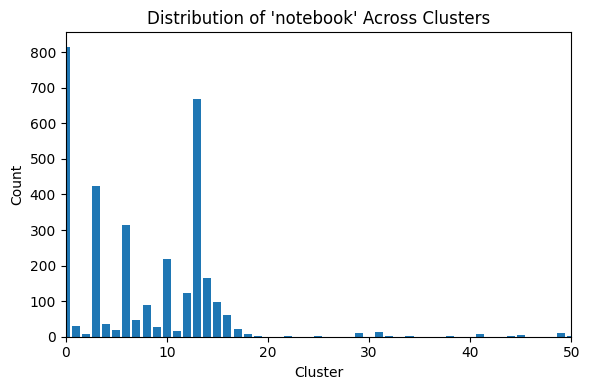

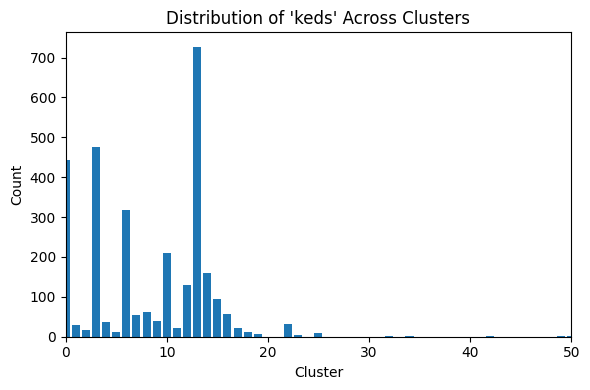

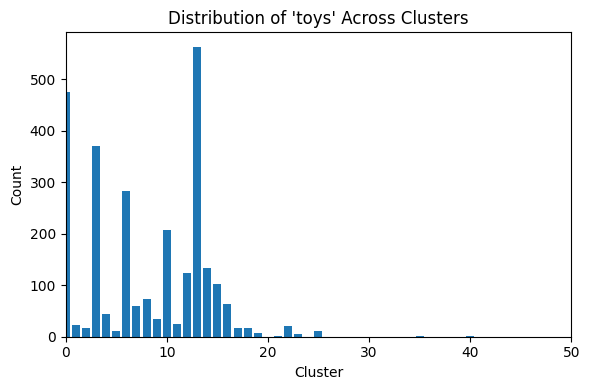

In [ ]:
clusters = X['cluster']  # your cluster assignments
df_items = X[ohe_cols].copy()
df_items["cluster"] = clusters

# Count for each item in each cluster
item_cluster_counts = df_items.groupby("cluster")[ohe_cols].sum()

top_k = 20
top_cols = col_freq.head(top_k).index.tolist()   # your top items


for item in top_cols:
    plt.figure(figsize=(6, 4))

    values = item_cluster_counts[item].values

    plt.bar(range(len(values)), values)
    plt.xlim(0, 50)

    plt.title(f"Distribution of '{item}' Across Clusters")
    plt.xlabel("Cluster")
    plt.ylabel("Count")
    plt.tight_layout()
    plt.show()


In [ ]:
df['cluster'].nunique()

407

In [ ]:
frequent_itemsets = {}

labels_arr = df["cluster"].values # mask for labels rather than searching
ohe_data = X[ohe_cols]

unique_labels = [l for l in np.unique(labels_arr) if l != -1] # filter outliers
total = len(unique_labels)


# itemset length 1
for i, label in enumerate(unique_labels, start=1):

    mask = (labels_arr == label) # filter for label
    temp = ohe_data.iloc[mask]  # iloc faster

    # Apriori
    frequent = apriori(
        temp,
        min_support=0.02,
        use_colnames=True,
        low_memory=True
    )

    frequent_itemsets[label] = frequent

    # --- Progress print ---
    if i % 200 == 0 or i == total:
        print(f"Completed {i}/{total} clusters...")

Completed 200/406 clusters...
Completed 400/406 clusters...
Completed 406/406 clusters...


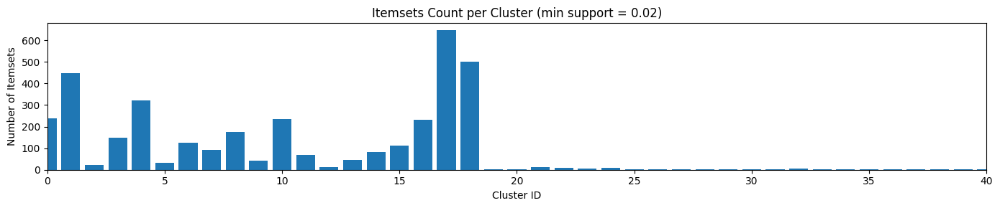

In [ ]:
cluster_ids = list(frequent_itemsets.keys())
lengths = [len(frequent_itemsets[c]) for c in cluster_ids]

plt.figure(figsize=(14,3))
plt.bar(cluster_ids, lengths)

plt.xlabel("Cluster ID")
plt.ylabel("Number of Itemsets")
plt.title("Itemsets Count per Cluster (min support = 0.02)")
plt.xlim(0, 40)
plt.tight_layout()
plt.show()

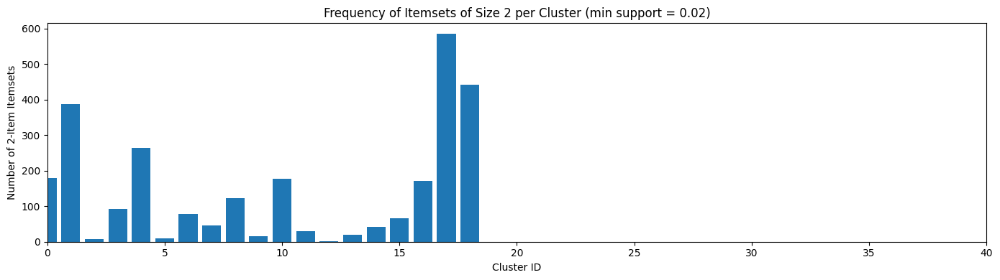

In [ ]:
cluster_ids = list(frequent_itemsets.keys())

# Count ONLY itemsets of size 2 for each cluster
lengths = []
for c in cluster_ids:
    df_freq = frequent_itemsets[c]

    # Filter to itemsets of size 2
    df_size2 = df_freq[df_freq["itemsets"].apply(lambda s: len(s) >= 2)]

    lengths.append(len(df_size2))


plt.figure(figsize=(14, 4))
plt.bar(cluster_ids, lengths)

plt.xlabel("Cluster ID")
plt.ylabel("Number of 2-Item Itemsets")
plt.title("Frequency of Itemsets of Size 2 per Cluster (min support = 0.02)")

plt.xlim(0, 40)
plt.tight_layout()
plt.show()


In [ ]:
for i in range(0, 41):
  print(f"Cluster {i}")
  display(frequent_itemsets[i].sort_values("support", ascending=False).head(20))

Cluster 0


,support,itemsets
25,0.813142,(light)
44,0.373717,(smartphone)
140,0.310062,"(smartphone, light)"
5,0.264887,(bicycle)
39,0.217659,(shoes)
71,0.213552,"(bicycle, light)"
26,0.197125,(massager)
21,0.193018,(headphone)
10,0.193018,(clocks)
126,0.170431,"(massager, light)"


Cluster 1


,support,itemsets
26,0.873563,(light)
45,0.373563,(smartphone)
193,0.339080,"(smartphone, light)"
4,0.281609,(bicycle)
41,0.252874,(shoes)
75,0.247126,"(bicycle, light)"
189,0.229885,"(light, shoes)"
27,0.224138,(massager)
20,0.224138,(headphone)
175,0.201149,"(massager, light)"


Cluster 2


,support,itemsets
5,0.511550,(light)
11,0.199614,(smartphone)
0,0.096265,(bicycle)
4,0.077753,(headphone)
20,0.074734,"(smartphone, light)"
6,0.071153,(massager)
3,0.067853,(clocks)
9,0.066243,(shoes)
13,0.062862,(vacuum)
8,0.052882,(refrigerators)


Cluster 3


,support,itemsets
21,0.782322,(light)
40,0.361478,(smartphone)
102,0.284960,"(smartphone, light)"
4,0.246702,(bicycle)
59,0.189974,"(bicycle, light)"
35,0.186016,(shoes)
8,0.176781,(clocks)
18,0.176781,(headphone)
22,0.158311,(massager)
30,0.135884,(refrigerators)


Cluster 4


,support,itemsets
23,0.872428,(light)
42,0.444444,(smartphone)
154,0.395062,"(smartphone, light)"
4,0.296296,(bicycle)
71,0.259259,"(bicycle, light)"
20,0.246914,(headphone)
9,0.238683,(clocks)
37,0.213992,(shoes)
126,0.213992,"(headphone, light)"
99,0.209877,"(clocks, light)"


Cluster 5


,support,itemsets
7,0.565028,(light)
15,0.233471,(smartphone)
0,0.116848,(bicycle)
28,0.110544,"(smartphone, light)"
5,0.091707,(headphone)
8,0.089081,(massager)
3,0.084578,(clocks)
13,0.080976,(shoes)
19,0.074447,(vacuum)
11,0.065516,(refrigerators)


Cluster 6


,support,itemsets
19,0.764822,(light)
35,0.365613,(smartphone)
90,0.284585,"(smartphone, light)"
4,0.238142,(bicycle)
52,0.182806,"(bicycle, light)"
30,0.178854,(shoes)
17,0.170949,(headphone)
8,0.159091,(clocks)
20,0.136364,(massager)
26,0.128458,(refrigerators)


Cluster 7


,support,itemsets
19,0.709767,(light)
34,0.319090,(smartphone)
71,0.222531,"(smartphone, light)"
4,0.212542,(bicycle)
30,0.173696,(shoes)
16,0.169256,(headphone)
8,0.161487,(clocks)
50,0.146504,"(bicycle, light)"
20,0.140400,(massager)
61,0.113762,"(headphone, light)"


Cluster 8


,support,itemsets
21,0.796748,(light)
37,0.364228,(smartphone)
110,0.284553,"(smartphone, light)"
4,0.266667,(bicycle)
59,0.224390,"(bicycle, light)"
32,0.191870,(shoes)
18,0.183740,(headphone)
8,0.183740,(clocks)
22,0.165854,(massager)
106,0.149593,"(light, shoes)"


Cluster 9


,support,itemsets
11,0.611378,(light)
20,0.250948,(smartphone)
2,0.140582,(bicycle)
38,0.138938,"(smartphone, light)"
9,0.110493,(headphone)
18,0.101138,(shoes)
6,0.098736,(clocks)
12,0.097092,(massager)
28,0.078887,"(bicycle, light)"
24,0.077244,(vacuum)


Cluster 10


,support,itemsets
22,0.809677,(light)
40,0.361290,(smartphone)
131,0.300000,"(smartphone, light)"
3,0.290323,(bicycle)
18,0.254839,(headphone)
64,0.235484,"(bicycle, light)"
35,0.222581,(shoes)
7,0.216129,(clocks)
23,0.212903,(massager)
101,0.193548,"(headphone, light)"


Cluster 11


,support,itemsets
14,0.668120,(light)
28,0.290613,(smartphone)
57,0.188608,"(smartphone, light)"
3,0.180761,(bicycle)
12,0.135135,(headphone)
7,0.131067,(clocks)
25,0.130485,(shoes)
15,0.119442,(massager)
40,0.114792,"(bicycle, light)"
21,0.097937,(refrigerators)


Cluster 12


,support,itemsets
3,0.442388,(light)
7,0.171402,(smartphone)
0,0.068785,(bicycle)
2,0.057134,(headphone)
4,0.051786,(massager)
9,0.049526,(vacuum)
1,0.048497,(clocks)
6,0.046034,(shoes)
5,0.040962,(refrigerators)
10,0.036313,(washer)


Cluster 13


,support,itemsets
11,0.658556,(light)
20,0.284602,(smartphone)
43,0.174616,"(smartphone, light)"
2,0.161962,(bicycle)
9,0.125754,(headphone)
6,0.115048,(clocks)
18,0.111738,(shoes)
12,0.109013,(massager)
29,0.101226,"(bicycle, light)"
24,0.087210,(vacuum)


Cluster 14


,support,itemsets
16,0.706764,(light)
27,0.319563,(smartphone)
64,0.215067,"(smartphone, light)"
3,0.188335,(bicycle)
7,0.153503,(clocks)
24,0.143378,(shoes)
14,0.139328,(headphone)
43,0.128392,"(bicycle, light)"
17,0.122722,(massager)
21,0.111381,(refrigerators)


Cluster 15


,support,itemsets
18,0.740545,(light)
32,0.344175,(smartphone)
77,0.264750,"(smartphone, light)"
3,0.229198,(bicycle)
15,0.171710,(headphone)
48,0.168684,"(bicycle, light)"
29,0.164902,(shoes)
7,0.161120,(clocks)
19,0.132375,(massager)
74,0.116490,"(light, shoes)"


Cluster 16


,support,itemsets
23,0.842932,(light)
45,0.382199,(smartphone)
132,0.314136,"(smartphone, light)"
4,0.285340,(bicycle)
65,0.230366,"(bicycle, light)"
24,0.217277,(massager)
8,0.212042,(clocks)
19,0.206806,(headphone)
40,0.196335,(shoes)
83,0.180628,"(clocks, light)"


Cluster 17


,support,itemsets
22,0.838462,(light)
45,0.423077,(smartphone)
239,0.392308,"(smartphone, light)"
9,0.307692,(clocks)
40,0.269231,(shoes)
5,0.269231,(bicycle)
135,0.246154,"(clocks, light)"
94,0.238462,"(bicycle, light)"
18,0.230769,(headphone)
23,0.223077,(massager)


Cluster 18


,support,itemsets
24,0.880,(light)
43,0.400,(smartphone)
197,0.360,"(smartphone, light)"
5,0.344,(bicycle)
85,0.304,"(bicycle, light)"
19,0.304,(headphone)
164,0.272,"(headphone, light)"
38,0.232,(shoes)
9,0.232,(clocks)
192,0.208,"(light, shoes)"


Cluster 19


,support,itemsets
1,0.916084,(light)
0,0.041958,(headphone)
2,0.041958,(massager)


Cluster 20


,support,itemsets
1,0.939394,(light)
0,0.030303,(headphone)
2,0.020202,(massager)


Cluster 21


,support,itemsets
4,0.243432,(light)
0,0.064343,(bicycle)
2,0.044504,(clocks)
3,0.042895,(hair_cutter)
6,0.031635,(shoes)
10,0.031635,(vacuum)
1,0.027882,(blender)
8,0.027346,(table)
7,0.024129,(swing)
9,0.023056,(toster)


Cluster 22


,support,itemsets
4,0.347458,(light)
0,0.066102,(bicycle)
9,0.037288,(vacuum)
1,0.028814,(blender)
6,0.027119,(oven)
2,0.027119,(clocks)
3,0.025424,(hair_cutter)
5,0.023729,(massager)
7,0.023729,(shoes)
8,0.022034,(table)


Cluster 23


,support,itemsets
2,0.793651,(light)
3,0.063492,(massager)
4,0.047619,(refrigerators)
1,0.031746,(headphone)
0,0.023810,(coffee_grinder)


Cluster 24


,support,itemsets
3,0.235915,(light)
0,0.072770,(bicycle)
5,0.039906,(table)
2,0.035211,(clocks)
7,0.035211,(vacuum)
4,0.026995,(swing)
1,0.023474,(blender)
6,0.021127,(toster)


Cluster 25


,support,itemsets
1,0.933333,(light)
0,0.035897,(headphone)


Cluster 26


,support,itemsets
1,0.835938,(light)
0,0.117188,(headphone)
2,0.023438,(refrigerators)


Cluster 27


,support,itemsets
1,0.943089,(light)
0,0.020325,(headphone)


Cluster 28


,support,itemsets
2,0.859701,(smartphone)
0,0.080597,(light)
1,0.029851,(notebook)


Cluster 29


,support,itemsets
1,0.916667,(light)
0,0.068182,(headphone)


Cluster 30


,support,itemsets
1,0.937751,(smartphone)
0,0.026104,(notebook)
2,0.026104,(tv)


Cluster 31


,support,itemsets
0,0.711911,(light)
1,0.185596,(smartphone)


Cluster 32


,support,itemsets
1,0.711409,(light)
0,0.140940,(headphone)
2,0.080537,(massager)
4,0.026846,(washer)
3,0.020134,(refrigerators)


Cluster 33


,support,itemsets
2,0.798535,(light)
1,0.076923,(headphone)
3,0.043956,(massager)
0,0.032967,(hair_cutter)


Cluster 34


,support,itemsets
0,0.874477,(light)
3,0.062762,(smartphone)
1,0.029289,(massager)
2,0.020921,(refrigerators)


Cluster 35


,support,itemsets
0,0.951515,(light)


Cluster 36


,support,itemsets
1,0.912281,(light)
0,0.052632,(headphone)


Cluster 37


,support,itemsets
1,0.910569,(light)
0,0.024390,(clocks)
2,0.024390,(refrigerators)


Cluster 38


,support,itemsets
1,0.926380,(light)
0,0.055215,(headphone)


Cluster 39


,support,itemsets
1,0.852679,(light)
0,0.053571,(headphone)
2,0.022321,(massager)


Cluster 40


,support,itemsets
1,0.953901,(smartphone)
0,0.031915,(notebook)


In [ ]:
for i in range(0, 41):
  print(f"Cluster {i}")
  freq = frequent_itemsets[i]

  # Filter ONLY 2-item itemsets
  freq_size2 = freq[freq["itemsets"].apply(lambda s: len(s) == 2)]

  # Sort by support and show top 10
  display(freq_size2.sort_values("support", ascending=False).head(20))


Cluster 0


,support,itemsets
140,0.310062,"(smartphone, light)"
71,0.213552,"(bicycle, light)"
126,0.170431,"(massager, light)"
135,0.170431,"(light, shoes)"
115,0.147844,"(headphone, light)"
91,0.145791,"(clocks, light)"
132,0.119097,"(refrigerators, light)"
121,0.100616,"(headphone, smartphone)"
150,0.088296,"(light, washer)"
131,0.086242,"(light, printer)"


Cluster 1


,support,itemsets
193,0.339080,"(smartphone, light)"
75,0.247126,"(bicycle, light)"
189,0.229885,"(light, shoes)"
175,0.201149,"(massager, light)"
151,0.189655,"(headphone, light)"
105,0.155172,"(clocks, light)"
138,0.143678,"(light, faucet)"
184,0.126437,"(light, printer)"
117,0.120690,"(light, coffee_grinder)"
185,0.109195,"(refrigerators, light)"


Cluster 2


,support,itemsets
20,0.074734,"(smartphone, light)"
15,0.035536,"(bicycle, light)"
17,0.025394,"(headphone, light)"
18,0.024952,"(massager, light)"
16,0.023221,"(clocks, light)"
19,0.022537,"(light, shoes)"
21,0.020082,"(vacuum, light)"


Cluster 3


,support,itemsets
102,0.284960,"(smartphone, light)"
59,0.189974,"(bicycle, light)"
97,0.127968,"(light, shoes)"
69,0.126649,"(clocks, light)"
80,0.125330,"(headphone, light)"
88,0.118734,"(massager, light)"
93,0.100264,"(refrigerators, light)"
109,0.080475,"(vacuum, light)"
92,0.076517,"(light, printer)"
111,0.075198,"(light, washer)"


Cluster 4


,support,itemsets
154,0.395062,"(smartphone, light)"
71,0.259259,"(bicycle, light)"
126,0.213992,"(headphone, light)"
99,0.209877,"(clocks, light)"
151,0.189300,"(light, shoes)"
139,0.144033,"(massager, light)"
78,0.119342,"(bicycle, smartphone)"
144,0.115226,"(light, printer)"
105,0.115226,"(smartphone, clocks)"
133,0.111111,"(headphone, smartphone)"


Cluster 5


,support,itemsets
28,0.110544,"(smartphone, light)"
21,0.055985,"(bicycle, light)"
23,0.040375,"(headphone, light)"
25,0.038199,"(massager, light)"
22,0.036773,"(clocks, light)"
27,0.033546,"(light, shoes)"
26,0.029193,"(refrigerators, light)"
29,0.028818,"(vacuum, light)"
30,0.021914,"(light, washer)"
24,0.020788,"(headphone, smartphone)"


Cluster 6


,support,itemsets
90,0.284585,"(smartphone, light)"
52,0.182806,"(bicycle, light)"
88,0.122530,"(light, shoes)"
73,0.122530,"(headphone, light)"
63,0.109684,"(clocks, light)"
85,0.096838,"(refrigerators, light)"
81,0.093874,"(massager, light)"
94,0.073123,"(vacuum, light)"
57,0.072134,"(bicycle, smartphone)"
77,0.065217,"(headphone, smartphone)"


Cluster 7


,support,itemsets
71,0.222531,"(smartphone, light)"
50,0.146504,"(bicycle, light)"
61,0.113762,"(headphone, light)"
69,0.112098,"(light, shoes)"
56,0.107103,"(clocks, light)"
64,0.083796,"(massager, light)"
67,0.061043,"(refrigerators, light)"
63,0.056604,"(headphone, smartphone)"
75,0.056604,"(light, washer)"
48,0.054939,"(bicycle, clocks)"


Cluster 8


,support,itemsets
110,0.284553,"(smartphone, light)"
59,0.224390,"(bicycle, light)"
106,0.149593,"(light, shoes)"
71,0.143089,"(clocks, light)"
89,0.143089,"(headphone, light)"
97,0.133333,"(massager, light)"
118,0.102439,"(vacuum, light)"
120,0.095935,"(light, washer)"
57,0.095935,"(bicycle, clocks)"
102,0.092683,"(refrigerators, light)"


Cluster 9


,support,itemsets
38,0.138938,"(smartphone, light)"
28,0.078887,"(bicycle, light)"
32,0.055120,"(headphone, light)"
37,0.050822,"(light, shoes)"
30,0.050063,"(clocks, light)"
34,0.048546,"(massager, light)"
40,0.036030,"(vacuum, light)"
36,0.035272,"(refrigerators, light)"
41,0.028698,"(light, washer)"
33,0.026675,"(headphone, smartphone)"


Cluster 10


,support,itemsets
131,0.300000,"(smartphone, light)"
64,0.235484,"(bicycle, light)"
101,0.193548,"(headphone, light)"
127,0.177419,"(light, shoes)"
80,0.167742,"(clocks, light)"
118,0.158065,"(massager, light)"
63,0.119355,"(headphone, bicycle)"
61,0.119355,"(bicycle, clocks)"
123,0.112903,"(light, printer)"
124,0.100000,"(refrigerators, light)"


Cluster 11


,support,itemsets
57,0.188608,"(smartphone, light)"
40,0.114792,"(bicycle, light)"
49,0.083115,"(headphone, light)"
45,0.077012,"(clocks, light)"
55,0.075269,"(light, shoes)"
51,0.068003,"(massager, light)"
53,0.063063,"(refrigerators, light)"
59,0.048532,"(vacuum, light)"
60,0.041267,"(light, washer)"
50,0.039523,"(headphone, smartphone)"


Cluster 12


,support,itemsets
11,0.036184,"(smartphone, light)"


Cluster 13


,support,itemsets
43,0.174616,"(smartphone, light)"
29,0.101226,"(bicycle, light)"
36,0.071832,"(headphone, light)"
33,0.064240,"(clocks, light)"
38,0.060541,"(massager, light)"
42,0.060347,"(light, shoes)"
40,0.049640,"(refrigerators, light)"
45,0.046331,"(vacuum, light)"
37,0.035040,"(headphone, smartphone)"
46,0.034067,"(light, washer)"


Cluster 14


,support,itemsets
64,0.215067,"(smartphone, light)"
43,0.128392,"(bicycle, light)"
49,0.107736,"(clocks, light)"
54,0.091535,"(headphone, light)"
62,0.085865,"(light, shoes)"
57,0.084650,"(massager, light)"
60,0.075334,"(refrigerators, light)"
68,0.055083,"(vacuum, light)"
51,0.049413,"(smartphone, clocks)"
55,0.047388,"(headphone, smartphone)"


Cluster 15


,support,itemsets
77,0.264750,"(smartphone, light)"
48,0.168684,"(bicycle, light)"
74,0.116490,"(light, shoes)"
57,0.115734,"(clocks, light)"
63,0.114977,"(headphone, light)"
68,0.084720,"(massager, light)"
83,0.077912,"(vacuum, light)"
72,0.073374,"(refrigerators, light)"
66,0.062784,"(headphone, smartphone)"
51,0.062784,"(bicycle, smartphone)"


Cluster 16


,support,itemsets
132,0.314136,"(smartphone, light)"
65,0.230366,"(bicycle, light)"
83,0.180628,"(clocks, light)"
115,0.175393,"(massager, light)"
104,0.172775,"(headphone, light)"
127,0.164921,"(light, shoes)"
121,0.123037,"(refrigerators, light)"
141,0.120419,"(vacuum, light)"
72,0.099476,"(bicycle, smartphone)"
120,0.096859,"(light, printer)"


Cluster 17


,support,itemsets
239,0.392308,"(smartphone, light)"
135,0.246154,"(clocks, light)"
94,0.238462,"(bicycle, light)"
234,0.215385,"(light, shoes)"
193,0.184615,"(headphone, light)"
88,0.176923,"(bicycle, clocks)"
221,0.169231,"(massager, light)"
232,0.146154,"(refrigerators, light)"
229,0.138462,"(light, printer)"
141,0.130769,"(clocks, shoes)"


Cluster 18


,support,itemsets
197,0.360,"(smartphone, light)"
85,0.304,"(bicycle, light)"
164,0.272,"(headphone, light)"
192,0.208,"(light, shoes)"
112,0.184,"(clocks, light)"
182,0.176,"(massager, light)"
82,0.160,"(headphone, bicycle)"
129,0.144,"(light, coffee_grinder)"
89,0.136,"(bicycle, shoes)"
209,0.136,"(light, washer)"


Cluster 19


,support,itemsets


Cluster 20


,support,itemsets


Cluster 21


,support,itemsets


Cluster 22


,support,itemsets


Cluster 23


,support,itemsets


Cluster 24


,support,itemsets


Cluster 25


,support,itemsets


Cluster 26


,support,itemsets


Cluster 27


,support,itemsets


Cluster 28


,support,itemsets


Cluster 29


,support,itemsets


Cluster 30


,support,itemsets


Cluster 31


,support,itemsets


Cluster 32


,support,itemsets


Cluster 33


,support,itemsets


Cluster 34


,support,itemsets


Cluster 35


,support,itemsets


Cluster 36


,support,itemsets


Cluster 37


,support,itemsets


Cluster 38


,support,itemsets


Cluster 39


,support,itemsets


Cluster 40


,support,itemsets


In [ ]:
pairs = list(zip(cluster_ids, lengths))
pairs_sorted = sorted(pairs, key=lambda x: x[1], reverse=True)

top_20 = pairs_sorted[:20]

print("Top 20 clusters by number of itemsets:")
for cid, count in top_20:
    print(f"Cluster {cid}: {count} itemsets")

Top 20 clusters by number of itemsets:
Cluster 17: 586 itemsets
Cluster 18: 443 itemsets
Cluster 1: 388 itemsets
Cluster 4: 265 itemsets
Cluster 0: 179 itemsets
Cluster 10: 177 itemsets
Cluster 16: 172 itemsets
Cluster 8: 123 itemsets
Cluster 3: 92 itemsets
Cluster 6: 79 itemsets
Cluster 15: 67 itemsets
Cluster 7: 45 itemsets
Cluster 14: 41 itemsets
Cluster 11: 30 itemsets
Cluster 13: 20 itemsets
Cluster 9: 16 itemsets
Cluster 5: 10 itemsets
Cluster 2: 7 itemsets
Cluster 12: 1 itemsets
Cluster 108: 1 itemsets


In [ ]:
rules_dict = {}

for label, itemset_df in frequent_itemsets.items():

    # --- skip clusters with no frequent itemsets ---
    if itemset_df.empty:
        rules_dict[label] = itemset_df
        continue

    # --- association rules ---
    try:
        rules = association_rules(
            itemset_df,
            metric="lift",
            min_threshold=1.0
        )
    except ValueError:
        # ignore if itemset size is less than 2
        rules = pd.DataFrame()

    rules_dict[label] = rules

In [ ]:
for i in range(0, 41):

    # Skip if cluster missing from rules_dict
    if i not in rules_dict:
        continue

    rules = rules_dict[i]

    # Skip if rules empty
    if rules.empty:
        continue

    # Filter rules with antecedent size 2
    rules_size2 = rules[rules["antecedents"].apply(lambda x: len(x) == 2)]

    # Skip if no such rules
    if rules_size2.empty:
        continue

    print(f"Cluster {i}")
    display(rules_size2.head(10))


Cluster 0


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
140,"(bicycle, light)",(blender),0.213552,0.055441,0.020534,0.096154,1.734330,1.0,0.008694,1.045043,0.538381,0.082645,0.043102,0.233262
141,"(bicycle, blender)",(light),0.020534,0.813142,0.020534,1.000000,1.229798,1.0,0.003837,inf,0.190776,0.025253,1.000000,0.512626
142,"(light, blender)",(bicycle),0.047228,0.264887,0.020534,0.434783,1.641389,1.0,0.008024,1.300584,0.410129,0.070423,0.231115,0.256151
146,"(headphone, bicycle)",(clocks),0.086242,0.193018,0.036961,0.428571,2.220365,1.0,0.020315,1.412218,0.601498,0.152542,0.291894,0.310030
147,"(headphone, clocks)",(bicycle),0.063655,0.264887,0.036961,0.580645,2.192048,1.0,0.020100,1.752962,0.580775,0.126761,0.429537,0.360090
148,"(bicycle, clocks)",(headphone),0.084189,0.193018,0.036961,0.439024,2.274520,1.0,0.020711,1.438532,0.611858,0.153846,0.304847,0.315257
152,"(bicycle, light)",(clocks),0.213552,0.193018,0.061602,0.288462,1.494476,1.0,0.020382,1.134136,0.420714,0.178571,0.118272,0.303805
153,"(clocks, light)",(bicycle),0.145791,0.264887,0.061602,0.422535,1.595152,1.0,0.022984,1.273000,0.436779,0.176471,0.214454,0.327547
156,"(bicycle, clocks)",(shoes),0.084189,0.217659,0.024641,0.292683,1.344685,1.0,0.006316,1.106068,0.279895,0.088889,0.095897,0.202945
157,"(bicycle, shoes)",(clocks),0.067762,0.193018,0.024641,0.363636,1.883946,1.0,0.011561,1.268114,0.503304,0.104348,0.211427,0.245648


Cluster 1


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
316,"(bath, light)",(shoes),0.040230,0.252874,0.022989,0.571429,2.259740,1.0,0.012815,1.743295,0.580838,0.085106,0.426374,0.331169
317,"(bath, shoes)",(light),0.022989,0.873563,0.022989,1.000000,1.144737,1.0,0.002907,inf,0.129412,0.026316,1.000000,0.513158
318,"(light, shoes)",(bath),0.229885,0.040230,0.022989,0.100000,2.485714,1.0,0.013740,1.066411,0.776119,0.093023,0.062275,0.335714
322,"(light, massager)",(bed),0.201149,0.057471,0.028736,0.142857,2.485714,1.0,0.017175,1.099617,0.748201,0.125000,0.090592,0.321429
323,"(massager, bed)",(light),0.028736,0.873563,0.028736,1.000000,1.144737,1.0,0.003633,inf,0.130178,0.032895,1.000000,0.516447
324,"(light, bed)",(massager),0.051724,0.224138,0.028736,0.555556,2.478632,1.0,0.017142,1.745690,0.629091,0.116279,0.427160,0.341880
328,"(bicycle, light)",(blanket),0.247126,0.068966,0.022989,0.093023,1.348837,1.0,0.005945,1.026525,0.343511,0.078431,0.025840,0.213178
329,"(bicycle, blanket)",(light),0.022989,0.873563,0.022989,1.000000,1.144737,1.0,0.002907,inf,0.129412,0.026316,1.000000,0.513158
330,"(light, blanket)",(bicycle),0.068966,0.281609,0.022989,0.333333,1.183673,1.0,0.003567,1.077586,0.166667,0.070175,0.072000,0.207483
334,"(bicycle, faucet)",(blender),0.034483,0.045977,0.022989,0.666667,14.500000,1.0,0.021403,2.862069,0.964286,0.400000,0.650602,0.583333


Cluster 3


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
62,"(bicycle, light)",(clocks),0.189974,0.176781,0.051451,0.270833,1.532027,1.0,0.017867,1.128986,0.428715,0.163180,0.114249,0.280939
63,"(clocks, light)",(bicycle),0.126649,0.246702,0.051451,0.406250,1.646725,1.0,0.020207,1.268713,0.449686,0.159836,0.211799,0.307403
66,"(bicycle, smartphone)",(clocks),0.072559,0.176781,0.022427,0.309091,1.748440,1.0,0.009600,1.191501,0.461551,0.098837,0.160723,0.217978
67,"(smartphone, clocks)",(bicycle),0.060686,0.246702,0.022427,0.369565,1.498024,1.0,0.007456,1.194887,0.353933,0.078704,0.163101,0.230237
70,"(headphone, light)",(bicycle),0.125330,0.246702,0.043536,0.347368,1.408050,1.0,0.012617,1.154247,0.331322,0.132530,0.133634,0.261920
71,"(bicycle, light)",(headphone),0.189974,0.176781,0.043536,0.229167,1.296331,1.0,0.009952,1.067960,0.282203,0.134694,0.063635,0.237718
74,"(headphone, smartphone)",(bicycle),0.069921,0.246702,0.026385,0.377358,1.529614,1.0,0.009136,1.209842,0.372270,0.090909,0.173446,0.242155
75,"(headphone, bicycle)",(smartphone),0.067282,0.361478,0.026385,0.392157,1.084872,1.0,0.002064,1.050472,0.083876,0.065574,0.048047,0.232575
76,"(bicycle, smartphone)",(headphone),0.072559,0.176781,0.026385,0.363636,2.056988,1.0,0.013558,1.293630,0.554054,0.118343,0.226981,0.256445
80,"(bicycle, light)",(shoes),0.189974,0.186016,0.036939,0.194444,1.045311,1.0,0.001601,1.010463,0.053513,0.108949,0.010355,0.196513


Cluster 4


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
206,"(bicycle, light)",(bag),0.259259,0.061728,0.028807,0.111111,1.800000,1.0,0.012803,1.055556,0.600000,0.098592,0.052632,0.288889
207,"(bicycle, bag)",(light),0.032922,0.872428,0.028807,0.875000,1.002948,1.0,0.000085,1.020576,0.003040,0.032864,0.020161,0.454009
208,"(light, bag)",(bicycle),0.053498,0.296296,0.028807,0.538462,1.817308,1.0,0.012955,1.524691,0.475155,0.089744,0.344130,0.317842
212,"(headphone, light)",(bag),0.213992,0.061728,0.020576,0.096154,1.557692,1.0,0.007367,1.038088,0.455497,0.080645,0.036690,0.214744
213,"(headphone, bag)",(light),0.020576,0.872428,0.020576,1.000000,1.146226,1.0,0.002625,inf,0.130252,0.023585,1.000000,0.511792
214,"(light, bag)",(headphone),0.053498,0.246914,0.020576,0.384615,1.557692,1.0,0.007367,1.223765,0.378261,0.073529,0.182850,0.233974
218,"(smartphone, bag)",(light),0.020576,0.872428,0.020576,1.000000,1.146226,1.0,0.002625,inf,0.130252,0.023585,1.000000,0.511792
220,"(headphone, bicycle)",(clocks),0.090535,0.238683,0.032922,0.363636,1.523511,1.0,0.011313,1.196355,0.377828,0.111111,0.164128,0.250784
221,"(headphone, clocks)",(bicycle),0.069959,0.296296,0.032922,0.470588,1.588235,1.0,0.012193,1.329218,0.398230,0.098765,0.247678,0.290850
222,"(bicycle, clocks)",(headphone),0.111111,0.246914,0.032922,0.296296,1.200000,1.0,0.005487,1.070175,0.187500,0.101266,0.065574,0.214815


Cluster 6


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
64,"(bicycle, light)",(clocks),0.182806,0.159091,0.029644,0.162162,1.019305,1.0,0.000561,1.003666,0.023176,0.094937,0.003652,0.174249
65,"(clocks, light)",(bicycle),0.109684,0.238142,0.029644,0.270270,1.134911,1.0,0.003524,1.044027,0.133518,0.093168,0.042171,0.197376
68,"(headphone, bicycle)",(light),0.063241,0.764822,0.050395,0.796875,1.041909,1.0,0.002027,1.157799,0.042939,0.064803,0.136292,0.431383
69,"(headphone, light)",(bicycle),0.122530,0.238142,0.050395,0.411290,1.727078,1.0,0.021216,1.294114,0.479774,0.162420,0.227271,0.311454
70,"(bicycle, light)",(headphone),0.182806,0.170949,0.050395,0.275676,1.612623,1.0,0.019145,1.144586,0.464874,0.166124,0.126322,0.285237
74,"(headphone, smartphone)",(bicycle),0.065217,0.238142,0.023715,0.363636,1.526971,1.0,0.008184,1.197205,0.369186,0.084806,0.164721,0.231611
75,"(headphone, bicycle)",(smartphone),0.063241,0.365613,0.023715,0.375000,1.025676,1.0,0.000594,1.015020,0.026723,0.058537,0.014798,0.219932
76,"(bicycle, smartphone)",(headphone),0.072134,0.170949,0.023715,0.328767,1.923193,1.0,0.011384,1.235117,0.517350,0.108108,0.190360,0.233748
80,"(bicycle, light)",(shoes),0.182806,0.178854,0.047431,0.259459,1.450679,1.0,0.014735,1.108847,0.380164,0.150943,0.098162,0.262326
81,"(light, shoes)",(bicycle),0.122530,0.238142,0.047431,0.387097,1.625485,1.0,0.018251,1.243031,0.438532,0.151420,0.195515,0.293133


Cluster 7


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
26,"(bicycle, light)",(clocks),0.146504,0.161487,0.037736,0.257576,1.595022,1.0,0.014077,1.129425,0.437084,0.139630,0.114594,0.245626
27,"(clocks, light)",(bicycle),0.107103,0.212542,0.037736,0.352332,1.657706,1.0,0.014972,1.215836,0.444348,0.133858,0.177520,0.264939
30,"(headphone, light)",(bicycle),0.113762,0.212542,0.033296,0.292683,1.377062,1.0,0.009117,1.113303,0.308965,0.113636,0.101772,0.224670
31,"(bicycle, light)",(headphone),0.146504,0.169256,0.033296,0.227273,1.342772,1.0,0.008500,1.075080,0.299090,0.117878,0.069837,0.211997
34,"(bicycle, smartphone)",(light),0.048280,0.709767,0.037736,0.781609,1.101220,1.0,0.003469,1.328962,0.096579,0.052388,0.247533,0.417388
36,"(headphone, light)",(clocks),0.113762,0.161487,0.022752,0.200000,1.238488,1.0,0.004381,1.048141,0.217282,0.090110,0.045930,0.170447
37,"(clocks, light)",(headphone),0.107103,0.169256,0.022752,0.212435,1.255109,1.0,0.004625,1.054826,0.227637,0.089716,0.051976,0.173431
40,"(smartphone, clocks)",(light),0.047725,0.709767,0.034406,0.720930,1.015728,1.0,0.000533,1.040002,0.016261,0.047583,0.038463,0.384703
41,"(clocks, light)",(smartphone),0.107103,0.319090,0.034406,0.321244,1.006749,1.0,0.000231,1.003173,0.007508,0.087819,0.003163,0.214535
44,"(headphone, light)",(smartphone),0.113762,0.319090,0.039401,0.346341,1.085404,1.0,0.003100,1.041691,0.088784,0.100141,0.040022,0.234910


Cluster 8


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
90,"(headphone, bicycle)",(clocks),0.068293,0.183740,0.026016,0.380952,2.073325,1.0,0.013468,1.318574,0.555628,0.115108,0.241605,0.261273
91,"(headphone, clocks)",(bicycle),0.043902,0.266667,0.026016,0.592593,2.222222,1.0,0.014309,1.800000,0.575255,0.091429,0.444444,0.345077
92,"(bicycle, clocks)",(headphone),0.095935,0.183740,0.026016,0.271186,1.475926,1.0,0.008389,1.119985,0.356677,0.102564,0.107131,0.206390
96,"(bicycle, light)",(clocks),0.224390,0.183740,0.076423,0.340580,1.853598,1.0,0.035193,1.237845,0.593737,0.230392,0.192144,0.378254
97,"(clocks, light)",(bicycle),0.143089,0.266667,0.076423,0.534091,2.002841,1.0,0.038266,1.573984,0.584319,0.229268,0.364669,0.410338
100,"(bicycle, clocks)",(shoes),0.095935,0.191870,0.024390,0.254237,1.325050,1.0,0.005983,1.083629,0.271343,0.092593,0.077175,0.190678
101,"(bicycle, shoes)",(clocks),0.055285,0.183740,0.024390,0.441176,2.401093,1.0,0.014232,1.460676,0.617671,0.113636,0.315386,0.286960
102,"(clocks, shoes)",(bicycle),0.043902,0.266667,0.024390,0.555556,2.083333,1.0,0.012683,1.650000,0.543878,0.085227,0.393939,0.323509
106,"(bicycle, smartphone)",(clocks),0.078049,0.183740,0.022764,0.291667,1.587389,1.0,0.008424,1.152367,0.401361,0.095238,0.132221,0.207780
107,"(smartphone, clocks)",(bicycle),0.056911,0.266667,0.022764,0.400000,1.500000,1.0,0.007588,1.222222,0.353448,0.075676,0.181818,0.242683


Cluster 10


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
132,"(bicycle, light)",(blanket),0.235484,0.087097,0.029032,0.123288,1.415525,1.0,0.008522,1.041280,0.383966,0.098901,0.039644,0.228311
133,"(bicycle, blanket)",(light),0.035484,0.809677,0.029032,0.818182,1.010503,1.0,0.000302,1.046774,0.010777,0.035573,0.044684,0.427019
134,"(light, blanket)",(bicycle),0.074194,0.290323,0.029032,0.391304,1.347826,1.0,0.007492,1.165899,0.278746,0.086538,0.142292,0.245652
138,"(headphone, bicycle)",(clocks),0.119355,0.216129,0.054839,0.459459,2.125857,1.0,0.029043,1.450161,0.601379,0.195402,0.310422,0.356595
139,"(headphone, clocks)",(bicycle),0.080645,0.290323,0.054839,0.680000,2.342222,1.0,0.031426,2.217742,0.623323,0.173469,0.549091,0.434444
140,"(bicycle, clocks)",(headphone),0.119355,0.254839,0.054839,0.459459,1.802942,1.0,0.024422,1.378548,0.505710,0.171717,0.274599,0.337325
144,"(bicycle, light)",(clocks),0.235484,0.216129,0.093548,0.397260,1.838070,1.0,0.042653,1.300513,0.596392,0.261261,0.231073,0.415048
145,"(clocks, light)",(bicycle),0.167742,0.290323,0.093548,0.557692,1.920940,1.0,0.044849,1.604488,0.576049,0.256637,0.376748,0.439957
148,"(bicycle, clocks)",(shoes),0.119355,0.222581,0.029032,0.243243,1.092832,1.0,0.002466,1.027304,0.096459,0.092784,0.026578,0.186839
149,"(bicycle, shoes)",(clocks),0.070968,0.216129,0.029032,0.409091,1.892809,1.0,0.013694,1.326551,0.507716,0.112500,0.246165,0.271710


Cluster 14


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
18,"(bicycle, light)",(clocks),0.128392,0.153503,0.028352,0.220820,1.438536,1.0,0.008643,1.086394,0.349754,0.111821,0.079524,0.202758
19,"(clocks, light)",(bicycle),0.107736,0.188335,0.028352,0.263158,1.397284,1.0,0.008061,1.101545,0.318656,0.105900,0.092184,0.206848
22,"(headphone, light)",(bicycle),0.091535,0.188335,0.021871,0.238938,1.268684,1.0,0.004632,1.066490,0.233120,0.084772,0.062344,0.177534
23,"(bicycle, light)",(headphone),0.128392,0.139328,0.021871,0.170347,1.222636,1.0,0.003983,1.037388,0.208918,0.088962,0.036041,0.163662
26,"(bicycle, smartphone)",(light),0.038072,0.706764,0.028757,0.755319,1.068701,1.0,0.001849,1.198443,0.066829,0.040158,0.165584,0.398003
28,"(smartphone, light)",(clocks),0.215067,0.153503,0.034832,0.161959,1.055081,1.0,0.001818,1.010089,0.066509,0.104369,0.009988,0.194436
29,"(clocks, light)",(smartphone),0.107736,0.319563,0.034832,0.323308,1.011721,1.0,0.000404,1.005535,0.012984,0.088751,0.005505,0.216154
32,"(headphone, light)",(smartphone),0.091535,0.319563,0.031187,0.340708,1.066170,1.0,0.001936,1.032073,0.068316,0.082090,0.031076,0.219150
33,"(smartphone, light)",(headphone),0.215067,0.139328,0.031187,0.145009,1.040780,1.0,0.001222,1.006645,0.049918,0.096491,0.006602,0.184423
36,"(refrigerators, smartphone)",(light),0.031997,0.706764,0.022681,0.708861,1.002967,1.0,0.000067,1.007202,0.003056,0.031674,0.007151,0.370476


Cluster 15


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
38,"(headphone, bicycle)",(clocks),0.060514,0.161120,0.021936,0.362500,2.249883,1.0,0.012186,1.315891,0.591315,0.109848,0.240059,0.249325
39,"(headphone, clocks)",(bicycle),0.037821,0.229198,0.021936,0.580000,2.530561,1.0,0.013268,1.835242,0.628606,0.089506,0.455113,0.337855
40,"(bicycle, clocks)",(headphone),0.061271,0.171710,0.021936,0.358025,2.085060,1.0,0.011416,1.290222,0.554364,0.103943,0.224939,0.242889
44,"(bicycle, light)",(clocks),0.168684,0.161120,0.041604,0.246637,1.530769,1.0,0.014425,1.113514,0.417090,0.144357,0.101942,0.252426
45,"(clocks, light)",(bicycle),0.115734,0.229198,0.041604,0.359477,1.568412,1.0,0.015078,1.203395,0.409845,0.137157,0.169017,0.270498
48,"(headphone, light)",(bicycle),0.114977,0.229198,0.040091,0.348684,1.521322,1.0,0.013738,1.183453,0.387196,0.131841,0.155015,0.261801
49,"(bicycle, light)",(headphone),0.168684,0.171710,0.040091,0.237668,1.384129,1.0,0.011126,1.086522,0.333837,0.133501,0.079632,0.235574
52,"(bicycle, light)",(shoes),0.168684,0.164902,0.034039,0.201794,1.223722,1.0,0.006223,1.046219,0.219917,0.113636,0.044177,0.204108
53,"(light, shoes)",(bicycle),0.116490,0.229198,0.034039,0.292208,1.274913,1.0,0.007340,1.089023,0.244064,0.109223,0.081746,0.220361
56,"(bicycle, smartphone)",(light),0.062784,0.740545,0.049924,0.795181,1.073778,1.0,0.003430,1.266753,0.073312,0.066265,0.210580,0.431298


Cluster 16


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
136,"(headphone, bicycle)",(clocks),0.083770,0.212042,0.026178,0.312500,1.473765,1.0,0.008415,1.146121,0.350857,0.097087,0.127492,0.217978
137,"(headphone, clocks)",(bicycle),0.070681,0.285340,0.026178,0.370370,1.297995,1.0,0.006010,1.135048,0.247042,0.079365,0.118980,0.231057
138,"(bicycle, clocks)",(headphone),0.086387,0.206806,0.026178,0.303030,1.465286,1.0,0.008313,1.138061,0.347564,0.098039,0.121312,0.214806
142,"(bicycle, light)",(clocks),0.230366,0.212042,0.068063,0.295455,1.393378,1.0,0.019215,1.118392,0.366824,0.181818,0.105859,0.308221
143,"(clocks, light)",(bicycle),0.180628,0.285340,0.068063,0.376812,1.320569,1.0,0.016522,1.146779,0.296264,0.171053,0.127993,0.307672
146,"(bicycle, clocks)",(shoes),0.086387,0.196335,0.036649,0.424242,2.160808,1.0,0.019688,1.395839,0.588007,0.148936,0.283585,0.305455
147,"(bicycle, shoes)",(clocks),0.073298,0.212042,0.036649,0.500000,2.358025,1.0,0.021107,1.575916,0.621469,0.147368,0.365449,0.336420
148,"(clocks, shoes)",(bicycle),0.070681,0.285340,0.036649,0.518519,1.817193,1.0,0.016481,1.484293,0.483903,0.114754,0.326279,0.323479
152,"(headphone, light)",(bicycle),0.172775,0.285340,0.062827,0.363636,1.274395,1.0,0.013528,1.123037,0.260285,0.158940,0.109557,0.291910
153,"(bicycle, light)",(headphone),0.230366,0.206806,0.062827,0.272727,1.318757,1.0,0.015186,1.090641,0.314059,0.167832,0.083108,0.288262


Cluster 17


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
380,"(headphone, light)",(air_heater),0.184615,0.061538,0.023077,0.125000,2.031250,1.0,0.011716,1.072527,0.622642,0.103448,0.067623,0.250000
381,"(headphone, air_heater)",(light),0.023077,0.838462,0.023077,1.000000,1.192661,1.0,0.003728,inf,0.165354,0.027523,1.000000,0.513761
382,"(light, air_heater)",(headphone),0.030769,0.230769,0.023077,0.750000,3.250000,1.0,0.015976,3.076923,0.714286,0.096774,0.675000,0.425000
386,"(clocks, light)",(bag),0.246154,0.084615,0.023077,0.093750,1.107955,1.0,0.002249,1.010080,0.129252,0.075000,0.009979,0.183239
387,"(light, bag)",(clocks),0.061538,0.307692,0.023077,0.375000,1.218750,1.0,0.004142,1.107692,0.191257,0.066667,0.097222,0.225000
390,"(smartphone, clocks)",(bag),0.115385,0.084615,0.023077,0.200000,2.363636,1.0,0.013314,1.144231,0.652174,0.130435,0.126050,0.236364
391,"(smartphone, bag)",(clocks),0.038462,0.307692,0.023077,0.600000,1.950000,1.0,0.011243,1.730769,0.506667,0.071429,0.422222,0.337500
392,"(clocks, bag)",(smartphone),0.030769,0.423077,0.023077,0.750000,1.772727,1.0,0.010059,2.307692,0.449735,0.053571,0.566667,0.402273
396,"(headphone, light)",(bag),0.184615,0.084615,0.030769,0.166667,1.969697,1.0,0.015148,1.098462,0.603774,0.129032,0.089636,0.265152
397,"(light, bag)",(headphone),0.061538,0.230769,0.030769,0.500000,2.166667,1.0,0.016568,1.538462,0.573770,0.117647,0.350000,0.316667


Cluster 18


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
308,"(bicycle, light)",(acoustic),0.304,0.048,0.048,0.157895,3.289474,1.0,0.033408,1.130500,1.000000,0.157895,0.115436,0.578947
309,"(bicycle, acoustic)",(light),0.048,0.880,0.048,1.000000,1.136364,1.0,0.005760,inf,0.126050,0.054545,1.000000,0.527273
310,"(light, acoustic)",(bicycle),0.048,0.344,0.048,1.000000,2.906977,1.0,0.031488,inf,0.689076,0.139535,1.000000,0.569767
314,"(bicycle, smartphone)",(acoustic),0.096,0.048,0.024,0.250000,5.208333,1.0,0.019392,1.269333,0.893805,0.200000,0.212185,0.375000
315,"(bicycle, acoustic)",(smartphone),0.048,0.400,0.024,0.500000,1.250000,1.0,0.004800,1.200000,0.210084,0.056604,0.166667,0.280000
316,"(smartphone, acoustic)",(bicycle),0.024,0.344,0.024,1.000000,2.906977,1.0,0.015744,inf,0.672131,0.069767,1.000000,0.534884
320,"(smartphone, light)",(acoustic),0.360,0.048,0.024,0.066667,1.388889,1.0,0.006720,1.020000,0.437500,0.062500,0.019608,0.283333
321,"(smartphone, acoustic)",(light),0.024,0.880,0.024,1.000000,1.136364,1.0,0.002880,inf,0.122951,0.027273,1.000000,0.513636
322,"(light, acoustic)",(smartphone),0.048,0.400,0.024,0.500000,1.250000,1.0,0.004800,1.200000,0.210084,0.056604,0.166667,0.280000
326,"(refrigerators, light)",(air_heater),0.112,0.048,0.024,0.214286,4.464286,1.0,0.018624,1.211636,0.873874,0.176471,0.174670,0.357143


In [ ]:
from collections import defaultdict

# 1. Build user → cluster map
user_cluster_map = df.set_index("user_id")["cluster"].to_dict()


# 2. Build purchased items per user

purchased_list = (
    (df[ohe_cols] == 1)
    .apply(lambda row: row.index[row].tolist(), axis=1)
)

purchased_dict = dict(zip(df["user_id"], purchased_list))



# 3. Build rules lookup per cluster
fast_rules = {}

for label, rules in rules_dict.items():

    if rules is None or rules.empty:
        fast_rules[label] = {}
        continue

    # keep only antecedents and consequents of length 1
    rules_1_1 = rules[
        (rules["antecedents"].apply(lambda x: isinstance(x, frozenset) and len(x) == 1)) &
        (rules["consequents"].apply(lambda x: isinstance(x, frozenset) and len(x) == 1))
    ]

    if rules_1_1.empty:
        fast_rules[label] = {}
        continue

    # extract items
    antecedents = rules_1_1["antecedents"].apply(lambda x: next(iter(x)))
    consequents = rules_1_1["consequents"].apply(lambda x: next(iter(x)))

    # collect ALL consequents per antecedent
    rule_map = defaultdict(set)
    for a, c in zip(antecedents, consequents):
        rule_map[a].add(c)

    fast_rules[label] = {a: list(cs) for a, cs in rule_map.items()}


# 4. Generate recommendations
recommended = []

for user in df["user_id"]:
    cluster = user_cluster_map[user]
    items_bought = set(purchased_dict[user])
    rules_map = fast_rules.get(cluster, {})

    recs = set()

    # add ALL consequents for all purchased items
    for a in items_bought:
        if a in rules_map:
            recs.update(rules_map[a])

    # REMOVE items the user already purchased
    recs -= items_bought

    recommended.append(list(recs))

df["recommended_items"] = recommended


In [ ]:
df[(df["smartphone"] == 1.0) & (df["cluster"] == 0) & (df["recommended_items"].str.len() > 0)].head(2)

,user_id,latest_date,recency,frequency,monetary_value,time,category_accessories,category_apparel,category_appliances,category_auto,category_computers,category_construction,category_country_yard,category_electronics,category_furniture,category_kids,category_medicine,category_sport,category_stationery,acoustic,air_conditioner,air_heater,alarm,anti_freeze,axe,bag,ballet_shoes,bath,bed,belt,bench,bicycle,blanket,blender,cabinet,camera,carriage,cartrige,cdrw,chair,climate,clocks,coffee_grinder,coffee_machine,compressor,cooler,costume,cpu,cultivator,desktop,diapers,dictaphone,dishwasher,diving,dolls,dress,drill,ebooks,espadrilles,fan,faucet,fryer,generator,glove,grill,hair_cutter,hammok,hdd,headphone,hob,hood,iron,ironing_board,jacket,jeans,juicer,jumper,keds,kettle,keyboard,lawn_mower,light,massager,meat_grinder,memory,microphone,microwave,mixer,moccasins,monitor,motherboard,mouse,notebook,oven,painting,pajamas,paper,parktronic,photo,piano,pillow,player,power_supply,printer,projector,pump,radar,refrigerators,sandals,saw,scales,scarf,screw,sewing_machine,shelving,shirt,shoes,shorts,skates,ski,skirt,slipons,smartphone,snowboard,sock,sofa,soldering,sound_card,steam_cooker,step_ins,subwoofer,swing,table,tablet,telephone,tennis,toilet,tonometer,toster,toys,trainer,trousers,tshirt,tv,umbrella,underwear,vacuum,video,videocards,videoregister,wallet,washer,water_heater,watering,welding,winch,cluster,recommended_items
277960,552043953,2020-02-15,-0.019608,13.0,6.000271,1.852941,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,"[notebook, refrigerators, tv, bed, skates, video, shirt, drill, headphone, blender, washer, cabinet, keds, trousers, coffee_grinder, subwoofer, bath, massager, hair_cutter]"
277965,577525660,2020-03-01,-0.166667,13.0,9.358854,1.130952,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,"[refrigerators, notebook, tv, bed, skates, video, vacuum, shirt, drill, headphone, blender, printer, cabinet, keds, trousers, coffee_grinder, subwoofer, bath, massager, hair_cutter]"


In [ ]:
df[df["recommended_items"].str.len() > 0].shape

(17152, 158)

# Whole *Dataset*

In [ ]:
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import fpgrowth
from mlxtend.frequent_patterns import association_rules
warnings.filterwarnings("ignore", category=DeprecationWarning)

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/AI_Dataset/whole_with_clusters.csv")

In [ ]:
df.shape

(1888883, 157)

In [ ]:
start = df.columns.get_loc("acoustic")

ohe_cols = df.columns[start:-1]

X = df[["cluster"] + list(ohe_cols)]

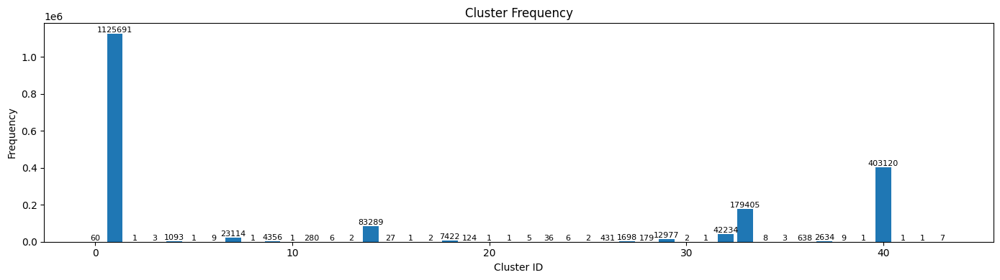

In [ ]:
freq_values = df["cluster"].value_counts().sort_index()

plt.figure(figsize=(14,4))

bars = plt.bar(freq_values.index, freq_values.values)


plt.xlabel("Cluster ID")
plt.ylabel("Frequency")
plt.title("Cluster Frequency")

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, f"{int(height)}", ha='center', va='bottom', fontsize=8)

plt.tight_layout()
plt.show()


In [ ]:
col_freq = X[ohe_cols].sum().sort_values(ascending=False)
top_k = 20
top_cols = col_freq.head(top_k)
print(top_cols)

light             825980
smartphone        329362
bicycle           134213
headphone         112047
massager          101020
clocks             95354
shoes              90779
vacuum             84454
refrigerators      81146
washer             65737
tv                 45941
printer            38738
blanket            32816
sandals            29877
slipons            29179
notebook           26599
keds               26376
blender            26307
table              26203
coffee_grinder     22144
dtype: int64


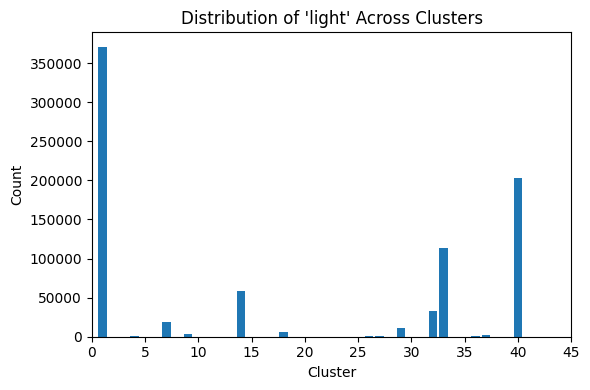

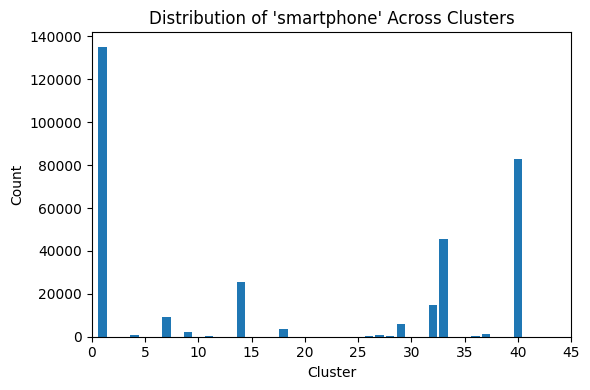

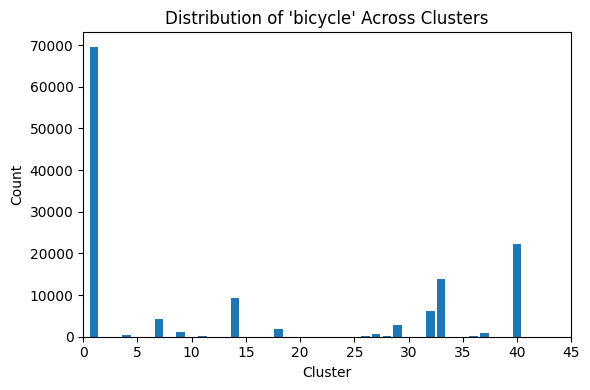

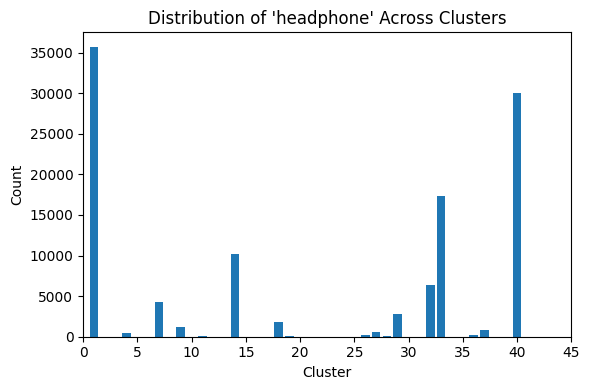

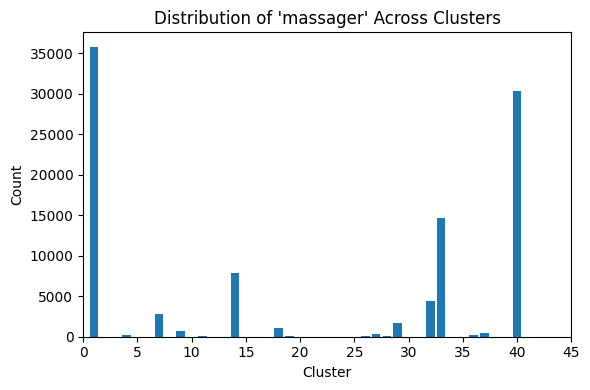

...

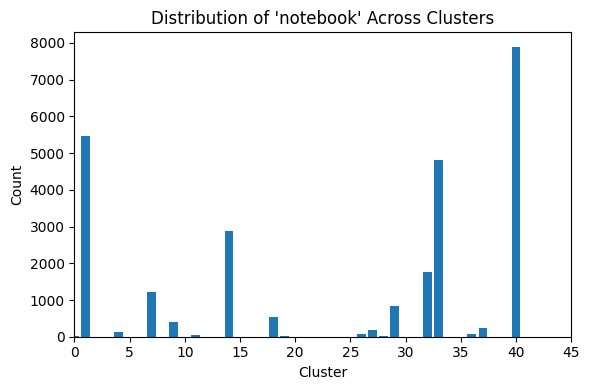

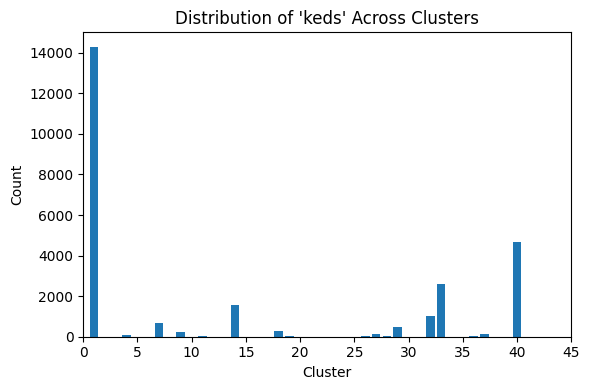

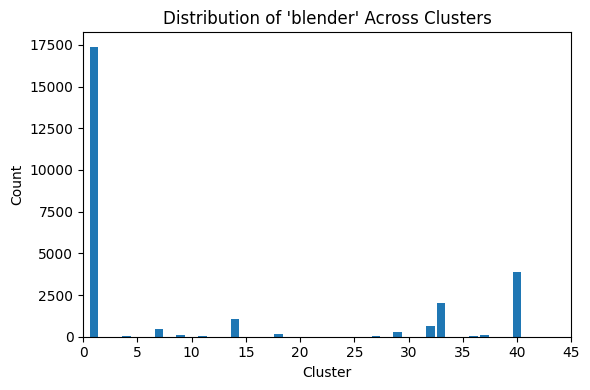

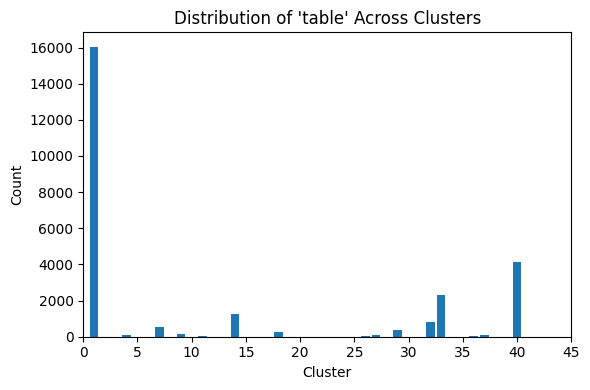

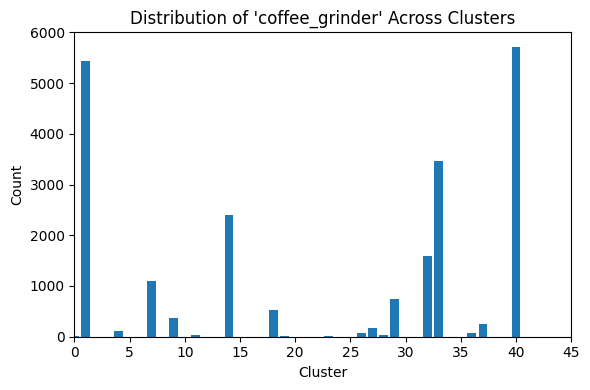

In [ ]:
clusters = X['cluster']  # your cluster assignments
df_items = X[ohe_cols].copy()
df_items["cluster"] = clusters

# Count for each item in each cluster
item_cluster_counts = df_items.groupby("cluster")[ohe_cols].sum()

top_k = 20
top_cols = col_freq.head(top_k).index.tolist()   # your top items


for item in top_cols:
    plt.figure(figsize=(6, 4))

    values = item_cluster_counts[item].values

    plt.bar(range(len(values)), values)
    plt.xlim(0, 45)

    plt.title(f"Distribution of '{item}' Across Clusters")
    plt.xlabel("Cluster")
    plt.ylabel("Count")
    plt.tight_layout()
    plt.show()


In [ ]:
frequent_itemsets = {}

labels_arr = df["cluster"].values # mask for labels rather than searching
ohe_data = X[ohe_cols]

cluster_sizes = pd.Series(labels_arr).value_counts()

unique_labels = [l for l in cluster_sizes.index if cluster_sizes[l] > 40]

total = len(unique_labels)


# itemset length 1
for i, label in enumerate(unique_labels, start=1):

    mask = (labels_arr == label) # filter for label
    temp = ohe_data.iloc[mask]  # iloc faster

    # Apriori
    frequent = apriori(
        temp,
        min_support=0.03,
        use_colnames=True,
        low_memory=True
    )

    frequent_itemsets[label] = frequent

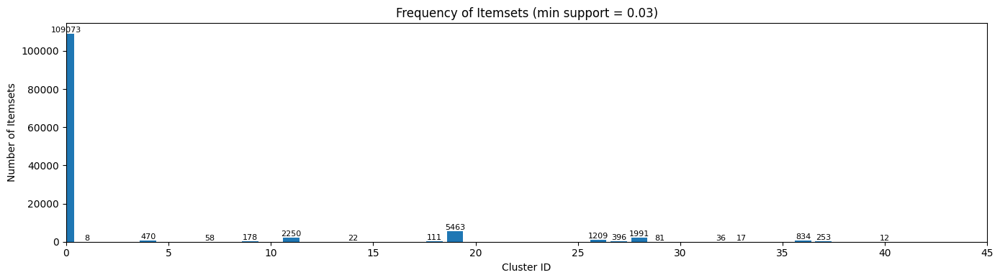

In [ ]:
cluster_ids = list(frequent_itemsets.keys())

# Count ONLY itemsets of size 2 for each cluster
lengths = [len(frequent_itemsets[c]) for c in cluster_ids]

plt.figure(figsize=(14, 4))
bars = plt.bar(cluster_ids, lengths)

plt.xlabel("Cluster ID")
plt.ylabel("Number of Itemsets")
plt.title("Frequency of Itemsets (min support = 0.03)")
plt.xlim(0, 45)

# -------------------------
# Add text labels on bars
# -------------------------
for bar in bars:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,   # x-position
        height,                              # y-position at top of bar
        f"{int(height)}",                    # text (value)
        ha='center', va='bottom', fontsize=8
    )

plt.tight_layout()
plt.show()


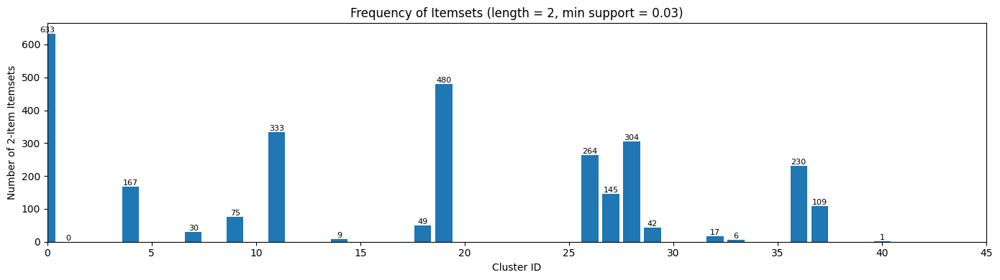

In [ ]:
cluster_ids = list(frequent_itemsets.keys())

# Count itemsets of length 2 for each cluster
lengths = [
    len(frequent_itemsets[c][frequent_itemsets[c]["itemsets"].apply(lambda x: len(x) == 2)])
    for c in cluster_ids
]

plt.figure(figsize=(14, 4))
bars = plt.bar(cluster_ids, lengths)

plt.xlabel("Cluster ID")
plt.ylabel("Number of 2-Item Itemsets")
plt.title("Frequency of Itemsets (length = 2, min support = 0.03)")
plt.xlim(0, 45)

# -------------------------
# Add text labels on bars
# -------------------------
for bar in bars:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        height,
        f"{int(height)}",
        ha='center', va='bottom', fontsize=8
    )

plt.tight_layout()
plt.show()


In [ ]:
for i in range(0, 44):
    if i not in frequent_itemsets or frequent_itemsets[i].empty:
        # skip empty clusters
        continue

    print(f"Cluster {i}")
    display(
        frequent_itemsets[i]
        .sort_values("support", ascending=False)
        .head(20)
    )


Cluster 0


,support,itemsets
23,0.950000,(light)
44,0.750000,(smartphone)
465,0.700000,"(smartphone, light)"
134,0.500000,"(bicycle, light)"
6,0.500000,(bicycle)
9,0.500000,(clocks)
214,0.483333,"(clocks, light)"
21,0.450000,(headphone)
400,0.433333,"(light, headphone)"
1172,0.366667,"(bicycle, smartphone, light)"


Cluster 1


,support,itemsets
3,0.329393,(light)
6,0.120045,(smartphone)
0,0.061817,(bicycle)
7,0.043110,(vacuum)
5,0.040061,(shoes)
1,0.034167,(clocks)
4,0.031818,(massager)
2,0.031729,(headphone)


Cluster 4


,support,itemsets
20,0.918573,(light)
36,0.557182,(smartphone)
165,0.509607,"(smartphone, light)"
3,0.379689,(bicycle)
62,0.365965,"(bicycle, light)"
8,0.365965,(clocks)
17,0.364135,(headphone)
92,0.343092,"(clocks, light)"
131,0.328454,"(light, headphone)"
31,0.261665,(shoes)


Cluster 7


,support,itemsets
6,0.813230,(light)
14,0.404603,(smartphone)
40,0.293502,"(smartphone, light)"
5,0.182487,(headphone)
0,0.181016,(bicycle)
20,0.160768,"(bicycle, light)"
2,0.160509,(clocks)
30,0.138747,"(light, headphone)"
25,0.131392,"(clocks, light)"
10,0.120663,(refrigerators)


Cluster 9


,support,itemsets
14,0.878329,(light)
23,0.505051,(smartphone)
85,0.428834,"(smartphone, light)"
2,0.286961,(bicycle)
39,0.272957,"(bicycle, light)"
12,0.264233,(headphone)
5,0.262626,(clocks)
52,0.238751,"(clocks, light)"
69,0.229109,"(light, headphone)"
20,0.191230,(shoes)


Cluster 11


,support,itemsets
25,0.907143,(light)
45,0.621429,(smartphone)
282,0.564286,"(smartphone, light)"
5,0.475000,(bicycle)
21,0.475000,(headphone)
94,0.467857,"(bicycle, light)"
10,0.467857,(clocks)
159,0.446429,"(clocks, light)"
231,0.435714,"(light, headphone)"
34,0.350000,(refrigerators)


Cluster 14


,support,itemsets
3,0.709710,(light)
9,0.306859,(smartphone)
20,0.161102,"(smartphone, light)"
2,0.121829,(headphone)
0,0.110939,(bicycle)
4,0.094310,(massager)
1,0.093362,(clocks)
13,0.084633,"(bicycle, light)"
7,0.082184,(refrigerators)
8,0.072999,(shoes)


Cluster 18


,support,itemsets
10,0.865804,(light)
19,0.473457,(smartphone)
58,0.391673,"(smartphone, light)"
1,0.259095,(bicycle)
28,0.242387,"(bicycle, light)"
8,0.238615,(headphone)
3,0.235381,(clocks)
35,0.207491,"(clocks, light)"
44,0.201428,"(light, headphone)"
14,0.172056,(refrigerators)


Cluster 19


,support,itemsets
22,0.927419,(light)
43,0.596774,(smartphone)
355,0.548387,"(smartphone, light)"
18,0.500000,(headphone)
284,0.467742,"(light, headphone)"
4,0.427419,(bicycle)
120,0.419355,"(bicycle, light)"
8,0.387097,(clocks)
183,0.370968,"(clocks, light)"
33,0.370968,(refrigerators)


Cluster 26


,support,itemsets
20,0.902552,(light)
38,0.605568,(smartphone)
238,0.535963,"(smartphone, light)"
17,0.431555,(headphone)
4,0.426914,(bicycle)
80,0.410673,"(bicycle, light)"
8,0.399072,(clocks)
189,0.396752,"(light, headphone)"
126,0.375870,"(clocks, light)"
202,0.301624,"(smartphone, headphone)"


Cluster 27


,support,itemsets
19,0.908127,(light)
34,0.533569,(smartphone)
146,0.473498,"(smartphone, light)"
3,0.356302,(bicycle)
57,0.342167,"(bicycle, light)"
16,0.333333,(headphone)
7,0.327444,(clocks)
81,0.309776,"(clocks, light)"
118,0.304476,"(light, headphone)"
30,0.249706,(shoes)


Cluster 28


,support,itemsets
20,0.921788,(light)
39,0.625698,(smartphone)
260,0.569832,"(smartphone, light)"
8,0.469274,(clocks)
133,0.446927,"(clocks, light)"
4,0.413408,(bicycle)
78,0.407821,"(bicycle, light)"
16,0.391061,(headphone)
213,0.363128,"(light, headphone)"
250,0.346369,"(light, refrigerators)"


Cluster 29


,support,itemsets
7,0.838175,(light)
15,0.443708,(smartphone)
48,0.348848,"(smartphone, light)"
0,0.222856,(bicycle)
5,0.219928,(headphone)
22,0.202050,"(bicycle, light)"
2,0.194806,(clocks)
34,0.176620,"(light, headphone)"
29,0.165678,"(clocks, light)"
13,0.142791,(shoes)


Cluster 32


,support,itemsets
5,0.772482,(light)
12,0.355567,(smartphone)
28,0.228820,"(smartphone, light)"
4,0.150021,(headphone)
0,0.147654,(bicycle)
18,0.126936,"(bicycle, light)"
1,0.125562,(clocks)
6,0.105673,(massager)
22,0.101293,"(light, headphone)"
9,0.097173,(refrigerators)


Cluster 33


,support,itemsets
3,0.632218,(light)
7,0.254764,(smartphone)
2,0.096352,(headphone)
16,0.090298,"(smartphone, light)"
4,0.081458,(massager)
0,0.077607,(bicycle)
5,0.068382,(refrigerators)
1,0.063889,(clocks)
6,0.054893,(shoes)
11,0.049486,"(bicycle, light)"


Cluster 36


,support,itemsets
22,0.915361,(light)
40,0.570533,(smartphone)
214,0.517241,"(smartphone, light)"
19,0.407524,(headphone)
9,0.391850,(clocks)
4,0.382445,(bicycle)
171,0.369906,"(light, headphone)"
74,0.369906,"(bicycle, light)"
120,0.366771,"(clocks, light)"
35,0.293103,(shoes)


Cluster 37


,support,itemsets
15,0.885345,(light)
26,0.536446,(smartphone)
108,0.458618,"(smartphone, light)"
13,0.307897,(headphone)
3,0.300683,(bicycle)
46,0.285877,"(bicycle, light)"
6,0.279043,(clocks)
88,0.268793,"(light, headphone)"
65,0.253227,"(clocks, light)"
22,0.219058,(shoes)


Cluster 40


,support,itemsets
3,0.504877,(light)
7,0.206078,(smartphone)
4,0.075278,(massager)
2,0.074367,(headphone)
5,0.061895,(refrigerators)
0,0.055505,(bicycle)
1,0.051471,(clocks)
10,0.047048,(washer)
11,0.043538,"(smartphone, light)"
6,0.042819,(shoes)


In [ ]:
for i in range(0, 45):

    # Skip cluster if missing or empty
    if i not in frequent_itemsets or frequent_itemsets[i].empty:
        continue

    freq = frequent_itemsets[i]

    # Filter ONLY 2-item itemsets
    freq_size2 = freq[freq["itemsets"].apply(lambda s: len(s) == 2)]

    # Skip if no 2-item itemsets
    if freq_size2.empty:
        continue

    print(f"Cluster {i}")
    display(freq_size2.sort_values("support", ascending=False).head(20))


Cluster 0


,support,itemsets
465,0.700000,"(smartphone, light)"
134,0.500000,"(bicycle, light)"
214,0.483333,"(clocks, light)"
400,0.433333,"(light, headphone)"
150,0.366667,"(bicycle, smartphone)"
230,0.350000,"(clocks, smartphone)"
461,0.350000,"(light, shoes)"
414,0.333333,"(smartphone, headphone)"
122,0.316667,"(clocks, bicycle)"
448,0.316667,"(notebook, light)"


Cluster 4


,support,itemsets
165,0.509607,"(smartphone, light)"
62,0.365965,"(bicycle, light)"
92,0.343092,"(clocks, light)"
131,0.328454,"(light, headphone)"
160,0.250686,"(light, shoes)"
156,0.234218,"(light, refrigerators)"
139,0.223239,"(smartphone, headphone)"
100,0.215005,"(clocks, smartphone)"
70,0.208600,"(bicycle, smartphone)"
150,0.203111,"(massager, light)"


Cluster 7


,support,itemsets
40,0.293502,"(smartphone, light)"
20,0.160768,"(bicycle, light)"
30,0.138747,"(light, headphone)"
25,0.131392,"(clocks, light)"
38,0.101281,"(light, shoes)"
36,0.099074,"(light, refrigerators)"
33,0.095224,"(massager, light)"
32,0.075668,"(smartphone, headphone)"
27,0.065588,"(clocks, smartphone)"
22,0.062473,"(bicycle, smartphone)"


Cluster 9


,support,itemsets
85,0.428834,"(smartphone, light)"
39,0.272957,"(bicycle, light)"
52,0.238751,"(clocks, light)"
69,0.229109,"(light, headphone)"
82,0.179752,"(light, shoes)"
80,0.173554,"(light, refrigerators)"
77,0.153352,"(massager, light)"
75,0.145776,"(smartphone, headphone)"
58,0.137052,"(clocks, smartphone)"
46,0.135904,"(bicycle, smartphone)"


Cluster 11


,support,itemsets
282,0.564286,"(smartphone, light)"
94,0.467857,"(bicycle, light)"
159,0.446429,"(clocks, light)"
231,0.435714,"(light, headphone)"
272,0.335714,"(light, refrigerators)"
243,0.314286,"(smartphone, headphone)"
91,0.310714,"(bicycle, headphone)"
171,0.303571,"(clocks, smartphone)"
157,0.296429,"(clocks, headphone)"
84,0.292857,"(clocks, bicycle)"


Cluster 14


,support,itemsets
20,0.161102,"(smartphone, light)"
13,0.084633,"(bicycle, light)"
15,0.067824,"(light, headphone)"
14,0.060464,"(clocks, light)"
17,0.056130,"(massager, light)"
19,0.052180,"(light, shoes)"
18,0.049706,"(light, refrigerators)"
16,0.033474,"(smartphone, headphone)"
21,0.031241,"(vacuum, light)"


Cluster 18


,support,itemsets
58,0.391673,"(smartphone, light)"
28,0.242387,"(bicycle, light)"
35,0.207491,"(clocks, light)"
44,0.201428,"(light, headphone)"
56,0.157235,"(light, shoes)"
54,0.155618,"(light, refrigerators)"
51,0.133387,"(massager, light)"
49,0.119644,"(smartphone, headphone)"
39,0.116815,"(clocks, smartphone)"
32,0.112638,"(bicycle, smartphone)"


Cluster 19


,support,itemsets
355,0.548387,"(smartphone, light)"
284,0.467742,"(light, headphone)"
120,0.419355,"(bicycle, light)"
183,0.370968,"(clocks, light)"
345,0.354839,"(light, refrigerators)"
302,0.322581,"(smartphone, headphone)"
350,0.298387,"(light, shoes)"
335,0.274194,"(massager, light)"
118,0.266129,"(bicycle, headphone)"
136,0.258065,"(bicycle, smartphone)"


Cluster 26


,support,itemsets
238,0.535963,"(smartphone, light)"
80,0.410673,"(bicycle, light)"
189,0.396752,"(light, headphone)"
126,0.375870,"(clocks, light)"
202,0.301624,"(smartphone, headphone)"
229,0.285383,"(light, refrigerators)"
71,0.255220,"(clocks, bicycle)"
138,0.250580,"(clocks, smartphone)"
233,0.248260,"(light, shoes)"
91,0.245940,"(bicycle, smartphone)"


Cluster 27


,support,itemsets
146,0.473498,"(smartphone, light)"
57,0.342167,"(bicycle, light)"
81,0.309776,"(clocks, light)"
118,0.304476,"(light, headphone)"
142,0.240872,"(light, shoes)"
138,0.220848,"(light, refrigerators)"
89,0.191402,"(clocks, smartphone)"
135,0.185512,"(massager, light)"
126,0.183746,"(smartphone, headphone)"
65,0.177856,"(bicycle, smartphone)"


Cluster 28


,support,itemsets
260,0.569832,"(smartphone, light)"
133,0.446927,"(clocks, light)"
78,0.407821,"(bicycle, light)"
213,0.363128,"(light, headphone)"
250,0.346369,"(light, refrigerators)"
255,0.307263,"(light, shoes)"
149,0.301676,"(clocks, smartphone)"
68,0.290503,"(clocks, bicycle)"
92,0.273743,"(bicycle, smartphone)"
130,0.256983,"(clocks, headphone)"


Cluster 29


,support,itemsets
48,0.348848,"(smartphone, light)"
22,0.202050,"(bicycle, light)"
34,0.176620,"(light, headphone)"
29,0.165678,"(clocks, light)"
46,0.126377,"(light, shoes)"
44,0.122447,"(light, refrigerators)"
41,0.112661,"(massager, light)"
39,0.101487,"(smartphone, headphone)"
31,0.090237,"(clocks, smartphone)"
26,0.088695,"(bicycle, smartphone)"


Cluster 32


,support,itemsets
28,0.228820,"(smartphone, light)"
18,0.126936,"(bicycle, light)"
22,0.101293,"(light, headphone)"
20,0.093953,"(clocks, light)"
24,0.076739,"(massager, light)"
27,0.076668,"(light, shoes)"
26,0.072667,"(light, refrigerators)"
23,0.053630,"(smartphone, headphone)"
21,0.044774,"(clocks, smartphone)"
19,0.042951,"(bicycle, smartphone)"


Cluster 33


,support,itemsets
16,0.090298,"(smartphone, light)"
11,0.049486,"(bicycle, light)"
13,0.038761,"(light, headphone)"
14,0.036186,"(massager, light)"
12,0.032585,"(clocks, light)"
15,0.032424,"(light, shoes)"


Cluster 36


,support,itemsets
214,0.517241,"(smartphone, light)"
74,0.369906,"(bicycle, light)"
171,0.369906,"(light, headphone)"
120,0.366771,"(clocks, light)"
209,0.283699,"(light, shoes)"
205,0.264890,"(light, refrigerators)"
183,0.241379,"(smartphone, headphone)"
197,0.241379,"(massager, light)"
130,0.238245,"(clocks, smartphone)"
67,0.221003,"(clocks, bicycle)"


Cluster 37


,support,itemsets
108,0.458618,"(smartphone, light)"
46,0.285877,"(bicycle, light)"
88,0.268793,"(light, headphone)"
65,0.253227,"(clocks, light)"
105,0.206150,"(light, shoes)"
102,0.201595,"(light, refrigerators)"
96,0.178056,"(smartphone, headphone)"
99,0.176158,"(massager, light)"
71,0.160972,"(clocks, smartphone)"
54,0.149203,"(bicycle, smartphone)"


Cluster 40


,support,itemsets
11,0.043538,"(smartphone, light)"


In [ ]:
pairs = list(zip(cluster_ids, lengths))
pairs_sorted = sorted(pairs, key=lambda x: x[1], reverse=True)

top_20 = pairs_sorted[:20]

print("Top 20 clusters by number of itemsets:")
for cid, count in top_20:
    print(f"Cluster {cid}: {count} itemsets")

Top 20 clusters by number of itemsets:
Cluster 0: 633 itemsets
Cluster 19: 480 itemsets
Cluster 11: 333 itemsets
Cluster 28: 304 itemsets
Cluster 26: 264 itemsets
Cluster 36: 230 itemsets
Cluster 4: 167 itemsets
Cluster 27: 145 itemsets
Cluster 37: 109 itemsets
Cluster 9: 75 itemsets
Cluster 18: 49 itemsets
Cluster 29: 42 itemsets
Cluster 7: 30 itemsets
Cluster 32: 17 itemsets
Cluster 14: 9 itemsets
Cluster 33: 6 itemsets
Cluster 40: 1 itemsets
Cluster 1: 0 itemsets


In [ ]:
rules_dict = {}

for label, itemset_df in frequent_itemsets.items():

    # --- skip clusters with no frequent itemsets ---
    if itemset_df.empty:
        rules_dict[label] = itemset_df
        continue

    # --- association rules ---
    try:
        rules = association_rules(
            itemset_df,
            metric="lift",
            min_threshold=2.0
        )
    except ValueError:
        # ignore if itemset size is less than 2
        rules = pd.DataFrame()

    rules_dict[label] = rules

In [ ]:
for i in range(0, 44):

    # Skip if cluster missing or rules table empty
    if i not in rules_dict or rules_dict[i].empty:
        continue

    rules = rules_dict[i]

    # Filter rules with antecedent size 2
    rules_size2 = rules[rules["antecedents"].apply(lambda x: len(x) == 2)]

    # Skip if no matching rules
    if rules_size2.empty:
        continue

    print(f"Cluster {i}")
    display(rules_size2.sort_values(by="lift", ascending=False).sort_values("lift", ascending=False).head(10))



In [ ]:
from collections import defaultdict

# 1. Build user → cluster map
user_cluster_map = df.set_index("user_id")["cluster"].to_dict()


# 2. Build purchased items per user

purchased_list = (
    (df[ohe_cols] == 1)
    .apply(lambda row: row.index[row].tolist(), axis=1)
)

purchased_dict = dict(zip(df["user_id"], purchased_list))



# 3. Build rules lookup per cluster
fast_rules = {}

for label, rules in rules_dict.items():

    if rules is None or rules.empty:
        fast_rules[label] = {}
        continue

    # keep only antecedents and consequents of length 1
    rules_1_1 = rules[
        (rules["antecedents"].apply(lambda x: isinstance(x, frozenset) and len(x) == 1)) &
        (rules["consequents"].apply(lambda x: isinstance(x, frozenset) and len(x) == 1))
    ]

    if rules_1_1.empty:
        fast_rules[label] = {}
        continue

    # extract items
    antecedents = rules_1_1["antecedents"].apply(lambda x: next(iter(x)))
    consequents = rules_1_1["consequents"].apply(lambda x: next(iter(x)))

    # collect ALL consequents per antecedent
    rule_map = defaultdict(set)
    for a, c in zip(antecedents, consequents):
        rule_map[a].add(c)

    fast_rules[label] = {a: list(cs) for a, cs in rule_map.items()}


# 4. Generate recommendations
recommended = []

for user in df["user_id"]:
    cluster = user_cluster_map[user]
    items_bought = set(purchased_dict[user])
    rules_map = fast_rules.get(cluster, {})

    recs = set()

    # add ALL consequents for all purchased items
    for a in items_bought:
        if a in rules_map:
            recs.update(rules_map[a])

    # REMOVE items the user already purchased
    recs -= items_bought

    recommended.append(list(recs))

df["recommended_items"] = recommended


In [ ]:
df[(df["smartphone"] == 1.0) & (df["cluster"] == 22) & (df["recommended_items"].str.len() > 0)].head(2)

In [ ]:
df[df["recommended_items"].str.len() > 0].shape

# K-Means w/ fitted

In [ ]:
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import fpgrowth
from mlxtend.frequent_patterns import association_rules
warnings.filterwarnings("ignore", category=DeprecationWarning)

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/AI_Dataset/holdout3fitted_with_clusters.csv")
df2 = pd.read_csv("/content/drive/MyDrive/AI_Dataset/holdout3fitted_with_clusters.csv")

In [ ]:
df.shape

(283313, 157)

In [ ]:
start = df.columns.get_loc("acoustic")

ohe_cols = df.columns[start:-1]

X = df[["cluster"] + list(ohe_cols)]

In [ ]:
col_freq = X[ohe_cols].sum().sort_values(ascending=False)
top_k = 20
top_cols = col_freq.head(top_k)
print(top_cols)

light            123607
smartphone        49429
bicycle           20004
headphone         16798
massager          15146
clocks            14401
shoes             13566
vacuum            12873
refrigerators     12124
washer             9928
tv                 7042
printer            5911
blanket            5007
sandals            4520
slipons            4443
blender            4046
table              3966
notebook           3943
keds               3903
toys               3395
dtype: int64


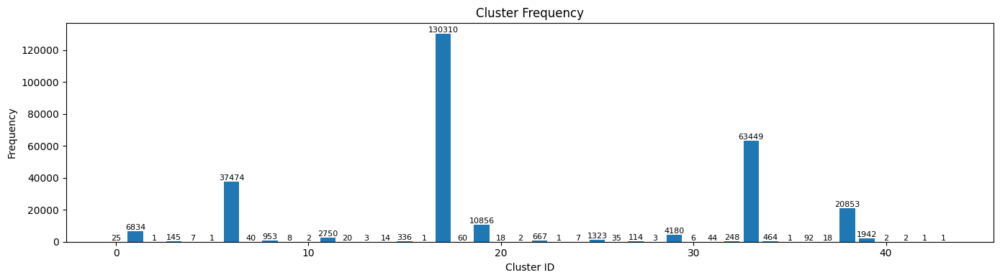

In [ ]:
freq_values = df["cluster"].value_counts().sort_index()

plt.figure(figsize=(14,4))

bars = plt.bar(freq_values.index, freq_values.values)


plt.xlabel("Cluster ID")
plt.ylabel("Frequency")
plt.title("Cluster Frequency")

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, f"{int(height)}", ha='center', va='bottom', fontsize=8)

plt.tight_layout()
plt.show()


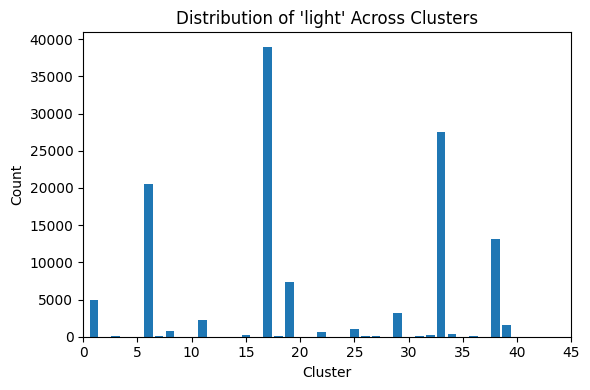

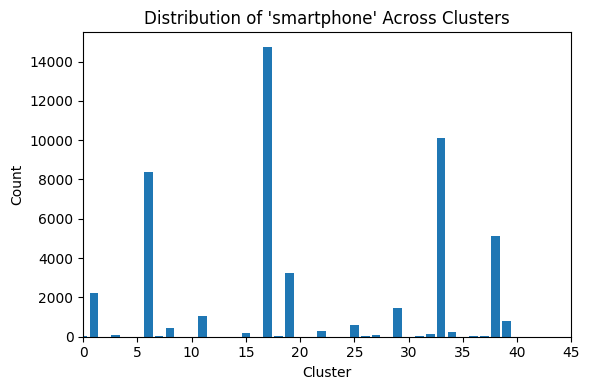

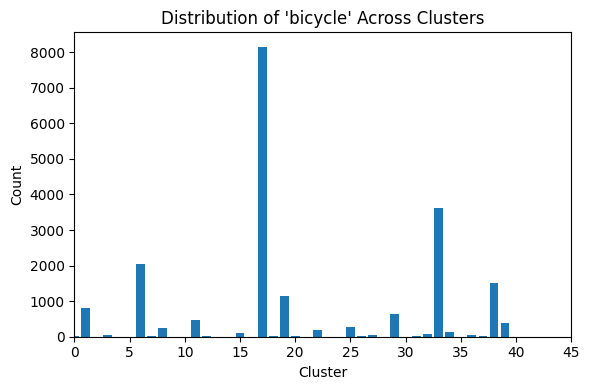

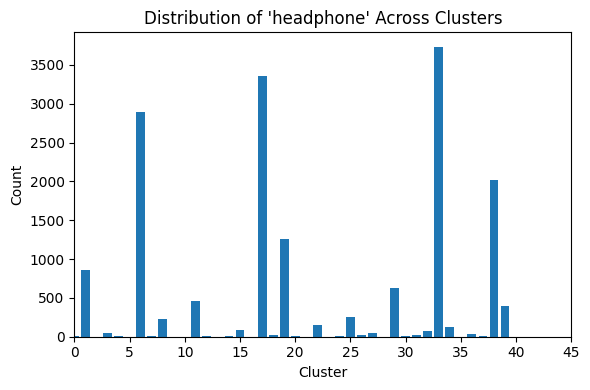

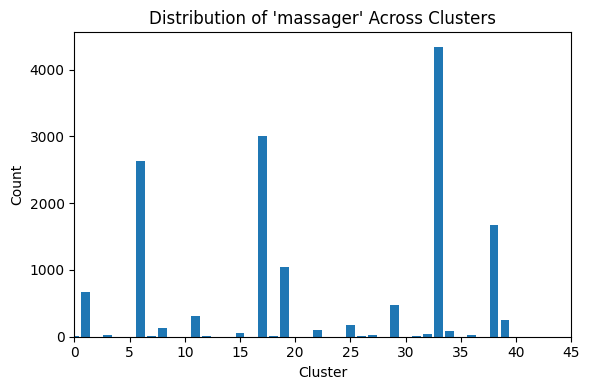

...

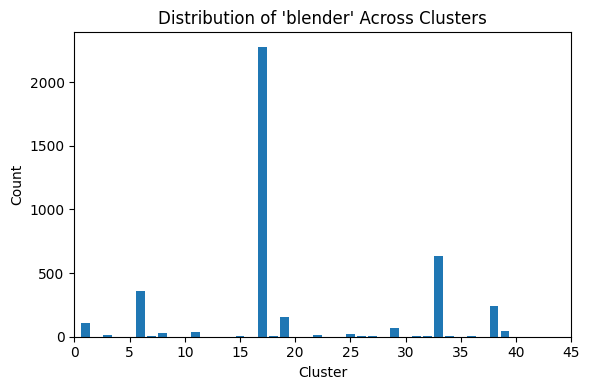

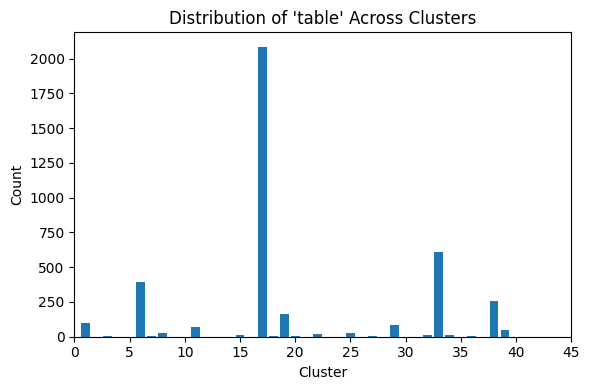

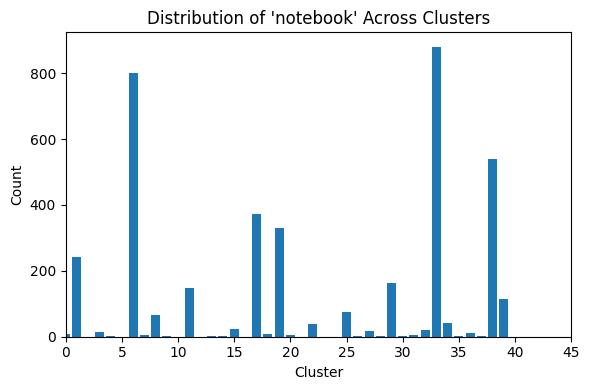

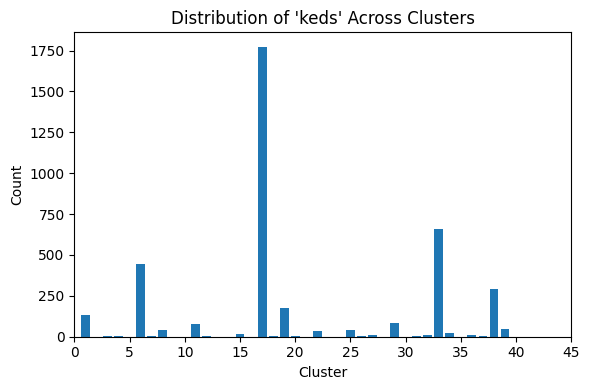

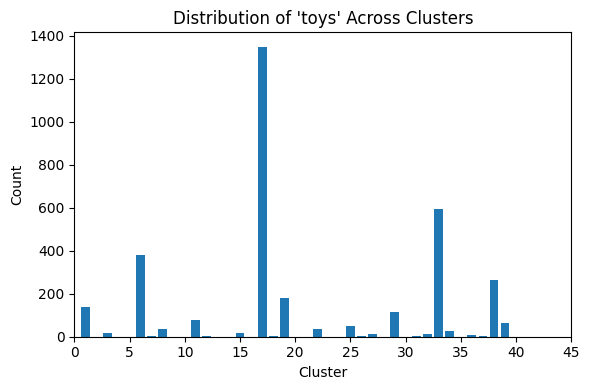

In [ ]:
clusters = X['cluster']  # your cluster assignments
df_items = X[ohe_cols].copy()
df_items["cluster"] = clusters

# Count for each item in each cluster
item_cluster_counts = df_items.groupby("cluster")[ohe_cols].sum()

top_k = 20
top_cols = col_freq.head(top_k).index.tolist()   # your top items


for item in top_cols:
    plt.figure(figsize=(6, 4))

    values = item_cluster_counts[item].values

    plt.bar(range(len(values)), values)
    plt.xlim(0, 45)

    plt.title(f"Distribution of '{item}' Across Clusters")
    plt.xlabel("Cluster")
    plt.ylabel("Count")
    plt.tight_layout()
    plt.show()


In [ ]:
frequent_itemsets = {}

labels_arr = df["cluster"].values # mask for labels rather than searching
ohe_data = X[ohe_cols]

cluster_sizes = pd.Series(labels_arr).value_counts()

unique_labels = [l for l in cluster_sizes.index if cluster_sizes[l] > 40]

total = len(unique_labels)


# itemset length 1
for i, label in enumerate(unique_labels, start=1):

    mask = (labels_arr == label) # filter for label
    temp = ohe_data.iloc[mask]  # iloc faster

    # Apriori
    frequent = apriori(
        temp,
        min_support=0.03,
        use_colnames=True,
        low_memory=True
    )

    frequent_itemsets[label] = frequent

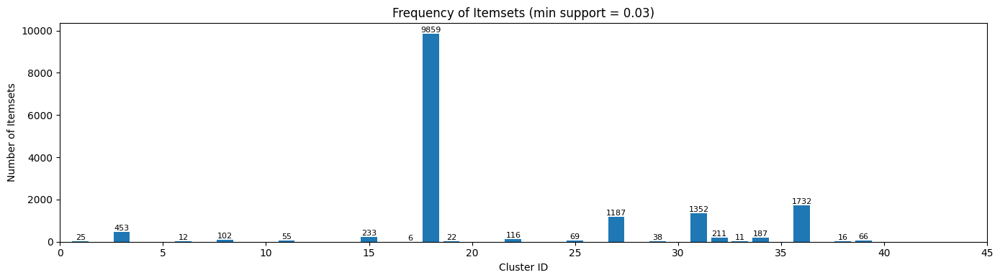

In [ ]:
cluster_ids = list(frequent_itemsets.keys())

# Count ONLY itemsets of size 2 for each cluster
lengths = [len(frequent_itemsets[c]) for c in cluster_ids]

plt.figure(figsize=(14, 4))
bars = plt.bar(cluster_ids, lengths)

plt.xlabel("Cluster ID")
plt.ylabel("Number of Itemsets")
plt.title("Frequency of Itemsets (min support = 0.03)")
plt.xlim(0, 45)

# -------------------------
# Add text labels on bars
# -------------------------
for bar in bars:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,   # x-position
        height,                              # y-position at top of bar
        f"{int(height)}",                    # text (value)
        ha='center', va='bottom', fontsize=8
    )

plt.tight_layout()
plt.show()


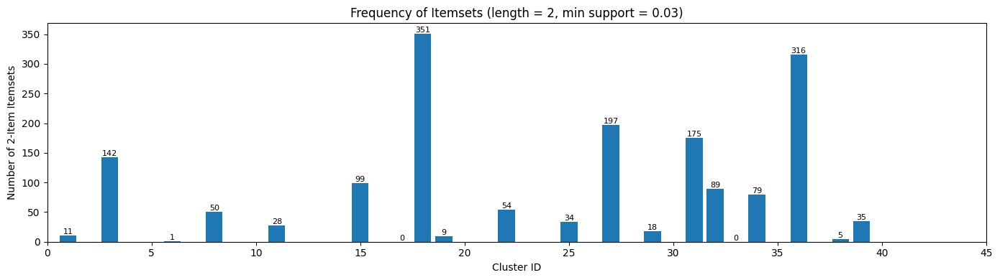

In [ ]:
cluster_ids = list(frequent_itemsets.keys())

# Count itemsets of length 2 for each cluster
lengths = [
    len(frequent_itemsets[c][frequent_itemsets[c]["itemsets"].apply(lambda x: len(x) == 2)])
    for c in cluster_ids
]

plt.figure(figsize=(14, 4))
bars = plt.bar(cluster_ids, lengths)

plt.xlabel("Cluster ID")
plt.ylabel("Number of 2-Item Itemsets")
plt.title("Frequency of Itemsets (length = 2, min support = 0.03)")
plt.xlim(0, 45)

# -------------------------
# Add text labels on bars
# -------------------------
for bar in bars:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        height,
        f"{int(height)}",
        ha='center', va='bottom', fontsize=8
    )

plt.tight_layout()
plt.show()


In [ ]:
for i in range(0, 44):
    if i not in frequent_itemsets or frequent_itemsets[i].empty:
        # skip empty clusters
        continue

    print(f"Cluster {i}")
    display(
        frequent_itemsets[i]
        .sort_values("support", ascending=False)
        .head(20)
    )


Cluster 1


,support,itemsets
4,0.730465,(light)
10,0.322651,(smartphone)
22,0.177056,"(light, smartphone)"
3,0.125110,(headphone)
0,0.116915,(bicycle)
1,0.101844,(clocks)
5,0.097893,(massager)
14,0.092186,"(bicycle, light)"
8,0.078724,(refrigerators)
9,0.077407,(shoes)


Cluster 3


,support,itemsets
14,0.944828,(light)
27,0.586207,(smartphone)
133,0.537931,"(light, smartphone)"
3,0.413793,(bicycle)
6,0.406897,(clocks)
48,0.386207,"(bicycle, light)"
77,0.379310,"(clocks, light)"
12,0.324138,(headphone)
106,0.303448,"(light, headphone)"
86,0.268966,"(clocks, smartphone)"


Cluster 6


,support,itemsets
3,0.548460,(light)
7,0.224235,(smartphone)
2,0.077227,(headphone)
4,0.070129,(massager)
5,0.060335,(refrigerators)
0,0.054678,(bicycle)
11,0.049448,"(light, smartphone)"
10,0.045418,(washer)
1,0.045365,(clocks)
6,0.043177,(shoes)


Cluster 8


,support,itemsets
10,0.869885,(light)
18,0.453305,(smartphone)
57,0.376705,"(light, smartphone)"
0,0.245540,(bicycle)
8,0.245540,(headphone)
26,0.227702,"(bicycle, light)"
3,0.209864,(clocks)
43,0.199370,"(light, headphone)"
35,0.183631,"(clocks, light)"
14,0.157398,(refrigerators)


Cluster 11


,support,itemsets
6,0.800364,(light)
14,0.390545,(smartphone)
37,0.279636,"(light, smartphone)"
0,0.166909,(bicycle)
5,0.166545,(headphone)
2,0.149818,(clocks)
20,0.146545,"(bicycle, light)"
28,0.123273,"(light, headphone)"
24,0.120000,"(clocks, light)"
7,0.115273,(massager)


Cluster 15


,support,itemsets
15,0.854167,(light)
27,0.559524,(smartphone)
106,0.461310,"(light, smartphone)"
2,0.294643,(bicycle)
43,0.282738,"(bicycle, light)"
20,0.261905,(refrigerators)
13,0.258929,(headphone)
5,0.247024,(clocks)
100,0.241071,"(refrigerators, light)"
86,0.229167,"(light, headphone)"


Cluster 17


,support,itemsets
2,0.299110,(light)
4,0.113169,(smartphone)
0,0.062543,(bicycle)
5,0.042468,(vacuum)
3,0.039360,(shoes)
1,0.032914,(clocks)


Cluster 18


,support,itemsets
21,0.966667,(light)
38,0.500000,(smartphone)
287,0.483333,"(light, smartphone)"
7,0.433333,(clocks)
146,0.416667,"(clocks, light)"
83,0.400000,"(bicycle, light)"
3,0.400000,(bicycle)
33,0.350000,(shoes)
282,0.333333,"(light, shoes)"
237,0.316667,"(light, headphone)"


Cluster 19


,support,itemsets
3,0.678795,(light)
9,0.297071,(smartphone)
20,0.143515,"(light, smartphone)"
2,0.116433,(headphone)
0,0.104458,(bicycle)
4,0.095523,(massager)
1,0.087601,(clocks)
7,0.078758,(refrigerators)
13,0.075718,"(bicycle, light)"
8,0.068810,(shoes)


Cluster 22


,support,itemsets
8,0.868066,(light)
18,0.460270,(smartphone)
62,0.377811,"(light, smartphone)"
1,0.280360,(bicycle)
30,0.266867,"(bicycle, light)"
3,0.247376,(clocks)
6,0.233883,(headphone)
39,0.209895,"(clocks, light)"
47,0.194903,"(light, headphone)"
12,0.169415,(refrigerators)


Cluster 25


,support,itemsets
7,0.831444,(light)
15,0.449735,(smartphone)
42,0.352986,"(light, smartphone)"
0,0.201814,(bicycle)
5,0.189720,(headphone)
22,0.187453,"(bicycle, light)"
2,0.183673,(clocks)
27,0.163265,"(clocks, light)"
32,0.145881,"(light, headphone)"
13,0.142101,(shoes)


Cluster 27


,support,itemsets
14,0.912281,(light)
27,0.587719,(smartphone)
175,0.535088,"(light, smartphone)"
4,0.438596,(bicycle)
61,0.429825,"(bicycle, light)"
11,0.377193,(headphone)
6,0.368421,(clocks)
141,0.350877,"(light, headphone)"
92,0.342105,"(clocks, light)"
72,0.271930,"(bicycle, smartphone)"


Cluster 29


,support,itemsets
4,0.768182,(light)
12,0.350718,(smartphone)
29,0.217943,"(light, smartphone)"
0,0.155981,(bicycle)
3,0.148565,(headphone)
18,0.133493,"(bicycle, light)"
1,0.131579,(clocks)
5,0.112440,(massager)
8,0.102632,(refrigerators)
23,0.101675,"(light, headphone)"


Cluster 31


,support,itemsets
17,0.818182,(light)
30,0.636364,(smartphone)
163,0.477273,"(light, smartphone)"
14,0.386364,(headphone)
135,0.340909,"(light, headphone)"
142,0.318182,"(smartphone, headphone)"
161,0.295455,"(light, shoes)"
59,0.295455,"(bicycle, light)"
3,0.295455,(bicycle)
27,0.295455,(shoes)


Cluster 32


,support,itemsets
11,0.899194,(light)
23,0.540323,(smartphone)
90,0.479839,"(light, smartphone)"
9,0.322581,(headphone)
70,0.294355,"(light, headphone)"
5,0.294355,(clocks)
2,0.282258,(bicycle)
38,0.262097,"(bicycle, light)"
54,0.254032,"(clocks, light)"
20,0.241935,(shoes)


Cluster 33


,support,itemsets
3,0.433703,(light)
7,0.159640,(smartphone)
4,0.068433,(massager)
2,0.058819,(headphone)
0,0.056991,(bicycle)
10,0.055084,(washer)
5,0.050923,(refrigerators)
9,0.047235,(vacuum)
1,0.047124,(clocks)
6,0.041703,(shoes)


Cluster 34


,support,itemsets
14,0.892241,(light)
24,0.476293,(smartphone)
88,0.407328,"(light, smartphone)"
2,0.290948,(bicycle)
11,0.282328,(headphone)
39,0.271552,"(bicycle, light)"
5,0.271552,(clocks)
70,0.245690,"(light, headphone)"
55,0.237069,"(clocks, light)"
15,0.172414,(massager)


Cluster 36


,support,itemsets
17,0.945652,(light)
38,0.597826,(smartphone)
261,0.565217,"(light, smartphone)"
14,0.445652,(headphone)
205,0.413043,"(light, headphone)"
4,0.380435,(bicycle)
6,0.369565,(clocks)
81,0.358696,"(bicycle, light)"
128,0.347826,"(clocks, light)"
216,0.293478,"(smartphone, headphone)"


Cluster 38


,support,itemsets
3,0.630269,(light)
7,0.245240,(smartphone)
2,0.096725,(headphone)
15,0.083154,"(light, smartphone)"
4,0.080468,(massager)
0,0.071788,(bicycle)
5,0.065123,(refrigerators)
1,0.063492,(clocks)
6,0.054237,(shoes)
10,0.048482,(washer)


Cluster 39


,support,itemsets
6,0.816169,(light)
14,0.415551,(smartphone)
43,0.307415,"(light, smartphone)"
5,0.205458,(headphone)
0,0.194645,(bicycle)
21,0.173532,"(bicycle, light)"
2,0.172503,(clocks)
32,0.158084,"(light, headphone)"
27,0.144181,"(clocks, light)"
7,0.130278,(massager)


In [ ]:
for i in range(0, 45):

    # Skip cluster if missing or empty
    if i not in frequent_itemsets or frequent_itemsets[i].empty:
        continue

    freq = frequent_itemsets[i]

    # Filter ONLY 2-item itemsets
    freq_size2 = freq[freq["itemsets"].apply(lambda s: len(s) == 2)]

    # Skip if no 2-item itemsets
    if freq_size2.empty:
        continue

    print(f"Cluster {i}")
    display(freq_size2.sort_values("support", ascending=False).head(20))


Cluster 1


,support,itemsets
22,0.177056,"(light, smartphone)"
14,0.092186,"(bicycle, light)"
17,0.076236,"(light, headphone)"
15,0.069359,"(clocks, light)"
19,0.062335,"(light, massager)"
21,0.058970,"(light, shoes)"
20,0.051507,"(refrigerators, light)"
18,0.037021,"(smartphone, headphone)"
24,0.034533,"(washer, light)"
23,0.033655,"(light, vacuum)"


Cluster 3


,support,itemsets
133,0.537931,"(light, smartphone)"
48,0.386207,"(bicycle, light)"
77,0.379310,"(clocks, light)"
106,0.303448,"(light, headphone)"
86,0.268966,"(clocks, smartphone)"
44,0.255172,"(clocks, bicycle)"
129,0.255172,"(light, shoes)"
56,0.241379,"(bicycle, smartphone)"
127,0.213793,"(refrigerators, light)"
115,0.206897,"(smartphone, headphone)"


Cluster 6


,support,itemsets
11,0.049448,"(light, smartphone)"


Cluster 8


,support,itemsets
57,0.376705,"(light, smartphone)"
26,0.227702,"(bicycle, light)"
43,0.199370,"(light, headphone)"
35,0.183631,"(clocks, light)"
53,0.145855,"(refrigerators, light)"
55,0.143757,"(light, shoes)"
50,0.126967,"(light, massager)"
48,0.117524,"(smartphone, headphone)"
30,0.113326,"(bicycle, smartphone)"
38,0.092340,"(clocks, smartphone)"


Cluster 11


,support,itemsets
37,0.279636,"(light, smartphone)"
20,0.146545,"(bicycle, light)"
28,0.123273,"(light, headphone)"
24,0.120000,"(clocks, light)"
35,0.093455,"(light, shoes)"
30,0.088727,"(light, massager)"
33,0.084727,"(refrigerators, light)"
29,0.060727,"(smartphone, headphone)"
26,0.055273,"(clocks, smartphone)"
22,0.052000,"(bicycle, smartphone)"


Cluster 15


,support,itemsets
106,0.461310,"(light, smartphone)"
43,0.282738,"(bicycle, light)"
100,0.241071,"(refrigerators, light)"
86,0.229167,"(light, headphone)"
58,0.223214,"(clocks, light)"
102,0.211310,"(light, shoes)"
48,0.163690,"(bicycle, smartphone)"
92,0.154762,"(smartphone, headphone)"
97,0.151786,"(light, massager)"
64,0.130952,"(clocks, smartphone)"


Cluster 18


,support,itemsets
287,0.483333,"(light, smartphone)"
146,0.416667,"(clocks, light)"
83,0.400000,"(bicycle, light)"
282,0.333333,"(light, shoes)"
237,0.316667,"(light, headphone)"
277,0.266667,"(refrigerators, light)"
272,0.250000,"(light, massager)"
75,0.250000,"(clocks, bicycle)"
158,0.233333,"(clocks, smartphone)"
95,0.233333,"(bicycle, smartphone)"


Cluster 19


,support,itemsets
20,0.143515,"(light, smartphone)"
13,0.075718,"(bicycle, light)"
15,0.059690,"(light, headphone)"
17,0.052321,"(light, massager)"
14,0.051953,"(clocks, light)"
19,0.046887,"(light, shoes)"
18,0.043939,"(refrigerators, light)"
21,0.031043,"(light, vacuum)"
16,0.030398,"(smartphone, headphone)"


Cluster 22


,support,itemsets
62,0.377811,"(light, smartphone)"
30,0.266867,"(bicycle, light)"
39,0.209895,"(clocks, light)"
47,0.194903,"(light, headphone)"
57,0.151424,"(refrigerators, light)"
54,0.139430,"(light, massager)"
43,0.124438,"(clocks, smartphone)"
59,0.121439,"(light, shoes)"
52,0.115442,"(smartphone, headphone)"
36,0.106447,"(bicycle, smartphone)"


Cluster 25


,support,itemsets
42,0.352986,"(light, smartphone)"
22,0.187453,"(bicycle, light)"
27,0.163265,"(clocks, light)"
32,0.145881,"(light, headphone)"
41,0.130008,"(light, shoes)"
39,0.108088,"(refrigerators, light)"
36,0.107332,"(light, massager)"
35,0.091459,"(smartphone, headphone)"
29,0.084656,"(clocks, smartphone)"
24,0.083144,"(bicycle, smartphone)"


Cluster 27


,support,itemsets
175,0.535088,"(light, smartphone)"
61,0.429825,"(bicycle, light)"
141,0.350877,"(light, headphone)"
92,0.342105,"(clocks, light)"
72,0.271930,"(bicycle, smartphone)"
151,0.263158,"(smartphone, headphone)"
171,0.245614,"(light, shoes)"
55,0.245614,"(clocks, bicycle)"
167,0.236842,"(refrigerators, light)"
101,0.228070,"(clocks, smartphone)"


Cluster 29


,support,itemsets
29,0.217943,"(light, smartphone)"
18,0.133493,"(bicycle, light)"
23,0.101675,"(light, headphone)"
21,0.098804,"(clocks, light)"
25,0.084450,"(light, massager)"
27,0.079426,"(refrigerators, light)"
28,0.074880,"(light, shoes)"
24,0.050957,"(smartphone, headphone)"
22,0.045694,"(clocks, smartphone)"
16,0.042584,"(clocks, bicycle)"


Cluster 31


,support,itemsets
163,0.477273,"(light, smartphone)"
135,0.340909,"(light, headphone)"
142,0.318182,"(smartphone, headphone)"
161,0.295455,"(light, shoes)"
59,0.295455,"(bicycle, light)"
153,0.272727,"(light, massager)"
99,0.250000,"(clocks, light)"
140,0.250000,"(shoes, headphone)"
56,0.227273,"(bicycle, headphone)"
66,0.204545,"(bicycle, smartphone)"


Cluster 32


,support,itemsets
90,0.479839,"(light, smartphone)"
70,0.294355,"(light, headphone)"
38,0.262097,"(bicycle, light)"
54,0.254032,"(clocks, light)"
87,0.225806,"(light, shoes)"
84,0.193548,"(refrigerators, light)"
76,0.189516,"(smartphone, headphone)"
80,0.169355,"(light, massager)"
60,0.153226,"(clocks, smartphone)"
37,0.145161,"(bicycle, headphone)"


Cluster 34


,support,itemsets
88,0.407328,"(light, smartphone)"
39,0.271552,"(bicycle, light)"
70,0.245690,"(light, headphone)"
55,0.237069,"(clocks, light)"
85,0.168103,"(light, shoes)"
79,0.163793,"(light, massager)"
77,0.150862,"(smartphone, headphone)"
62,0.137931,"(clocks, smartphone)"
83,0.133621,"(refrigerators, light)"
36,0.131466,"(clocks, bicycle)"


Cluster 36


,support,itemsets
261,0.565217,"(light, smartphone)"
205,0.413043,"(light, headphone)"
81,0.358696,"(bicycle, light)"
128,0.347826,"(clocks, light)"
216,0.293478,"(smartphone, headphone)"
251,0.260870,"(refrigerators, light)"
78,0.250000,"(bicycle, headphone)"
141,0.250000,"(clocks, smartphone)"
93,0.228261,"(bicycle, smartphone)"
242,0.217391,"(light, massager)"


Cluster 38


,support,itemsets
15,0.083154,"(light, smartphone)"
11,0.045317,"(bicycle, light)"
13,0.036350,"(light, headphone)"
14,0.035055,"(light, massager)"
12,0.031650,"(clocks, light)"


Cluster 39


,support,itemsets
43,0.307415,"(light, smartphone)"
21,0.173532,"(bicycle, light)"
32,0.158084,"(light, headphone)"
27,0.144181,"(clocks, light)"
41,0.107621,"(light, shoes)"
36,0.100927,"(light, massager)"
39,0.100927,"(refrigerators, light)"
35,0.085479,"(smartphone, headphone)"
29,0.070031,"(clocks, smartphone)"
20,0.065911,"(bicycle, headphone)"


In [ ]:
pairs = list(zip(cluster_ids, lengths))
pairs_sorted = sorted(pairs, key=lambda x: x[1], reverse=True)

top_20 = pairs_sorted[:20]

print("Top 20 clusters by number of itemsets:")
for cid, count in top_20:
    print(f"Cluster {cid}: {count} itemsets")

Top 20 clusters by number of itemsets:
Cluster 18: 351 itemsets
Cluster 36: 316 itemsets
Cluster 27: 197 itemsets
Cluster 31: 175 itemsets
Cluster 3: 142 itemsets
Cluster 15: 99 itemsets
Cluster 32: 89 itemsets
Cluster 34: 79 itemsets
Cluster 22: 54 itemsets
Cluster 8: 50 itemsets
Cluster 39: 35 itemsets
Cluster 25: 34 itemsets
Cluster 11: 28 itemsets
Cluster 29: 18 itemsets
Cluster 1: 11 itemsets
Cluster 19: 9 itemsets
Cluster 38: 5 itemsets
Cluster 6: 1 itemsets
Cluster 17: 0 itemsets
Cluster 33: 0 itemsets


Max cluster occurrence among 2-item itemsets: 18
Itemsets kept after filtering: 11


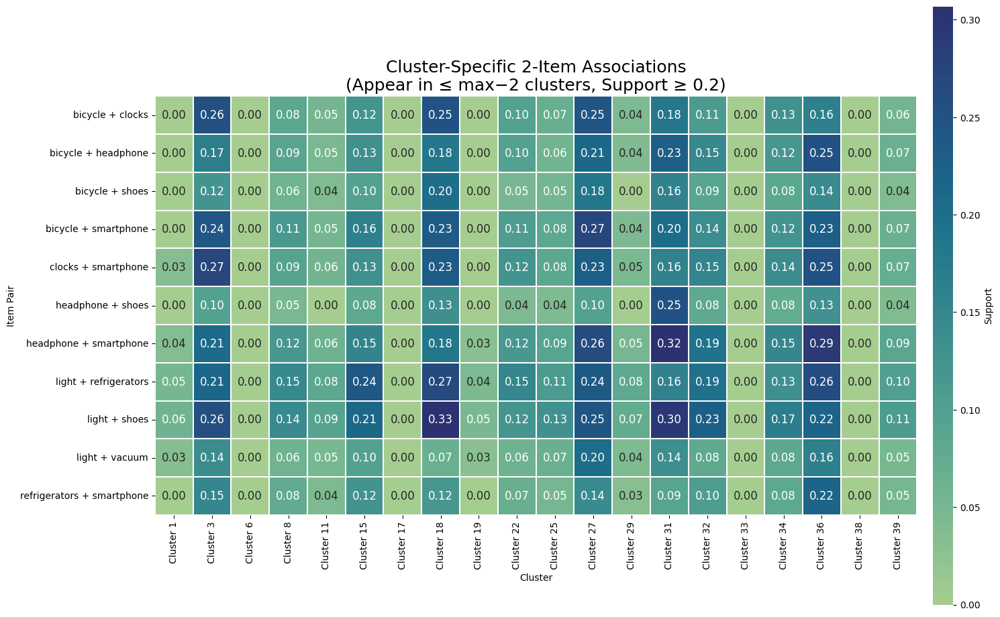

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from collections import defaultdict

# ------------------------------------------------------------
# 1. Helper: format frozenset nicely
# ------------------------------------------------------------
def format_itemset(fs):
    return " + ".join(sorted(fs))


# ------------------------------------------------------------
# 2. Collect cluster presence + max support for 2-item itemsets
# ------------------------------------------------------------
itemset_clusters = defaultdict(set)
itemset_max_support = defaultdict(float)

for cluster_id, df in frequent_itemsets.items():
    if df.empty:
        continue

    # Only 2-item itemsets
    freq2 = df[df["itemsets"].apply(len) == 2]

    for _, row in freq2.iterrows():
        fs = row["itemsets"]
        sup = row["support"]

        itemset_clusters[fs].add(cluster_id)
        itemset_max_support[fs] = max(itemset_max_support[fs], sup)


# ------------------------------------------------------------
# 3. Compute MAX observed cluster occurrence (key difference)
# ------------------------------------------------------------
max_cluster_occurrence = max(
    len(cluster_ids)
    for cluster_ids in itemset_clusters.values()
)

print(f"Max cluster occurrence among 2-item itemsets: {max_cluster_occurrence}")


# ------------------------------------------------------------
# 4. Select itemsets:
#    - appear in at most (max - 2) clusters
#    - AND support >= 0.25 in at least one cluster
# ------------------------------------------------------------
MIN_SUPPORT = 0.20

allowed_itemsets = {
    fs
    for fs in itemset_clusters
    if len(itemset_clusters[fs]) <= (max_cluster_occurrence - 2)
    and itemset_max_support[fs] >= MIN_SUPPORT
}

print(f"Itemsets kept after filtering: {len(allowed_itemsets)}")


# ------------------------------------------------------------
# 5. Build heatmap DataFrame
# ------------------------------------------------------------
pair_labels = {fs: format_itemset(fs) for fs in allowed_itemsets}
pairs_sorted = sorted(allowed_itemsets, key=lambda x: pair_labels[x])

heatmap_df = pd.DataFrame(
    index=[pair_labels[p] for p in pairs_sorted]
)

for i in range(45):
    if i not in frequent_itemsets or frequent_itemsets[i].empty:
        continue

    df = frequent_itemsets[i]
    freq2 = df[df["itemsets"].apply(len) == 2]

    # Keep only selected itemsets
    freq2 = freq2[freq2["itemsets"].isin(allowed_itemsets)]

    heatmap_df[f"Cluster {i}"] = (
        freq2
        .assign(label=freq2["itemsets"].map(pair_labels))
        .set_index("label")["support"]
    )

# Fill missing with 0 (itemset absent in cluster)
heatmap_df = heatmap_df.fillna(0)


# ------------------------------------------------------------
# 6. Plot heatmap
# ------------------------------------------------------------
plt.figure(figsize=(15, 25))

ax = sns.heatmap(
    heatmap_df,
    cmap="crest",
    linewidths=0.05,
    linecolor="white",
    square=True,
    vmax=heatmap_df.quantile(0.95).max(),

    # 🔹 Cell annotations
    annot=True,
    fmt=".2f",                 # two decimal places
    annot_kws={"size": 12},     # control text size

    # 🔹 Colorbar (legend) styling
    cbar_kws={
        "fraction": 0.025,
        "pad": 0.02,
        "aspect": 30,
        "label": "Support"
    }
)

plt.title(
    "Cluster-Specific 2-Item Associations\n"
    "(Appear in ≤ max−2 clusters, Support ≥ 0.2)",
    fontsize=18
)
plt.xlabel("Cluster")
plt.ylabel("Item Pair")

# Optional: make colorbar tick labels smaller
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=10)

plt.tight_layout()
plt.show()

Max cluster occurrence among 2-item itemsets: 18
Itemsets kept after filtering: 9


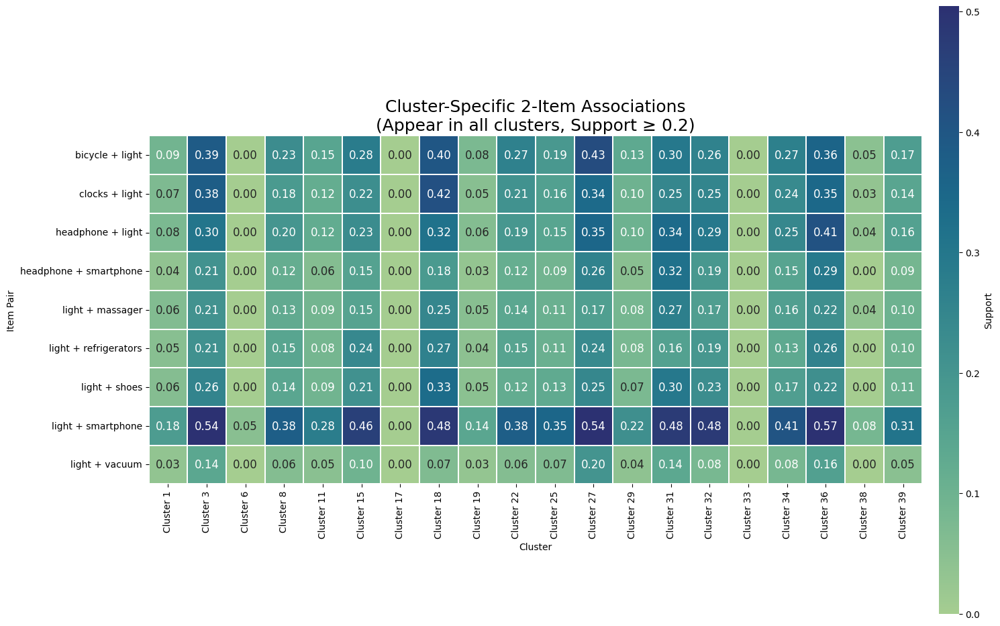

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from collections import defaultdict

# ------------------------------------------------------------
# 1. Helper: format frozenset nicely
# ------------------------------------------------------------
def format_itemset(fs):
    return " + ".join(sorted(fs))


# ------------------------------------------------------------
# 2. Collect cluster presence + max support for 2-item itemsets
# ------------------------------------------------------------
itemset_clusters = defaultdict(set)
itemset_max_support = defaultdict(float)

for cluster_id, df in frequent_itemsets.items():
    if df.empty:
        continue

    # Only 2-item itemsets
    freq2 = df[df["itemsets"].apply(len) == 2]

    for _, row in freq2.iterrows():
        fs = row["itemsets"]
        sup = row["support"]

        itemset_clusters[fs].add(cluster_id)
        itemset_max_support[fs] = max(itemset_max_support[fs], sup)


# ------------------------------------------------------------
# 3. Compute MAX observed cluster occurrence (key difference)
# ------------------------------------------------------------
max_cluster_occurrence = max(
    len(cluster_ids)
    for cluster_ids in itemset_clusters.values()
)

print(f"Max cluster occurrence among 2-item itemsets: {max_cluster_occurrence}")


# ------------------------------------------------------------
# 4. Select itemsets:
#    - appear in at most (max - 2) clusters
#    - AND support >= 0.25 in at least one cluster
# ------------------------------------------------------------
MIN_SUPPORT = 0.20

allowed_itemsets = {
    fs
    for fs in itemset_clusters
    if len(itemset_clusters[fs]) >= (max_cluster_occurrence - 2)
    and itemset_max_support[fs] >= MIN_SUPPORT
}

print(f"Itemsets kept after filtering: {len(allowed_itemsets)}")


# ------------------------------------------------------------
# 5. Build heatmap DataFrame
# ------------------------------------------------------------
pair_labels = {fs: format_itemset(fs) for fs in allowed_itemsets}
pairs_sorted = sorted(allowed_itemsets, key=lambda x: pair_labels[x])

heatmap_df = pd.DataFrame(
    index=[pair_labels[p] for p in pairs_sorted]
)

for i in range(45):
    if i not in frequent_itemsets or frequent_itemsets[i].empty:
        continue

    df = frequent_itemsets[i]
    freq2 = df[df["itemsets"].apply(len) == 2]

    # Keep only selected itemsets
    freq2 = freq2[freq2["itemsets"].isin(allowed_itemsets)]

    heatmap_df[f"Cluster {i}"] = (
        freq2
        .assign(label=freq2["itemsets"].map(pair_labels))
        .set_index("label")["support"]
    )

# Fill missing with 0 (itemset absent in cluster)
heatmap_df = heatmap_df.fillna(0)


# ------------------------------------------------------------
# 6. Plot heatmap
# ------------------------------------------------------------
plt.figure(figsize=(15, 25))

ax = sns.heatmap(
    heatmap_df,
    cmap="crest",
    linewidths=0.05,
    linecolor="white",
    square=True,
    vmax=heatmap_df.quantile(0.95).max(),

    # 🔹 Cell annotations
    annot=True,
    fmt=".2f",
    annot_kws={"size": 12},

    # 🔹 Colorbar (legend) styling
    cbar_kws={
        "fraction": 0.025,
        "pad": 0.02,
        "aspect": 30,
        "label": "Support"
    }
)

plt.title(
    "Cluster-Specific 2-Item Associations\n"
    "(Appear in all clusters, Support ≥ 0.2)",
    fontsize=18
)
plt.xlabel("Cluster")
plt.ylabel("Item Pair")

# Optional: make colorbar tick labels smaller
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=10)

plt.tight_layout()
plt.show()


In [ ]:
rules_dict = {}

for label, itemset_df in frequent_itemsets.items():

    # --- skip clusters with no frequent itemsets ---
    if itemset_df.empty:
        rules_dict[label] = itemset_df
        continue

    # --- association rules ---
    try:
        rules = association_rules(
            itemset_df,
            metric="lift",
            min_threshold=1.0
        )
    except ValueError:
        # ignore if itemset size is less than 2
        rules = pd.DataFrame()

    rules_dict[label] = rules

In [ ]:
skipped = 0

for i in range(44):

    # Skip if cluster missing or rules table empty
    if i not in rules_dict or rules_dict[i].empty:
        skipped += 1
        continue

    rules = rules_dict[i]

    # Filter rules with antecedent size 2
    rules_size2 = rules[rules["antecedents"].apply(lambda x: len(x) == 2)]

    # Skip if no matching rules
    if rules_size2.empty:
        skipped += 1
        continue

    print(f"Cluster {i}")
    display(
        rules_size2
        .sort_values("lift", ascending=False)
        .head(20)
    )

print(f"\nTotal clusters skipped: {skipped}")

Cluster 3


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
2296,"(toys, clocks)","(blender, bicycle, light)",0.041379,0.048276,0.034483,0.833333,17.261905,1.0,0.032485,5.710345,0.982734,0.625000,0.824879,0.773810
1196,"(blender, bicycle)","(toys, clocks)",0.048276,0.041379,0.034483,0.714286,17.261905,1.0,0.032485,3.355172,0.989855,0.625000,0.701953,0.773810
2304,"(blender, bicycle)","(toys, clocks, light)",0.048276,0.041379,0.034483,0.714286,17.261905,1.0,0.032485,3.355172,0.989855,0.625000,0.701953,0.773810
1197,"(toys, clocks)","(blender, bicycle)",0.041379,0.048276,0.034483,0.833333,17.261905,1.0,0.032485,5.710345,0.982734,0.625000,0.824879,0.773810
2301,"(blender, light)","(toys, bicycle, clocks)",0.062069,0.041379,0.034483,0.555556,13.425926,1.0,0.031914,2.156897,0.986765,0.500000,0.536371,0.694444
1781,"(toys, clocks)","(blender, light)",0.041379,0.062069,0.034483,0.833333,13.425926,1.0,0.031914,5.627586,0.965468,0.500000,0.822304,0.694444
1780,"(blender, light)","(toys, clocks)",0.062069,0.041379,0.034483,0.555556,13.425926,1.0,0.031914,2.156897,0.986765,0.500000,0.536371,0.694444
566,"(toys, clocks)",(blender),0.041379,0.068966,0.034483,0.833333,12.083333,1.0,0.031629,5.586207,0.956835,0.454545,0.820988,0.666667
782,"(coffee_grinder, faucet)",(printer),0.034483,0.096552,0.034483,1.000000,10.357143,1.0,0.031153,inf,0.935714,0.357143,1.000000,0.678571
2053,"(light, printer)","(coffee_grinder, faucet)",0.096552,0.034483,0.034483,0.357143,10.357143,1.0,0.031153,1.501916,1.000000,0.357143,0.334184,0.678571


Cluster 8


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
178,"(light, massager)",(washer),0.126967,0.078699,0.031480,0.247934,3.150413,1.0,0.021487,1.225027,0.781851,0.180723,0.183691,0.323967
176,"(washer, light)",(massager),0.072403,0.140609,0.031480,0.434783,3.092148,1.0,0.021299,1.520462,0.729412,0.173410,0.342305,0.329332
148,"(notebook, light)",(headphone),0.053515,0.245540,0.030430,0.568627,2.315820,1.0,0.017290,1.748975,0.600313,0.113281,0.428236,0.346280
149,"(light, headphone)",(notebook),0.199370,0.069255,0.030430,0.152632,2.203907,1.0,0.016623,1.098395,0.682289,0.127753,0.089580,0.296013
169,"(light, massager)",(shoes),0.126967,0.152151,0.041973,0.330579,2.172699,1.0,0.022654,1.266540,0.618239,0.176991,0.210447,0.303220
168,"(light, shoes)",(massager),0.143757,0.140609,0.041973,0.291971,2.076479,1.0,0.021759,1.213780,0.605453,0.173160,0.176127,0.295239
220,"(bicycle, smartphone)","(light, headphone)",0.113326,0.199370,0.046170,0.407407,2.043470,1.0,0.023576,1.351062,0.575901,0.173228,0.259842,0.319493
225,"(light, headphone)","(bicycle, smartphone)",0.199370,0.113326,0.046170,0.231579,2.043470,1.0,0.023576,1.153890,0.637793,0.173228,0.133367,0.319493
164,"(light, massager)",(refrigerators),0.126967,0.157398,0.038825,0.305785,1.942755,1.0,0.018840,1.213749,0.555841,0.158120,0.176106,0.276226
162,"(refrigerators, light)",(massager),0.145855,0.140609,0.038825,0.266187,1.893106,1.0,0.018316,1.171131,0.552328,0.156780,0.146125,0.271153


Cluster 11


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
31,"(clocks, light)",(bicycle),0.120000,0.166909,0.044000,0.366667,2.196805,1.0,0.023971,1.315407,0.619083,0.181138,0.239779,0.315142
44,"(light, shoes)",(bicycle),0.093455,0.166909,0.033455,0.357977,2.144740,1.0,0.017856,1.297602,0.588766,0.147436,0.229348,0.279206
42,"(bicycle, light)",(shoes),0.146545,0.113818,0.033455,0.228288,2.005724,1.0,0.016775,1.148332,0.587526,0.147436,0.129172,0.261109
32,"(bicycle, light)",(clocks),0.146545,0.149818,0.044000,0.300248,2.004083,1.0,0.022045,1.214976,0.587048,0.174352,0.176939,0.296969
38,"(light, headphone)",(bicycle),0.123273,0.166909,0.038545,0.312684,1.873381,1.0,0.017970,1.212094,0.531757,0.153179,0.174981,0.271811
53,"(light, headphone)",(clocks),0.123273,0.149818,0.030182,0.244838,1.634233,1.0,0.011713,1.125827,0.442660,0.124251,0.111764,0.223147
36,"(bicycle, light)",(headphone),0.146545,0.166545,0.038545,0.263027,1.579312,1.0,0.014139,1.130916,0.429798,0.140397,0.115761,0.247234
52,"(clocks, light)",(headphone),0.120000,0.166545,0.030182,0.251515,1.510189,1.0,0.010196,1.113522,0.383899,0.117730,0.101949,0.216369
58,"(light, smartphone)",(refrigerators),0.279636,0.108000,0.036364,0.130039,1.204065,1.0,0.006163,1.025333,0.235270,0.103520,0.024707,0.233370
48,"(bicycle, smartphone)",(light),0.052000,0.800364,0.046909,0.902098,1.127110,1.0,0.005290,2.039143,0.118961,0.058239,0.509598,0.480354


Cluster 15


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
375,"(light, ski)",(faucet),0.056548,0.083333,0.032738,0.578947,6.947368,1.0,0.028026,2.177083,0.907370,0.305556,0.540670,0.485902
374,"(faucet, light)",(ski),0.077381,0.062500,0.032738,0.423077,6.769231,1.0,0.027902,1.625000,0.923754,0.305556,0.384615,0.473443
331,"(coffee_grinder, light)",(faucet),0.077381,0.083333,0.035714,0.461538,5.538462,1.0,0.029266,1.702381,0.888172,0.285714,0.412587,0.445055
362,"(faucet, light)",(printer),0.077381,0.086310,0.035714,0.461538,5.347480,1.0,0.029036,1.696854,0.881183,0.279070,0.410674,0.437666
364,"(light, printer)",(faucet),0.080357,0.083333,0.035714,0.444444,5.333333,1.0,0.029018,1.650000,0.883495,0.279070,0.393939,0.436508
332,"(faucet, light)",(coffee_grinder),0.077381,0.089286,0.035714,0.461538,5.169231,1.0,0.028805,1.691327,0.874194,0.272727,0.408748,0.430769
336,"(coffee_grinder, light)",(printer),0.077381,0.086310,0.032738,0.423077,4.901857,1.0,0.026059,1.583730,0.862757,0.250000,0.368579,0.401194
338,"(light, printer)",(coffee_grinder),0.080357,0.089286,0.032738,0.407407,4.562963,1.0,0.025563,1.536830,0.849073,0.239130,0.349310,0.387037
256,"(light, vacuum)",(blanket),0.098214,0.086310,0.035714,0.363636,4.213166,1.0,0.027237,1.435799,0.845710,0.240000,0.303524,0.388715
254,"(blanket, light)",(vacuum),0.077381,0.116071,0.035714,0.461538,3.976331,1.0,0.026733,1.641582,0.811290,0.226415,0.390831,0.384615


Cluster 18


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
762285,"(clocks, table)","(light, headphone, notebook, ski, massager, slipons, blanket, bicycle, air_conditioner, refrigerators)",0.033333,0.033333,0.033333,1.0,30.0,1.0,0.032222,inf,1.0,1.0,1.0,1.0
762306,"(refrigerators, air_conditioner)","(light, headphone, notebook, ski, table, massager, slipons, blanket, bicycle, clocks)",0.033333,0.033333,0.033333,1.0,30.0,1.0,0.032222,inf,1.0,1.0,1.0,1.0
762290,"(air_conditioner, massager)","(light, headphone, notebook, ski, table, slipons, blanket, bicycle, clocks, refrigerators)",0.033333,0.033333,0.033333,1.0,30.0,1.0,0.032222,inf,1.0,1.0,1.0,1.0
762305,"(clocks, air_conditioner)","(light, headphone, notebook, ski, table, massager, slipons, blanket, bicycle, refrigerators)",0.033333,0.033333,0.033333,1.0,30.0,1.0,0.032222,inf,1.0,1.0,1.0,1.0
762295,"(slipons, air_conditioner)","(light, headphone, notebook, ski, table, massager, blanket, bicycle, clocks, refrigerators)",0.033333,0.033333,0.033333,1.0,30.0,1.0,0.032222,inf,1.0,1.0,1.0,1.0
762302,"(bicycle, air_conditioner)","(light, headphone, notebook, ski, table, massager, slipons, blanket, clocks, refrigerators)",0.033333,0.033333,0.033333,1.0,30.0,1.0,0.032222,inf,1.0,1.0,1.0,1.0
186249,"(blanket, ski)","(notebook, refrigerators, headphone, massager)",0.033333,0.033333,0.033333,1.0,30.0,1.0,0.032222,inf,1.0,1.0,1.0,1.0
762260,"(air_conditioner, headphone)","(light, notebook, ski, table, massager, slipons, blanket, bicycle, clocks, refrigerators)",0.033333,0.033333,0.033333,1.0,30.0,1.0,0.032222,inf,1.0,1.0,1.0,1.0
762263,"(notebook, ski)","(light, headphone, table, massager, slipons, blanket, bicycle, air_conditioner, clocks, refrigerators)",0.033333,0.033333,0.033333,1.0,30.0,1.0,0.032222,inf,1.0,1.0,1.0,1.0
762264,"(notebook, table)","(light, headphone, ski, massager, slipons, blanket, bicycle, air_conditioner, clocks, refrigerators)",0.033333,0.033333,0.033333,1.0,30.0,1.0,0.032222,inf,1.0,1.0,1.0,1.0


Cluster 22


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
200,"(light, massager)",(washer),0.139430,0.091454,0.034483,0.247312,2.704213,1.0,0.021731,1.207068,0.732313,0.175573,0.171546,0.312181
198,"(washer, light)",(massager),0.082459,0.158921,0.034483,0.418182,2.631389,1.0,0.021378,1.445605,0.675689,0.166667,0.308248,0.317581
238,"(bicycle, clocks)","(light, headphone)",0.097451,0.194903,0.040480,0.415385,2.131243,1.0,0.021486,1.377140,0.588101,0.160714,0.273858,0.311538
243,"(light, headphone)","(bicycle, clocks)",0.194903,0.097451,0.040480,0.207692,2.131243,1.0,0.021486,1.139139,0.659287,0.160714,0.122144,0.311538
80,"(bicycle, clocks)",(headphone),0.097451,0.233883,0.046477,0.476923,2.039152,1.0,0.023685,1.464635,0.564623,0.163158,0.317236,0.337821
266,"(light, headphone)","(bicycle, smartphone)",0.194903,0.106447,0.041979,0.215385,2.023402,1.0,0.021232,1.138842,0.628226,0.161850,0.121915,0.304875
261,"(bicycle, smartphone)","(light, headphone)",0.106447,0.194903,0.041979,0.394366,2.023402,1.0,0.021232,1.329347,0.566035,0.161850,0.247751,0.304875
239,"(clocks, light)","(bicycle, headphone)",0.209895,0.097451,0.040480,0.192857,1.979011,1.0,0.020025,1.118202,0.626116,0.151685,0.105707,0.304121
242,"(bicycle, headphone)","(clocks, light)",0.097451,0.209895,0.040480,0.415385,1.979011,1.0,0.020025,1.351495,0.548111,0.151685,0.260079,0.304121
81,"(clocks, headphone)",(bicycle),0.083958,0.280360,0.046477,0.553571,1.974503,1.0,0.022938,1.611994,0.538778,0.146226,0.379650,0.359673


Cluster 25


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
114,"(bicycle, smartphone)","(light, headphone)",0.083144,0.145881,0.030234,0.363636,2.492699,1.0,0.018105,1.342188,0.653133,0.152091,0.254948,0.285445
119,"(light, headphone)","(bicycle, smartphone)",0.145881,0.083144,0.030234,0.207254,2.492699,1.0,0.018105,1.156556,0.701106,0.152091,0.135364,0.285445
54,"(bicycle, smartphone)",(headphone),0.083144,0.189720,0.034769,0.418182,2.204201,1.0,0.018995,1.392668,0.595864,0.146032,0.281954,0.300724
96,"(refrigerators, light)",(shoes),0.108088,0.142101,0.030234,0.279720,1.968457,1.0,0.014875,1.191063,0.551610,0.137457,0.160414,0.246243
43,"(clocks, light)",(bicycle),0.163265,0.201814,0.063492,0.388889,1.926966,1.0,0.030543,1.306122,0.574913,0.210526,0.234375,0.351748
62,"(light, shoes)",(bicycle),0.130008,0.201814,0.049887,0.383721,1.901359,1.0,0.023649,1.295170,0.544902,0.176944,0.227900,0.315456
55,"(headphone, smartphone)",(bicycle),0.091459,0.201814,0.034769,0.380165,1.883740,1.0,0.016312,1.287740,0.516368,0.134503,0.223446,0.276225
60,"(bicycle, light)",(shoes),0.187453,0.142101,0.049887,0.266129,1.872812,1.0,0.023249,1.169005,0.573559,0.178378,0.144572,0.308596
44,"(bicycle, light)",(clocks),0.187453,0.183673,0.063492,0.338710,1.844086,1.0,0.029062,1.234445,0.563322,0.206388,0.189919,0.342194
116,"(headphone, smartphone)","(bicycle, light)",0.091459,0.187453,0.030234,0.330579,1.763530,1.0,0.013090,1.213805,0.476539,0.121581,0.176145,0.245934


Cluster 27


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
11604,"(coffee_grinder, headphone)","(faucet, ski, vacuum)",0.043860,0.035088,0.035088,0.800000,22.8,1.0,0.033549,4.824561,1.000000,0.800000,0.792727,0.900000
11725,"(coffee_grinder, headphone)","(light, vacuum, ski)",0.043860,0.035088,0.035088,0.800000,22.8,1.0,0.033549,4.824561,1.000000,0.800000,0.792727,0.900000
11612,"(faucet, ski)","(coffee_grinder, headphone, vacuum)",0.043860,0.035088,0.035088,0.800000,22.8,1.0,0.033549,4.824561,1.000000,0.800000,0.792727,0.900000
15367,"(faucet, ski)","(vacuum, coffee_grinder, light, headphone)",0.043860,0.035088,0.035088,0.800000,22.8,1.0,0.033549,4.824561,1.000000,0.800000,0.792727,0.900000
15354,"(coffee_grinder, headphone)","(faucet, light, vacuum, ski)",0.043860,0.035088,0.035088,0.800000,22.8,1.0,0.033549,4.824561,1.000000,0.800000,0.792727,0.900000
5990,"(coffee_grinder, headphone)","(ski, vacuum)",0.043860,0.035088,0.035088,0.800000,22.8,1.0,0.033549,4.824561,1.000000,0.800000,0.792727,0.900000
5987,"(ski, vacuum)","(coffee_grinder, headphone)",0.035088,0.043860,0.035088,1.000000,22.8,1.0,0.033549,inf,0.990909,0.800000,1.000000,0.900000
11609,"(ski, vacuum)","(coffee_grinder, faucet, headphone)",0.035088,0.043860,0.035088,1.000000,22.8,1.0,0.033549,inf,0.990909,0.800000,1.000000,0.900000
11731,"(ski, vacuum)","(coffee_grinder, light, headphone)",0.035088,0.043860,0.035088,1.000000,22.8,1.0,0.033549,inf,0.990909,0.800000,1.000000,0.900000
15366,"(ski, vacuum)","(coffee_grinder, faucet, light, headphone)",0.035088,0.043860,0.035088,1.000000,22.8,1.0,0.033549,inf,0.990909,0.800000,1.000000,0.900000


Cluster 29


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
13,"(clocks, light)",(bicycle),0.098804,0.155981,0.033971,0.343826,2.204281,1.0,0.018560,1.286273,0.606236,0.153846,0.222560,0.280809
20,"(light, headphone)",(bicycle),0.101675,0.155981,0.032775,0.322353,2.066619,1.0,0.016916,1.245514,0.574533,0.145745,0.197119,0.266238
14,"(bicycle, light)",(clocks),0.133493,0.131579,0.033971,0.254480,1.934050,1.0,0.016406,1.164853,0.557353,0.146998,0.141523,0.256331
18,"(bicycle, light)",(headphone),0.133493,0.148565,0.032775,0.245520,1.652613,1.0,0.012943,1.128506,0.455735,0.131478,0.113873,0.233066
24,"(bicycle, smartphone)",(light),0.042584,0.768182,0.035646,0.837079,1.089688,1.0,0.002934,1.422884,0.085967,0.045988,0.297202,0.441741
25,"(light, smartphone)",(bicycle),0.217943,0.155981,0.035646,0.163557,1.048568,1.0,0.001651,1.009057,0.059226,0.105375,0.008976,0.196042
12,"(bicycle, clocks)",(light),0.042584,0.768182,0.033971,0.797753,1.038495,1.0,0.001259,1.146212,0.038717,0.043733,0.127561,0.420988
28,"(light, smartphone)",(headphone),0.217943,0.148565,0.033493,0.153677,1.034414,1.0,0.001114,1.006041,0.042540,0.100575,0.006005,0.189560
19,"(bicycle, headphone)",(light),0.041866,0.768182,0.032775,0.782857,1.019104,1.0,0.000614,1.067584,0.019565,0.042167,0.063305,0.412761


Cluster 31


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
336,"(bag, bicycle)",(costume),0.045455,0.045455,0.045455,1.0,22.0,1.0,0.043388,inf,1.0,1.0,1.0,1.0
3138,"(juicer, massager)","(blender, bicycle)",0.045455,0.045455,0.045455,1.0,22.0,1.0,0.043388,inf,1.0,1.0,1.0,1.0
3143,"(blender, bicycle)","(juicer, massager)",0.045455,0.045455,0.045455,1.0,22.0,1.0,0.043388,inf,1.0,1.0,1.0,1.0
3335,"(costume, clocks)","(bicycle, mixer)",0.045455,0.045455,0.045455,1.0,22.0,1.0,0.043388,inf,1.0,1.0,1.0,1.0
3336,"(clocks, mixer)","(costume, bicycle)",0.045455,0.045455,0.045455,1.0,22.0,1.0,0.043388,inf,1.0,1.0,1.0,1.0
3337,"(costume, bicycle)","(clocks, mixer)",0.045455,0.045455,0.045455,1.0,22.0,1.0,0.043388,inf,1.0,1.0,1.0,1.0
3338,"(bicycle, mixer)","(costume, clocks)",0.045455,0.045455,0.045455,1.0,22.0,1.0,0.043388,inf,1.0,1.0,1.0,1.0
3808,"(bicycle, mixer)","(costume, light)",0.045455,0.045455,0.045455,1.0,22.0,1.0,0.043388,inf,1.0,1.0,1.0,1.0
3810,"(light, mixer)","(costume, bicycle)",0.045455,0.045455,0.045455,1.0,22.0,1.0,0.043388,inf,1.0,1.0,1.0,1.0
398,"(costume, light)",(bag),0.045455,0.045455,0.045455,1.0,22.0,1.0,0.043388,inf,1.0,1.0,1.0,1.0


Cluster 32


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
314,"(light, printer)",(coffee_grinder),0.076613,0.068548,0.036290,0.473684,6.910217,1.0,0.031039,1.769758,0.926249,0.333333,0.434951,0.501548
312,"(coffee_grinder, light)",(printer),0.068548,0.080645,0.036290,0.529412,6.564706,1.0,0.030762,1.953629,0.910053,0.321429,0.488132,0.489706
330,"(light, printer)",(faucet),0.076613,0.076613,0.032258,0.421053,5.495845,1.0,0.026389,1.594941,0.885917,0.266667,0.373018,0.421053
328,"(faucet, light)",(printer),0.076613,0.080645,0.032258,0.421053,5.221053,1.0,0.026080,1.587977,0.875546,0.258065,0.370268,0.410526
242,"(blanket, light)",(slipons),0.076613,0.104839,0.032258,0.421053,4.016194,1.0,0.024226,1.546188,0.813319,0.216216,0.353248,0.364372
241,"(slipons, light)",(blanket),0.100806,0.084677,0.032258,0.320000,3.779048,1.0,0.023722,1.346063,0.817825,0.210526,0.257093,0.350476
506,"(smartphone, massager)",(vacuum),0.096774,0.092742,0.032258,0.333333,3.594203,1.0,0.023283,1.360887,0.799107,0.205128,0.265185,0.340580
504,"(smartphone, vacuum)",(massager),0.060484,0.189516,0.032258,0.533333,2.814184,1.0,0.020795,1.736751,0.686159,0.148148,0.424212,0.351773
596,"(bicycle, massager)","(light, shoes)",0.064516,0.225806,0.040323,0.625000,2.767857,1.0,0.025754,2.064516,0.682759,0.161290,0.515625,0.401786
597,"(light, shoes)","(bicycle, massager)",0.225806,0.064516,0.040323,0.178571,2.767857,1.0,0.025754,1.138850,0.825000,0.161290,0.121921,0.401786


Cluster 34


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
297,"(faucet, light)",(coffee_grinder),0.058190,0.073276,0.030172,0.518519,7.076253,1.0,0.025909,1.924735,0.911736,0.297872,0.480448,0.465142
296,"(coffee_grinder, light)",(faucet),0.066810,0.064655,0.030172,0.451613,6.984946,1.0,0.025853,1.705629,0.918179,0.297872,0.413706,0.459140
301,"(light, printer)",(coffee_grinder),0.092672,0.073276,0.032328,0.348837,4.760602,1.0,0.025537,1.423183,0.870625,0.241935,0.297350,0.395007
300,"(coffee_grinder, light)",(printer),0.066810,0.105603,0.032328,0.483871,4.581962,1.0,0.025272,1.732893,0.837721,0.230769,0.422930,0.394997
622,"(bicycle, smartphone)","(clocks, light, headphone)",0.125000,0.081897,0.034483,0.275862,3.368421,1.0,0.024246,1.267857,0.803571,0.200000,0.211268,0.348457
459,"(bicycle, smartphone)","(clocks, headphone)",0.125000,0.099138,0.038793,0.310345,3.130435,1.0,0.026401,1.306250,0.777778,0.209302,0.234450,0.350825
462,"(clocks, headphone)","(bicycle, smartphone)",0.099138,0.125000,0.038793,0.391304,3.130435,1.0,0.026401,1.437500,0.755449,0.209302,0.304348,0.350825
580,"(headphone, smartphone)","(notebook, light)",0.150862,0.081897,0.036638,0.242857,2.965414,1.0,0.024283,1.212589,0.780532,0.186813,0.175319,0.345113
577,"(notebook, light)","(headphone, smartphone)",0.081897,0.150862,0.036638,0.447368,2.965414,1.0,0.024283,1.536535,0.721900,0.186813,0.349185,0.345113
420,"(refrigerators, light)",(washer),0.133621,0.081897,0.032328,0.241935,2.954160,1.0,0.021385,1.211115,0.763516,0.176471,0.174315,0.318336


Cluster 36


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
17958,"(cooler, massager)","(blanket, clocks, costume, scarf)",0.032609,0.032609,0.032609,1.0,30.666667,1.0,0.031545,inf,1.0,1.0,1.0,1.0
17956,"(blanket, scarf)","(clocks, costume, cooler, massager)",0.032609,0.032609,0.032609,1.0,30.666667,1.0,0.031545,inf,1.0,1.0,1.0,1.0
8580,"(scarf, vacuum)","(cooler, massager)",0.032609,0.032609,0.032609,1.0,30.666667,1.0,0.031545,inf,1.0,1.0,1.0,1.0
8585,"(cooler, massager)","(scarf, vacuum)",0.032609,0.032609,0.032609,1.0,30.666667,1.0,0.031545,inf,1.0,1.0,1.0,1.0
13616,"(telephone, printer)","(slipons, bicycle, vacuum)",0.032609,0.032609,0.032609,1.0,30.666667,1.0,0.031545,inf,1.0,1.0,1.0,1.0
13617,"(slipons, telephone)","(bicycle, vacuum, printer)",0.032609,0.032609,0.032609,1.0,30.666667,1.0,0.031545,inf,1.0,1.0,1.0,1.0
13620,"(slipons, vacuum)","(telephone, bicycle, printer)",0.032609,0.032609,0.032609,1.0,30.666667,1.0,0.031545,inf,1.0,1.0,1.0,1.0
15733,"(costume, refrigerators)","(washer, shirt, smartphone)",0.032609,0.032609,0.032609,1.0,30.666667,1.0,0.031545,inf,1.0,1.0,1.0,1.0
15550,"(costume, refrigerators)","(smartphone, light, shirt)",0.032609,0.032609,0.032609,1.0,30.666667,1.0,0.031545,inf,1.0,1.0,1.0,1.0
8856,"(costume, refrigerators)","(shirt, smartphone)",0.032609,0.032609,0.032609,1.0,30.666667,1.0,0.031545,inf,1.0,1.0,1.0,1.0


Cluster 39


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
52,"(light, headphone)",(bicycle),0.158084,0.194645,0.058187,0.368078,1.891026,1.0,0.027417,1.274454,0.559660,0.197552,0.215350,0.333510
68,"(clocks, light)",(shoes),0.144181,0.125644,0.031926,0.221429,1.762354,1.0,0.013810,1.123026,0.505454,0.134199,0.109549,0.237763
70,"(light, shoes)",(clocks),0.107621,0.172503,0.031926,0.296651,1.719689,1.0,0.013361,1.176510,0.468970,0.128631,0.150028,0.240863
45,"(clocks, light)",(bicycle),0.144181,0.194645,0.047889,0.332143,1.706406,1.0,0.019825,1.205880,0.483716,0.164602,0.170730,0.289087
78,"(light, headphone)",(shoes),0.158084,0.125644,0.033471,0.211726,1.685134,1.0,0.013608,1.109204,0.482917,0.133745,0.098453,0.239060
50,"(bicycle, light)",(headphone),0.173532,0.205458,0.058187,0.335312,1.632018,1.0,0.022534,1.195360,0.468574,0.181380,0.163432,0.309260
58,"(light, shoes)",(bicycle),0.107621,0.194645,0.033986,0.315789,1.622389,1.0,0.013038,1.177058,0.429890,0.126679,0.150424,0.245196
46,"(bicycle, light)",(clocks),0.173532,0.172503,0.047889,0.275964,1.599770,1.0,0.017954,1.142896,0.453629,0.160622,0.125030,0.276788
56,"(bicycle, light)",(shoes),0.173532,0.125644,0.033986,0.195846,1.558739,1.0,0.012182,1.087299,0.433720,0.128155,0.080290,0.233169
76,"(light, shoes)",(headphone),0.107621,0.205458,0.033471,0.311005,1.513713,1.0,0.011359,1.153189,0.380301,0.119705,0.132839,0.236956



Total clusters skipped: 30


In [ ]:
from collections import defaultdict

# 1. Build user → cluster map
user_cluster_map = df2.set_index("user_id")["cluster"].to_dict()


# 2. Build purchased items per user

purchased_list = (
    (df2[ohe_cols] == 1)
    .apply(lambda row: row.index[row].tolist(), axis=1)
)

purchased_dict = dict(zip(df2["user_id"], purchased_list))



# 3. Build rules lookup per cluster
fast_rules = {}

for label, rules in rules_dict.items():

    if rules is None or rules.empty:
        fast_rules[label] = {}
        continue

    # keep only antecedents and consequents of length 1
    rules_1_1 = rules[
        (rules["antecedents"].apply(lambda x: isinstance(x, frozenset) and len(x) == 1)) &
        (rules["consequents"].apply(lambda x: isinstance(x, frozenset) and len(x) == 1))
    ]

    if rules_1_1.empty:
        fast_rules[label] = {}
        continue

    # extract items
    antecedents = rules_1_1["antecedents"].apply(lambda x: next(iter(x)))
    consequents = rules_1_1["consequents"].apply(lambda x: next(iter(x)))

    # collect ALL consequents per antecedent
    rule_map = defaultdict(set)
    for a, c in zip(antecedents, consequents):
        rule_map[a].add(c)

    fast_rules[label] = {a: list(cs) for a, cs in rule_map.items()}


# 4. Generate recommendations
recommended = []

for user in df2["user_id"]:
    cluster = user_cluster_map[user]
    items_bought = set(purchased_dict[user])
    rules_map = fast_rules.get(cluster, {})

    recs = set()

    # add ALL consequents for all purchased items
    for a in items_bought:
        if a in rules_map:
            recs.update(rules_map[a])

    # REMOVE items the user already purchased
    recs -= items_bought

    recommended.append(list(recs))

df2["recommended_items"] = recommended


In [ ]:
df2[(df2["smartphone"] == 1.0) & (df2["cluster"] == 22) & (df2["recommended_items"].str.len() > 0)].head(2)

,user_id,latest_date,recency,frequency,monetary_value,time,category_accessories,category_apparel,category_appliances,category_auto,category_computers,category_construction,category_country_yard,category_electronics,category_furniture,category_kids,category_medicine,category_sport,category_stationery,acoustic,air_conditioner,air_heater,alarm,anti_freeze,axe,bag,ballet_shoes,bath,bed,belt,bench,bicycle,blanket,blender,cabinet,camera,carriage,cartrige,cdrw,chair,climate,clocks,coffee_grinder,coffee_machine,compressor,cooler,costume,cpu,cultivator,desktop,diapers,dictaphone,dishwasher,diving,dolls,dress,drill,ebooks,espadrilles,fan,faucet,fryer,generator,glove,grill,hair_cutter,hammok,hdd,headphone,hob,hood,iron,ironing_board,jacket,jeans,juicer,jumper,keds,kettle,keyboard,lawn_mower,light,massager,meat_grinder,memory,microphone,microwave,mixer,moccasins,monitor,motherboard,mouse,notebook,oven,painting,pajamas,paper,parktronic,photo,piano,pillow,player,power_supply,printer,projector,pump,radar,refrigerators,sandals,saw,scales,scarf,screw,sewing_machine,shelving,shirt,shoes,shorts,skates,ski,skirt,slipons,smartphone,snowboard,sock,sofa,soldering,sound_card,steam_cooker,step_ins,subwoofer,swing,table,tablet,telephone,tennis,toilet,tonometer,toster,toys,trainer,trousers,tshirt,tv,umbrella,underwear,vacuum,video,videocards,videoregister,wallet,washer,water_heater,watering,welding,winch,cluster,recommended_items
190816,552039699,2019-10-21,105.78204,-0.079070,12036.877994,-2.572486,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,22,"[washer, coffee_grinder, headphone, sandals, notebook, tv, clocks, shoes]"
248283,553951166,2019-12-02,63.78204,0.206644,12089.447994,-2.972486,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,22,"[washer, toys, coffee_grinder, keds, printer, headphone, bag, sandals, notebook, tv, faucet, skates, massager, table, bicycle, clocks, refrigerators, shoes]"


In [ ]:
df2[df2["recommended_items"].str.len() > 0].shape

(38380, 158)